In [ ]:
!pip3 install pandas matplotlib datashader bokeh holoviews sklearn scikit-image colorcet tabulate statsmodels distfit mlxtend

In [1]:
import warnings
warnings.filterwarnings("ignore")
from xgboost import XGBClassifier
import sklearn
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import umap.plot
import umap
import pickle
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
import numpy as np
from sklearn.metrics import *

In [2]:
data=pd.read_csv("training_set.csv")
data_test=pd.read_csv('test_set.csv')

In [3]:
data=data.drop('Unnamed: 0',axis=1)
data_test=data_test.drop('Unnamed: 0',axis=1)

In [4]:
data

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X49,X50,X51,X52,X53,X54,X55,X56,X57,Y
0,0.00,0.00,4.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.000,0.0,1.342,0.000,0.000,1.200,2,12,0
1,0.00,0.56,0.56,0.00,1.12,0.56,2.25,0.00,0.00,0.56,...,0.0,0.083,0.0,0.503,0.000,0.083,16.304,148,375,1
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.000,0.0,0.000,0.000,0.000,1.000,1,5,0
3,0.64,0.00,0.64,0.00,1.93,0.00,0.00,0.00,0.00,0.00,...,0.0,0.000,0.0,0.462,0.370,0.000,2.440,22,122,1
4,0.58,0.00,0.00,35.46,0.58,0.00,0.58,0.58,0.00,0.00,...,0.0,0.000,0.0,0.239,0.239,0.000,3.338,123,207,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3905,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.000,0.0,0.000,0.000,0.000,1.714,4,12,0
3906,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.000,0.0,0.000,0.000,0.000,2.000,3,4,0
3907,0.12,0.00,0.12,0.00,0.00,0.25,0.00,0.00,0.00,0.00,...,0.0,0.093,0.0,0.023,0.000,0.000,1.247,5,131,0
3908,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.12,0.00,0.00,...,0.0,0.198,0.0,0.198,0.198,0.000,3.857,25,81,1


In [5]:
data.corr()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X49,X50,X51,X52,X53,X54,X55,X56,X57,Y
X1,1.000000,-0.026677,0.078010,0.007472,0.025377,0.060360,0.004934,0.002262,0.128300,0.038547,...,-0.026043,-0.019084,-0.042516,0.049536,0.128384,-0.009324,0.032279,0.056025,0.101600,0.129805
X2,-0.026677,1.000000,-0.030758,-0.006455,-0.020289,-0.023827,0.006748,-0.014461,0.000199,0.035494,...,-0.006349,-0.045741,-0.021728,-0.014497,-0.008293,0.001034,0.004376,0.001448,-0.021016,-0.026476
X3,0.078010,-0.030758,1.000000,-0.018648,0.065148,0.093120,0.037979,0.018314,0.098008,0.029760,...,-0.031217,-0.019428,-0.039784,0.109943,0.084654,-0.007824,0.080559,0.091124,0.067387,0.204965
X4,0.007472,-0.006455,-0.018648,1.000000,0.001837,-0.008594,0.015680,0.004700,0.000138,-0.002183,...,0.001048,-0.009132,-0.008458,-0.002776,0.008798,-0.001704,0.004715,0.020733,0.021542,0.055609
X5,0.025377,-0.020289,0.065148,0.001837,1.000000,0.065459,0.157810,0.030440,0.023903,0.038379,...,-0.030872,-0.050698,-0.026512,0.025764,0.042036,0.004088,0.048949,0.045998,0.004402,0.242400
X6,0.060360,-0.023827,0.093120,-0.008594,0.065459,1.000000,0.074811,0.095892,0.132624,0.015163,...,-0.015690,-0.004675,-0.031567,0.065323,0.104906,0.020024,-0.010804,0.083647,0.086964,0.253613
X7,0.004934,0.006748,0.037979,0.015680,0.157810,0.074811,1.000000,0.047656,0.057607,0.048401,...,-0.035855,-0.049371,-0.035751,0.044416,0.060073,0.043426,0.040228,0.053253,-0.008160,0.327233
X8,0.002262,-0.014461,0.018314,0.004700,0.030440,0.095892,0.047656,1.000000,0.097821,0.085445,...,-0.028603,-0.032195,-0.023941,0.032774,0.052817,-0.009910,0.013975,0.037654,0.046959,0.217332
X9,0.128300,0.000199,0.098008,0.000138,0.023903,0.132624,0.057607,0.097821,1.000000,0.138875,...,-0.014399,-0.030304,0.028297,0.046721,0.160436,-0.003807,0.105594,0.181932,0.276767,0.254297
X10,0.038547,0.035494,0.029760,-0.002183,0.038379,0.015163,0.048401,0.085445,0.138875,1.000000,...,0.013110,0.001187,0.012993,0.038433,0.069121,0.048458,0.068394,0.097029,0.092385,0.138245


Text(0, 0.5, 'Count')

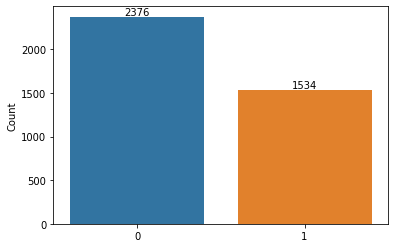

In [6]:
a=sns.barplot(y=data['Y'].value_counts(),x=[0,1])
plt.bar_label(a.containers[0])
plt.ylabel("Count")

In [7]:
Y_label=data['Y']
data_original=data.copy()
data=data.drop('Y',axis=1)
X_label=data.to_numpy()
test=data_test.to_numpy()

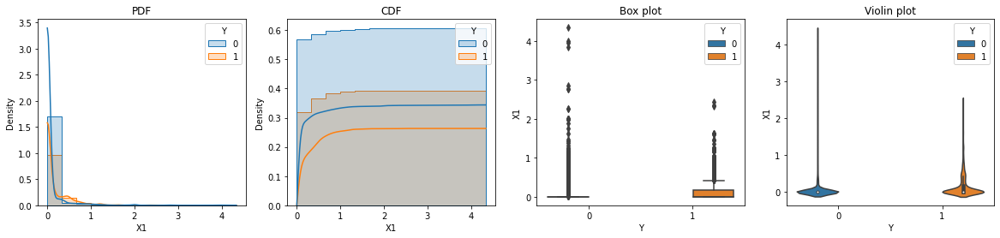

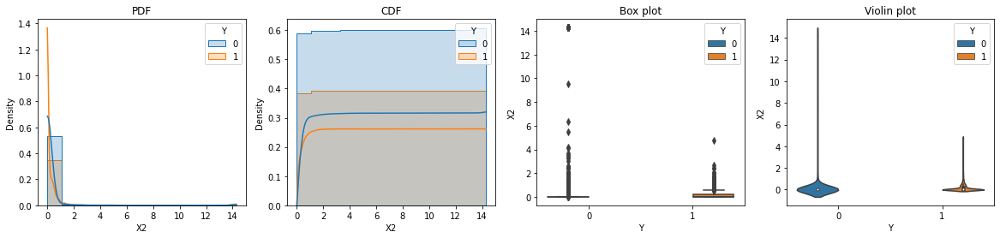

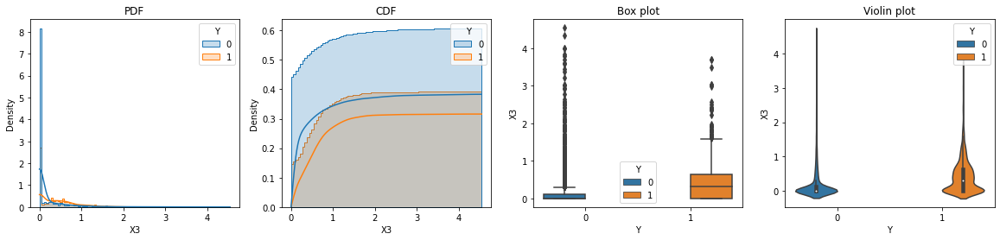

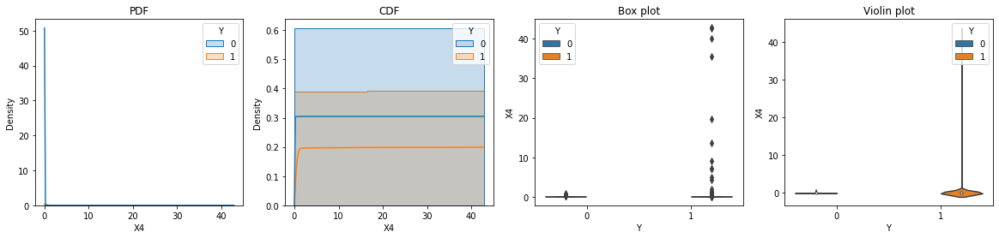

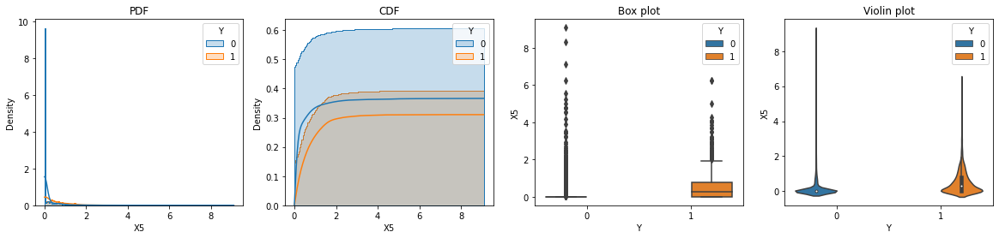

...

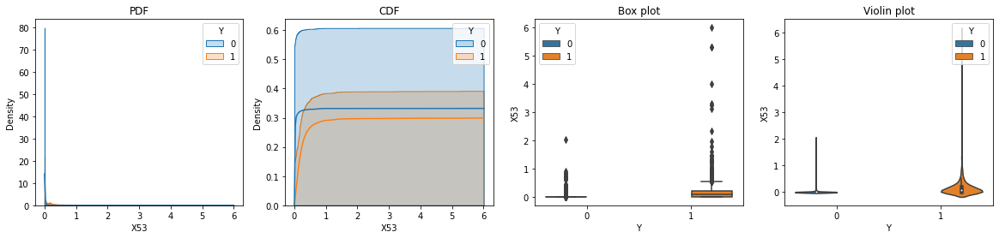

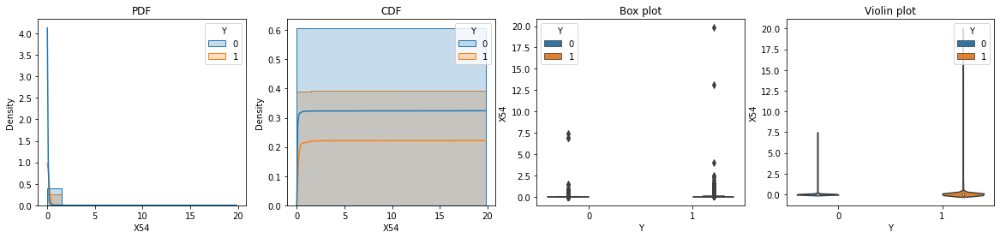

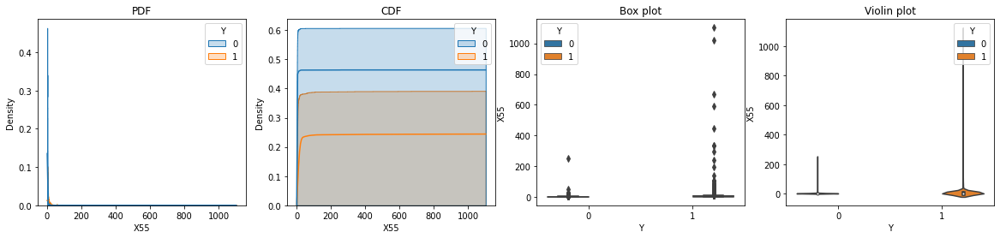

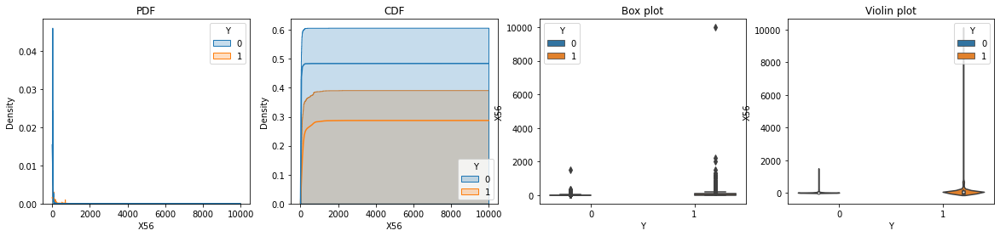

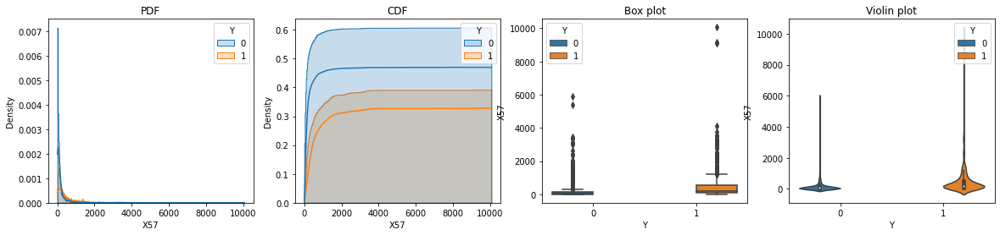

In [8]:
for i in data.columns:
    plt.figure(figsize=(20,4))
    plt.subplot(1,4,1)
    sns.histplot(data,x=i,hue=data_original['Y'],kde=True,element='step',stat='density')
    plt.title('PDF')
    plt.subplot(1,4,2)
    sns.histplot(data,x=i,hue=data_original['Y'],kde=True,element='step',cumulative=True,stat='density')
    plt.title('CDF')
    plt.subplot(1,4,3)
    sns.boxplot(x='Y',y=i,data=data_original,hue='Y')
    plt.title('Box plot')
    plt.subplot(1,4,4)
    sns.violinplot(x='Y',y=i,data=data_original,hue='Y')
    plt.title('Violin plot')
    plt.show()

### All features looks like power law distribution (approx)

In [9]:
data_original[data_original<0].dropna() #There are no negitive values in our dataset 

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X49,X50,X51,X52,X53,X54,X55,X56,X57,Y


### From the above code we can say there are no negative values in our dataset

In [181]:
data[data.isnull()].dropna()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X48,X49,X50,X51,X52,X53,X54,X55,X56,X57


### There are no missing NaN values in the dataset

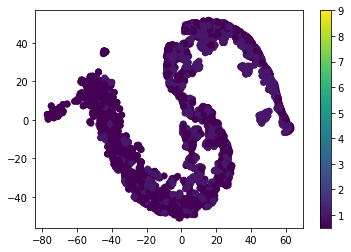

In [10]:
from sklearn.manifold import TSNE
xtsne=TSNE(perplexity=50)
results=xtsne.fit_transform(data_original.drop(['Y'], axis=1))
vis_x = results[:, 0]
vis_y = results[:, 1]
plt.scatter(vis_x, vis_y, c=data_original['Y'])
plt.colorbar(ticks=range(10))
plt.clim(0.5, 9)
plt.show()

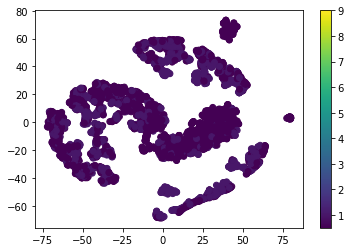

In [11]:
xtsne=TSNE(perplexity=30)
results=xtsne.fit_transform(data_original.drop(['Y'], axis=1))
vis_x = results[:, 0]
vis_y = results[:, 1]
plt.scatter(vis_x, vis_y, c=data_original['Y'])
plt.colorbar(ticks=range(10))
plt.clim(0.5, 9)
plt.show()

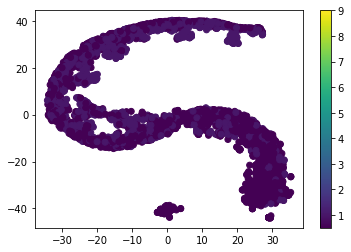

In [12]:
xtsne=TSNE(perplexity=100)
results=xtsne.fit_transform(data_original.drop(['Y'], axis=1))
vis_x = results[:, 0]
vis_y = results[:, 1]
plt.scatter(vis_x, vis_y, c=data_original['Y'])
plt.colorbar(ticks=range(10))
plt.clim(0.5, 9)
plt.show()

In [13]:
mapper = umap.UMAP().fit(data)

<AxesSubplot:>

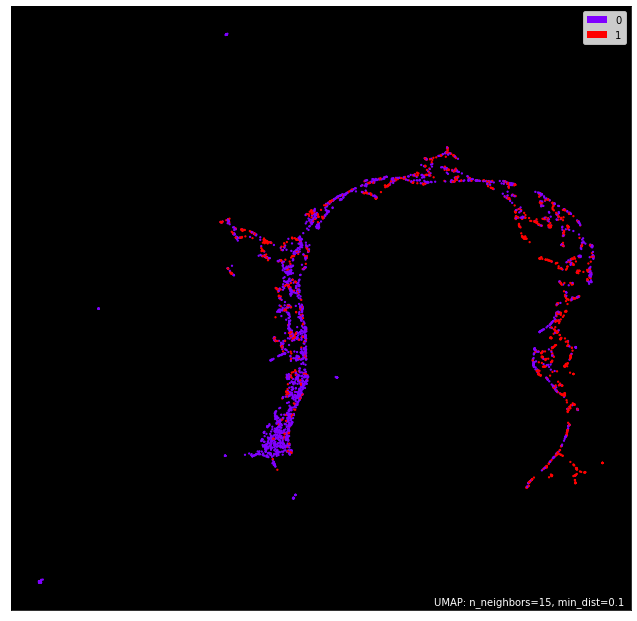

In [14]:
umap.plot.points(mapper, labels=data_original['Y'],theme='fire',color_key_cmap='Paired')

### Train test split

In [15]:
X_train, X_val, y_train, y_val = train_test_split(X_label,Y_label.to_numpy(),test_size=0.2,random_state = 42, stratify = Y_label.to_numpy())

In [16]:
def Plot_confusion_matrix(train_y,pred_y,test_y,predict_y):
    C = confusion_matrix(train_y,pred_y) 
    c1=confusion_matrix(test_y, predict_y)
    
    print("Percentage of misclassified points (Train) ",(((np.logical_not(np.eye(2))*C).sum()/C.sum())*100))
    print("Percentage of misclassified points (Test) ",(((np.logical_not(np.eye(2))*c1).sum()/c1.sum())*100))
    pmp_train=(((np.logical_not(np.eye(2))*C).sum()/C.sum())*100)
    pmp_test=(((np.logical_not(np.eye(2))*c1).sum()/c1.sum())*100)
    A =(((C.T)/(C.sum(axis=1))).T)
    A1 =(((c1.T)/(c1.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    B =(C/C.sum(axis=0))
    B1=(c1/c1.sum(axis=0))
    
    labels = [0,1]
    cmap=sns.light_palette("green")
    print("-"*50, "Confusion matrix", "-"*50)
    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix (train)")
    plt.subplot(1,2,2)
    sns.heatmap(c1, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix (test)")
    plt.show()

    print("-"*50, "Precision matrix", "-"*50)
    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Percision matrix (Train)")
    plt.subplot(1,2,2)
    sns.heatmap(B1, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Percision matrix (Test)")    
    
    plt.show()
    #print("Sum of columns in precision matrix (Train)",B.sum(axis=0))
    #print("Sum of columns in precision matrix (Test)",B1.sum(axis=0))
    
    print("-"*50, "Recall matrix"    , "-"*50)
    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix (Train)")
    plt.subplot(1,2,2)
    sns.heatmap(A1, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix (Test)")
    plt.show()
    return pmp_train,pmp_test

In [17]:
random_data_t=dict()
def generate_random_data(counts,sample_size):
    global random_data_t
    try:
        return random_data_t[f'{counts}{sample_size}']
    except:     
        firstclass_prob,secondclass_prob=counts/(counts[0]+counts[1])
        secondclass_prob+=firstclass_prob
        random_data=[]
        for i in range(sample_size): 
            r=np.random.uniform(0,1,)
            if r<=firstclass_prob:
                random_data.append(r)
            else:
                random_data.append(r)
        random_data_t[f'{counts}{sample_size}']= np.array(random_data)
        return np.array(random_data)

def performance_of_model(model,X_train,y_train,X_test,y_test):
    y_train=pd.DataFrame(y_train)
    y_test=pd.DataFrame(y_test)
    y_pred=model.predict_proba(X_train)
    y_pred_test=model.predict_proba(X_test)
    counts=y_train.value_counts()
    random_data=generate_random_data(counts,len(y_test))
    plt.figure(figsize=(7,7))
    plt.plot(list(np.arange(0,1,0.01)),list(np.arange(0,1,0.01)),'.',color='green',label=f'AUC : 0.5')

    if counts[0]>counts[1]: # if negative points are greater than positive points then AUC won't work correctly, so using TNR,FNR instead of TPR,FPR
        y_train_temp=np.logical_not(y_train)     # changing 0's to 1's and 1's to 0's (doing this is equalent to predicting auc with TNR and FNR)
        y_train_temp=y_train_temp.replace(True,1).replace(False,0)
        
        y_test_temp=np.logical_not(y_test)     # changing 0's to 1's and 1's to 0's
        y_test_temp=y_test_temp.replace(True,1).replace(False,0)
        
        random_data_temp=random_data
        tpr,fpr,threshold=roc_curve(y_train_temp,y_pred.T[0])
        tpr_test,fpr_test,threshold_test=roc_curve(y_test_temp,y_pred_test.T[0])
        tpr_random,fpr_random,threshold_random=roc_curve(y_test_temp,random_data)

        plt.plot(tpr,fpr,color='red',label=f'train auc score: {roc_auc_score(y_train_temp,y_pred.T[0])}')
        plt.plot(tpr_test,fpr_test,color='orange',label=f'test auc score: {roc_auc_score(y_test_temp,y_pred_test.T[0])}')
        auc_train=roc_auc_score(y_train_temp,y_pred.T[0])
        auc_test=roc_auc_score(y_test_temp,y_pred_test.T[0])
        print(f'Train AUC score: {roc_auc_score(y_train_temp,y_pred.T[0])}')
        print(f'Test AUC score: {roc_auc_score(y_test_temp,y_pred_test.T[0])}')
        if roc_auc_score(y_test_temp,random_data)<0.5:
            plt.plot(1-tpr_random,1-fpr_random,color='pink',label=f'random model auc score: {roc_auc_score(1-y_test_temp,random_data_temp)}')
            print(f'Random model auc score: {roc_auc_score(1-y_test_temp,random_data)}')
            auc_random=roc_auc_score(1-y_test_temp,random_data)
        else:
            plt.plot(tpr_random,fpr_random,color='pink',label=f'random model auc score: {roc_auc_score(y_test_temp,random_data_temp)}')
            print(f'Random model AUC score: {roc_auc_score(y_test_temp,random_data)}')
            auc_random=roc_auc_score(y_test_temp,random_data)
        best_threshold=threshold[np.argmax(np.sqrt((1-tpr)*(fpr)))]
        
    else:
        tpr,fpr,threshold=roc_curve(y_train,y_pred.T[1])
        tpr_test,fpr_test,threshold_test=roc_curve(y_test,y_pred_test.T[1])
        tpr_random,fpr_random,threshold_random=roc_curve(y_test,random_data)

        plt.plot(tpr,fpr,color='red',label=f'Train auc score: {roc_auc_score(y_train,y_pred.T[1])}')
        plt.plot(tpr_test,fpr_test,color='orange',label=f'Test auc score: {roc_auc_score(y_test,y_pred_test.T[1])}')
        auc_train=roc_auc_score(y_train_temp,y_pred.T[1])
        auc_test=roc_auc_score(y_test_temp,y_pred_test.T[1])
        if roc_auc_score(y_test_temp,random_data_temp)<0.5:
            plt.plot(1-tpr_random,1-fpr_random,color='pink',label=f'random model auc score: {roc_auc_score(1-y_test,random_data)}')
            print(f'Random model auc score: {roc_auc_score(1-y_test,random_data)}')
            auc_random=roc_auc_score(1-y_test,random_data)
        else:
            plt.plot(1-tpr_random,1-fpr_random,color='pink',label=f'random model auc score: {roc_auc_score(y_test,random_data)}')
            print(f'Random model auc score: {roc_auc_score(y_test,random_data)} (Random values are caluclated by proportional sampling of class size) ') 
            auc_random=roc_auc_score(y_test,random_data)
        best_threshold=threshold[np.argmax(np.sqrt((tpr)*(1-fpr)))]            

    plt.xlim(-0.01,1.01)
    plt.ylim(-0.01,1.01)
    plt.legend()
    plt.show()
    print(f"Best Threshold is {best_threshold}")
    
    y_pred_with_best_threshold=np.array(list(map(lambda x :1 if x>best_threshold else 0,y_pred.T[1]))) # calculating y_pred with best threshold  
    y_pred_with_best_threshold_test=np.array(list(map(lambda x :1 if x>best_threshold else 0,y_pred_test.T[1]))) # calculating y_pred with best threshold  
    
    print("*"*100)
    print(f"Accuracy on train data : {accuracy_score(y_train,y_pred_with_best_threshold)}")
    print(f"Accuracy on test data : {accuracy_score(y_test,y_pred_with_best_threshold_test)}")
    print(f"Accuracy on Random model : {accuracy_score(y_test,random_data.round(0))}")
    accuracy_train=accuracy_score(y_train,y_pred_with_best_threshold)
    accuracy_test=accuracy_score(y_test,y_pred_with_best_threshold_test)
    accuracy_random=accuracy_score(y_test,random_data.round(0))

    print("*"*100)
    print(f"Precession on train data: {precision_score(y_train,y_pred_with_best_threshold)} ")
    print(f"Precession on test data: {precision_score(y_test,y_pred_with_best_threshold_test)} ")
    print(f"Precession on Random model: {precision_score(y_test,random_data.round(0))} ")
    precision_train=precision_score(y_train,y_pred_with_best_threshold)
    precision_test=precision_score(y_test,y_pred_with_best_threshold_test)
    precision_random=precision_score(y_test,random_data.round(0))
    
    print("*"*100)
    print(f"Recall on train data: {recall_score(y_train,y_pred_with_best_threshold)} ")
    print(f"Recall on test data: {recall_score(y_test,y_pred_with_best_threshold_test)} ")
    print(f"Recall on Random model: {recall_score(y_test,random_data.round(0))} ")
    recall_train=recall_score(y_train,y_pred_with_best_threshold)
    recall_test=recall_score(y_test,y_pred_with_best_threshold_test)
    recall_random=recall_score(y_test,random_data.round(0))
    
    print("*"*100)
    print(f"F1 score on train data: {f1_score(y_train,y_pred_with_best_threshold)} ")
    print(f"F1 score on test data: {f1_score(y_test,y_pred_with_best_threshold_test)} ")
    print(f"F1 score on Random model: {f1_score(y_test,random_data.round(0))} ")
    f1score_train=f1_score(y_train,y_pred_with_best_threshold)
    f1score_test=f1_score(y_test,y_pred_with_best_threshold_test)
    f1score_random=f1_score(y_test,random_data.round(0))
    
    print("*"*100)
    print(f"Logloss on train data: {log_loss(y_train,y_pred)} ")
    print(f"Logloss on test data: {log_loss(y_test,y_pred_test)} ")
    print(f"Logloss on Random model: {log_loss(y_test,random_data)} ")
    logloss_train=log_loss(y_train,y_pred)
    logloss_test=log_loss(y_test,y_pred_test)
    logloss_random=log_loss(y_test,random_data)
    

    print("*"*100)
    pmp_train,pmp_test=Plot_confusion_matrix(y_train,y_pred_with_best_threshold,y_test,y_pred_with_best_threshold_test)
    
    print("*"*100)
    
    
    precision, recall, thresholds = precision_recall_curve(y_train, y_pred_with_best_threshold)
    plt.plot(precision,recall,label='Train data')
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_with_best_threshold_test)
    plt.plot(precision,recall,label='Test data')
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.grid()
    plt.title("Precision-Recall Curve ")
    plt.legend()
    plt.show()
    return {'auc (train)':auc_train,'auc (test)':auc_test,'auc':auc_random,'accuracy (train)':accuracy_train,'accuracy (test)':accuracy_test,'accuracy':accuracy_random,'precision (train)':precision_train,'precision (test)':precision_test,'precision':precision_random,'recall (train)':recall_train,'recall (test)':recall_test,'recall':recall_random,'f1score (train)':f1score_train,'f1score (test)':f1score_test,'f1score':f1score_random,'logloss (train)':logloss_train,'logloss (test)':logloss_test,'logloss':logloss_random,'Percentage of misclassified pts (Train)':pmp_train,'Percentage of missclassified pts (Test)':pmp_test}
    

In [18]:
def train_KNN(X_train,y_train,X_val,y_val,weights='distance',metric='minkowski'):
    """weights{'uniform', 'distance'} ,metric : {cosine , minkowski}"""
    alpha = [x for x in range(1, 25, 2)]
    cv_log_error_array=[]
    for i in alpha:
        k_cfl=KNeighborsClassifier(n_neighbors=i,weights=weights,metric=metric)
        k_cfl.fit(X_train,y_train)
        sig_clf = CalibratedClassifierCV(k_cfl, method="sigmoid")
        sig_clf.fit(X_train, y_train)
        predict_y = sig_clf.predict_proba(X_val)
        cv_log_error_array.append(log_loss(y_val, predict_y, labels=k_cfl.classes_, eps=1e-15))

    for i in range(len(cv_log_error_array)):
        print ('log_loss for k = ',alpha[i],'is',cv_log_error_array[i])

    best_alpha = np.argmin(cv_log_error_array)

    fig, ax = plt.subplots()
    ax.plot(alpha, cv_log_error_array,c='g')
    for i, txt in enumerate(np.round(cv_log_error_array,3)):
        ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
    plt.grid()
    plt.title("Cross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()

    k_cfl=KNeighborsClassifier(n_neighbors=alpha[best_alpha],weights=weights,metric=metric)
    k_cfl.fit(X_train,y_train)
    sig_clf = CalibratedClassifierCV(k_cfl, method="sigmoid")
    sig_clf.fit(X_train, y_train)

    predict_y = sig_clf.predict_proba(X_train)
    print ('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y))
    predict_y = sig_clf.predict_proba(X_val)
    print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_val, predict_y))
    m=performance_of_model(sig_clf,X_train,y_train,X_val,y_val)
    return sig_clf,m

In [19]:
def train_logistic_regression(X_train,y_train,X_cv,y_cv):
    alpha = [10 ** x for x in range(-5, 4)]
    cv_log_error_array=[]
    for i in alpha:
        logisticR=LogisticRegression(penalty='l2',C=i,class_weight='balanced')
        logisticR.fit(X_train,y_train)
        sig_clf = CalibratedClassifierCV(logisticR, method="sigmoid")
        sig_clf.fit(X_train, y_train)
        predict_y = sig_clf.predict_proba(X_cv)
        cv_log_error_array.append(log_loss(y_cv, predict_y, labels=logisticR.classes_, eps=1e-15))

    for i in range(len(cv_log_error_array)):
        print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])

    best_alpha = np.argmin(cv_log_error_array)

    fig, ax = plt.subplots()
    ax.plot(alpha, cv_log_error_array,c='g')
    for i, txt in enumerate(np.round(cv_log_error_array,3)):
        ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
    plt.grid()
    plt.title("Cross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()

    logisticR=LogisticRegression(penalty='l2',C=alpha[best_alpha],class_weight='balanced')
    logisticR.fit(X_train,y_train)
    sig_clf = CalibratedClassifierCV(logisticR, method="sigmoid")
    sig_clf.fit(X_train, y_train)
    pred_y=sig_clf.predict(X_cv)

    predict_y = sig_clf.predict_proba(X_train)
    print ('log loss for train data',log_loss(y_train, predict_y, labels=logisticR.classes_, eps=1e-15))
    predict_y = sig_clf.predict_proba(X_cv)
    print ('log loss for cv data',log_loss(y_cv, predict_y, labels=logisticR.classes_, eps=1e-15))
    m=performance_of_model(sig_clf,X_train,y_train,X_cv,y_cv)
    return sig_clf,m

In [20]:
def train_randomforest(X_train,y_train,X_cv,y_cv,class_weight=None): 
    alpha=[10,50,100,500,1000,2000,3000]
    cv_log_error_array=[]
    train_log_error_array=[]
    from sklearn.ensemble import RandomForestClassifier
    for i in alpha:
        r_cfl=RandomForestClassifier(n_estimators=i,random_state=42,n_jobs=-1,class_weight=class_weight)
        r_cfl.fit(X_train,y_train)
        sig_clf = CalibratedClassifierCV(r_cfl, method="sigmoid")
        sig_clf.fit(X_train, y_train)
        predict_y = sig_clf.predict_proba(X_cv)
        cv_log_error_array.append(log_loss(y_cv, predict_y, labels=r_cfl.classes_, eps=1e-15))

    for i in range(len(cv_log_error_array)):
        print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])


    best_alpha = np.argmin(cv_log_error_array)

    fig, ax = plt.subplots()
    ax.plot(alpha, cv_log_error_array,c='g')
    for i, txt in enumerate(np.round(cv_log_error_array,3)):
        ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
    plt.grid()
    plt.title("Cross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()


    r_cfl=RandomForestClassifier(n_estimators=alpha[best_alpha],random_state=42,n_jobs=-1,class_weight=class_weight)
    r_cfl.fit(X_train,y_train)
    sig_clf = CalibratedClassifierCV(r_cfl, method="sigmoid")
    sig_clf.fit(X_train, y_train)

    predict_y = sig_clf.predict_proba(X_train)
    print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y))
    predict_y = sig_clf.predict_proba(X_cv)
    print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y))
    m=performance_of_model(sig_clf,X_train,y_train,X_cv,y_cv)
    return sig_clf,m    

In [21]:
def train_xgboost(X_train,y_train,X_cv,y_cv,weights=1,booster="gbtree"):
    alpha=[10,50,100,500,1000,2000]
    cv_log_error_array=[]
    for i in alpha:
        x_cfl=XGBClassifier(n_estimators=i,nthread=-1,scale_pos_weight=weights)
        x_cfl.fit(X_train,y_train)
        sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
        sig_clf.fit(X_train, y_train)
        predict_y = sig_clf.predict_proba(X_cv)
        cv_log_error_array.append(log_loss(y_cv, predict_y, labels=x_cfl.classes_, eps=1e-15))

    for i in range(len(cv_log_error_array)):
        print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])


    best_alpha = np.argmin(cv_log_error_array)

    fig, ax = plt.subplots()
    ax.plot(alpha, cv_log_error_array,c='g')
    for i, txt in enumerate(np.round(cv_log_error_array,3)):
        ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
    plt.grid()
    plt.title("Cross Validation Error for each alpha")
    plt.xlabel("Alpha i's")
    plt.ylabel("Error measure")
    plt.show()

    x_cfl=XGBClassifier(n_estimators=alpha[best_alpha],nthread=-1,scale_pos_weight=weights)
    x_cfl.fit(X_train,y_train)
    sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
    sig_clf.fit(X_train, y_train)

    predict_y = sig_clf.predict_proba(X_train)
    print ('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y))
    predict_y = sig_clf.predict_proba(X_cv)
    print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_cv, predict_y))
    m=performance_of_model(sig_clf,X_train,y_train,X_cv,y_cv)
    return sig_clf,m

In [22]:
from termcolor import colored
def printc(string):
    print()
    print(colored(string, 'green', attrs=['bold']))
    print()

In [23]:
def train_all_models(X_train,y_train,X_val,y_val):
    printc("Normal KNN (minkowski distance)")
    wkc,wkc_metrics=train_KNN(X_train,y_train,X_val,y_val,weights='distance',metric='cosine')
    print('-'*100)
    print('-'*100)
    printc("Normal KNN (cosine distance)")
    ukc,ukc_metrics=train_KNN(X_train,y_train,X_val,y_val,weights='uniform',metric='cosine')
    print('-'*100)
    print('-'*100)
    printc("Weighted KNN (minkowski distance)")
    wkm,wkm_metrics=train_KNN(X_train,y_train,X_val,y_val,weights='distance',metric='minkowski')
    print('-'*100)
    print('-'*100)
    printc("Weighted KNN (cosine distance)")
    wkc,wkc_metrics=train_KNN(X_train,y_train,X_val,y_val,weights='distance',metric='cosine')
    print('-'*100)
    print('-'*100)
    printc("Logistic Regression")
    lr,lr_metrics=train_logistic_regression(X_train,y_train,X_val,y_val)
    print('-'*100)
    print('-'*100)
    printc("Random Forest")
    rf,rf_metrics=train_randomforest(X_train,y_train,X_val,y_val)
    print('-'*100)
    print('-'*100)
    printc("Xgboost with decision tree as base learners")
    xgboost,xg_metrics=train_xgboost(X_train,y_train,X_val,y_val)
    print('-'*100)
    print('-'*100)
    printc("XGboost with linear base learners")
    xgboost_linear,xg_metrics_linear=train_xgboost(X_train,y_train,X_val,y_val,booster='gblinear')
    a=pd.DataFrame([wkc_metrics,ukc_metrics,wkm_metrics,wkc_metrics,lr_metrics,rf_metrics,xg_metrics,xg_metrics_linear],index=['weighted knn with cosine distance','uniform knn with cosine distance','weighted knn with minkowski distance','weighted knn with cosine distance','Logistic Regression','Random Forest','XGBoost','XGboost linear base learners'])
    metrics=a.drop(['auc','accuracy','precision','recall','f1score','logloss'],axis=1)
    random_model=a[['auc','accuracy','precision','recall','f1score','logloss']].head(1)
    random_model.index=['random_model']
    
    print("*** Random model ***")
    print(random_model)
    
    print('*** ML models ***')
    print(metrics)
    return random_model,metrics

In [24]:
all_models_metrics=dict()

## standard scaler

In [25]:
from sklearn.preprocessing import StandardScaler

In [26]:
scale=StandardScaler()
scale.fit(X_train)
X_train_standardized=scale.transform(X_train)
X_val_standardized=scale.transform(X_val)


Normal KNN (minkowski distance)

log_loss for k =  1 is 0.3032970837537862
log_loss for k =  3 is 0.2552982569240337
log_loss for k =  5 is 0.24583877004792085
log_loss for k =  7 is 0.24159841899670717
log_loss for k =  9 is 0.23333077842780595
log_loss for k =  11 is 0.2256705622236779
log_loss for k =  13 is 0.22351655740036644
log_loss for k =  15 is 0.22331400535140614
log_loss for k =  17 is 0.22397446802873205
log_loss for k =  19 is 0.22417887586259028
log_loss for k =  21 is 0.22337386481213817
log_loss for k =  23 is 0.22226731004765615


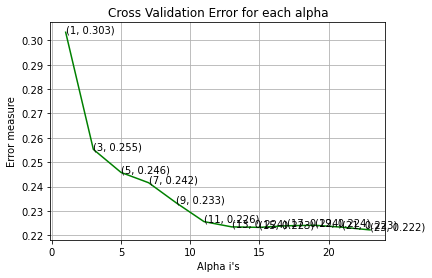

For values of best alpha =  23 The train log loss is: 0.04704800305753364
For values of best alpha =  23 The cross validation log loss is: 0.22226731004765615
Train AUC score: 0.9999991425608364
Test AUC score: 0.9710920624035659
Random model AUC score: 0.5100291445225442


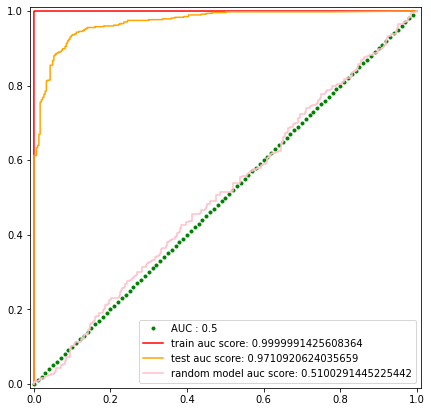

Best Threshold is 0.7839509359744714
****************************************************************************************************
Accuracy on train data : 0.9974424552429667
Accuracy on test data : 0.8925831202046036
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9305019305019305 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.993480032599837 
Recall on test data: 0.7850162866449512 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9967293540474244 
F1 score on test data: 0.8515901060070671 
F1 score on Random model: 0.4384724186704385 
*******************************************************

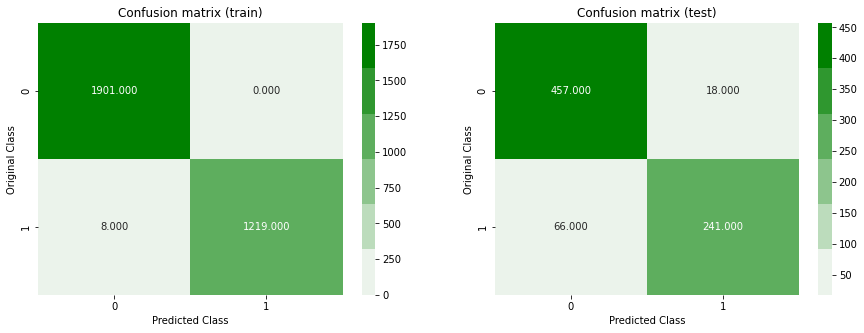

-------------------------------------------------- Precision matrix --------------------------------------------------


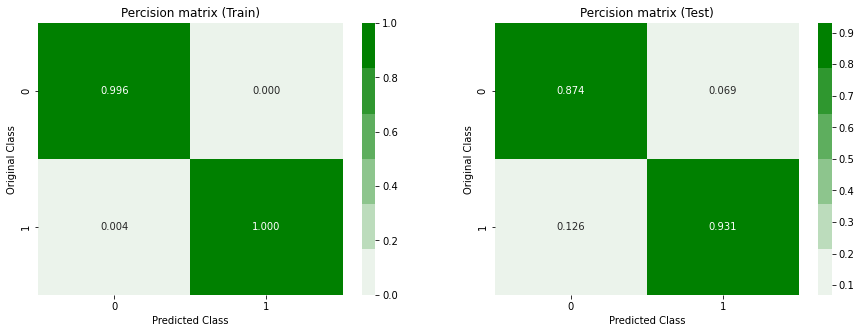

-------------------------------------------------- Recall matrix --------------------------------------------------


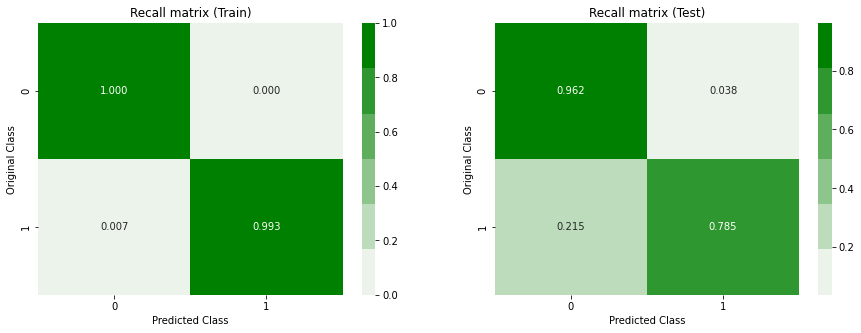

****************************************************************************************************


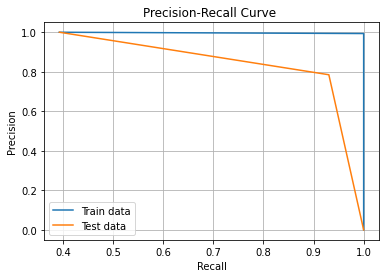

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Normal KNN (cosine distance)

log_loss for k =  1 is 0.3032970837537862
log_loss for k =  3 is 0.2734343846803764
log_loss for k =  5 is 0.27585636846941747
log_loss for k =  7 is 0.2829150499448382
log_loss for k =  9 is 0.2793325415561999
log_loss for k =  11 is 0.27199878659542615
log_loss for k =  13 is 0.27027328098064446
log_loss for k =  15 is 0.27083702326962367
log_loss for k =  17 is 0.27399776136024084
log_loss for k =  19 is 0.27624372627366095
log_loss for k =  21 is 0.2774207326965033
log_loss for k =  23 is 0.27728902076427386


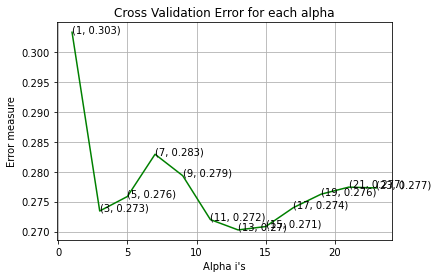

For values of best alpha =  13 The train log loss is: 0.21394485971914523
For values of best alpha =  13 The cross validation log loss is: 0.27027328098064446
Train AUC score: 0.9741752185505248
Test AUC score: 0.9576890108006173
Random model AUC score: 0.5100291445225442


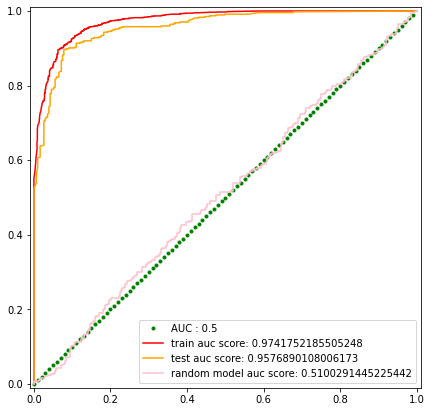

Best Threshold is 0.7408430648807794
****************************************************************************************************
Accuracy on train data : 0.9069693094629157
Accuracy on test data : 0.8734015345268542
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9440227703984819 
Precession on test data: 0.9193548387096774 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.810920945395273 
Recall on test data: 0.742671009771987 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.8724243752740027 
F1 score on test data: 0.8216216216216217 
F1 score on Random model: 0.4384724186704385 
*****************************************

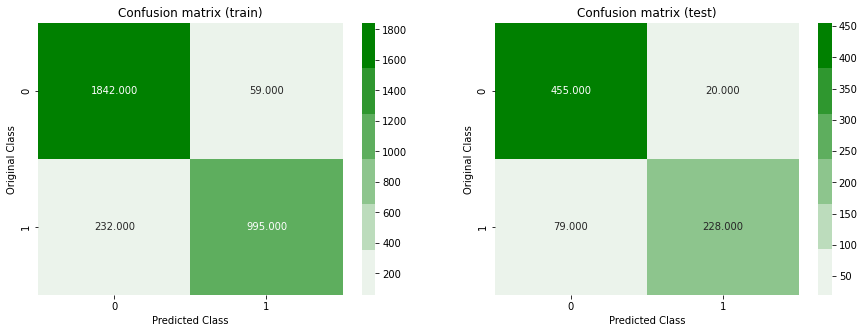

-------------------------------------------------- Precision matrix --------------------------------------------------


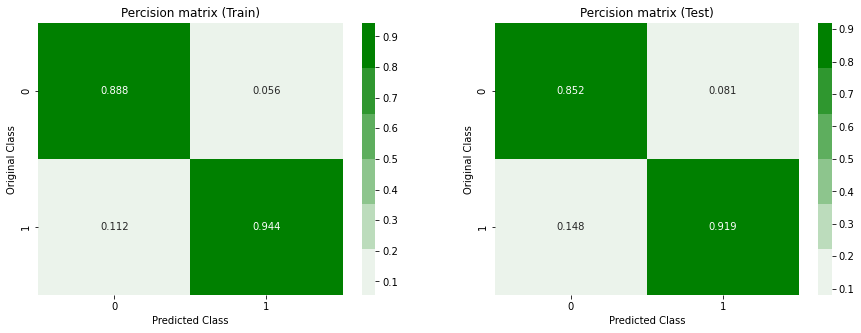

-------------------------------------------------- Recall matrix --------------------------------------------------


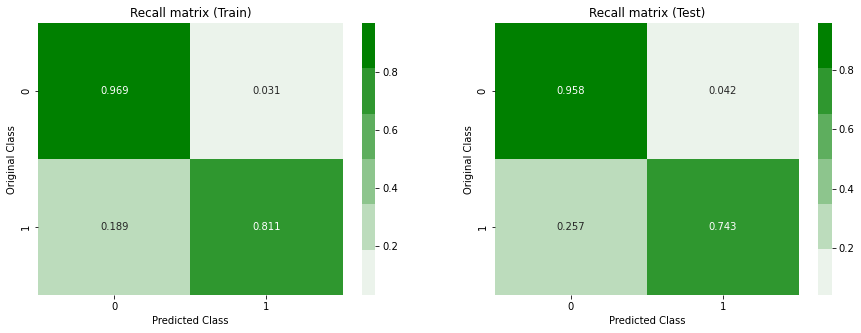

****************************************************************************************************


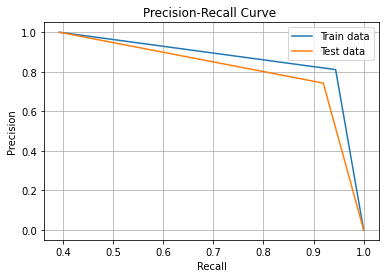

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (minkowski distance)

log_loss for k =  1 is 0.3165167112065577
log_loss for k =  3 is 0.26683598282212684
log_loss for k =  5 is 0.25816809385953976
log_loss for k =  7 is 0.25141046761075875
log_loss for k =  9 is 0.2510485816805771
log_loss for k =  11 is 0.24887238394356226
log_loss for k =  13 is 0.24880569073614725
log_loss for k =  15 is 0.2490775073779257
log_loss for k =  17 is 0.250658486452336
log_loss for k =  19 is 0.2526629701343164
log_loss for k =  21 is 0.2533602958833451
log_loss for k =  23 is 0.25388377348278995


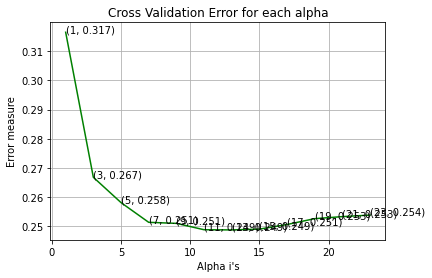

For values of best alpha =  13 The train log loss is: 0.047929686541246436
For values of best alpha =  13 The cross validation log loss is: 0.24880569073614725
Train AUC score: 0.9999991425608363
Test AUC score: 0.9639636550660038
Random model AUC score: 0.5100291445225442


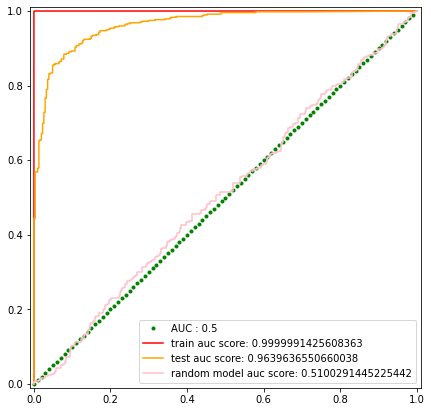

Best Threshold is 0.780967481984728
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.8861892583120204
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.92578125 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.7719869706840391 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.8419182948490231 
F1 score on Random model: 0.4384724186704385 
****************************************************************

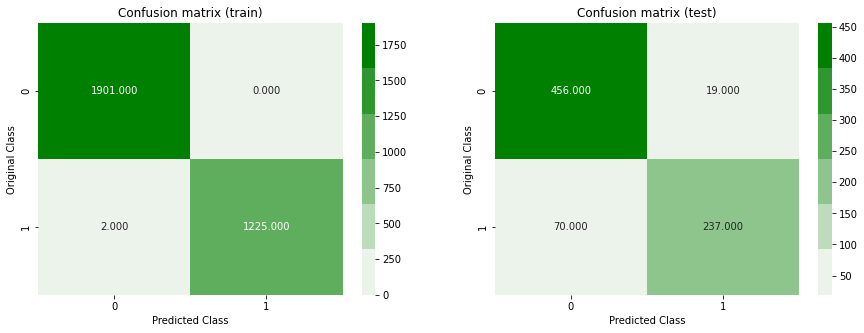

-------------------------------------------------- Precision matrix --------------------------------------------------


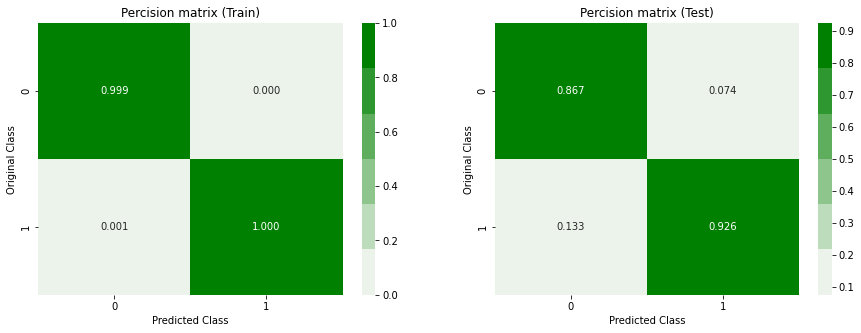

-------------------------------------------------- Recall matrix --------------------------------------------------


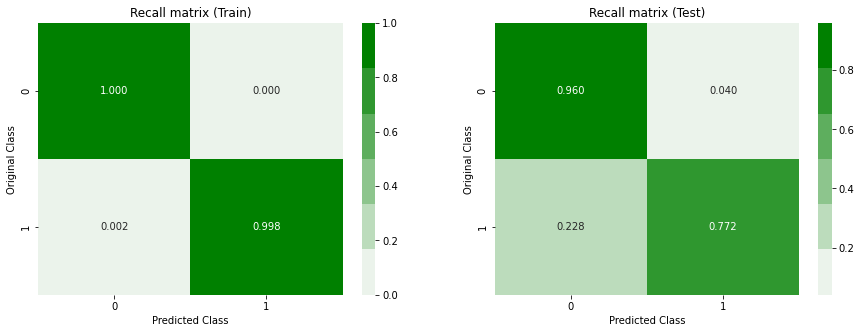

****************************************************************************************************


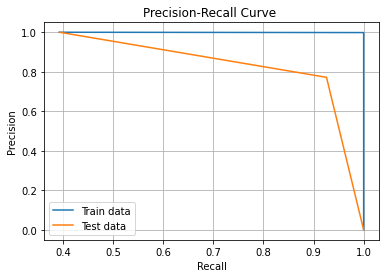

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (cosine distance)

log_loss for k =  1 is 0.3032970837537862
log_loss for k =  3 is 0.2552982569240337
log_loss for k =  5 is 0.24583877004792085
log_loss for k =  7 is 0.24159841899670717
log_loss for k =  9 is 0.23333077842780595
log_loss for k =  11 is 0.2256705622236779
log_loss for k =  13 is 0.22351655740036644
log_loss for k =  15 is 0.22331400535140614
log_loss for k =  17 is 0.22397446802873205
log_loss for k =  19 is 0.22417887586259028
log_loss for k =  21 is 0.22337386481213817
log_loss for k =  23 is 0.22226731004765615


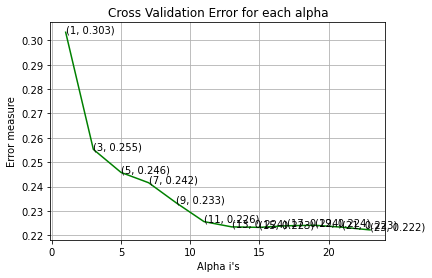

For values of best alpha =  23 The train log loss is: 0.04704800305753364
For values of best alpha =  23 The cross validation log loss is: 0.22226731004765615
Train AUC score: 0.9999991425608364
Test AUC score: 0.9710920624035659
Random model AUC score: 0.5100291445225442


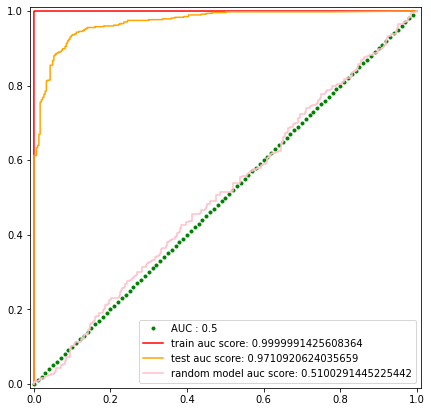

Best Threshold is 0.7839509359744714
****************************************************************************************************
Accuracy on train data : 0.9974424552429667
Accuracy on test data : 0.8925831202046036
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9305019305019305 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.993480032599837 
Recall on test data: 0.7850162866449512 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9967293540474244 
F1 score on test data: 0.8515901060070671 
F1 score on Random model: 0.4384724186704385 
*******************************************************

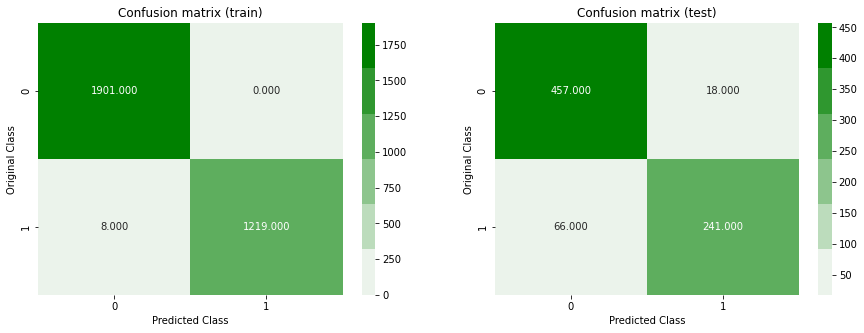

-------------------------------------------------- Precision matrix --------------------------------------------------


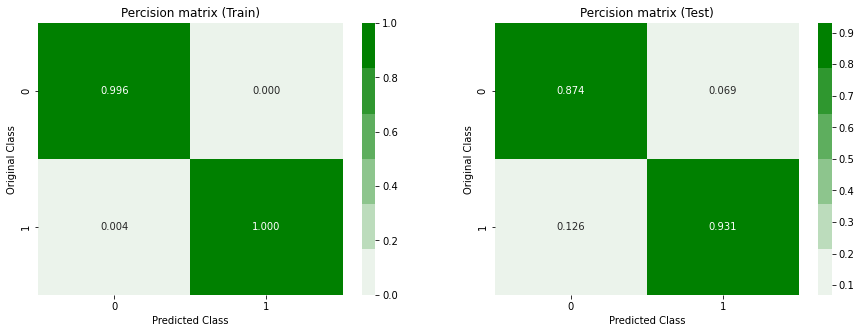

-------------------------------------------------- Recall matrix --------------------------------------------------


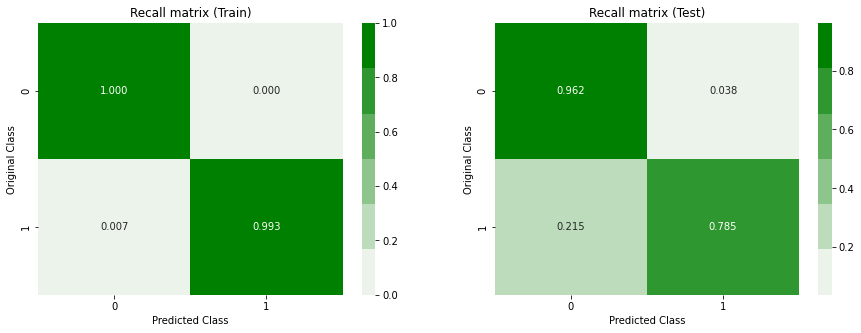

****************************************************************************************************


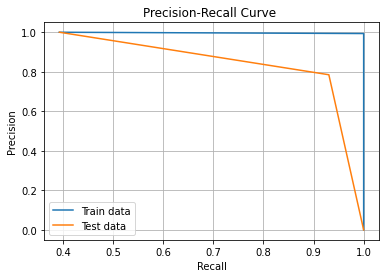

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Logistic Regression

log_loss for c =  1e-05 is 0.3247956075836126
log_loss for c =  0.0001 is 0.32170226156387377
log_loss for c =  0.001 is 0.30682184591757367
log_loss for c =  0.01 is 0.2905187542460343
log_loss for c =  0.1 is 0.28536317863315247
log_loss for c =  1 is 0.2767523483339898
log_loss for c =  10 is 0.26824872291735813
log_loss for c =  100 is 0.2654680487500848
log_loss for c =  1000 is 0.2674747497876947


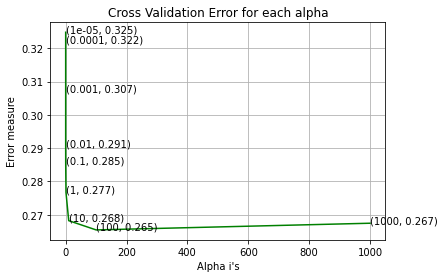

log loss for train data 0.20925116833113908
log loss for cv data 0.2654680487500848
Train AUC score: 0.9802668950884599
Test AUC score: 0.9680164580833189
Random model AUC score: 0.5100291445225442


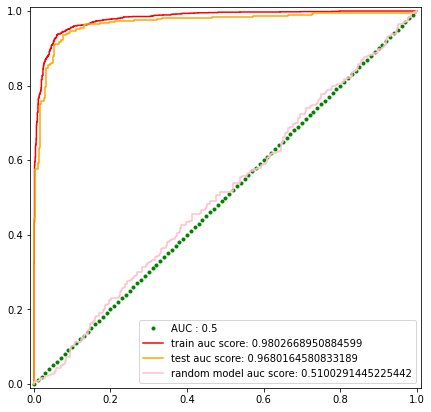

Best Threshold is 0.6089191756792687
****************************************************************************************************
Accuracy on train data : 0.914002557544757
Accuracy on test data : 0.9053708439897699
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9553231939163498 
Precession on test data: 0.946360153256705 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.8190709046454768 
Recall on test data: 0.8045602605863192 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.8819657744624835 
F1 score on test data: 0.869718309859155 
F1 score on Random model: 0.4384724186704385 
******************************************

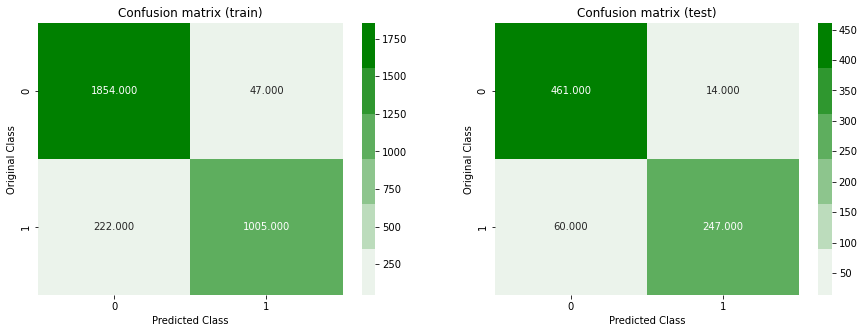

-------------------------------------------------- Precision matrix --------------------------------------------------


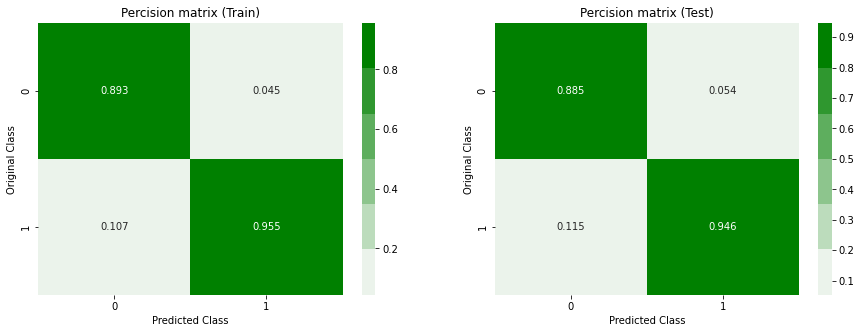

-------------------------------------------------- Recall matrix --------------------------------------------------


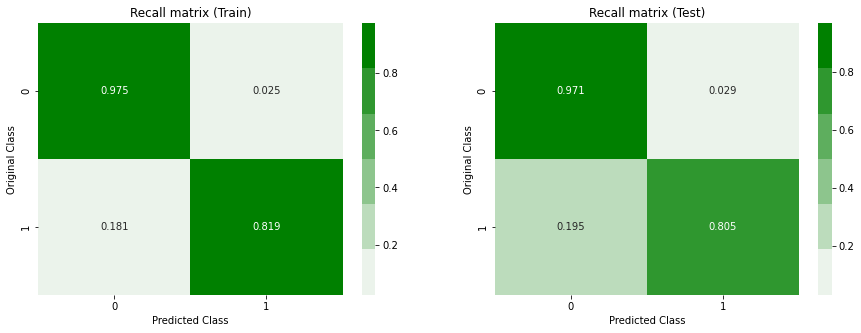

****************************************************************************************************


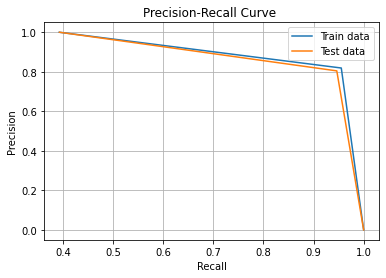

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Random Forest

log_loss for c =  10 is 0.13675429227188543
log_loss for c =  50 is 0.11934227661886163
log_loss for c =  100 is 0.11718956375595543
log_loss for c =  500 is 0.11675597108247733
log_loss for c =  1000 is 0.11671369189311728
log_loss for c =  2000 is 0.11653683483732616
log_loss for c =  3000 is 0.1169600135359948


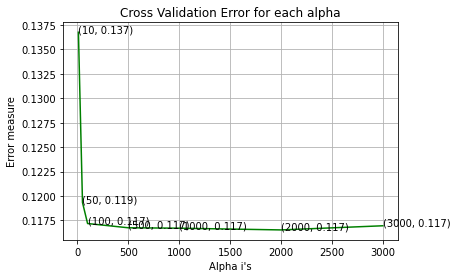

For values of best alpha =  2000 The train log loss is: 0.03577862963015617
For values of best alpha =  2000 The cross validation log loss is: 0.11653683483732616
Train AUC score: 0.9999991425608364
Test AUC score: 0.992875021429796
Random model AUC score: 0.5100291445225442


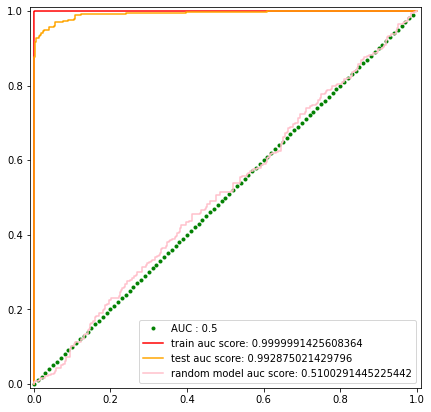

Best Threshold is 0.604018798393275
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.9526854219948849
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.956081081081081 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.9218241042345277 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.9386401326699833 
F1 score on Random model: 0.4384724186704385 
*********************************************************

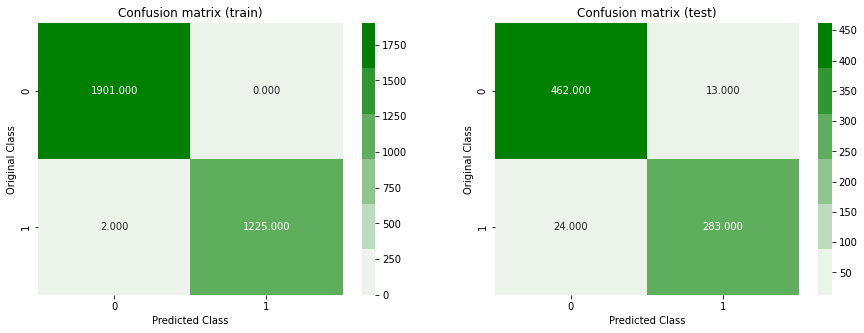

-------------------------------------------------- Precision matrix --------------------------------------------------


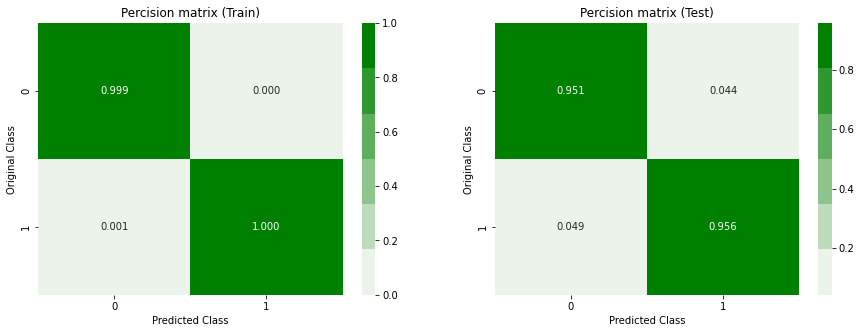

-------------------------------------------------- Recall matrix --------------------------------------------------


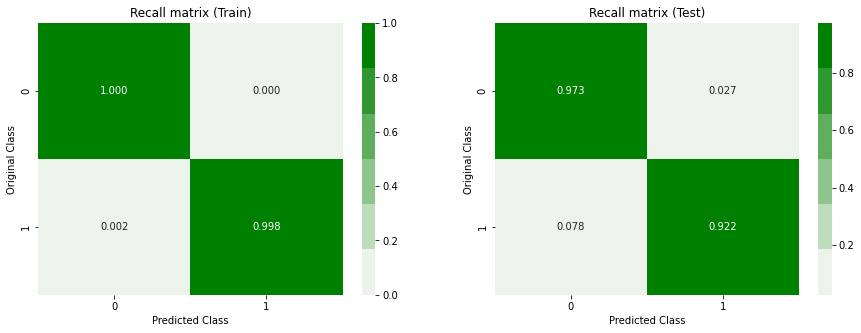

****************************************************************************************************


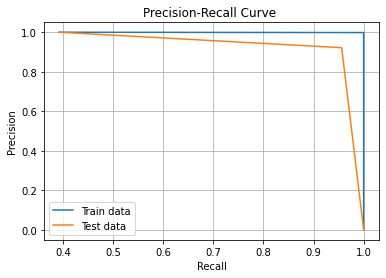

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Xgboost with decision tree as base learners

log_loss for c =  10 is 0.1529622494751275
log_loss for c =  50 is 0.1198195290882736
log_loss for c =  100 is 0.11652251260246173
log_loss for c =  500 is 0.11873258522404075
log_loss for c =  1000 is 0.12209195443519535
log_loss for c =  2000 is 0.12354077930068272


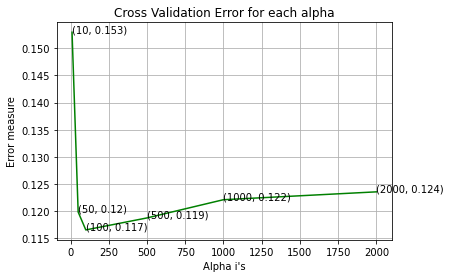

For values of best alpha =  100 The train log loss is: 0.05075740000530353
For values of best alpha =  100 The cross validation log loss is: 0.11652251260246173
Train AUC score: 0.9999198294382015
Test AUC score: 0.9926144351105778
Random model AUC score: 0.5100291445225442


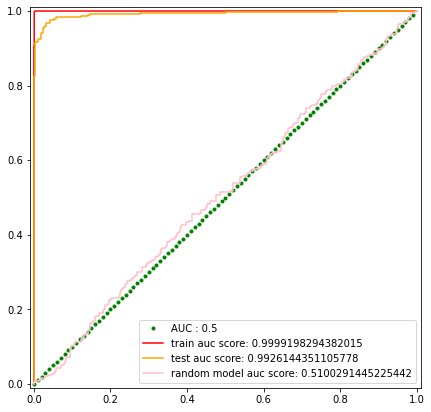

Best Threshold is 0.7017525047063827
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

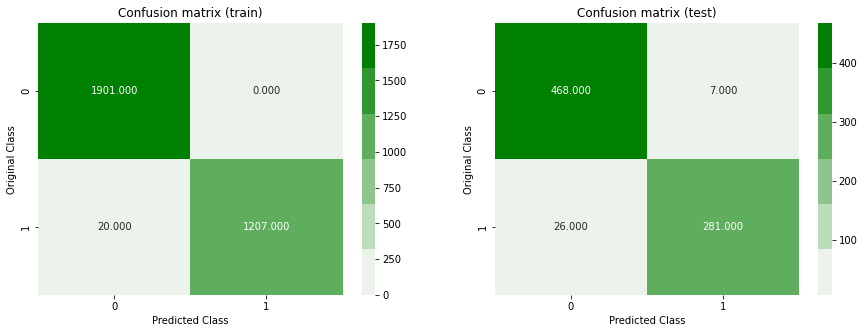

-------------------------------------------------- Precision matrix --------------------------------------------------


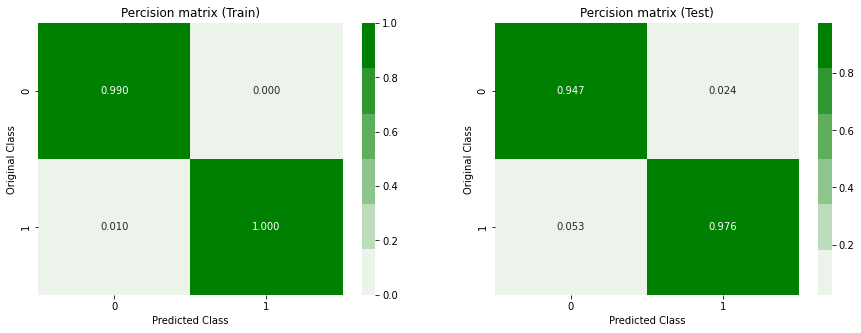

-------------------------------------------------- Recall matrix --------------------------------------------------


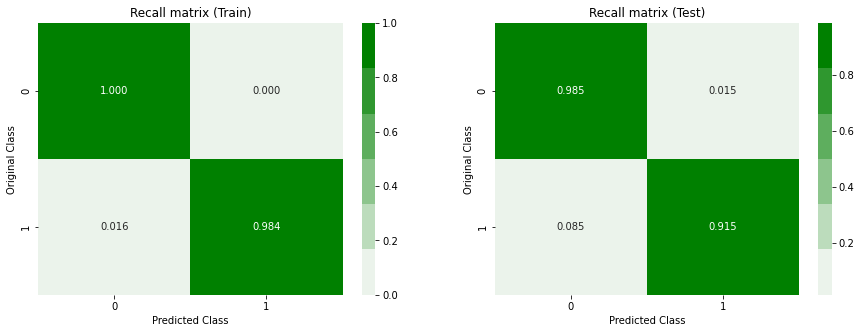

****************************************************************************************************


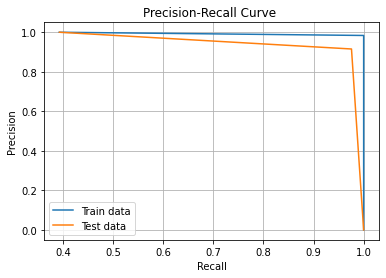

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

XGboost with linear base learners

log_loss for c =  10 is 0.1529622494751275
log_loss for c =  50 is 0.1198195290882736
log_loss for c =  100 is 0.11652251260246173
log_loss for c =  500 is 0.11873258522404075
log_loss for c =  1000 is 0.12209195443519535
log_loss for c =  2000 is 0.12354077930068272


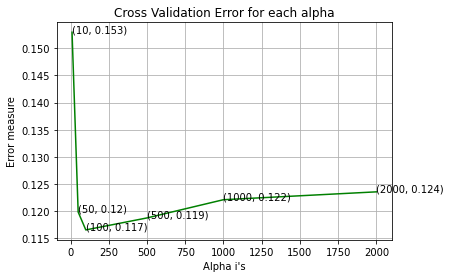

For values of best alpha =  100 The train log loss is: 0.05075740000530353
For values of best alpha =  100 The cross validation log loss is: 0.11652251260246173
Train AUC score: 0.9999198294382015
Test AUC score: 0.9926144351105778
Random model AUC score: 0.5100291445225442


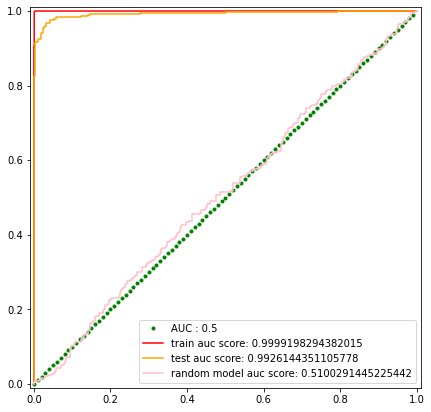

Best Threshold is 0.7017525047063827
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

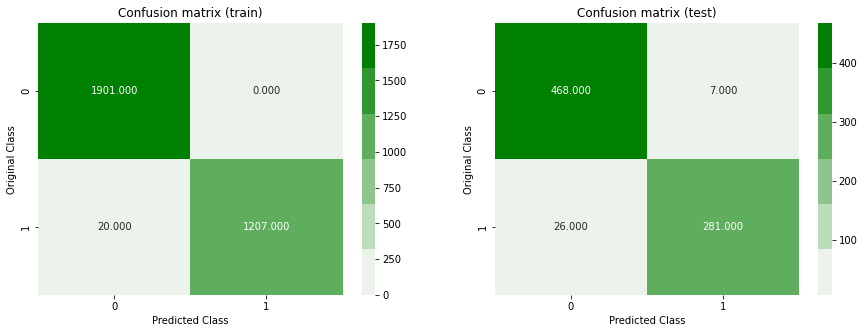

-------------------------------------------------- Precision matrix --------------------------------------------------


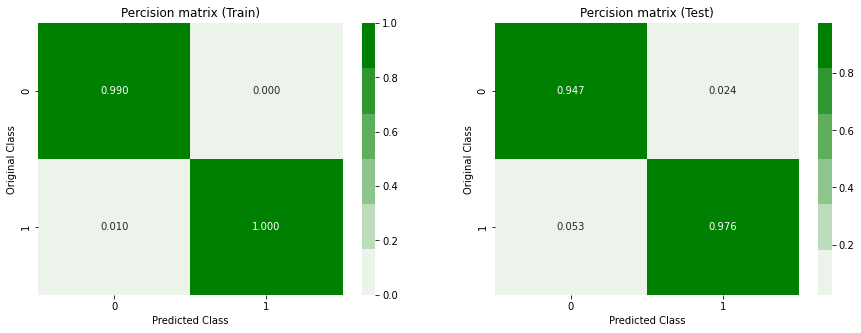

-------------------------------------------------- Recall matrix --------------------------------------------------


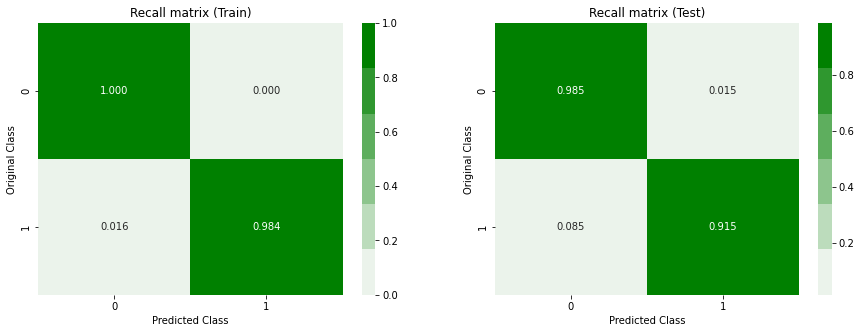

****************************************************************************************************


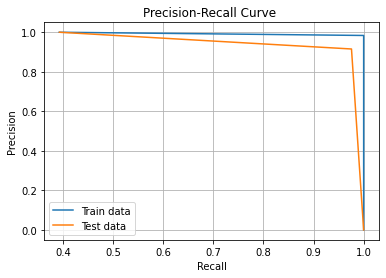

*** Random model ***
                   auc  accuracy  precision    recall   f1score   logloss
random_model  0.510029  0.492327     0.3875  0.504886  0.438472  1.016232
*** ML models ***
                                      auc (train)  auc (test)  \
weighted knn with cosine distance        0.999999    0.971092   
uniform knn with cosine distance         0.974175    0.957689   
weighted knn with minkowski distance     0.999999    0.963964   
weighted knn with cosine distance        0.999999    0.971092   
Logistic Regression                      0.980267    0.968016   
Random Forest                            0.999999    0.992875   
XGBoost                                  0.999920    0.992614   
XGboost linear base learners             0.999920    0.992614   

                                      accuracy (train)  accuracy (test)  \
weighted knn with cosine distance             0.997442         0.892583   
uniform knn with cosine distance              0.906969         0.873402   
we

In [27]:
random_model,metrics=train_all_models(X_train_standardized,y_train,X_val_standardized,y_val)

In [ ]:
metrics

In [28]:
all_models_metrics["Standard scaler"]=metrics

## Minmax scaler

In [29]:
from sklearn.preprocessing import MinMaxScaler

In [30]:
scale=MinMaxScaler()
X_train_minmax=scale.fit_transform(X_train)
X_val_minmax=scale.transform(X_val)


Normal KNN (minkowski distance)

log_loss for k =  1 is 0.3215654724143219
log_loss for k =  3 is 0.2788323252337476
log_loss for k =  5 is 0.27709245758111073
log_loss for k =  7 is 0.275302084841318
log_loss for k =  9 is 0.2762224130201266
log_loss for k =  11 is 0.27760875886686504
log_loss for k =  13 is 0.2767325081955595
log_loss for k =  15 is 0.27632815697097196
log_loss for k =  17 is 0.27544850016777034
log_loss for k =  19 is 0.2740219178997545
log_loss for k =  21 is 0.27337094292471964
log_loss for k =  23 is 0.27189698283857067


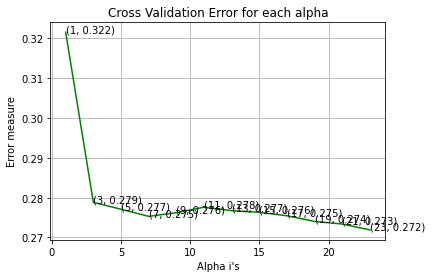

For values of best alpha =  23 The train log loss is: 0.05919563042602254
For values of best alpha =  23 The cross validation log loss is: 0.27189698283857067
Train AUC score: 0.9997264769068054
Test AUC score: 0.9549082804731699
Random model AUC score: 0.5100291445225442


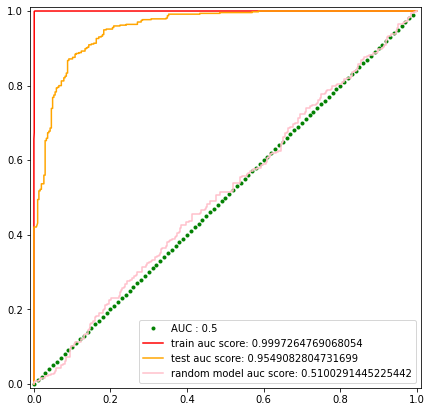

Best Threshold is 0.771986748281291
****************************************************************************************************
Accuracy on train data : 0.9907289002557544
Accuracy on test data : 0.8836317135549873
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.932 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9763651181744091 
Recall on test data: 0.758957654723127 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9880412371134021 
F1 score on test data: 0.8366247755834829 
F1 score on Random model: 0.4384724186704385 
*********************************************************************

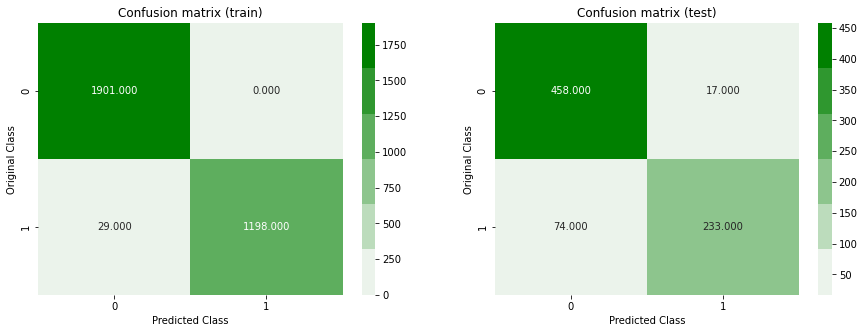

-------------------------------------------------- Precision matrix --------------------------------------------------


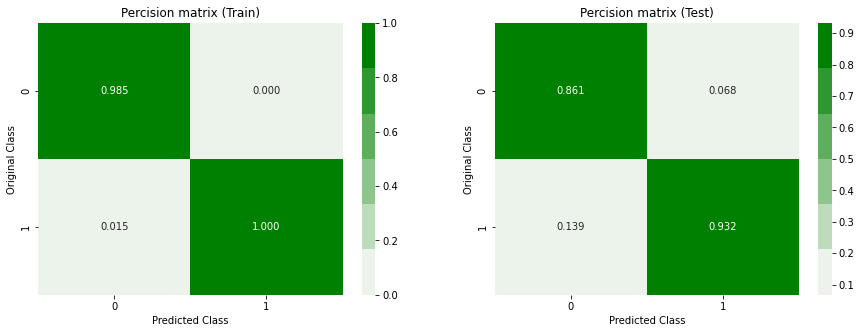

-------------------------------------------------- Recall matrix --------------------------------------------------


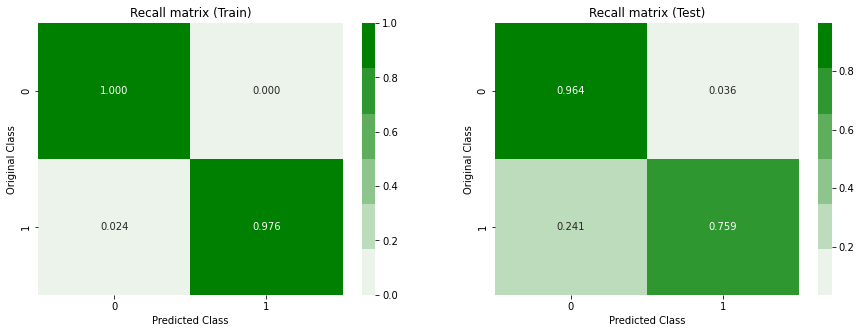

****************************************************************************************************


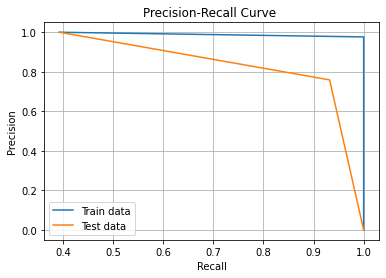

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Normal KNN (cosine distance)

log_loss for k =  1 is 0.3215654724143219
log_loss for k =  3 is 0.29671004809089974
log_loss for k =  5 is 0.3130310100816959
log_loss for k =  7 is 0.32158845514350826
log_loss for k =  9 is 0.3295235050863267
log_loss for k =  11 is 0.33345789570004003
log_loss for k =  13 is 0.333994644674682
log_loss for k =  15 is 0.33640140719829276
log_loss for k =  17 is 0.33763821150503215
log_loss for k =  19 is 0.3377236278130101
log_loss for k =  21 is 0.3377718486178362
log_loss for k =  23 is 0.33661111339137184


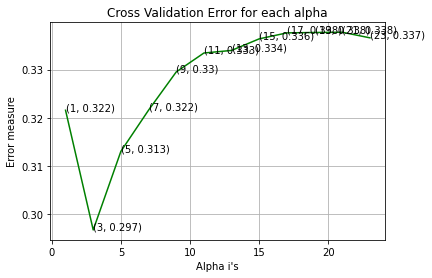

For values of best alpha =  3 The train log loss is: 0.1698870337776953
For values of best alpha =  3 The cross validation log loss is: 0.29671004809089974
Train AUC score: 0.9887366791466937
Test AUC score: 0.9389713697925596
Random model AUC score: 0.5100291445225442


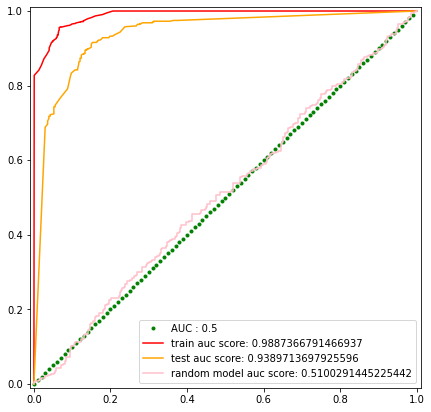

Best Threshold is 0.5891455743876473
****************************************************************************************************
Accuracy on train data : 0.9347826086956522
Accuracy on test data : 0.8849104859335039
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9506607929515418 
Precession on test data: 0.8807017543859649 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.8793806030969845 
Recall on test data: 0.8175895765472313 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9136325148179508 
F1 score on test data: 0.847972972972973 
F1 score on Random model: 0.4384724186704385 
****************************************

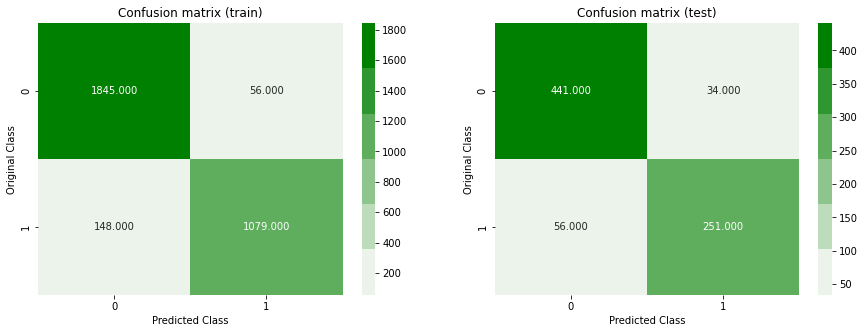

-------------------------------------------------- Precision matrix --------------------------------------------------


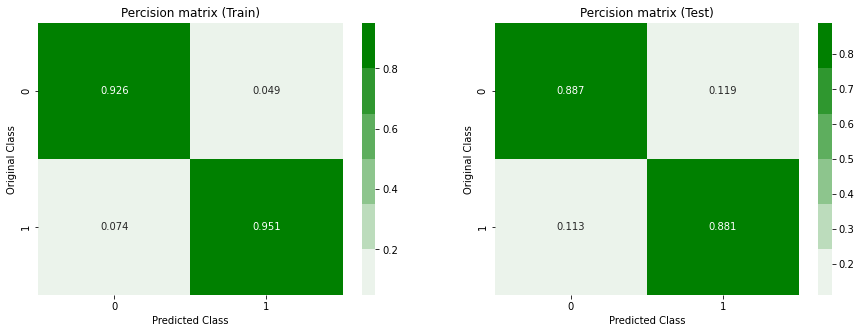

-------------------------------------------------- Recall matrix --------------------------------------------------


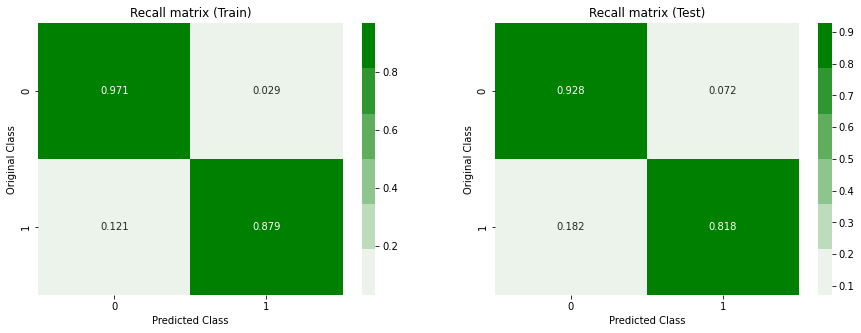

****************************************************************************************************


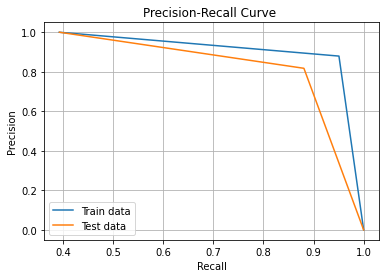

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (minkowski distance)

log_loss for k =  1 is 0.3212757437825438
log_loss for k =  3 is 0.2972307878755546
log_loss for k =  5 is 0.28443998048148056
log_loss for k =  7 is 0.27514764675101094
log_loss for k =  9 is 0.2692000388484262
log_loss for k =  11 is 0.26614680437079347
log_loss for k =  13 is 0.2681957978849021
log_loss for k =  15 is 0.2720568312644345
log_loss for k =  17 is 0.27384982127528473
log_loss for k =  19 is 0.2745122769518851
log_loss for k =  21 is 0.27578138121587287
log_loss for k =  23 is 0.2785066719650697


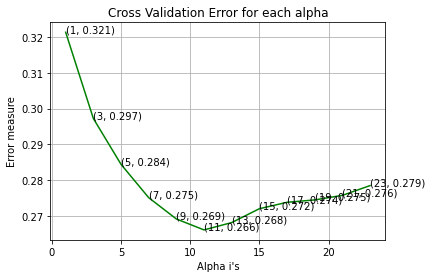

For values of best alpha =  11 The train log loss is: 0.05435700948789821
For values of best alpha =  11 The cross validation log loss is: 0.26614680437079347
Train AUC score: 0.9999991425608364
Test AUC score: 0.9569861134921996
Random model AUC score: 0.5100291445225442


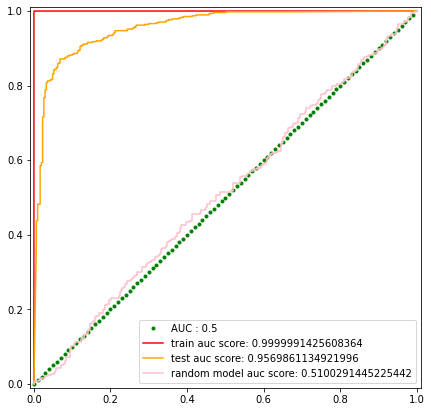

Best Threshold is 0.7800008648645272
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.8670076726342711
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9246861924686193 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.7198697068403909 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.8095238095238095 
F1 score on Random model: 0.4384724186704385 
*******************************************************

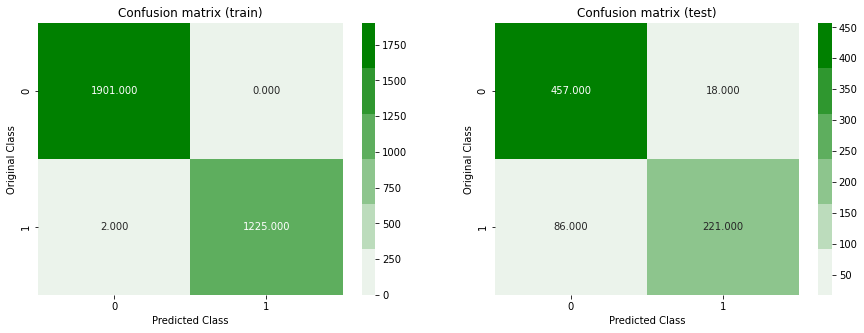

-------------------------------------------------- Precision matrix --------------------------------------------------


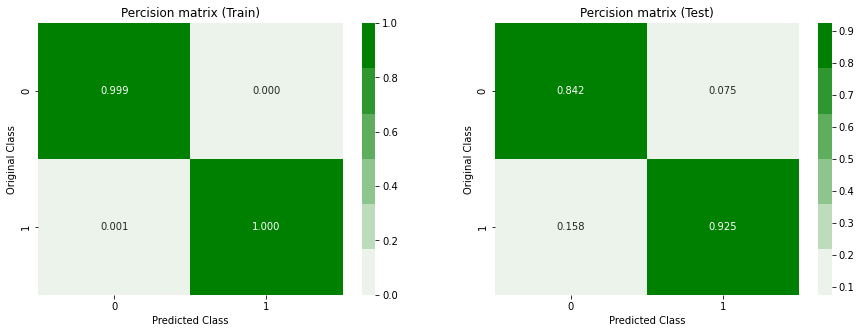

-------------------------------------------------- Recall matrix --------------------------------------------------


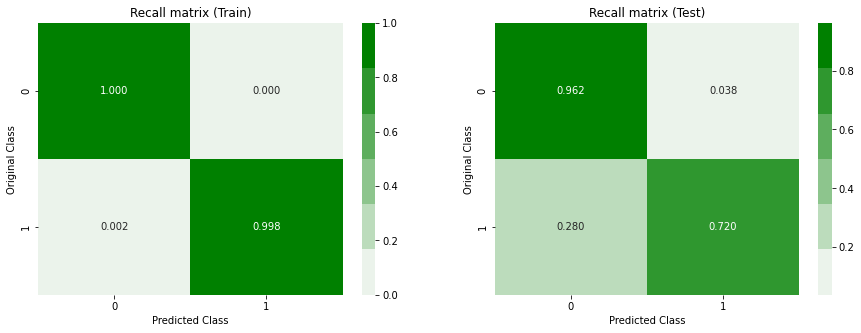

****************************************************************************************************


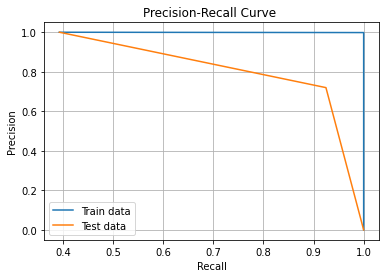

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (cosine distance)

log_loss for k =  1 is 0.3215654724143219
log_loss for k =  3 is 0.2788323252337476
log_loss for k =  5 is 0.27709245758111073
log_loss for k =  7 is 0.275302084841318
log_loss for k =  9 is 0.2762224130201266
log_loss for k =  11 is 0.27760875886686504
log_loss for k =  13 is 0.2767325081955595
log_loss for k =  15 is 0.27632815697097196
log_loss for k =  17 is 0.27544850016777034
log_loss for k =  19 is 0.2740219178997545
log_loss for k =  21 is 0.27337094292471964
log_loss for k =  23 is 0.27189698283857067


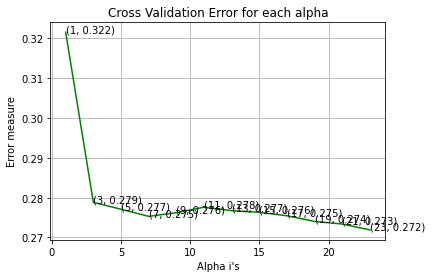

For values of best alpha =  23 The train log loss is: 0.05919563042602254
For values of best alpha =  23 The cross validation log loss is: 0.27189698283857067
Train AUC score: 0.9997264769068054
Test AUC score: 0.9549082804731699
Random model AUC score: 0.5100291445225442


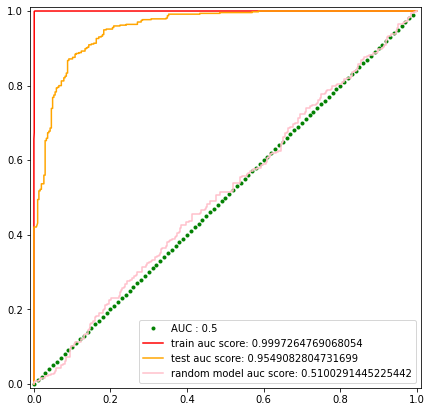

Best Threshold is 0.771986748281291
****************************************************************************************************
Accuracy on train data : 0.9907289002557544
Accuracy on test data : 0.8836317135549873
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.932 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9763651181744091 
Recall on test data: 0.758957654723127 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9880412371134021 
F1 score on test data: 0.8366247755834829 
F1 score on Random model: 0.4384724186704385 
*********************************************************************

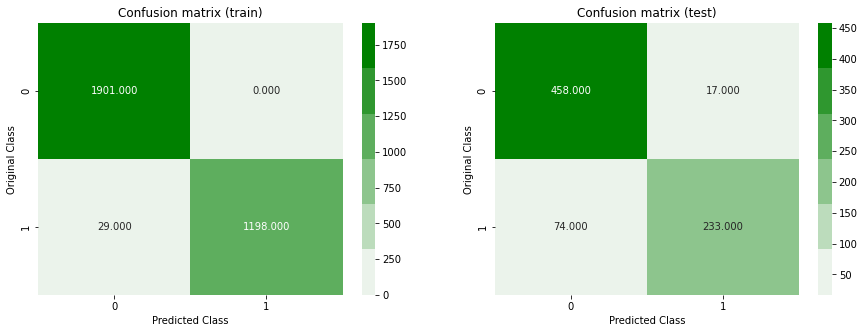

-------------------------------------------------- Precision matrix --------------------------------------------------


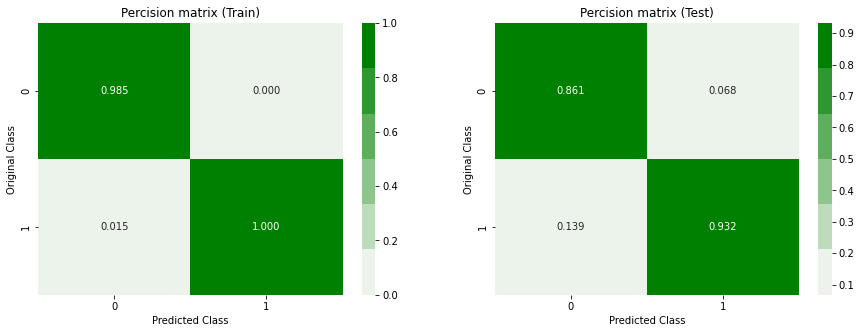

-------------------------------------------------- Recall matrix --------------------------------------------------


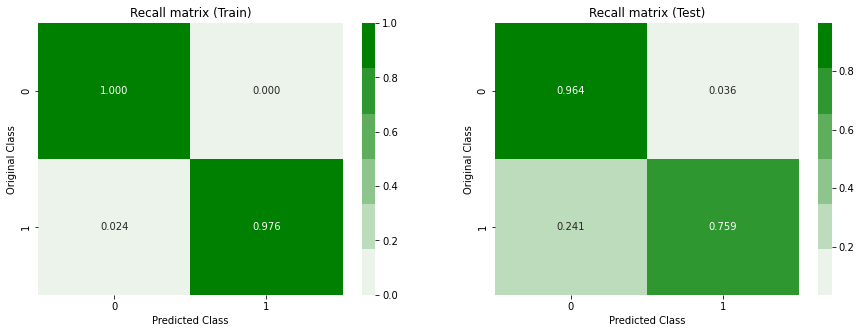

****************************************************************************************************


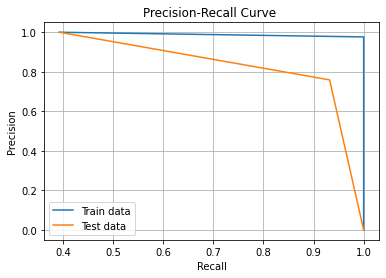

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Logistic Regression

log_loss for c =  1e-05 is 0.3999145553771589
log_loss for c =  0.0001 is 0.3999502737422003
log_loss for c =  0.001 is 0.39954776785503615
log_loss for c =  0.01 is 0.3956918047371015
log_loss for c =  0.1 is 0.36935048811414517
log_loss for c =  1 is 0.31005357623754104
log_loss for c =  10 is 0.2744220966777104
log_loss for c =  100 is 0.26742851558769254
log_loss for c =  1000 is 0.2688155748765247


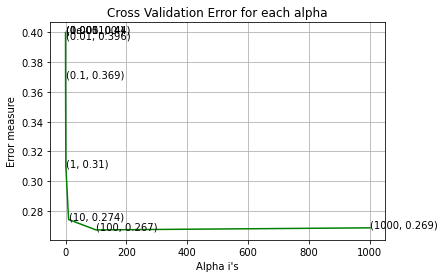

log loss for train data 0.1989355059355731
log loss for cv data 0.26742851558769254
Train AUC score: 0.9773996185253162
Test AUC score: 0.9643339619406823
Random model AUC score: 0.5100291445225442


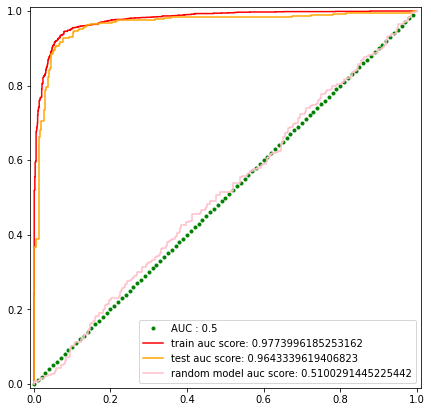

Best Threshold is 0.5932821724850486
****************************************************************************************************
Accuracy on train data : 0.9136828644501279
Accuracy on test data : 0.9143222506393862
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9402023919043239 
Precession on test data: 0.9444444444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.8329258353708231 
Recall on test data: 0.8306188925081434 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.8833189282627485 
F1 score on test data: 0.8838821490467937 
F1 score on Random model: 0.4384724186704385 
***************************************

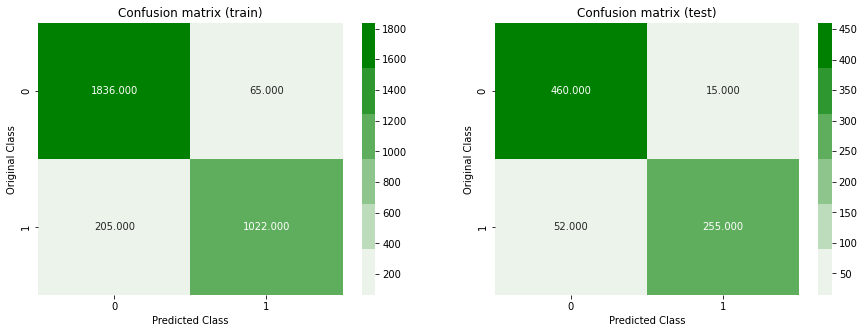

-------------------------------------------------- Precision matrix --------------------------------------------------


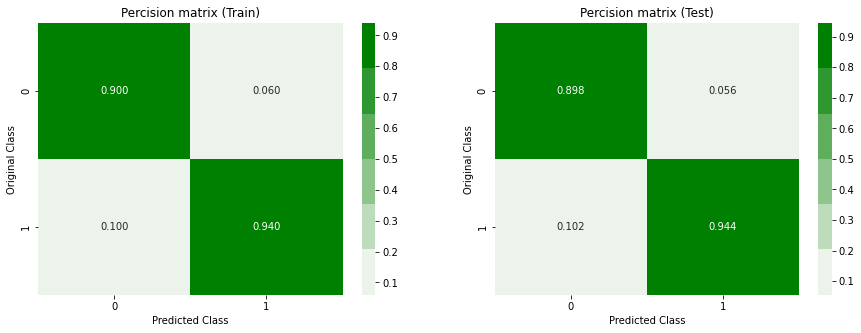

-------------------------------------------------- Recall matrix --------------------------------------------------


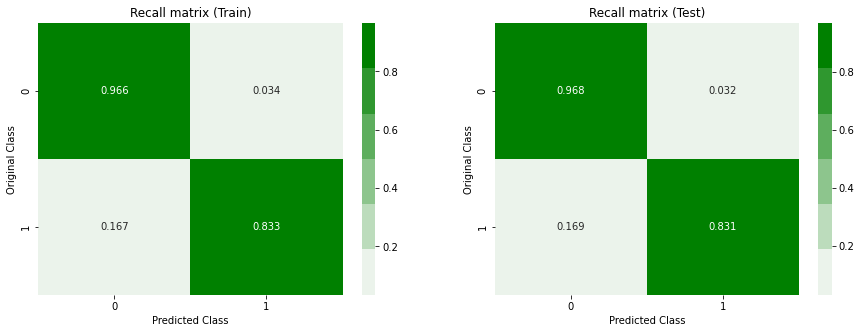

****************************************************************************************************


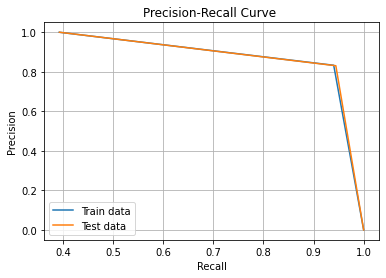

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Random Forest

log_loss for c =  10 is 0.13688632394561648
log_loss for c =  50 is 0.11929308599589442
log_loss for c =  100 is 0.11725581349046785
log_loss for c =  500 is 0.11688378172986078
log_loss for c =  1000 is 0.11682982059421049
log_loss for c =  2000 is 0.11666734622592005
log_loss for c =  3000 is 0.11708536124519398


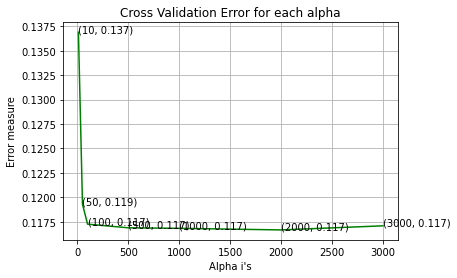

For values of best alpha =  2000 The train log loss is: 0.03578604417725629
For values of best alpha =  2000 The cross validation log loss is: 0.11666734622592005
Train AUC score: 0.9999991425608363
Test AUC score: 0.9928270186867821
Random model AUC score: 0.5100291445225442


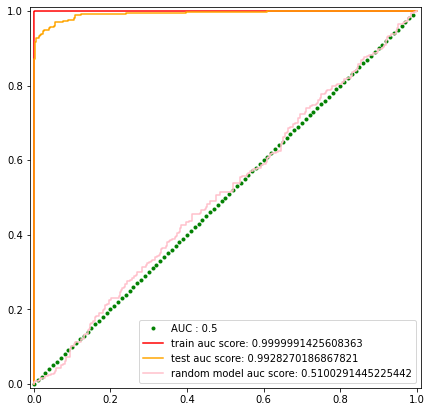

Best Threshold is 0.6038163140916952
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.9526854219948849
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.956081081081081 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.9218241042345277 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.9386401326699833 
F1 score on Random model: 0.4384724186704385 
********************************************************

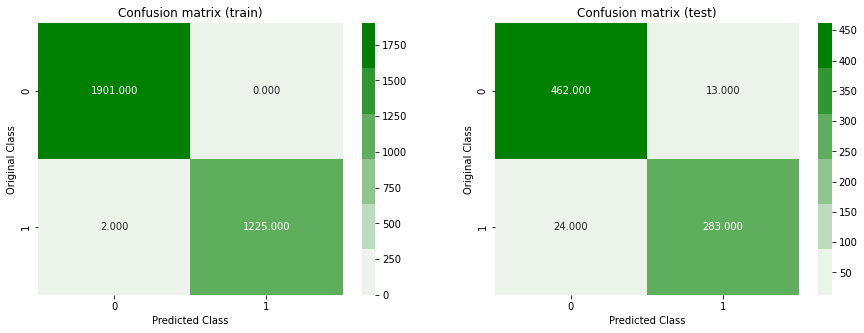

-------------------------------------------------- Precision matrix --------------------------------------------------


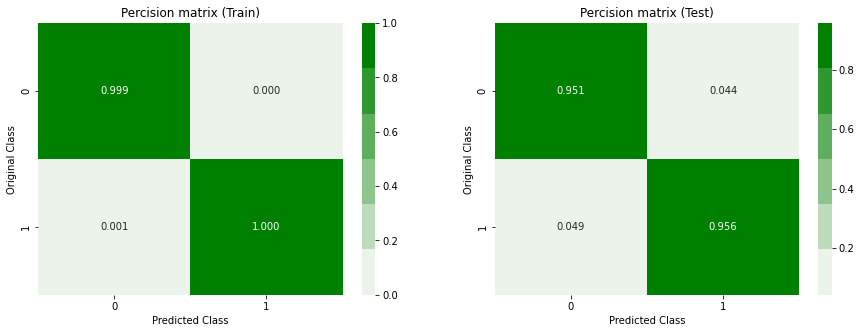

-------------------------------------------------- Recall matrix --------------------------------------------------


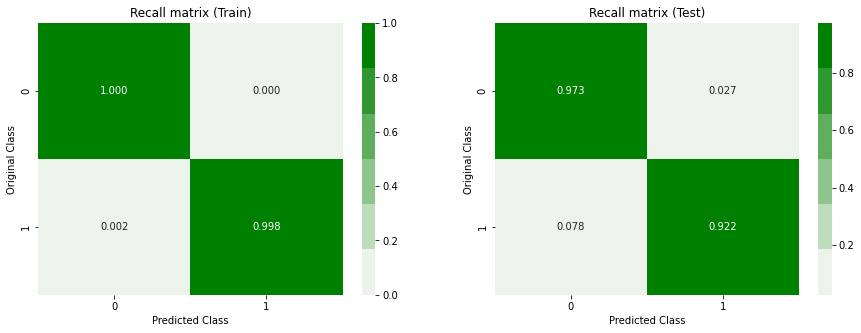

****************************************************************************************************


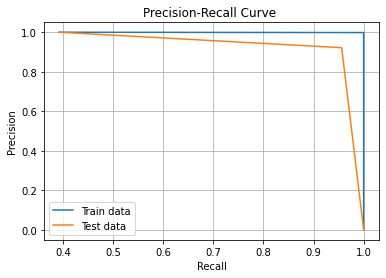

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Xgboost with decision tree as base learners

log_loss for c =  10 is 0.15282334381845675
log_loss for c =  50 is 0.11999721660598746
log_loss for c =  100 is 0.11671224477496568
log_loss for c =  500 is 0.1191270209845361
log_loss for c =  1000 is 0.1225163932620754
log_loss for c =  2000 is 0.12396390390287616


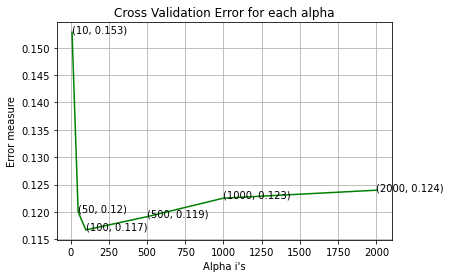

For values of best alpha =  100 The train log loss is: 0.050753047533049676
For values of best alpha =  100 The cross validation log loss is: 0.11671224477496568
Train AUC score: 0.9999198294382017
Test AUC score: 0.9926212926452941
Random model AUC score: 0.5100291445225442


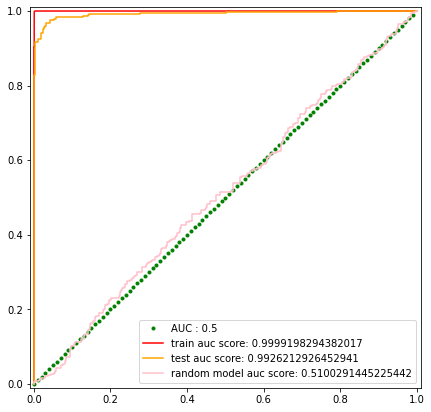

Best Threshold is 0.7018761590123177
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

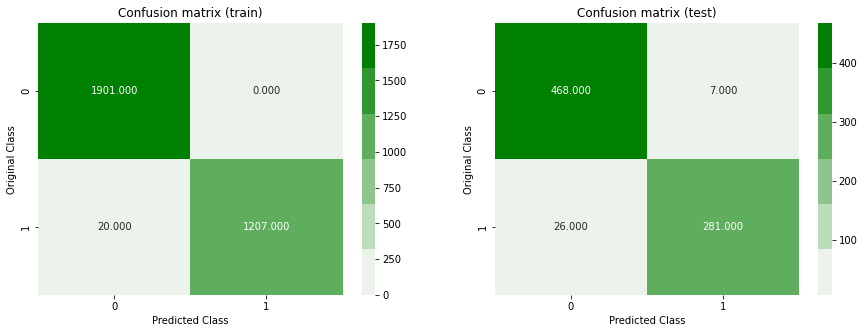

-------------------------------------------------- Precision matrix --------------------------------------------------


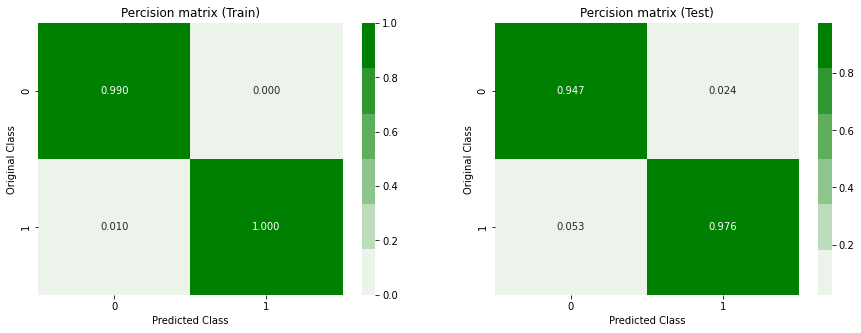

-------------------------------------------------- Recall matrix --------------------------------------------------


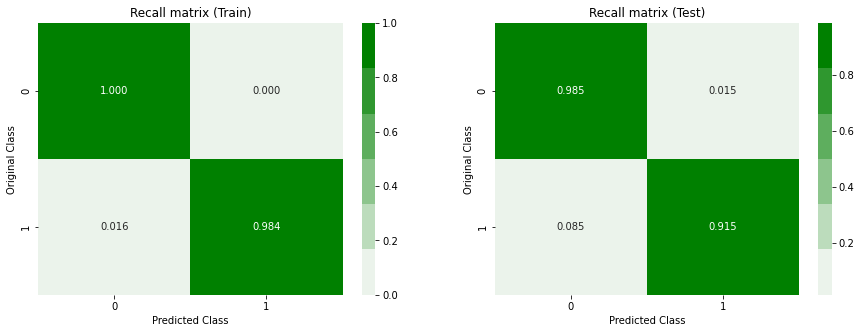

****************************************************************************************************


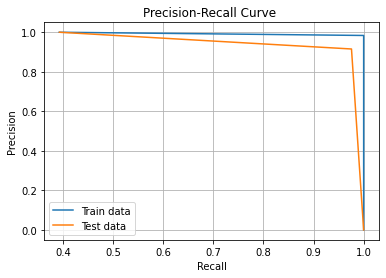

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

XGboost with linear base learners

log_loss for c =  10 is 0.15282334381845675
log_loss for c =  50 is 0.11999721660598746
log_loss for c =  100 is 0.11671224477496568
log_loss for c =  500 is 0.1191270209845361
log_loss for c =  1000 is 0.1225163932620754
log_loss for c =  2000 is 0.12396390390287616


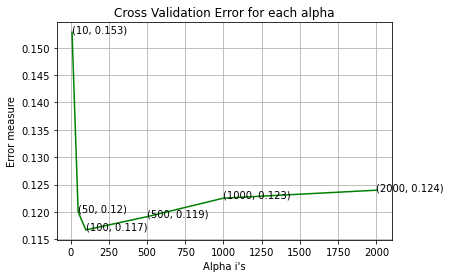

For values of best alpha =  100 The train log loss is: 0.050753047533049676
For values of best alpha =  100 The cross validation log loss is: 0.11671224477496568
Train AUC score: 0.9999198294382017
Test AUC score: 0.9926212926452941
Random model AUC score: 0.5100291445225442


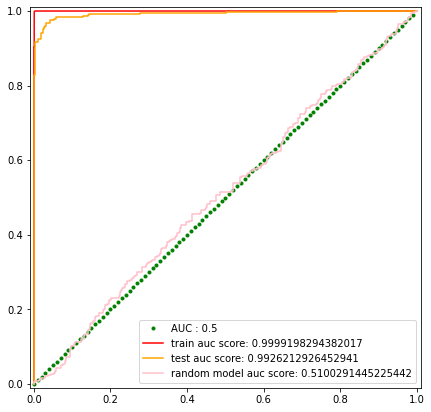

Best Threshold is 0.7018761590123177
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

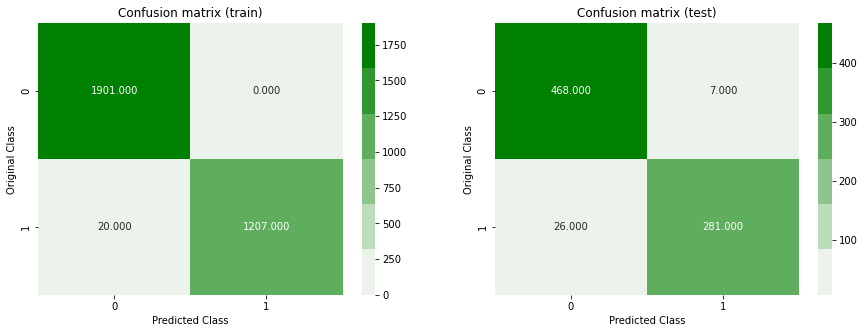

-------------------------------------------------- Precision matrix --------------------------------------------------


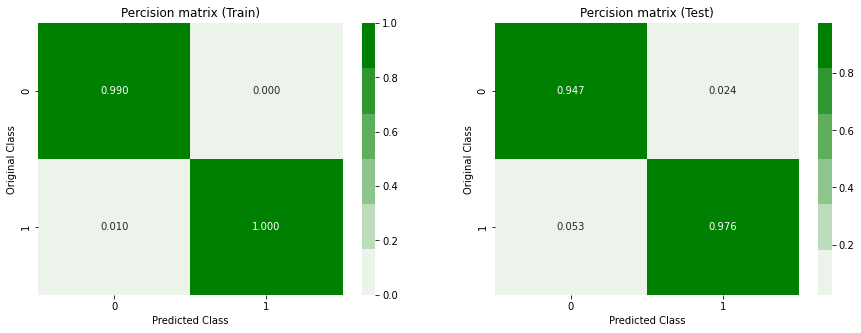

-------------------------------------------------- Recall matrix --------------------------------------------------


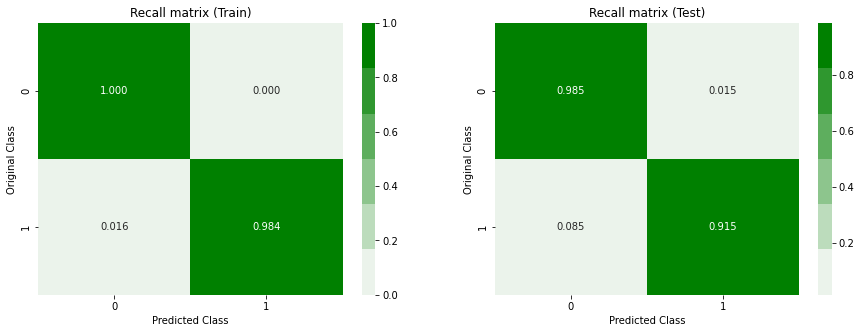

****************************************************************************************************


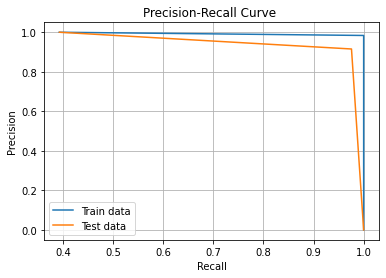

*** Random model ***
                   auc  accuracy  precision    recall   f1score   logloss
random_model  0.510029  0.492327     0.3875  0.504886  0.438472  1.016232
*** ML models ***
                                      auc (train)  auc (test)  \
weighted knn with cosine distance        0.999726    0.954908   
uniform knn with cosine distance         0.988737    0.938971   
weighted knn with minkowski distance     0.999999    0.956986   
weighted knn with cosine distance        0.999726    0.954908   
Logistic Regression                      0.977400    0.964334   
Random Forest                            0.999999    0.992827   
XGBoost                                  0.999920    0.992621   
XGboost linear base learners             0.999920    0.992621   

                                      accuracy (train)  accuracy (test)  \
weighted knn with cosine distance             0.990729         0.883632   
uniform knn with cosine distance              0.934783         0.884910   
we

In [31]:
random_model,metrics=train_all_models(X_train_minmax,y_train,X_val_minmax,y_val)

In [32]:
metrics

,auc (train),auc (test),accuracy (train),accuracy (test),precision (train),precision (test),recall (train),recall (test),f1score (train),f1score (test),logloss (train),logloss (test),Percentage of misclassified pts (Train),Percentage of missclassified pts (Test)
weighted knn with cosine distance,0.999726,0.954908,0.990729,0.883632,1.000000,0.932000,0.976365,0.758958,0.988041,0.836625,0.059196,0.271897,0.927110,11.636829
uniform knn with cosine distance,0.988737,0.938971,0.934783,0.884910,0.950661,0.880702,0.879381,0.817590,0.913633,0.847973,0.169887,0.296710,6.521739,11.508951
weighted knn with minkowski distance,0.999999,0.956986,0.999361,0.867008,1.000000,0.924686,0.998370,0.719870,0.999184,0.809524,0.054357,0.266147,0.063939,13.299233
weighted knn with cosine distance,0.999726,0.954908,0.990729,0.883632,1.000000,0.932000,0.976365,0.758958,0.988041,0.836625,0.059196,0.271897,0.927110,11.636829
Logistic Regression,0.977400,0.964334,0.913683,0.914322,0.940202,0.944444,0.832926,0.830619,0.883319,0.883882,0.198936,0.267429,8.631714,8.567775
Random Forest,0.999999,0.992827,0.999361,0.952685,1.000000,0.956081,0.998370,0.921824,0.999184,0.938640,0.035786,0.116667,0.063939,4.731458
XGBoost,0.999920,0.992621,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050753,0.116712,0.639386,4.219949
XGboost linear base learners,0.999920,0.992621,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050753,0.116712,0.639386,4.219949


In [33]:
all_models_metrics["MinMax scaler"]=metrics

## Observation 
### Here Log loss is performing better when taken min max scaler instead of standard scaler for distance based models like KNN

## Robust Scaler 

In [34]:
from sklearn.preprocessing import RobustScaler

In [35]:
scale=RobustScaler()
scale.fit(X_train)
X_train_robust=scale.fit_transform(X_train)
X_val_robust=scale.transform(X_val)


Normal KNN (minkowski distance)

log_loss for k =  1 is 0.2729076469605921
log_loss for k =  3 is 0.23465187698514509
log_loss for k =  5 is 0.2293409066060132
log_loss for k =  7 is 0.22815300816425224
log_loss for k =  9 is 0.2259840387101044
log_loss for k =  11 is 0.22666918754775636
log_loss for k =  13 is 0.22813505738839254
log_loss for k =  15 is 0.22845880147217082
log_loss for k =  17 is 0.23092895453609322
log_loss for k =  19 is 0.23338462790938774
log_loss for k =  21 is 0.23662641481156715
log_loss for k =  23 is 0.23770608878327967


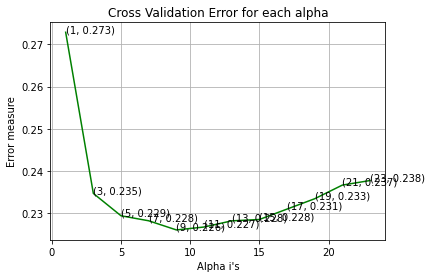

For values of best alpha =  9 The train log loss is: 0.06710310856384868
For values of best alpha =  9 The cross validation log loss is: 0.2259840387101044
Train AUC score: 0.9999991425608363
Test AUC score: 0.9668129607406137
Random model AUC score: 0.5100291445225442


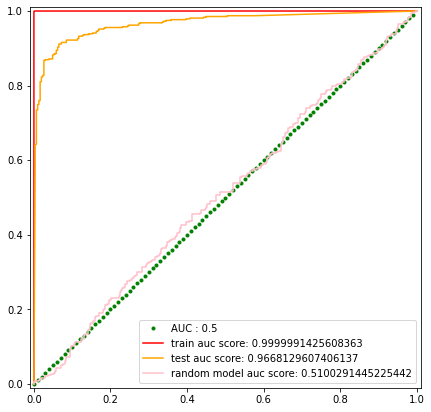

Best Threshold is 0.7853766754263669
****************************************************************************************************
Accuracy on train data : 0.9744245524296675
Accuracy on test data : 0.9002557544757033
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9194139194139194 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.93480032599837 
Recall on test data: 0.8175895765472313 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.966301600673968 
F1 score on test data: 0.8655172413793103 
F1 score on Random model: 0.4384724186704385 
*********************************************************

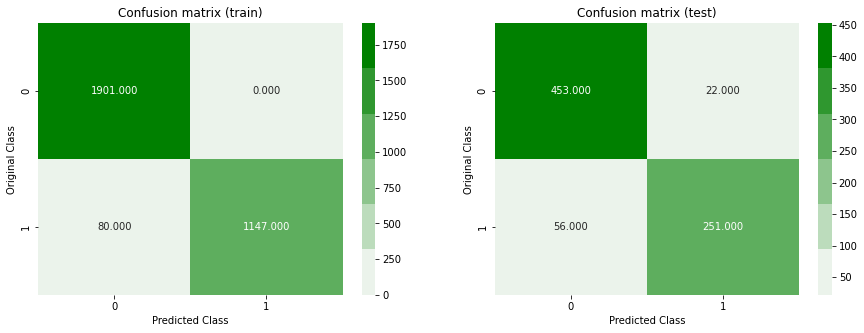

-------------------------------------------------- Precision matrix --------------------------------------------------


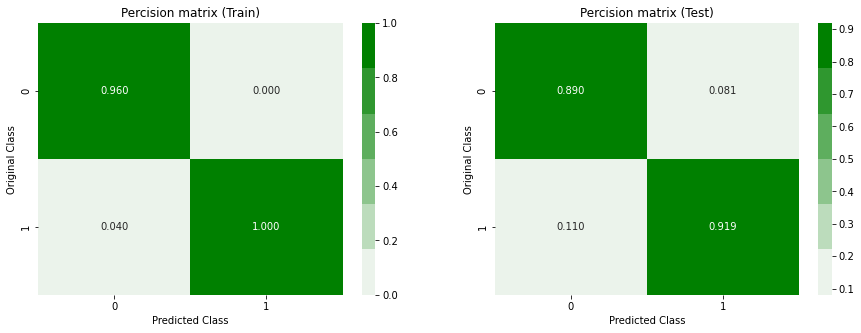

-------------------------------------------------- Recall matrix --------------------------------------------------


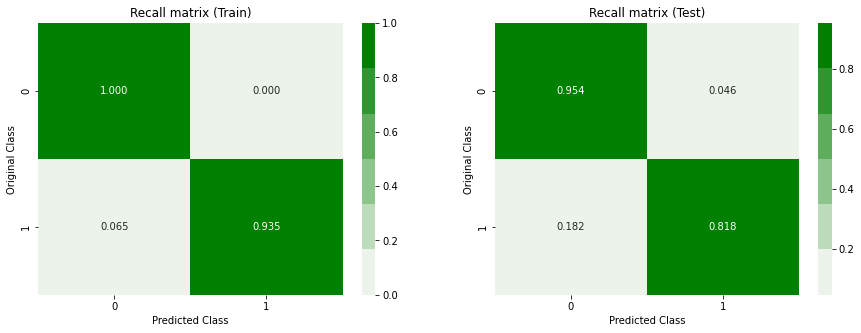

****************************************************************************************************


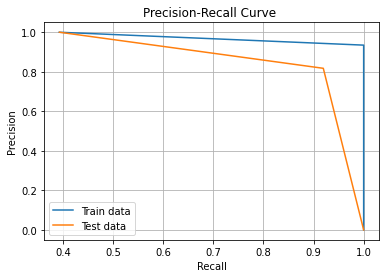

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Normal KNN (cosine distance)

log_loss for k =  1 is 0.2729076469605921
log_loss for k =  3 is 0.2536977063984569
log_loss for k =  5 is 0.2579384717047739
log_loss for k =  7 is 0.2615173270983223
log_loss for k =  9 is 0.2622295224606871
log_loss for k =  11 is 0.266637171677201
log_loss for k =  13 is 0.2710380087610719
log_loss for k =  15 is 0.2740247207410634
log_loss for k =  17 is 0.27953645496360874
log_loss for k =  19 is 0.2839981714974097
log_loss for k =  21 is 0.28950313264974553
log_loss for k =  23 is 0.2918895107389393


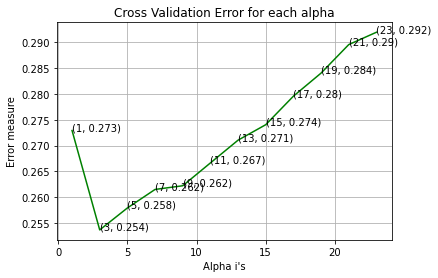

For values of best alpha =  3 The train log loss is: 0.15399860684334918
For values of best alpha =  3 The cross validation log loss is: 0.2536977063984569
Train AUC score: 0.9914513315387132
Test AUC score: 0.9548671352648724
Random model AUC score: 0.5100291445225442


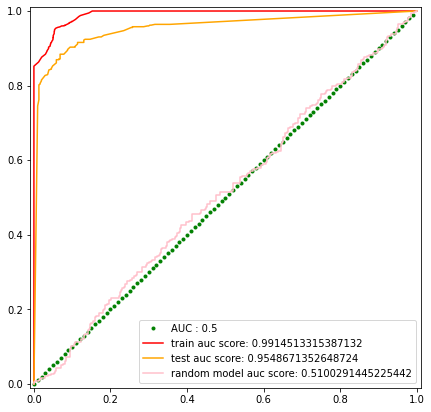

Best Threshold is 0.6082406863157847
****************************************************************************************************
Accuracy on train data : 0.944693094629156
Accuracy on test data : 0.9002557544757033
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9496587030716723 
Precession on test data: 0.8754098360655738 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9070904645476773 
Recall on test data: 0.8697068403908795 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9278866194247603 
F1 score on test data: 0.8725490196078431 
F1 score on Random model: 0.4384724186704385 
****************************************

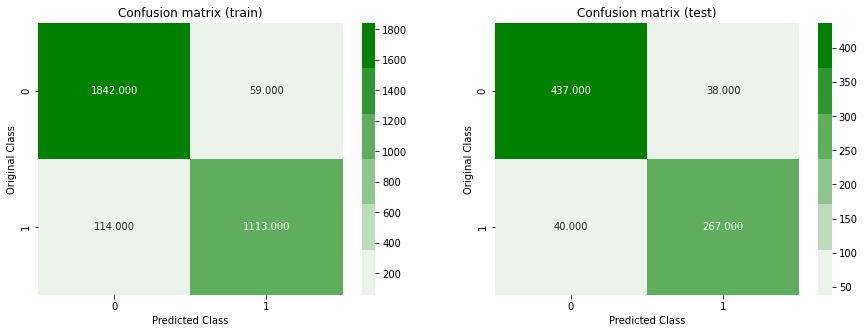

-------------------------------------------------- Precision matrix --------------------------------------------------


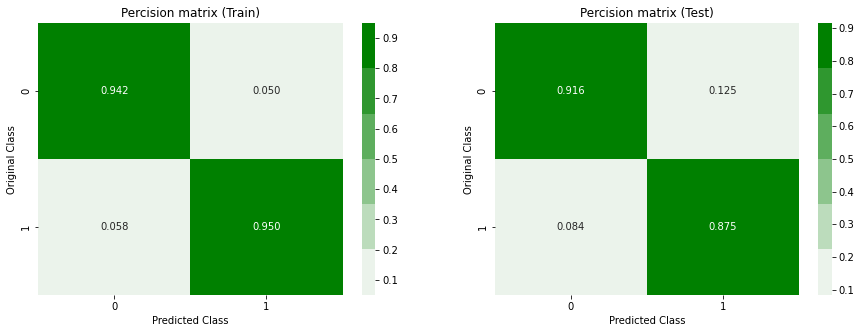

-------------------------------------------------- Recall matrix --------------------------------------------------


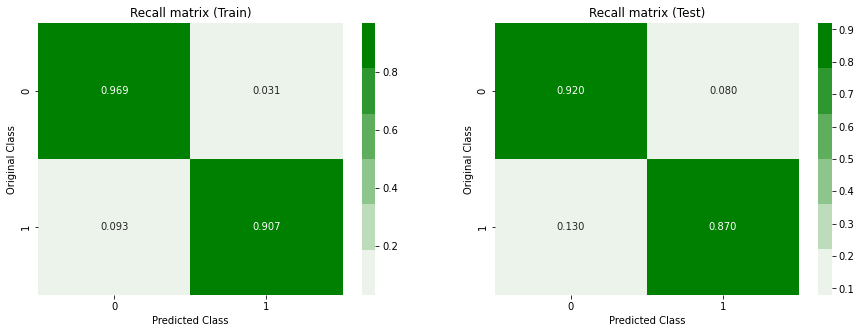

****************************************************************************************************


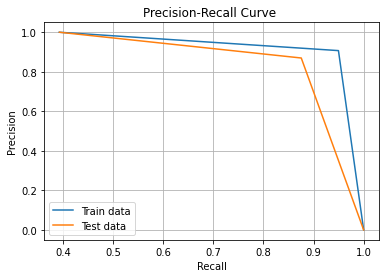

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (minkowski distance)

log_loss for k =  1 is 0.29117387252664184
log_loss for k =  3 is 0.2330702281368397
log_loss for k =  5 is 0.22597038936454056
log_loss for k =  7 is 0.22639306415473462
log_loss for k =  9 is 0.22710833648784123
log_loss for k =  11 is 0.2288274824561776
log_loss for k =  13 is 0.23003303884390172
log_loss for k =  15 is 0.23232344515417924
log_loss for k =  17 is 0.23337018221676004
log_loss for k =  19 is 0.2357604897751631
log_loss for k =  21 is 0.23653871574843152
log_loss for k =  23 is 0.23719738922079217


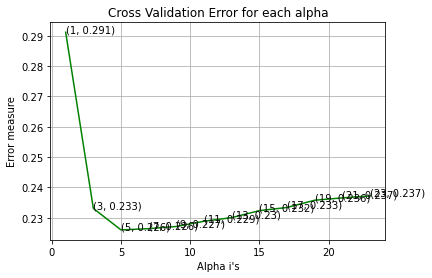

For values of best alpha =  5 The train log loss is: 0.0705554504767116
For values of best alpha =  5 The cross validation log loss is: 0.22597038936454056
Train AUC score: 0.9999991425608363
Test AUC score: 0.9700977198697068
Random model AUC score: 0.5100291445225442


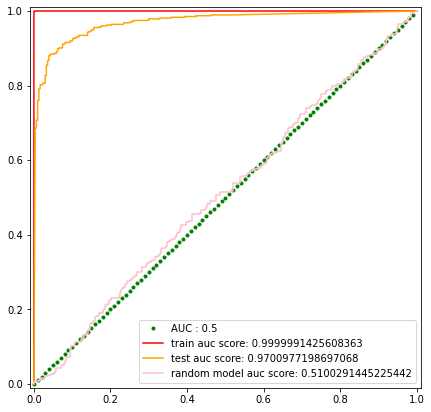

Best Threshold is 0.7704511257267149
****************************************************************************************************
Accuracy on train data : 0.9910485933503836
Accuracy on test data : 0.8976982097186701
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9315589353612167 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9771801140994295 
Recall on test data: 0.7980456026058632 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9884583676834294 
F1 score on test data: 0.8596491228070174 
F1 score on Random model: 0.4384724186704385 
******************************************************

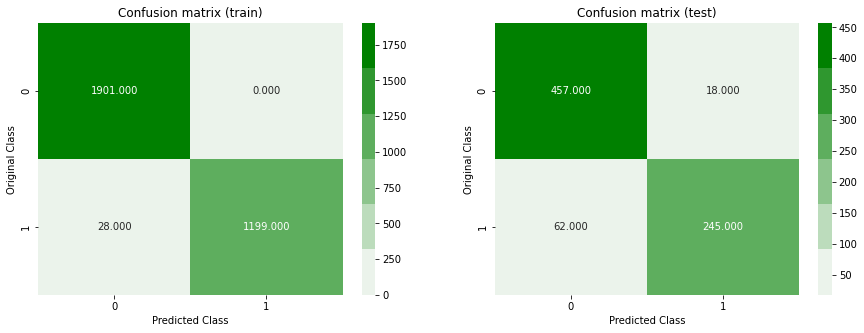

-------------------------------------------------- Precision matrix --------------------------------------------------


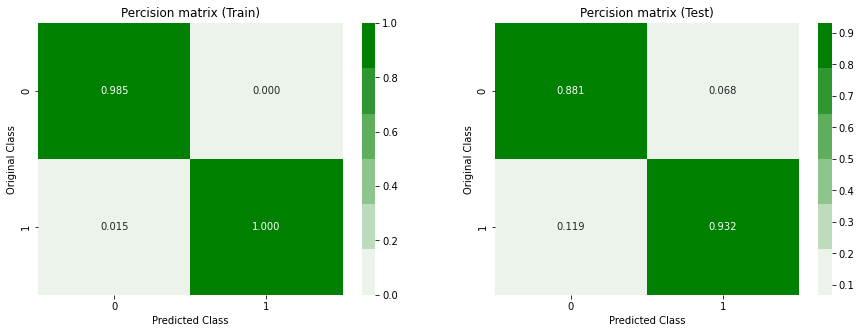

-------------------------------------------------- Recall matrix --------------------------------------------------


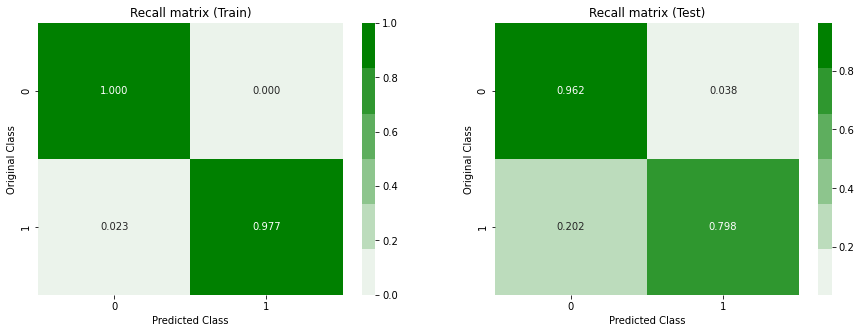

****************************************************************************************************


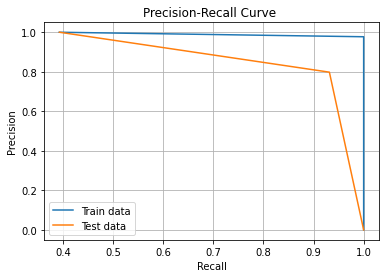

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (cosine distance)

log_loss for k =  1 is 0.2729076469605921
log_loss for k =  3 is 0.23465187698514509
log_loss for k =  5 is 0.2293409066060132
log_loss for k =  7 is 0.22815300816425224
log_loss for k =  9 is 0.2259840387101044
log_loss for k =  11 is 0.22666918754775636
log_loss for k =  13 is 0.22813505738839254
log_loss for k =  15 is 0.22845880147217082
log_loss for k =  17 is 0.23092895453609322
log_loss for k =  19 is 0.23338462790938774
log_loss for k =  21 is 0.23662641481156715
log_loss for k =  23 is 0.23770608878327967


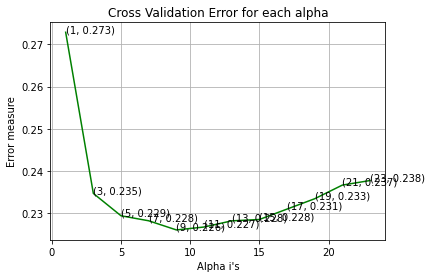

For values of best alpha =  9 The train log loss is: 0.06710310856384868
For values of best alpha =  9 The cross validation log loss is: 0.2259840387101044
Train AUC score: 0.9999991425608363
Test AUC score: 0.9668129607406137
Random model AUC score: 0.5100291445225442


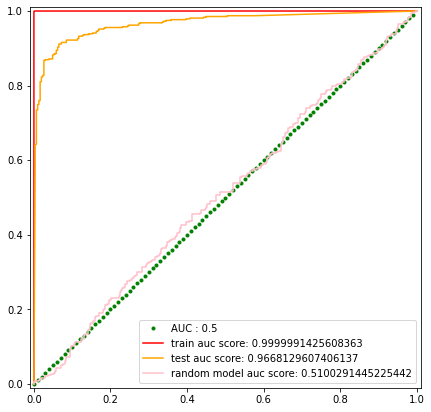

Best Threshold is 0.7853766754263669
****************************************************************************************************
Accuracy on train data : 0.9744245524296675
Accuracy on test data : 0.9002557544757033
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9194139194139194 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.93480032599837 
Recall on test data: 0.8175895765472313 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.966301600673968 
F1 score on test data: 0.8655172413793103 
F1 score on Random model: 0.4384724186704385 
*********************************************************

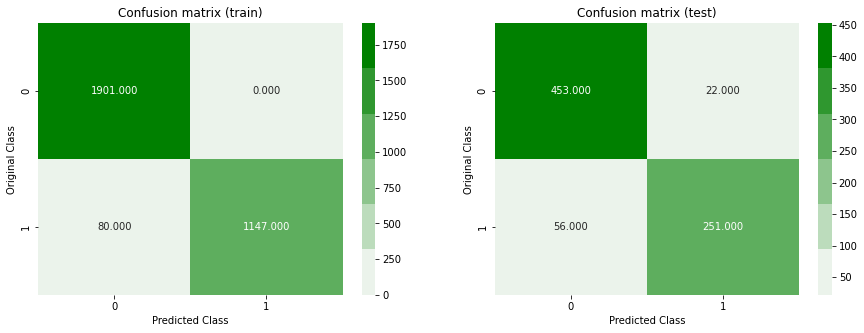

-------------------------------------------------- Precision matrix --------------------------------------------------


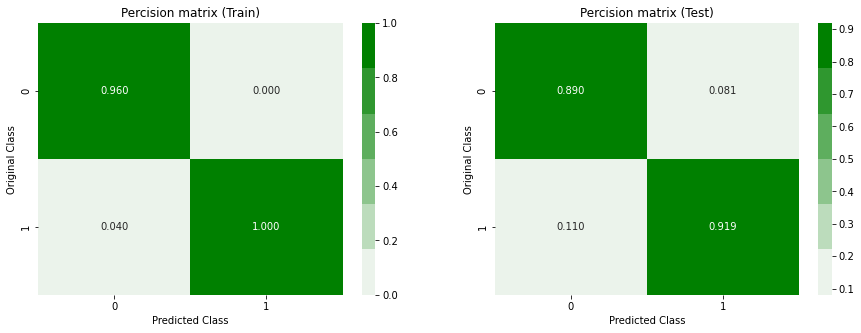

-------------------------------------------------- Recall matrix --------------------------------------------------


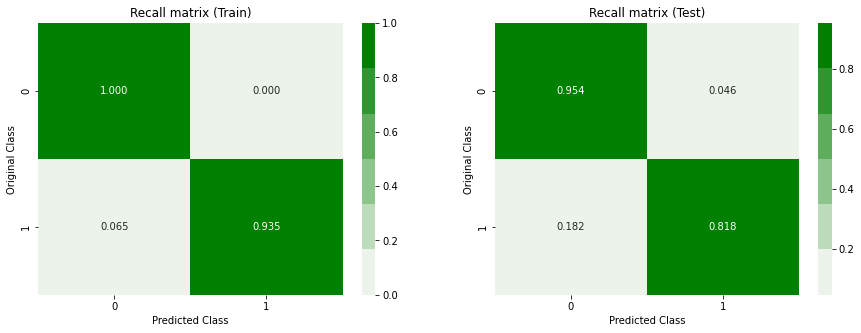

****************************************************************************************************


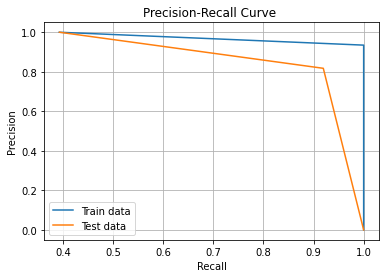

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Logistic Regression

log_loss for c =  1e-05 is 0.409784885821184
log_loss for c =  0.0001 is 0.38237383116050194
log_loss for c =  0.001 is 0.3398728715508669
log_loss for c =  0.01 is 0.29605040271332955
log_loss for c =  0.1 is 0.25919160760468757
log_loss for c =  1 is 0.2603224459996609
log_loss for c =  10 is 0.2659794235382669
log_loss for c =  100 is 0.26709408052154926
log_loss for c =  1000 is 0.26821600687005925


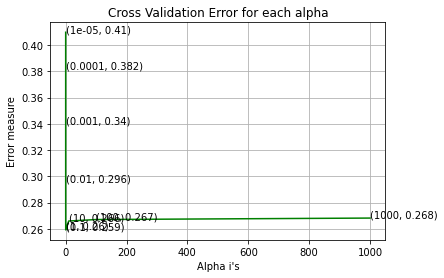

log loss for train data 0.22129082440794584
log loss for cv data 0.25919160760468757
Train AUC score: 0.9750077919783993
Test AUC score: 0.964731698954226
Random model AUC score: 0.5100291445225442


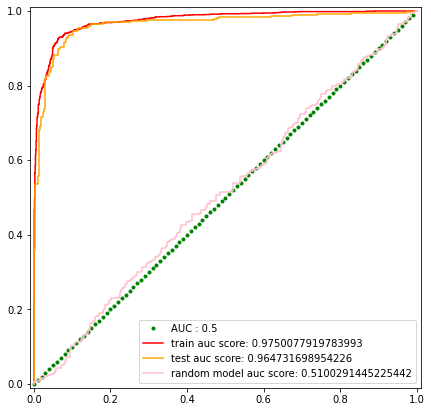

Best Threshold is 0.616524691154039
****************************************************************************************************
Accuracy on train data : 0.9095268542199488
Accuracy on test data : 0.9028132992327366
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9427767354596623 
Precession on test data: 0.9459459459459459 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.8190709046454768 
Recall on test data: 0.7980456026058632 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.8765808983863935 
F1 score on test data: 0.8657243816254417 
F1 score on Random model: 0.4384724186704385 
****************************************

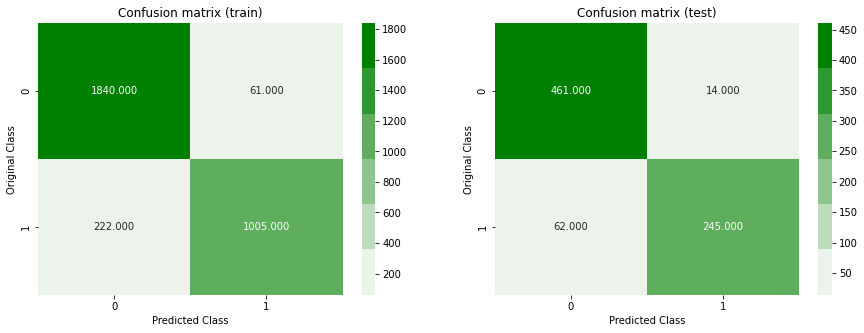

-------------------------------------------------- Precision matrix --------------------------------------------------


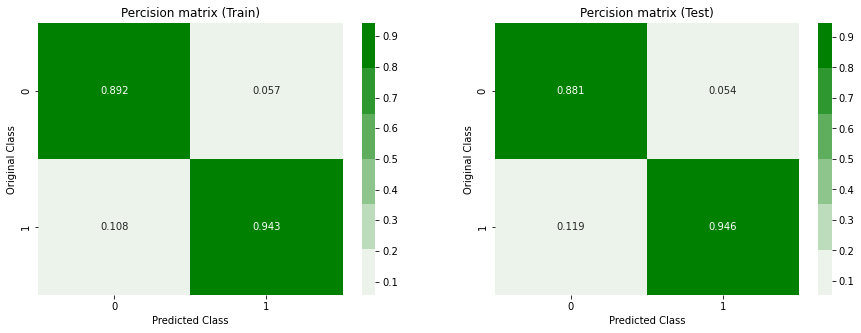

-------------------------------------------------- Recall matrix --------------------------------------------------


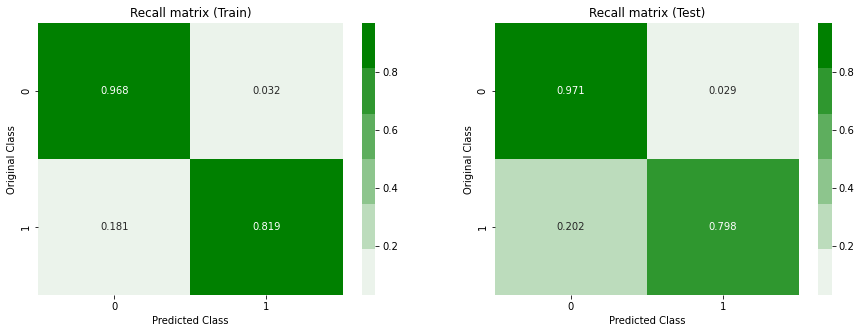

****************************************************************************************************


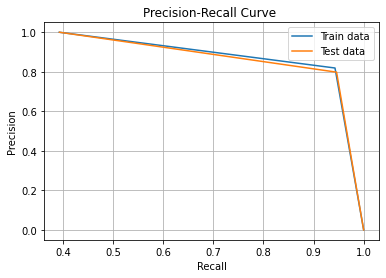

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Random Forest

log_loss for c =  10 is 0.1372247259606658
log_loss for c =  50 is 0.11946117531465889
log_loss for c =  100 is 0.11719703609067805
log_loss for c =  500 is 0.11689665443559566
log_loss for c =  1000 is 0.11685830028949798
log_loss for c =  2000 is 0.1166906844211305
log_loss for c =  3000 is 0.11709516687581246


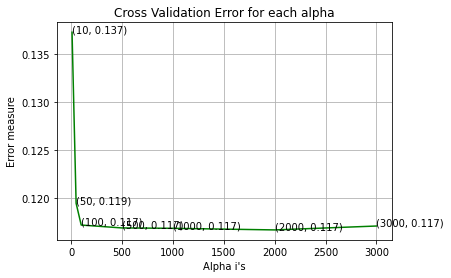

For values of best alpha =  2000 The train log loss is: 0.03580545400919174
For values of best alpha =  2000 The cross validation log loss is: 0.1166906844211305
Train AUC score: 0.9999991425608364
Test AUC score: 0.9928613063603635
Random model AUC score: 0.5100291445225442


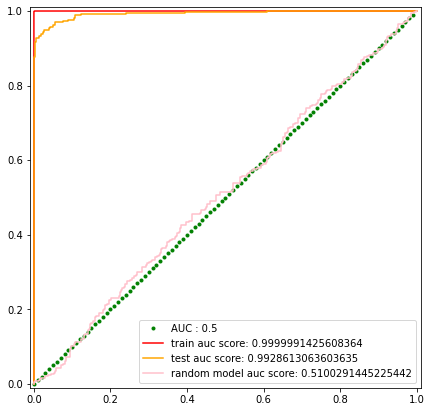

Best Threshold is 0.6039370036789226
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.9526854219948849
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.956081081081081 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.9218241042345277 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.9386401326699833 
F1 score on Random model: 0.4384724186704385 
********************************************************

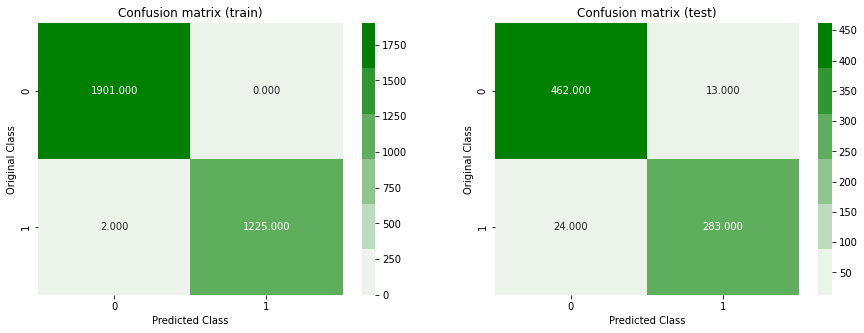

-------------------------------------------------- Precision matrix --------------------------------------------------


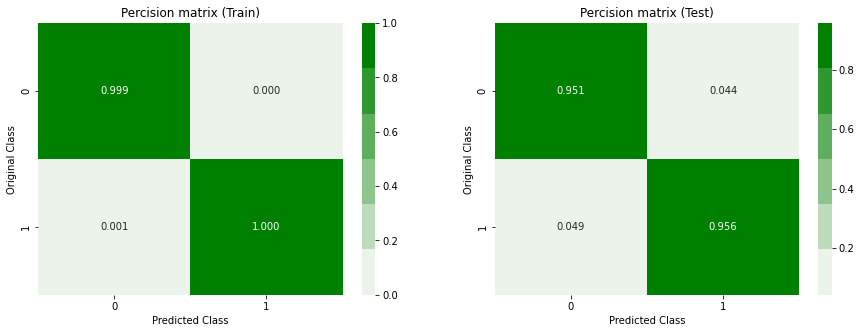

-------------------------------------------------- Recall matrix --------------------------------------------------


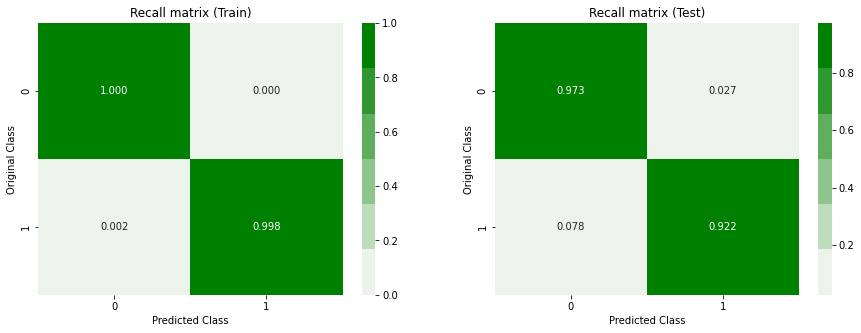

****************************************************************************************************


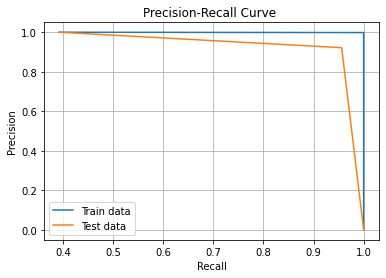

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Xgboost with decision tree as base learners

log_loss for c =  10 is 0.15297447768009267
log_loss for c =  50 is 0.11981869015822101
log_loss for c =  100 is 0.11654205819555802
log_loss for c =  500 is 0.1187555480282634
log_loss for c =  1000 is 0.12222265706449742
log_loss for c =  2000 is 0.12383101971319119


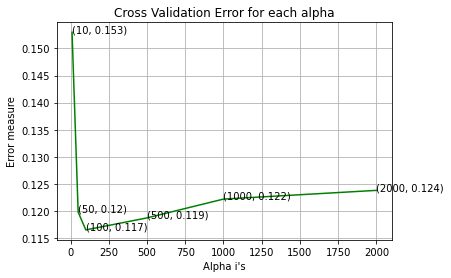

For values of best alpha =  100 The train log loss is: 0.05078602434326182
For values of best alpha =  100 The cross validation log loss is: 0.11654205819555802
Train AUC score: 0.9999194007186198
Test AUC score: 0.9926144351105778
Random model AUC score: 0.5100291445225442


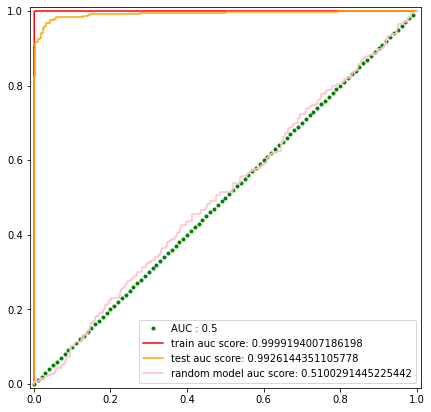

Best Threshold is 0.7018098190426827
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

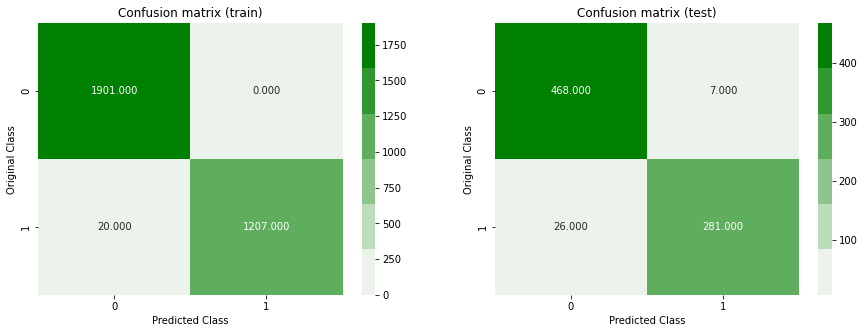

-------------------------------------------------- Precision matrix --------------------------------------------------


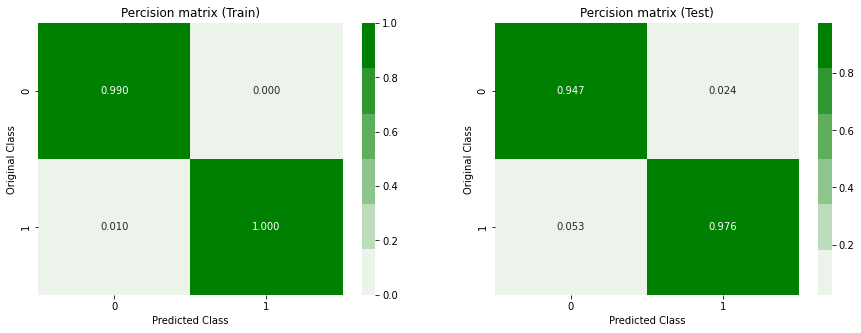

-------------------------------------------------- Recall matrix --------------------------------------------------


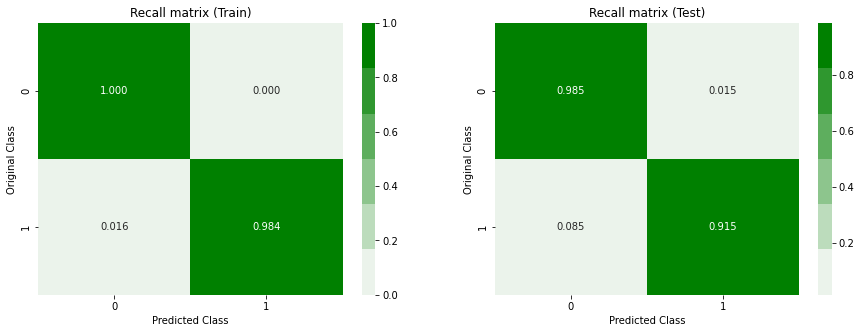

****************************************************************************************************


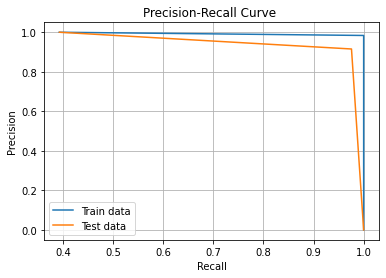

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

XGboost with linear base learners

log_loss for c =  10 is 0.15297447768009267
log_loss for c =  50 is 0.11981869015822101
log_loss for c =  100 is 0.11654205819555802
log_loss for c =  500 is 0.1187555480282634
log_loss for c =  1000 is 0.12222265706449742
log_loss for c =  2000 is 0.12383101971319119


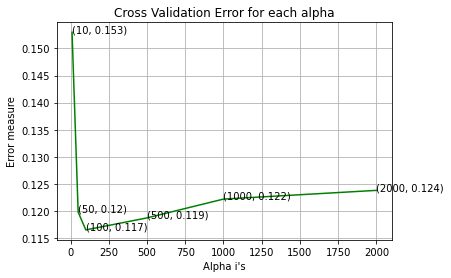

For values of best alpha =  100 The train log loss is: 0.05078602434326182
For values of best alpha =  100 The cross validation log loss is: 0.11654205819555802
Train AUC score: 0.9999194007186198
Test AUC score: 0.9926144351105778
Random model AUC score: 0.5100291445225442


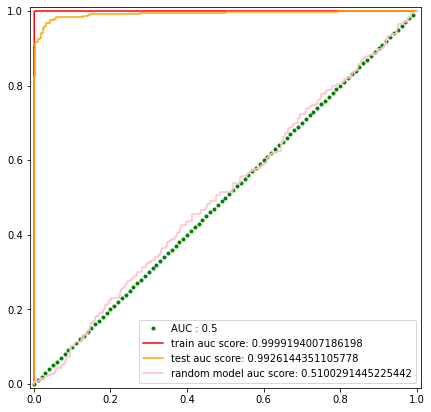

Best Threshold is 0.7018098190426827
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

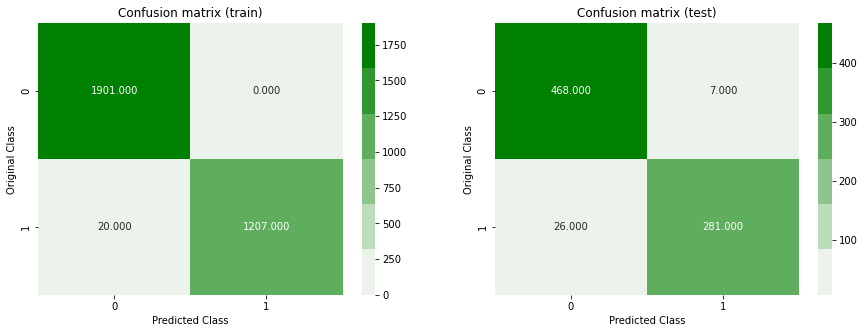

-------------------------------------------------- Precision matrix --------------------------------------------------


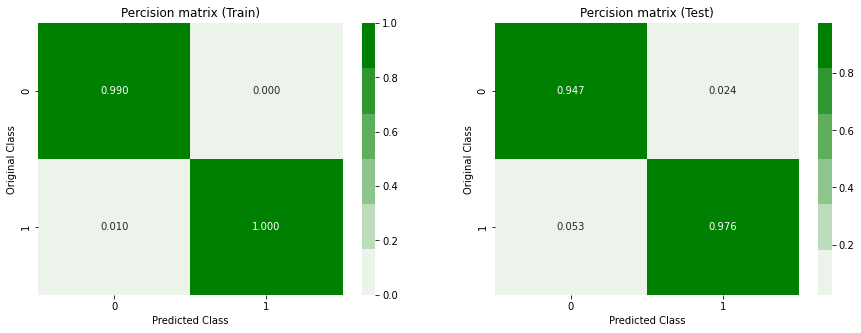

-------------------------------------------------- Recall matrix --------------------------------------------------


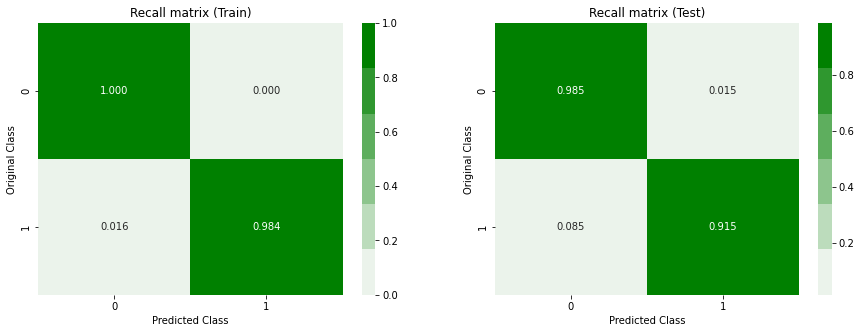

****************************************************************************************************


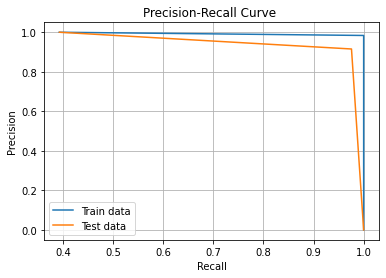

*** Random model ***
                   auc  accuracy  precision    recall   f1score   logloss
random_model  0.510029  0.492327     0.3875  0.504886  0.438472  1.016232
*** ML models ***
                                      auc (train)  auc (test)  \
weighted knn with cosine distance        0.999999    0.966813   
uniform knn with cosine distance         0.991451    0.954867   
weighted knn with minkowski distance     0.999999    0.970098   
weighted knn with cosine distance        0.999999    0.966813   
Logistic Regression                      0.975008    0.964732   
Random Forest                            0.999999    0.992861   
XGBoost                                  0.999919    0.992614   
XGboost linear base learners             0.999919    0.992614   

                                      accuracy (train)  accuracy (test)  \
weighted knn with cosine distance             0.974425         0.900256   
uniform knn with cosine distance              0.944693         0.900256   
we

In [36]:
random_model,metrics=train_all_models(X_train_robust,y_train,X_val_robust,y_val)

In [37]:
metrics

,auc (train),auc (test),accuracy (train),accuracy (test),precision (train),precision (test),recall (train),recall (test),f1score (train),f1score (test),logloss (train),logloss (test),Percentage of misclassified pts (Train),Percentage of missclassified pts (Test)
weighted knn with cosine distance,0.999999,0.966813,0.974425,0.900256,1.000000,0.919414,0.934800,0.817590,0.966302,0.865517,0.067103,0.225984,2.557545,9.974425
uniform knn with cosine distance,0.991451,0.954867,0.944693,0.900256,0.949659,0.875410,0.907090,0.869707,0.927887,0.872549,0.153999,0.253698,5.530691,9.974425
weighted knn with minkowski distance,0.999999,0.970098,0.991049,0.897698,1.000000,0.931559,0.977180,0.798046,0.988458,0.859649,0.070555,0.225970,0.895141,10.230179
weighted knn with cosine distance,0.999999,0.966813,0.974425,0.900256,1.000000,0.919414,0.934800,0.817590,0.966302,0.865517,0.067103,0.225984,2.557545,9.974425
Logistic Regression,0.975008,0.964732,0.909527,0.902813,0.942777,0.945946,0.819071,0.798046,0.876581,0.865724,0.221291,0.259192,9.047315,9.718670
Random Forest,0.999999,0.992861,0.999361,0.952685,1.000000,0.956081,0.998370,0.921824,0.999184,0.938640,0.035805,0.116691,0.063939,4.731458
XGBoost,0.999919,0.992614,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050786,0.116542,0.639386,4.219949
XGboost linear base learners,0.999919,0.992614,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050786,0.116542,0.639386,4.219949


In [38]:
all_models_metrics["Robust scaler"]=metrics

### seeing log loss on test data on distance based models , we can say Robust scaler is working better than minmax scaler and standardizer this is because the dataset may contains some outliers. Robust Scaler is some what resistant to outliers

### Transforming data with log (most of the features looks like power law distribution (approximately) so applying log)

In [39]:
log_X_train=np.log(X_train+0.00001) # adding some value because log(0) is inf
log_X_val=np.log(X_val+0.00001)

In [40]:
log_X_train=np.hstack([log_X_train,X_train])
log_X_val=np.hstack([log_X_val,X_val])

In [41]:
scaler=MinMaxScaler()
log_X_train_minmax=scaler.fit_transform(log_X_train)
log_X_val_minmax=scaler.transform(log_X_val)


Normal KNN (minkowski distance)

log_loss for k =  1 is 0.21031931483730304
log_loss for k =  3 is 0.17015402189708842
log_loss for k =  5 is 0.16406324537575437
log_loss for k =  7 is 0.15857626410901784
log_loss for k =  9 is 0.15863491200618235
log_loss for k =  11 is 0.15929730479349344
log_loss for k =  13 is 0.16073277068856417
log_loss for k =  15 is 0.16072257133874135
log_loss for k =  17 is 0.16128952015966888
log_loss for k =  19 is 0.1628691700955471
log_loss for k =  21 is 0.1627630494906856
log_loss for k =  23 is 0.16456257435327196


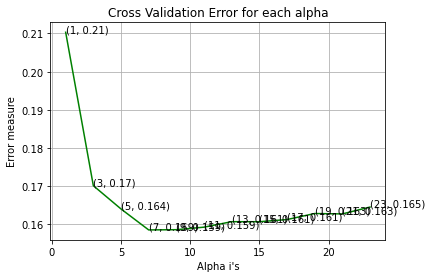

For values of best alpha =  7 The train log loss is: 0.043296729589209645
For values of best alpha =  7 The cross validation log loss is: 0.15857626410901784
Train AUC score: 0.9999991425608364
Test AUC score: 0.9831373221326933
Random model AUC score: 0.5100291445225442


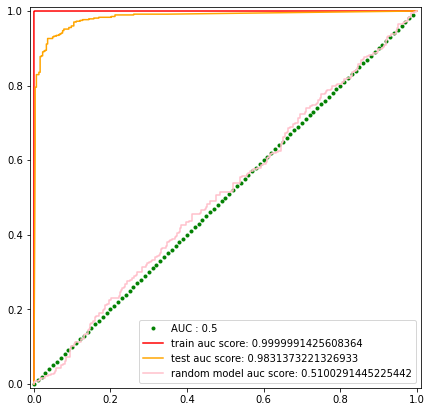

Best Threshold is 0.7934011661211169
****************************************************************************************************
Accuracy on train data : 0.9843350383631714
Accuracy on test data : 0.9309462915601023
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9633699633699634 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9600651996740016 
Recall on test data: 0.8566775244299675 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9796257796257797 
F1 score on test data: 0.906896551724138 
F1 score on Random model: 0.4384724186704385 
*******************************************************

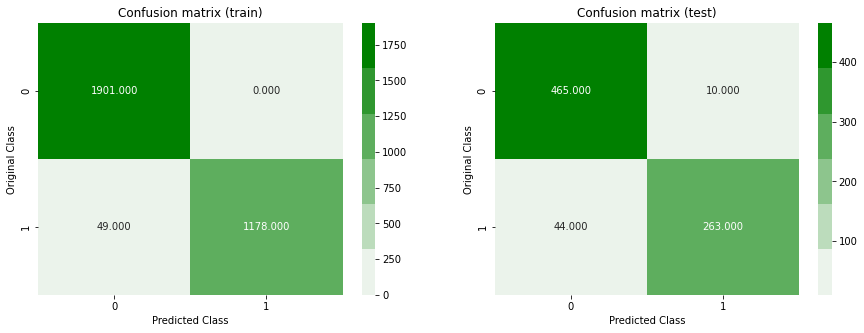

-------------------------------------------------- Precision matrix --------------------------------------------------


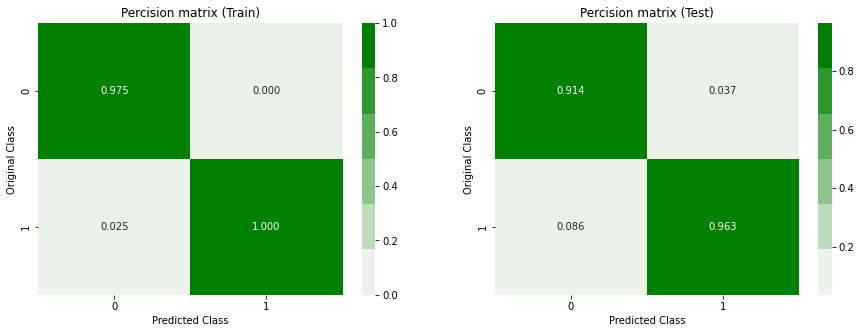

-------------------------------------------------- Recall matrix --------------------------------------------------


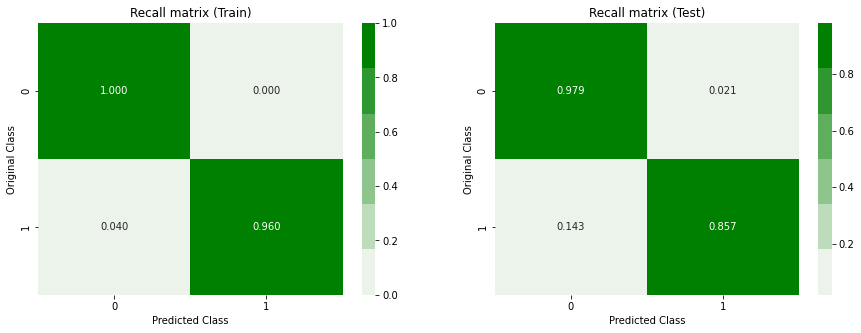

****************************************************************************************************


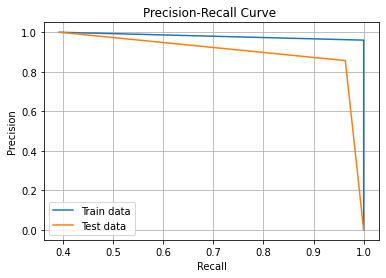

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Normal KNN (cosine distance)

log_loss for k =  1 is 0.21031931483730304
log_loss for k =  3 is 0.17781355763209675
log_loss for k =  5 is 0.17787051962395742
log_loss for k =  7 is 0.1737970811389249
log_loss for k =  9 is 0.17427517602456635
log_loss for k =  11 is 0.17492135882097787
log_loss for k =  13 is 0.17642613730146514
log_loss for k =  15 is 0.17739905832927233
log_loss for k =  17 is 0.17958319142682033
log_loss for k =  19 is 0.18382579427113355
log_loss for k =  21 is 0.18445183052283634
log_loss for k =  23 is 0.18717229952196665


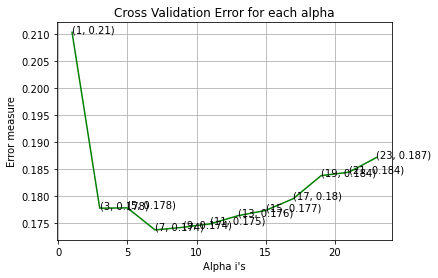

For values of best alpha =  7 The train log loss is: 0.1427812241336458
For values of best alpha =  7 The cross validation log loss is: 0.1737970811389249
Train AUC score: 0.9899398806530428
Test AUC score: 0.980305160294874
Random model AUC score: 0.5100291445225442


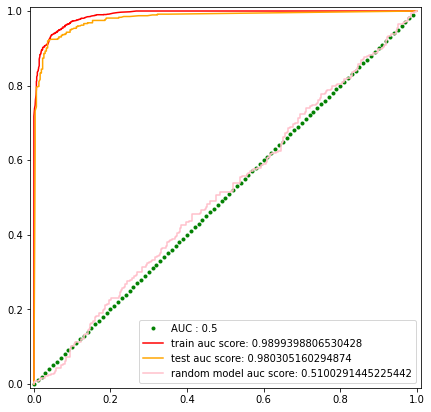

Best Threshold is 0.6853219567044653
****************************************************************************************************
Accuracy on train data : 0.9440537084398977
Accuracy on test data : 0.9271099744245525
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9565972222222222 
Precession on test data: 0.9401408450704225 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.8981255093724532 
Recall on test data: 0.8697068403908795 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9264396805380413 
F1 score on test data: 0.9035532994923859 
F1 score on Random model: 0.4384724186704385 
***************************************

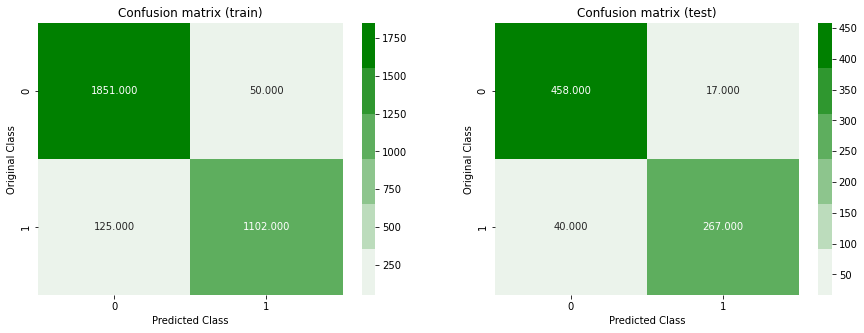

-------------------------------------------------- Precision matrix --------------------------------------------------


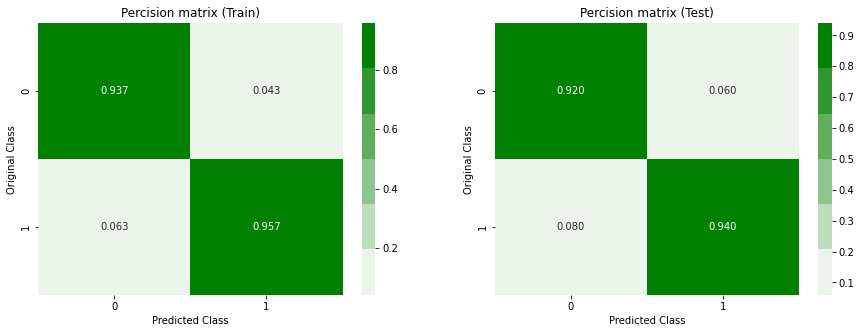

-------------------------------------------------- Recall matrix --------------------------------------------------


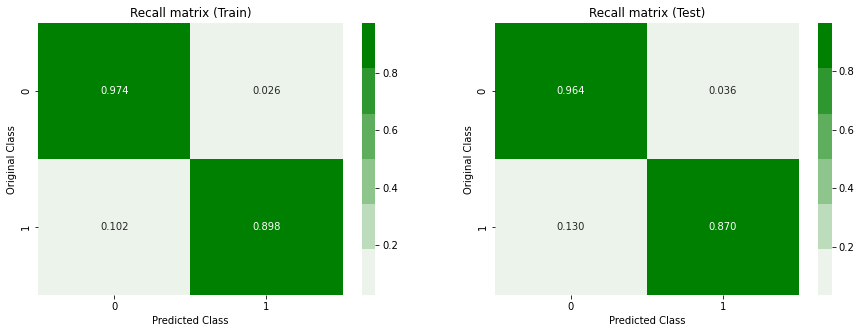

****************************************************************************************************


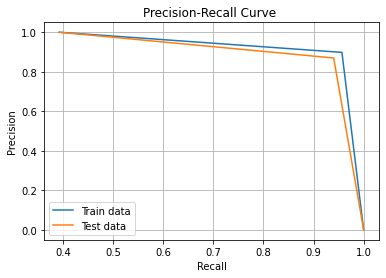

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (minkowski distance)

log_loss for k =  1 is 0.21516095954597939
log_loss for k =  3 is 0.1750324460570644
log_loss for k =  5 is 0.16811138991235783
log_loss for k =  7 is 0.16445873386800972
log_loss for k =  9 is 0.16682474464819091
log_loss for k =  11 is 0.17238601190433822
log_loss for k =  13 is 0.17499627523929265
log_loss for k =  15 is 0.17489126424474172
log_loss for k =  17 is 0.1753877108728555
log_loss for k =  19 is 0.17498776171567107
log_loss for k =  21 is 0.17603457910676767
log_loss for k =  23 is 0.1779865645243527


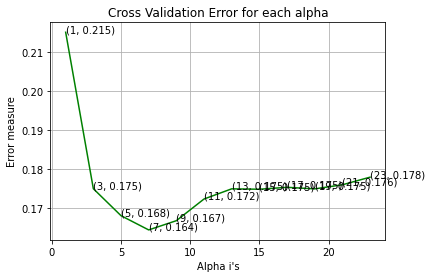

For values of best alpha =  7 The train log loss is: 0.043988554915825595
For values of best alpha =  7 The cross validation log loss is: 0.16445873386800972
Train AUC score: 0.9999991425608364
Test AUC score: 0.9852220126864393
Random model AUC score: 0.5100291445225442


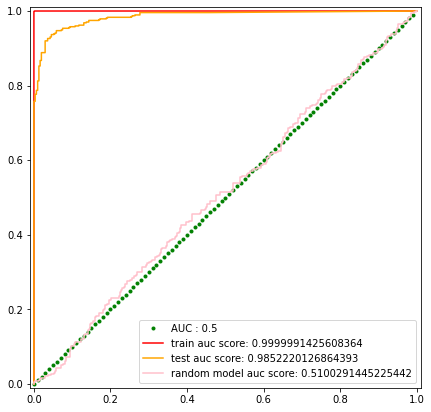

Best Threshold is 0.7844452976278655
****************************************************************************************************
Accuracy on train data : 0.9916879795396419
Accuracy on test data : 0.9207161125319693
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9553903345724907 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9788101059494703 
Recall on test data: 0.8371335504885994 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9892915980230642 
F1 score on test data: 0.892361111111111 
F1 score on Random model: 0.4384724186704385 
*******************************************************

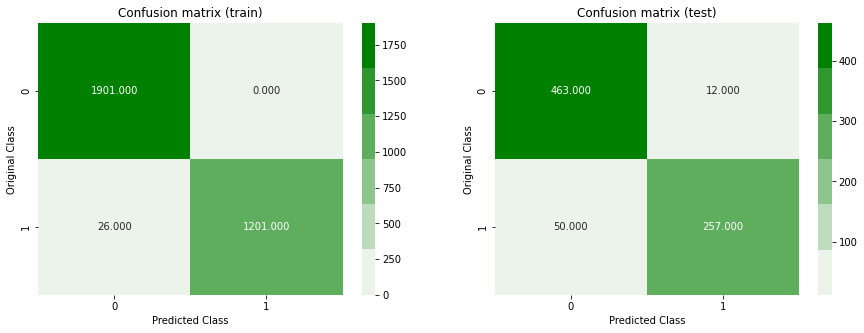

-------------------------------------------------- Precision matrix --------------------------------------------------


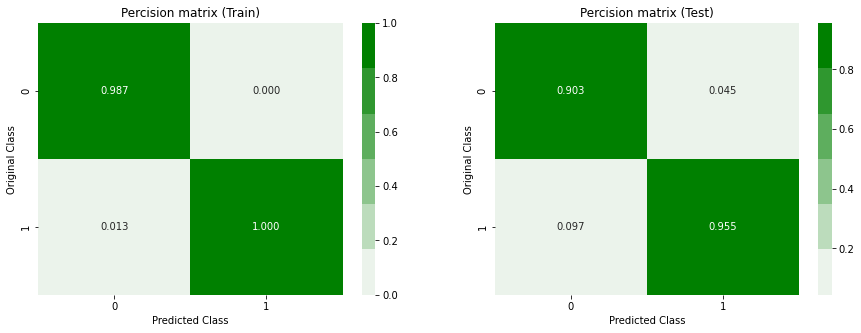

-------------------------------------------------- Recall matrix --------------------------------------------------


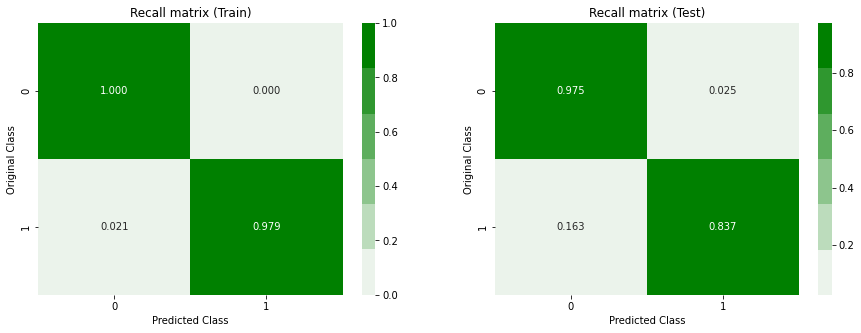

****************************************************************************************************


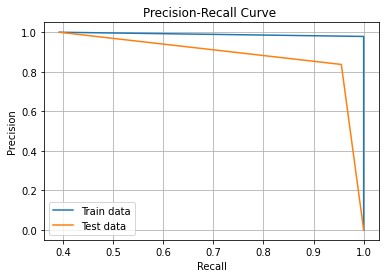

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (cosine distance)

log_loss for k =  1 is 0.21031931483730304
log_loss for k =  3 is 0.17015402189708842
log_loss for k =  5 is 0.16406324537575437
log_loss for k =  7 is 0.15857626410901784
log_loss for k =  9 is 0.15863491200618235
log_loss for k =  11 is 0.15929730479349344
log_loss for k =  13 is 0.16073277068856417
log_loss for k =  15 is 0.16072257133874135
log_loss for k =  17 is 0.16128952015966888
log_loss for k =  19 is 0.1628691700955471
log_loss for k =  21 is 0.1627630494906856
log_loss for k =  23 is 0.16456257435327196


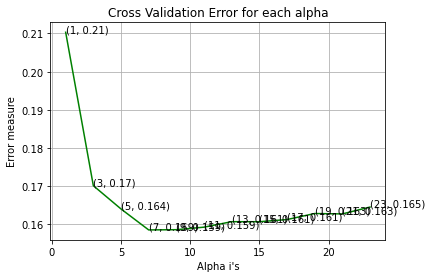

For values of best alpha =  7 The train log loss is: 0.043296729589209645
For values of best alpha =  7 The cross validation log loss is: 0.15857626410901784
Train AUC score: 0.9999991425608364
Test AUC score: 0.9831373221326933
Random model AUC score: 0.5100291445225442


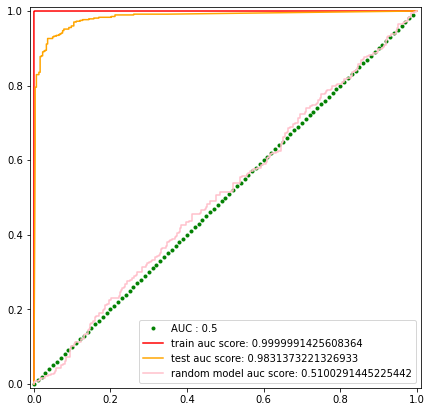

Best Threshold is 0.7934011661211169
****************************************************************************************************
Accuracy on train data : 0.9843350383631714
Accuracy on test data : 0.9309462915601023
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9633699633699634 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9600651996740016 
Recall on test data: 0.8566775244299675 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9796257796257797 
F1 score on test data: 0.906896551724138 
F1 score on Random model: 0.4384724186704385 
*******************************************************

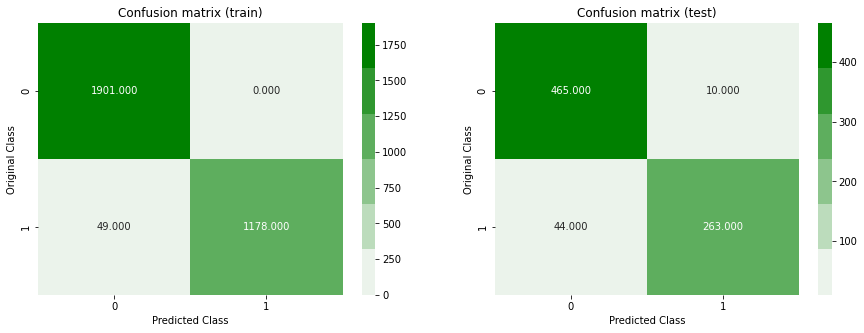

-------------------------------------------------- Precision matrix --------------------------------------------------


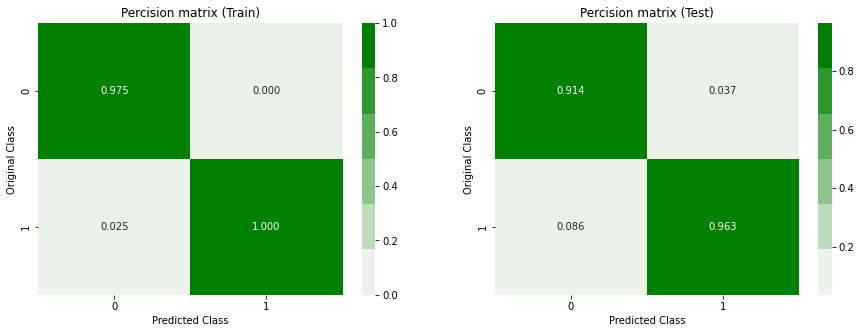

-------------------------------------------------- Recall matrix --------------------------------------------------


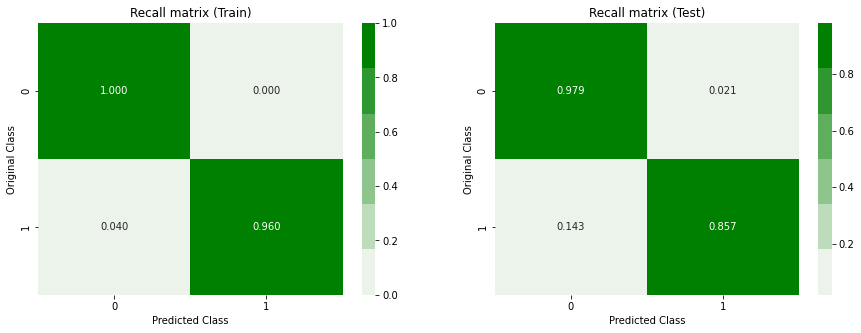

****************************************************************************************************


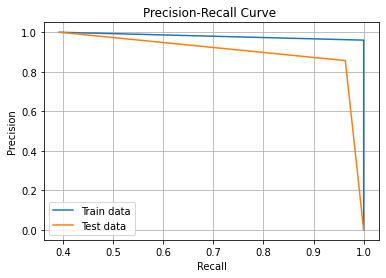

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Logistic Regression

log_loss for c =  1e-05 is 0.3132713611921225
log_loss for c =  0.0001 is 0.3103670158097255
log_loss for c =  0.001 is 0.28803373929132403
log_loss for c =  0.01 is 0.22302999912630295
log_loss for c =  0.1 is 0.16754324477204258
log_loss for c =  1 is 0.14996007433396738
log_loss for c =  10 is 0.14794047743721997
log_loss for c =  100 is 0.1501522967609487
log_loss for c =  1000 is 0.1533218731491883


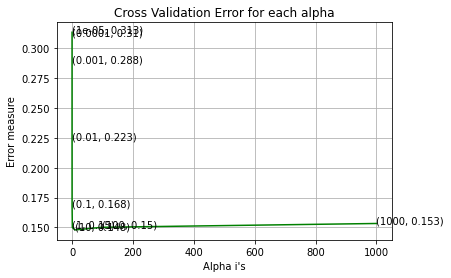

log loss for train data 0.1404148532365409
log loss for cv data 0.14794047743721997
Train AUC score: 0.9879589818252907
Test AUC score: 0.9870735470598321
Random model AUC score: 0.5100291445225442


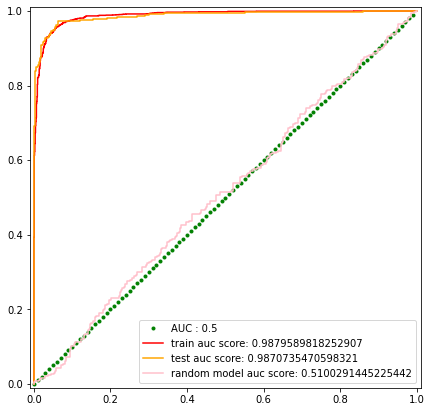

Best Threshold is 0.5744725486163997
****************************************************************************************************
Accuracy on train data : 0.9498081841432225
Accuracy on test data : 0.9526854219948849
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9549319727891157 
Precession on test data: 0.956081081081081 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9152404237978811 
Recall on test data: 0.9218241042345277 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9346650020807324 
F1 score on test data: 0.9386401326699833 
F1 score on Random model: 0.4384724186704385 
****************************************

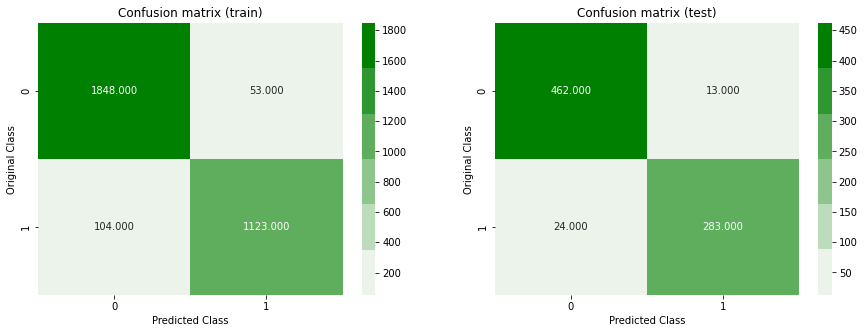

-------------------------------------------------- Precision matrix --------------------------------------------------


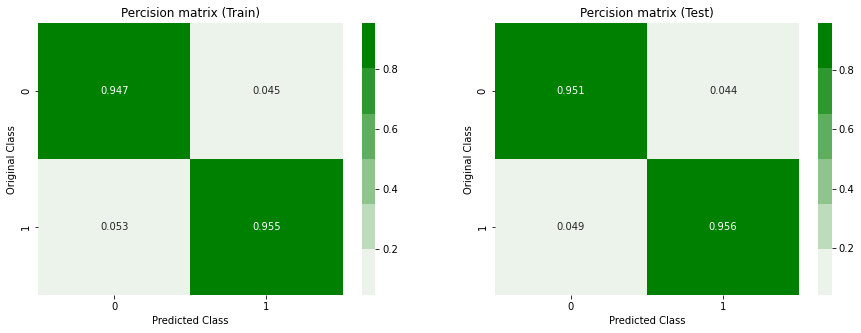

-------------------------------------------------- Recall matrix --------------------------------------------------


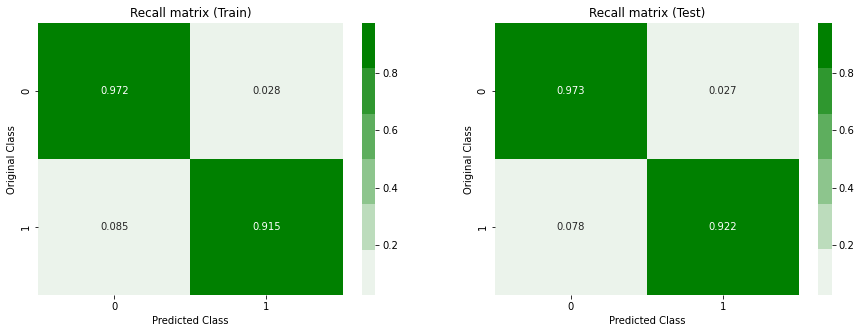

****************************************************************************************************


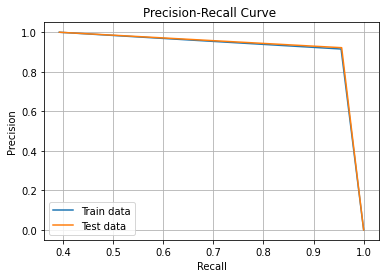

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Random Forest

log_loss for c =  10 is 0.13095607641202595
log_loss for c =  50 is 0.11940577776997113
log_loss for c =  100 is 0.12172287924906633
log_loss for c =  500 is 0.11998846032541054
log_loss for c =  1000 is 0.12070498732002077
log_loss for c =  2000 is 0.12038608494764885
log_loss for c =  3000 is 0.12036425767495354


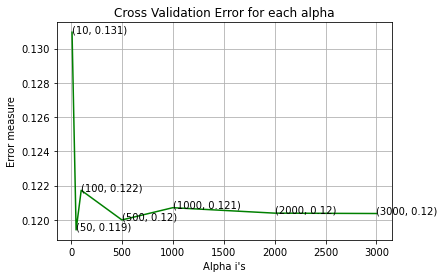

For values of best alpha =  50 The train log loss is: 0.040522717961309705
For values of best alpha =  50 The cross validation log loss is: 0.11940577776997113
Train AUC score: 0.9999982851216729
Test AUC score: 0.9926281501800102
Random model AUC score: 0.5100291445225442


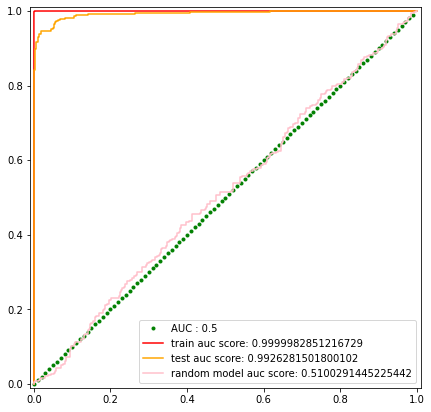

Best Threshold is 0.6240662469566213
****************************************************************************************************
Accuracy on train data : 0.9971227621483376
Accuracy on test data : 0.9539641943734015
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9688581314878892 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9926650366748166 
Recall on test data: 0.9120521172638436 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.996319018404908 
F1 score on test data: 0.9395973154362416 
F1 score on Random model: 0.4384724186704385 
*******************************************************

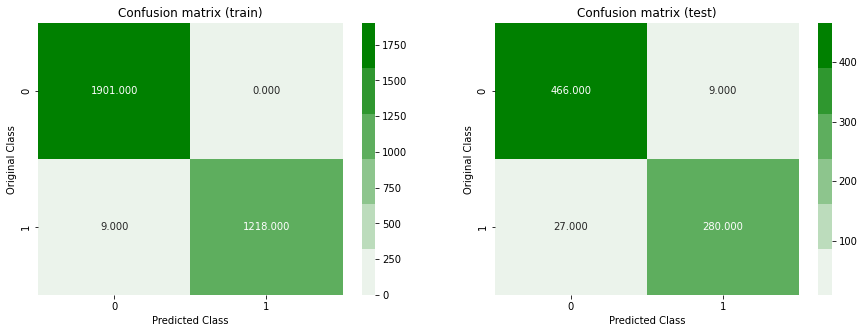

-------------------------------------------------- Precision matrix --------------------------------------------------


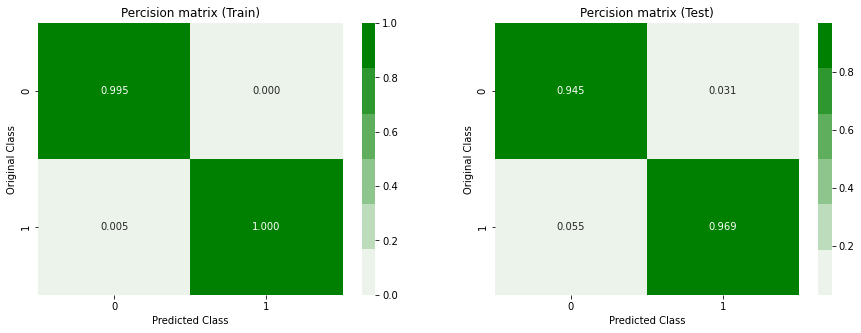

-------------------------------------------------- Recall matrix --------------------------------------------------


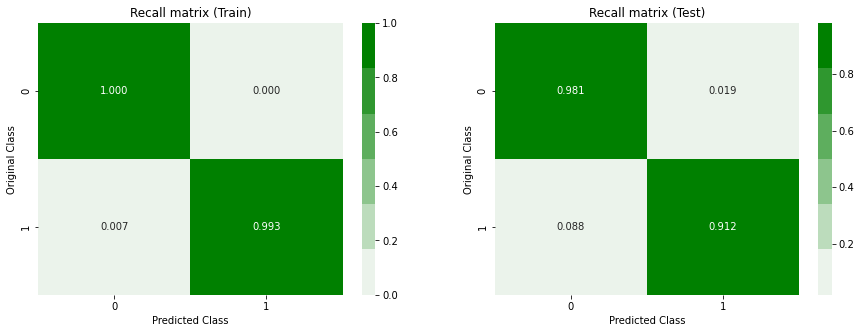

****************************************************************************************************


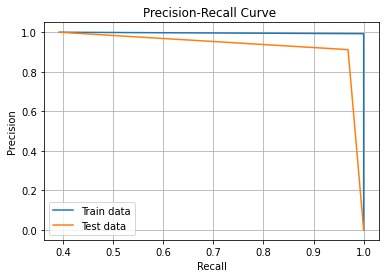

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Xgboost with decision tree as base learners

log_loss for c =  10 is 0.153004005115626
log_loss for c =  50 is 0.11993969542414233
log_loss for c =  100 is 0.11665691085315447
log_loss for c =  500 is 0.11921788856531747
log_loss for c =  1000 is 0.12282942800578645
log_loss for c =  2000 is 0.12428399521499318


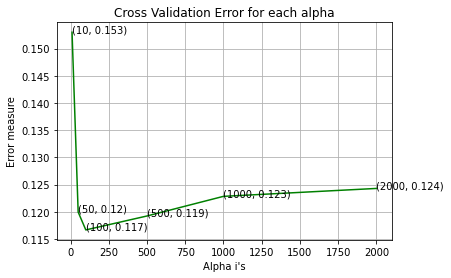

For values of best alpha =  100 The train log loss is: 0.050628257680240915
For values of best alpha =  100 The cross validation log loss is: 0.11665691085315447
Train AUC score: 0.9999198294382017
Test AUC score: 0.9926075775758615
Random model AUC score: 0.5100291445225442


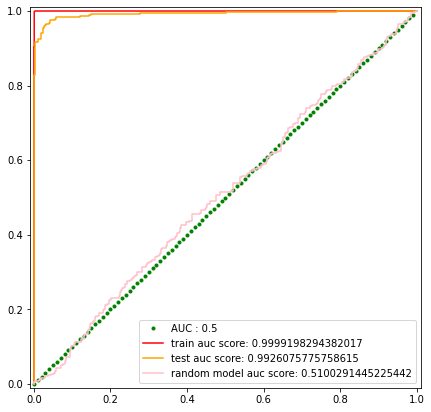

Best Threshold is 0.701716797053814
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
*******************************************************

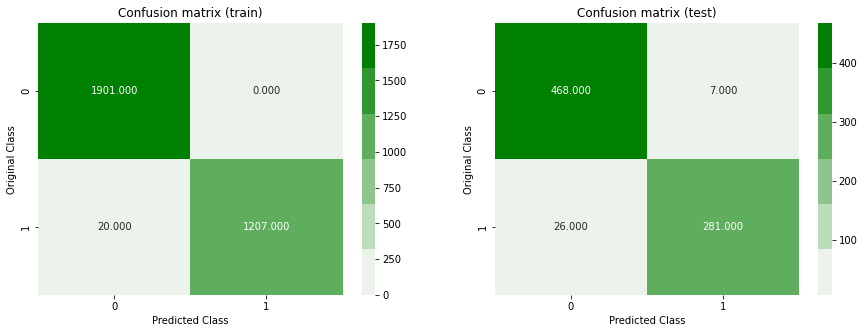

-------------------------------------------------- Precision matrix --------------------------------------------------


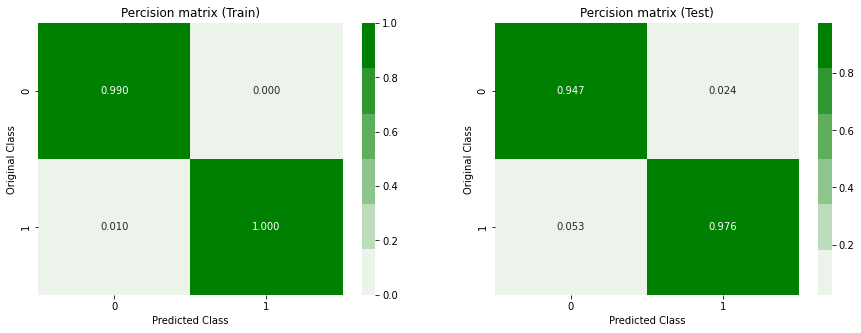

-------------------------------------------------- Recall matrix --------------------------------------------------


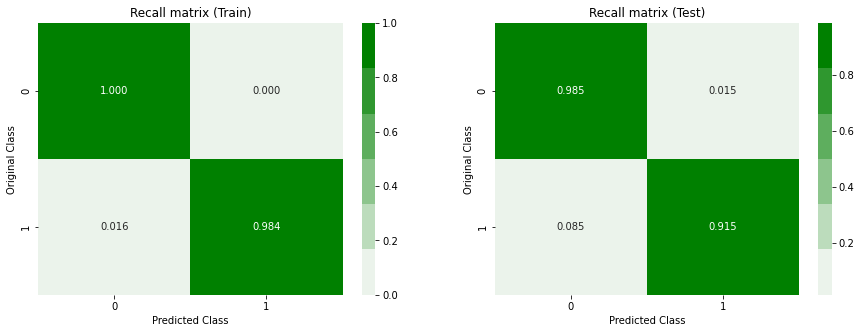

****************************************************************************************************


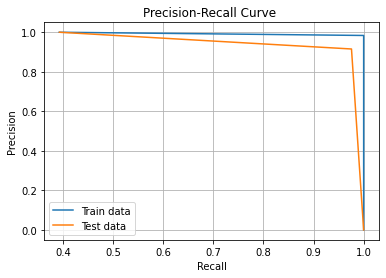

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

XGboost with linear base learners

log_loss for c =  10 is 0.153004005115626
log_loss for c =  50 is 0.11993969542414233
log_loss for c =  100 is 0.11665691085315447
log_loss for c =  500 is 0.11921788856531747
log_loss for c =  1000 is 0.12282942800578645
log_loss for c =  2000 is 0.12428399521499318


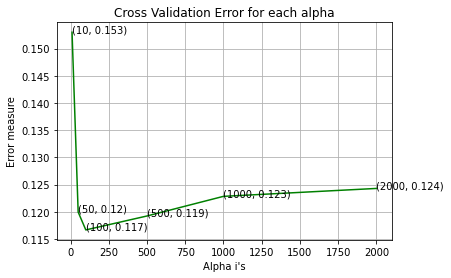

For values of best alpha =  100 The train log loss is: 0.050628257680240915
For values of best alpha =  100 The cross validation log loss is: 0.11665691085315447
Train AUC score: 0.9999198294382017
Test AUC score: 0.9926075775758615
Random model AUC score: 0.5100291445225442


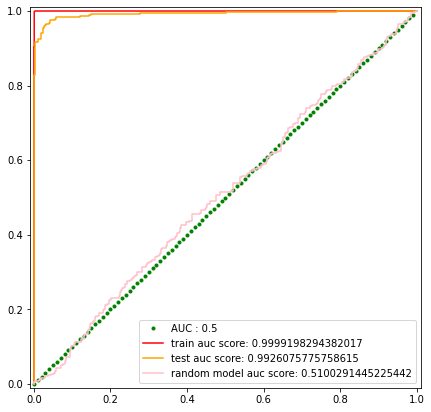

Best Threshold is 0.701716797053814
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
*******************************************************

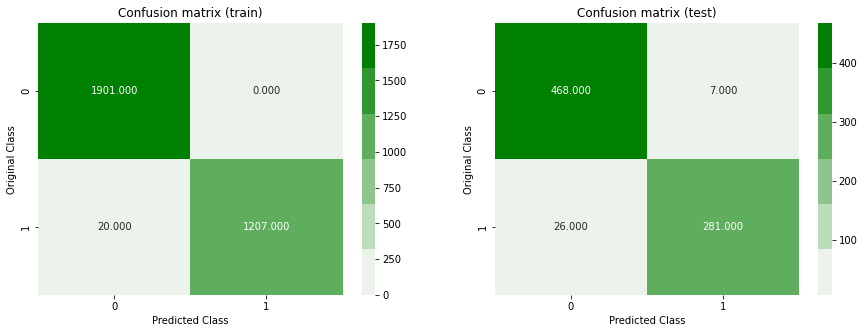

-------------------------------------------------- Precision matrix --------------------------------------------------


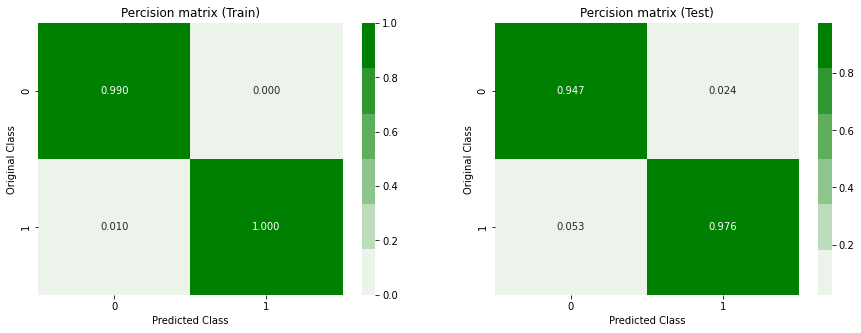

-------------------------------------------------- Recall matrix --------------------------------------------------


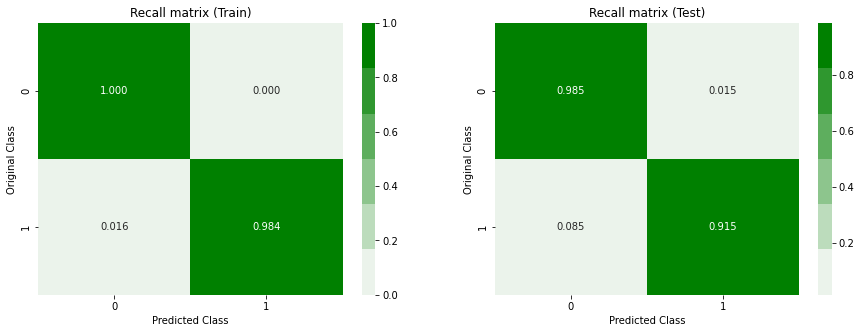

****************************************************************************************************


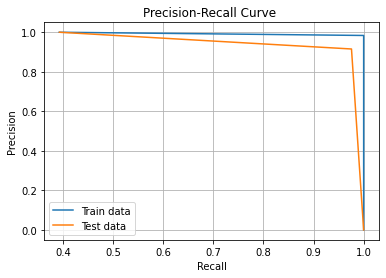

*** Random model ***
                   auc  accuracy  precision    recall   f1score   logloss
random_model  0.510029  0.492327     0.3875  0.504886  0.438472  1.016232
*** ML models ***
                                      auc (train)  auc (test)  \
weighted knn with cosine distance        0.999999    0.983137   
uniform knn with cosine distance         0.989940    0.980305   
weighted knn with minkowski distance     0.999999    0.985222   
weighted knn with cosine distance        0.999999    0.983137   
Logistic Regression                      0.987959    0.987074   
Random Forest                            0.999998    0.992628   
XGBoost                                  0.999920    0.992608   
XGboost linear base learners             0.999920    0.992608   

                                      accuracy (train)  accuracy (test)  \
weighted knn with cosine distance             0.984335         0.930946   
uniform knn with cosine distance              0.944054         0.927110   
we

In [42]:
random_model,metrics=train_all_models(log_X_train_minmax,y_train,log_X_val_minmax,y_val)

In [43]:
metrics

,auc (train),auc (test),accuracy (train),accuracy (test),precision (train),precision (test),recall (train),recall (test),f1score (train),f1score (test),logloss (train),logloss (test),Percentage of misclassified pts (Train),Percentage of missclassified pts (Test)
weighted knn with cosine distance,0.999999,0.983137,0.984335,0.930946,1.000000,0.963370,0.960065,0.856678,0.979626,0.906897,0.043297,0.158576,1.566496,6.905371
uniform knn with cosine distance,0.989940,0.980305,0.944054,0.927110,0.956597,0.940141,0.898126,0.869707,0.926440,0.903553,0.142781,0.173797,5.594629,7.289003
weighted knn with minkowski distance,0.999999,0.985222,0.991688,0.920716,1.000000,0.955390,0.978810,0.837134,0.989292,0.892361,0.043989,0.164459,0.831202,7.928389
weighted knn with cosine distance,0.999999,0.983137,0.984335,0.930946,1.000000,0.963370,0.960065,0.856678,0.979626,0.906897,0.043297,0.158576,1.566496,6.905371
Logistic Regression,0.987959,0.987074,0.949808,0.952685,0.954932,0.956081,0.915240,0.921824,0.934665,0.938640,0.140415,0.147940,5.019182,4.731458
Random Forest,0.999998,0.992628,0.997123,0.953964,1.000000,0.968858,0.992665,0.912052,0.996319,0.939597,0.040523,0.119406,0.287724,4.603581
XGBoost,0.999920,0.992608,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050628,0.116657,0.639386,4.219949
XGboost linear base learners,0.999920,0.992608,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050628,0.116657,0.639386,4.219949


In [44]:
all_models_metrics["Log transformed MinMax scaled"]=metrics

### Transforming data with log decreased test log loss to Distance based models like linear models and KNN 

### Applying Log transformation for robust scaler 

In [45]:
log_X_train=np.log(X_train+0.00001) # adding some value because log(0) is inf
log_X_val=np.log(X_val+0.00001)

In [46]:
log_X_train=np.hstack([log_X_train,X_train])
log_X_val=np.hstack([log_X_val,X_val])

In [47]:
scale=RobustScaler()
log_X_train_robust=scale.fit_transform(log_X_train)
log_X_val_robust=scale.transform(log_X_val)


Normal KNN (minkowski distance)

log_loss for k =  1 is 0.21993661936543624
log_loss for k =  3 is 0.19385975927934393
log_loss for k =  5 is 0.18981877838526773
log_loss for k =  7 is 0.18788322905535207
log_loss for k =  9 is 0.1864110911987877
log_loss for k =  11 is 0.18671012600947398
log_loss for k =  13 is 0.18720362521788847
log_loss for k =  15 is 0.1888823845556651
log_loss for k =  17 is 0.1880917019440501
log_loss for k =  19 is 0.18810016054684642
log_loss for k =  21 is 0.18750232058713276
log_loss for k =  23 is 0.18724285058702828


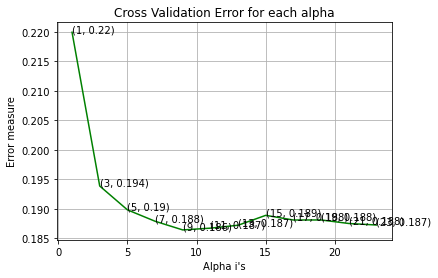

For values of best alpha =  9 The train log loss is: 0.0479871151941989
For values of best alpha =  9 The cross validation log loss is: 0.1864110911987877
Train AUC score: 0.9999991425608363
Test AUC score: 0.9793691068061031
Random model AUC score: 0.5100291445225442


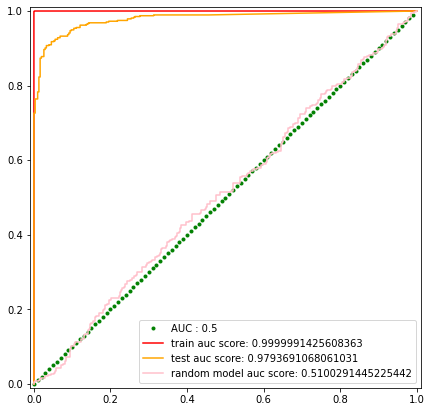

Best Threshold is 0.7863026606096015
****************************************************************************************************
Accuracy on train data : 0.9830562659846548
Accuracy on test data : 0.9168797953964194
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9448529411764706 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9568052159739201 
Recall on test data: 0.8371335504885994 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9779258642232402 
F1 score on test data: 0.8877374784110535 
F1 score on Random model: 0.4384724186704385 
******************************************************

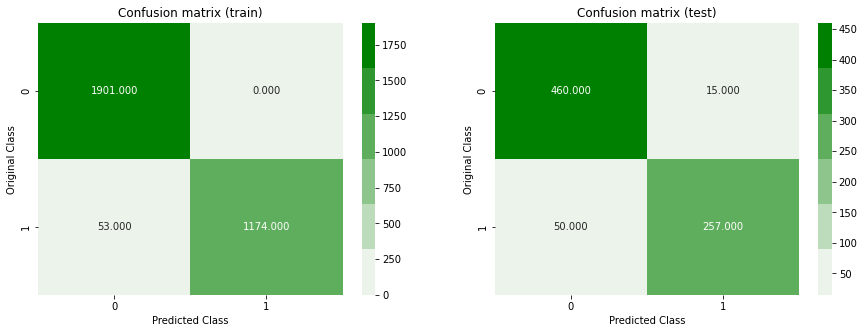

-------------------------------------------------- Precision matrix --------------------------------------------------


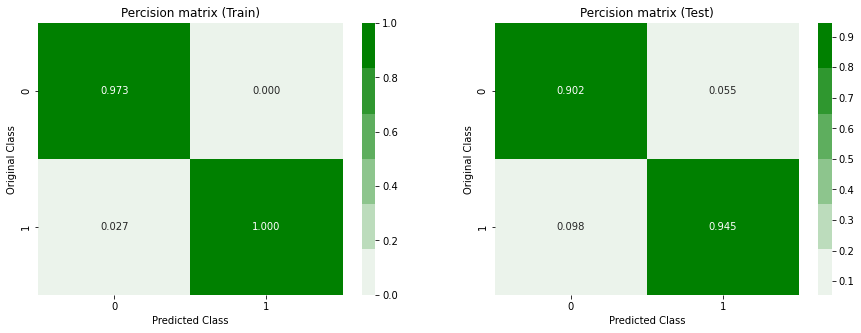

-------------------------------------------------- Recall matrix --------------------------------------------------


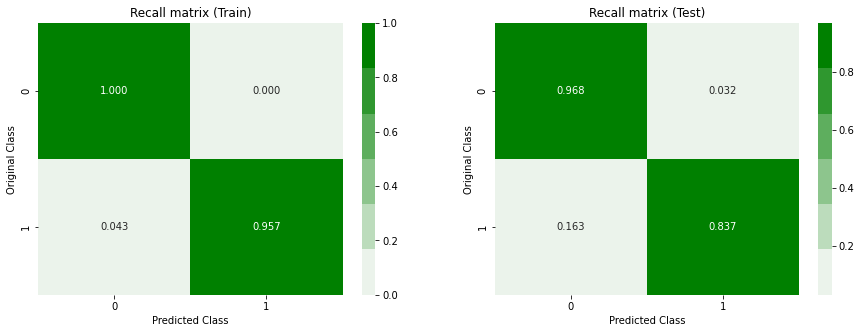

****************************************************************************************************


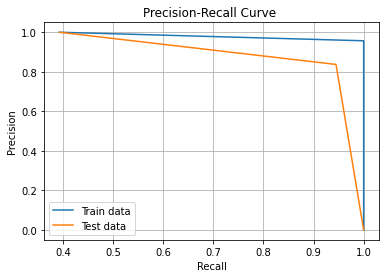

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Normal KNN (cosine distance)

log_loss for k =  1 is 0.21993661936543624
log_loss for k =  3 is 0.20432410490283123
log_loss for k =  5 is 0.20664639102085955
log_loss for k =  7 is 0.20997917371694527
log_loss for k =  9 is 0.21256898267453173
log_loss for k =  11 is 0.21450953708929
log_loss for k =  13 is 0.21600556234344565
log_loss for k =  15 is 0.21851148504607665
log_loss for k =  17 is 0.21782422265619944
log_loss for k =  19 is 0.21819785979631573
log_loss for k =  21 is 0.21790489819906048
log_loss for k =  23 is 0.21763283885538043


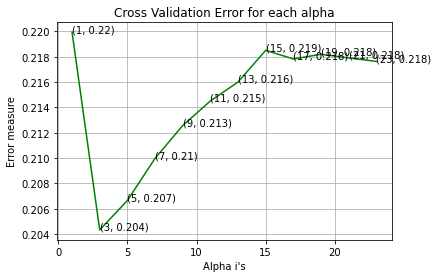

For values of best alpha =  3 The train log loss is: 0.11931820929110011
For values of best alpha =  3 The cross validation log loss is: 0.20432410490283123
Train AUC score: 0.9952409982821206
Test AUC score: 0.9697514143665351
Random model AUC score: 0.5100291445225442


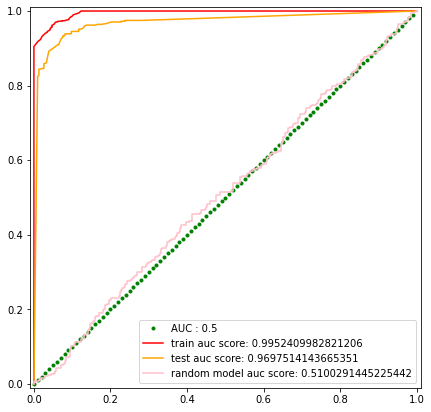

Best Threshold is 0.6206357140989229
****************************************************************************************************
Accuracy on train data : 0.9507672634271099
Accuracy on test data : 0.921994884910486
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9621016365202412 
Precession on test data: 0.9270833333333334 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9103504482477588 
Recall on test data: 0.8697068403908795 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9355108877721944 
F1 score on test data: 0.8974789915966387 
F1 score on Random model: 0.4384724186704385 
****************************************

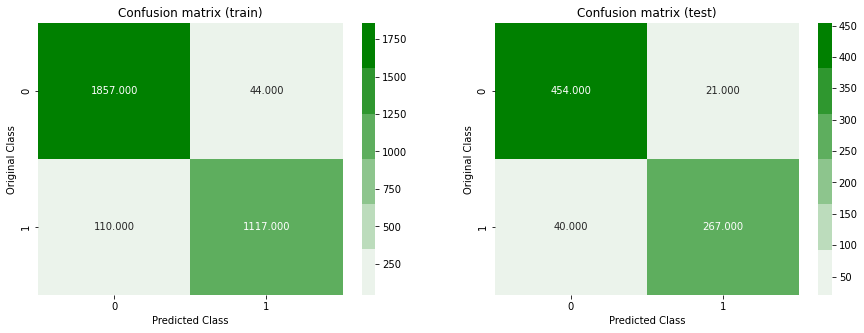

-------------------------------------------------- Precision matrix --------------------------------------------------


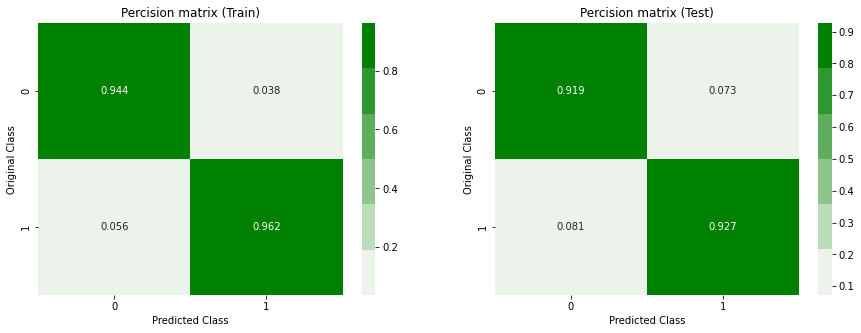

-------------------------------------------------- Recall matrix --------------------------------------------------


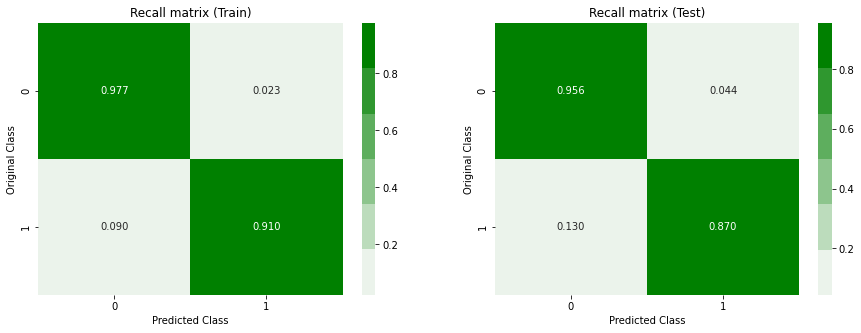

****************************************************************************************************


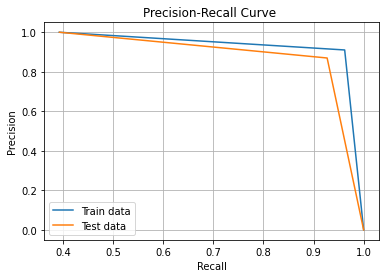

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (minkowski distance)

log_loss for k =  1 is 0.2560722040228669
log_loss for k =  3 is 0.21195167678514507
log_loss for k =  5 is 0.20115924227040996
log_loss for k =  7 is 0.19980509190843512
log_loss for k =  9 is 0.2045230169114921
log_loss for k =  11 is 0.20720808048221892
log_loss for k =  13 is 0.2051500906598717
log_loss for k =  15 is 0.20273167970889805
log_loss for k =  17 is 0.2021221425947257
log_loss for k =  19 is 0.19876974847262643
log_loss for k =  21 is 0.19512358724367496
log_loss for k =  23 is 0.19336347703451431


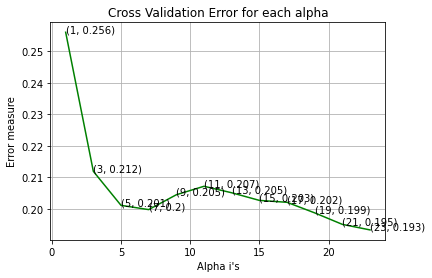

For values of best alpha =  23 The train log loss is: 0.03943089889877793
For values of best alpha =  23 The cross validation log loss is: 0.19336347703451431
Train AUC score: 0.9999991425608364
Test AUC score: 0.9793588205040288
Random model AUC score: 0.5100291445225442


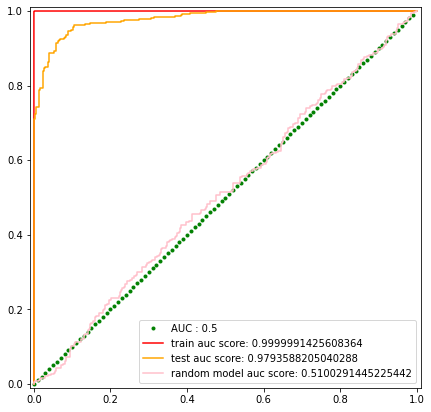

Best Threshold is 0.7871846027380937
****************************************************************************************************
Accuracy on train data : 0.9987212276214834
Accuracy on test data : 0.9053708439897699
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.946360153256705 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9967400162999185 
Recall on test data: 0.8045602605863192 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9983673469387755 
F1 score on test data: 0.869718309859155 
F1 score on Random model: 0.4384724186704385 
********************************************************

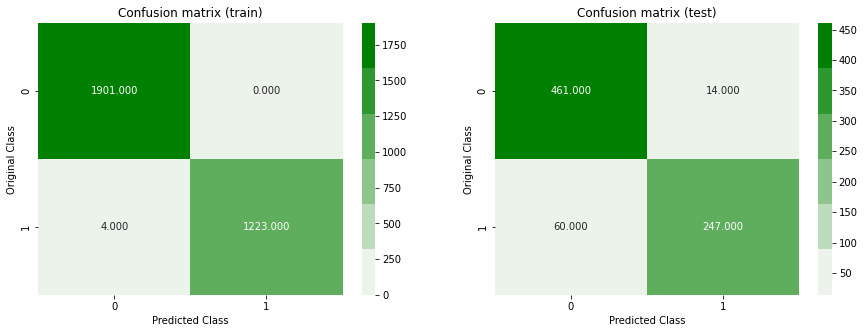

-------------------------------------------------- Precision matrix --------------------------------------------------


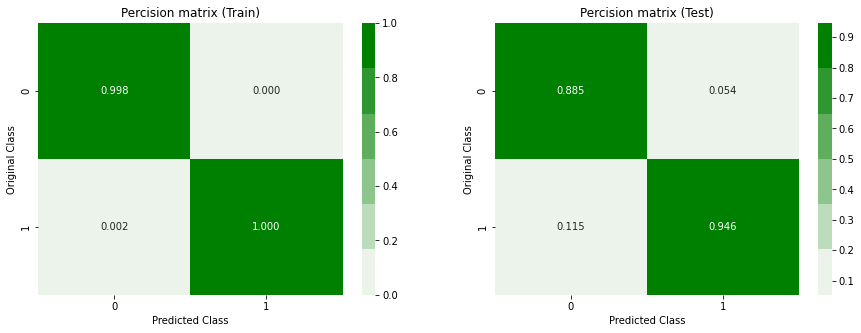

-------------------------------------------------- Recall matrix --------------------------------------------------


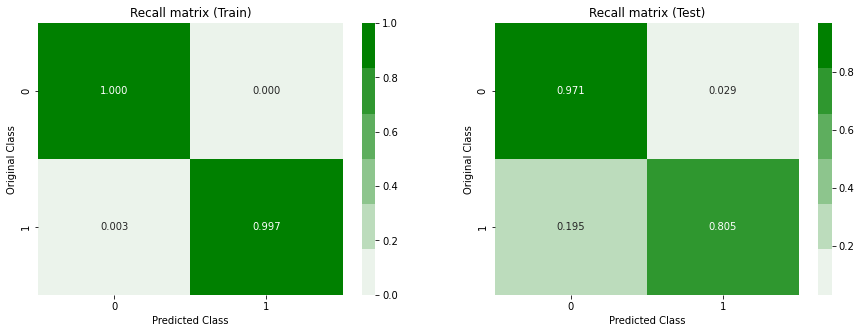

****************************************************************************************************


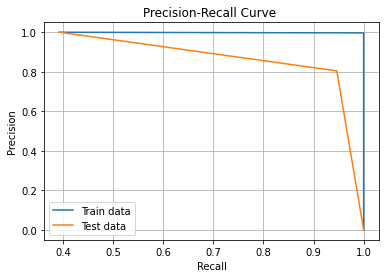

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (cosine distance)

log_loss for k =  1 is 0.21993661936543624
log_loss for k =  3 is 0.19385975927934393
log_loss for k =  5 is 0.18981877838526773
log_loss for k =  7 is 0.18788322905535207
log_loss for k =  9 is 0.1864110911987877
log_loss for k =  11 is 0.18671012600947398
log_loss for k =  13 is 0.18720362521788847
log_loss for k =  15 is 0.1888823845556651
log_loss for k =  17 is 0.1880917019440501
log_loss for k =  19 is 0.18810016054684642
log_loss for k =  21 is 0.18750232058713276
log_loss for k =  23 is 0.18724285058702828


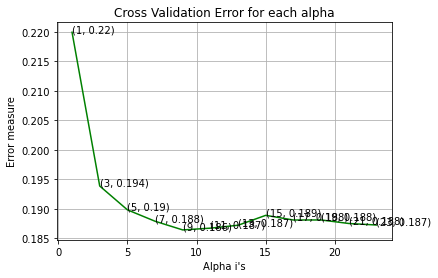

For values of best alpha =  9 The train log loss is: 0.0479871151941989
For values of best alpha =  9 The cross validation log loss is: 0.1864110911987877
Train AUC score: 0.9999991425608363
Test AUC score: 0.9793691068061031
Random model AUC score: 0.5100291445225442


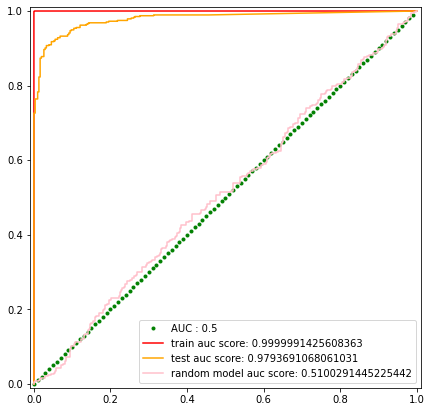

Best Threshold is 0.7863026606096015
****************************************************************************************************
Accuracy on train data : 0.9830562659846548
Accuracy on test data : 0.9168797953964194
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9448529411764706 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9568052159739201 
Recall on test data: 0.8371335504885994 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9779258642232402 
F1 score on test data: 0.8877374784110535 
F1 score on Random model: 0.4384724186704385 
******************************************************

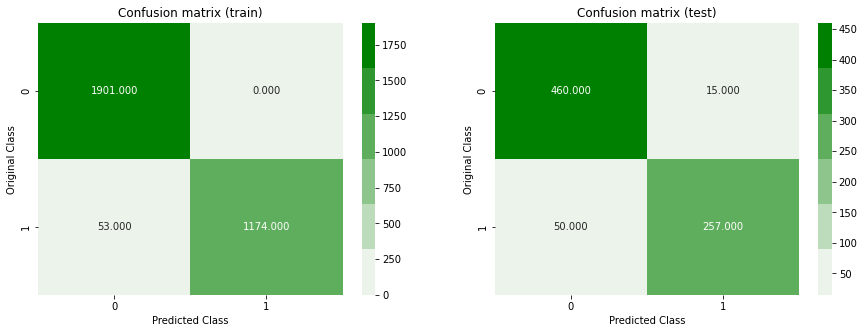

-------------------------------------------------- Precision matrix --------------------------------------------------


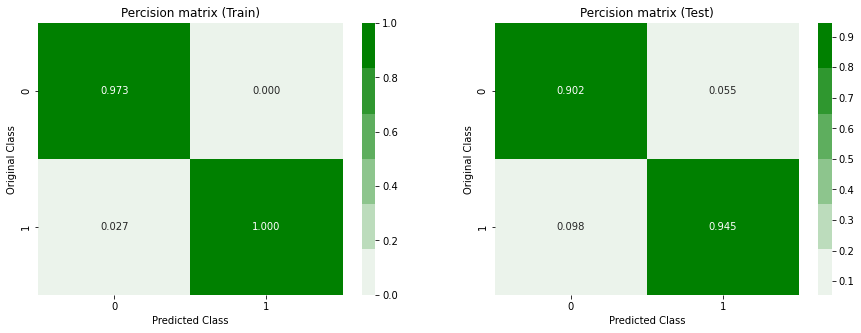

-------------------------------------------------- Recall matrix --------------------------------------------------


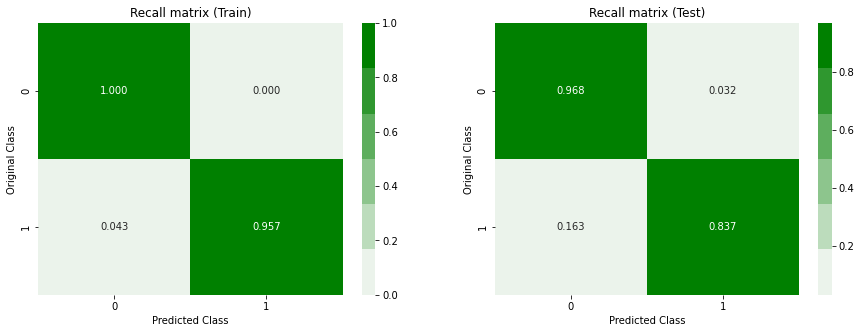

****************************************************************************************************


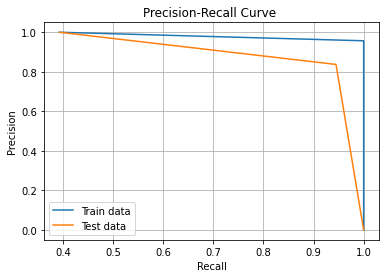

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Logistic Regression

log_loss for c =  1e-05 is 0.24752372943056666
log_loss for c =  0.0001 is 0.21394501228137816
log_loss for c =  0.001 is 0.18684567066043895
log_loss for c =  0.01 is 0.16964721342479303
log_loss for c =  0.1 is 0.15774427678973804
log_loss for c =  1 is 0.15459987899936614
log_loss for c =  10 is 0.15546877783649798
log_loss for c =  100 is 0.15561831585538716
log_loss for c =  1000 is 0.15520884760529843


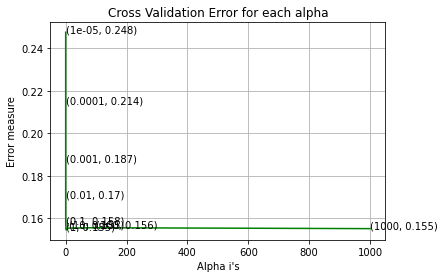

log loss for train data 0.1403412257202019
log loss for cv data 0.15459987899936614
Train AUC score: 0.9887658320782569
Test AUC score: 0.9866620949768559
Random model AUC score: 0.5100291445225442


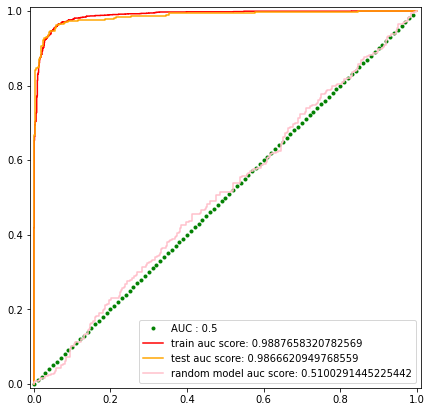

Best Threshold is 0.5857095937188224
****************************************************************************************************
Accuracy on train data : 0.9491687979539642
Accuracy on test data : 0.9475703324808185
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9571917808219178 
Precession on test data: 0.9554794520547946 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9111654441727791 
Recall on test data: 0.9087947882736156 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9336116910229645 
F1 score on test data: 0.9315525876460768 
F1 score on Random model: 0.4384724186704385 
***************************************

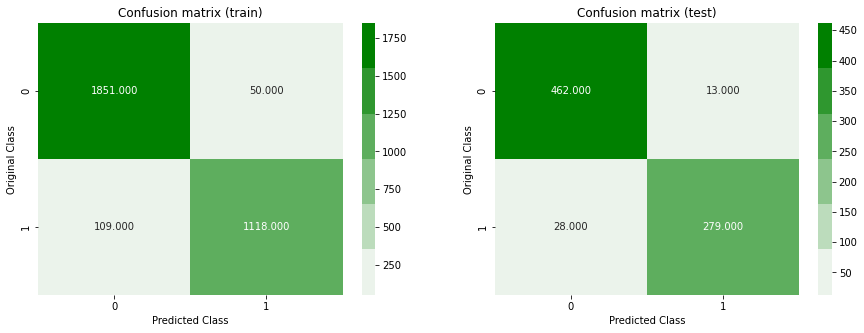

-------------------------------------------------- Precision matrix --------------------------------------------------


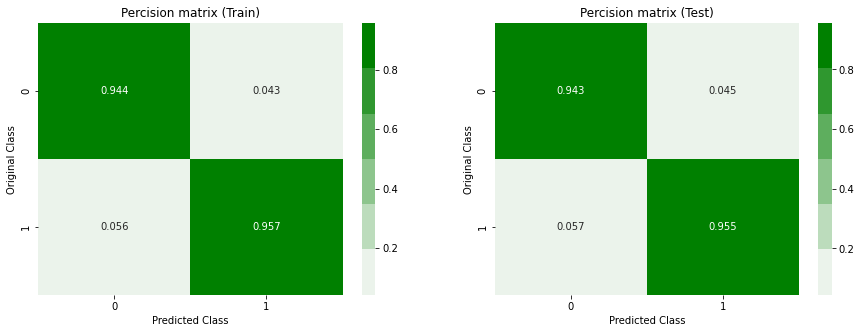

-------------------------------------------------- Recall matrix --------------------------------------------------


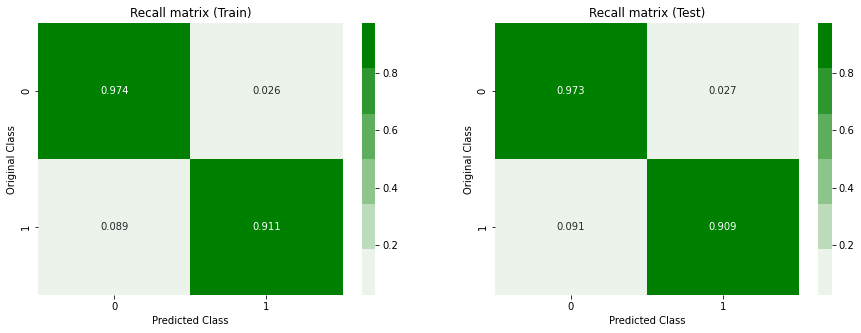

****************************************************************************************************


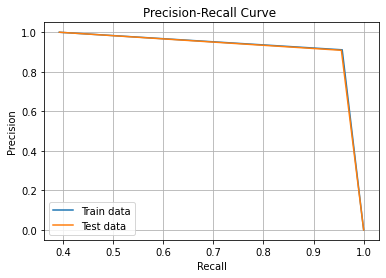

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Random Forest

log_loss for c =  10 is 0.13104783741121875
log_loss for c =  50 is 0.11956147504789226
log_loss for c =  100 is 0.12177327195906493
log_loss for c =  500 is 0.12006078642084098
log_loss for c =  1000 is 0.12074860633015005
log_loss for c =  2000 is 0.12043542602215852
log_loss for c =  3000 is 0.12040668569714691


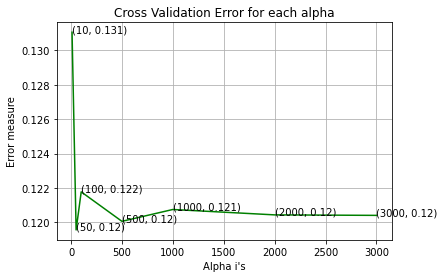

For values of best alpha =  50 The train log loss is: 0.040519463928766944
For values of best alpha =  50 The cross validation log loss is: 0.11956147504789226
Train AUC score: 0.9999982851216727
Test AUC score: 0.9926144351105777
Random model AUC score: 0.5100291445225442


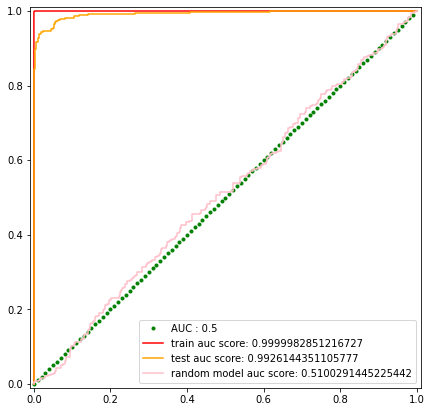

Best Threshold is 0.6240595418249315
****************************************************************************************************
Accuracy on train data : 0.9971227621483376
Accuracy on test data : 0.9539641943734015
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9688581314878892 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9926650366748166 
Recall on test data: 0.9120521172638436 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.996319018404908 
F1 score on test data: 0.9395973154362416 
F1 score on Random model: 0.4384724186704385 
*******************************************************

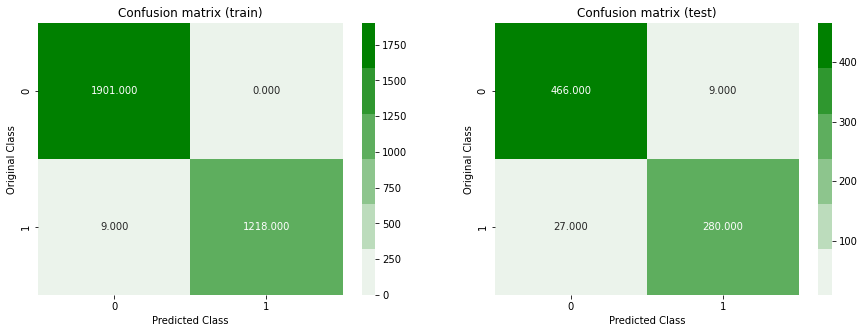

-------------------------------------------------- Precision matrix --------------------------------------------------


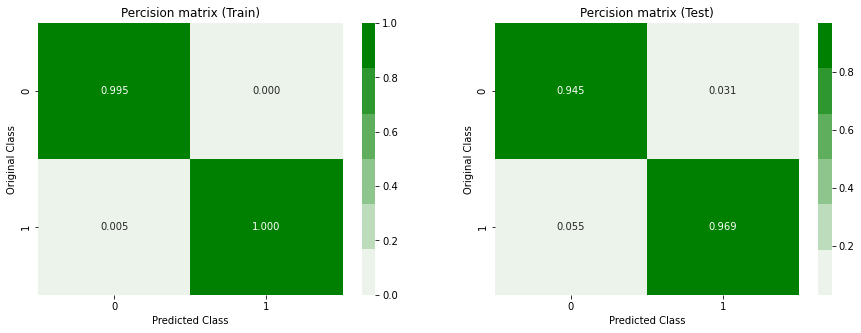

-------------------------------------------------- Recall matrix --------------------------------------------------


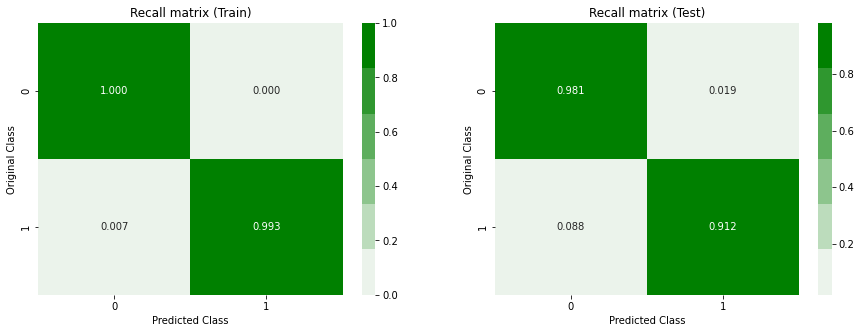

****************************************************************************************************


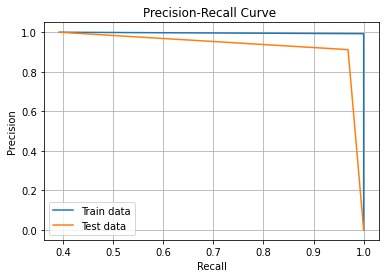

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Xgboost with decision tree as base learners

log_loss for c =  10 is 0.153004005115626
log_loss for c =  50 is 0.11993969542414233
log_loss for c =  100 is 0.11665691085315447
log_loss for c =  500 is 0.11921788856531747
log_loss for c =  1000 is 0.12282942800578645
log_loss for c =  2000 is 0.12428399521499318


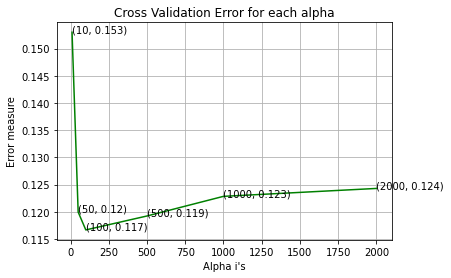

For values of best alpha =  100 The train log loss is: 0.050628257680240915
For values of best alpha =  100 The cross validation log loss is: 0.11665691085315447
Train AUC score: 0.9999198294382017
Test AUC score: 0.9926075775758615
Random model AUC score: 0.5100291445225442


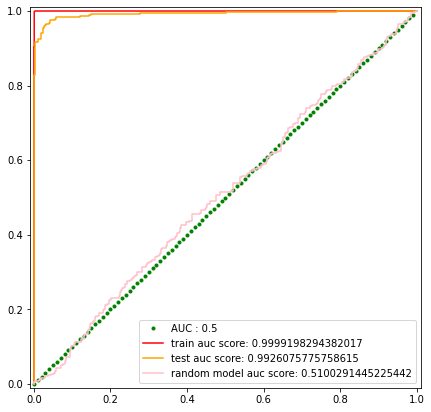

Best Threshold is 0.701716797053814
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
*******************************************************

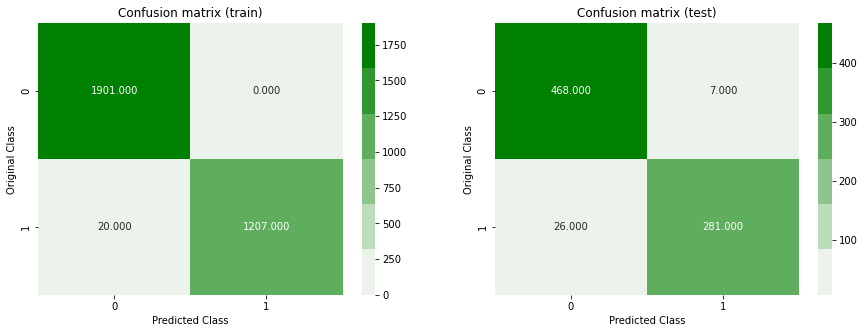

-------------------------------------------------- Precision matrix --------------------------------------------------


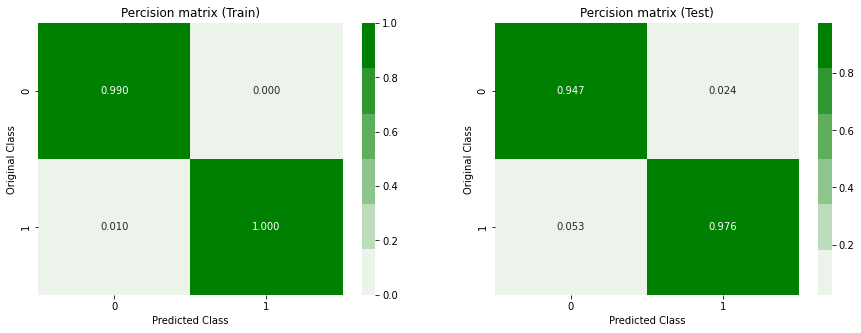

-------------------------------------------------- Recall matrix --------------------------------------------------


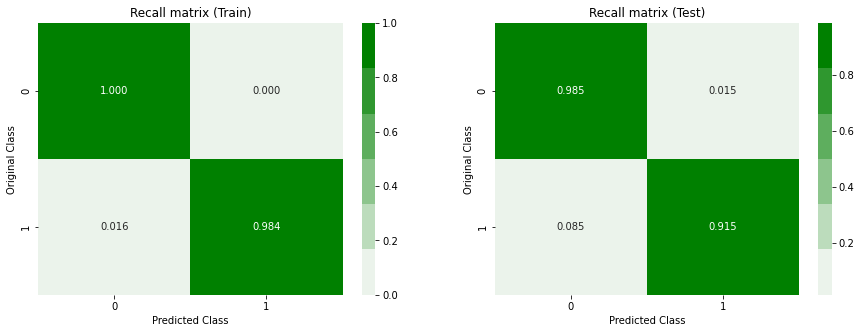

****************************************************************************************************


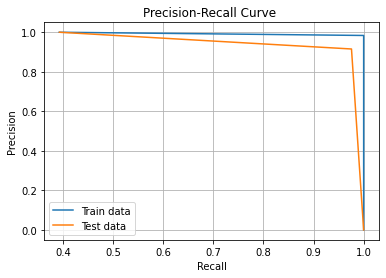

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

XGboost with linear base learners

log_loss for c =  10 is 0.153004005115626
log_loss for c =  50 is 0.11993969542414233
log_loss for c =  100 is 0.11665691085315447
log_loss for c =  500 is 0.11921788856531747
log_loss for c =  1000 is 0.12282942800578645
log_loss for c =  2000 is 0.12428399521499318


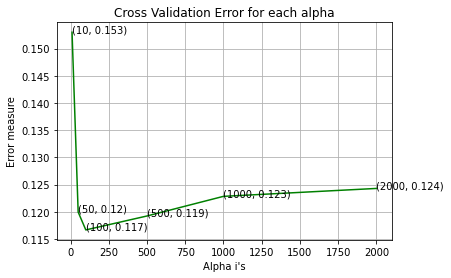

For values of best alpha =  100 The train log loss is: 0.050628257680240915
For values of best alpha =  100 The cross validation log loss is: 0.11665691085315447
Train AUC score: 0.9999198294382017
Test AUC score: 0.9926075775758615
Random model AUC score: 0.5100291445225442


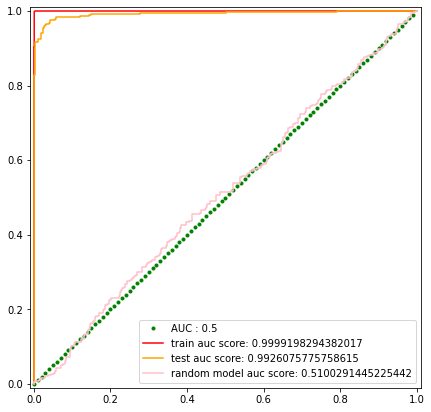

Best Threshold is 0.701716797053814
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
*******************************************************

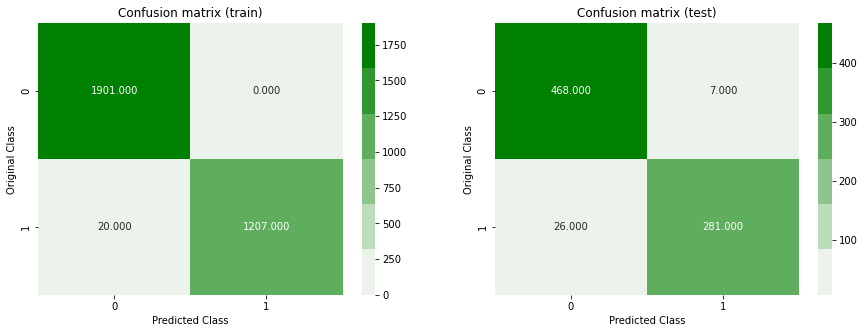

-------------------------------------------------- Precision matrix --------------------------------------------------


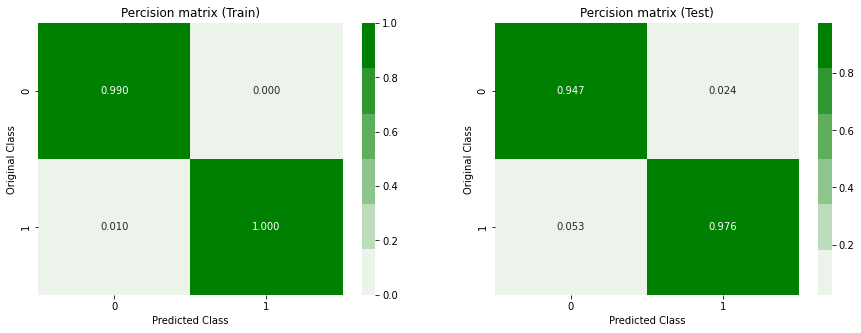

-------------------------------------------------- Recall matrix --------------------------------------------------


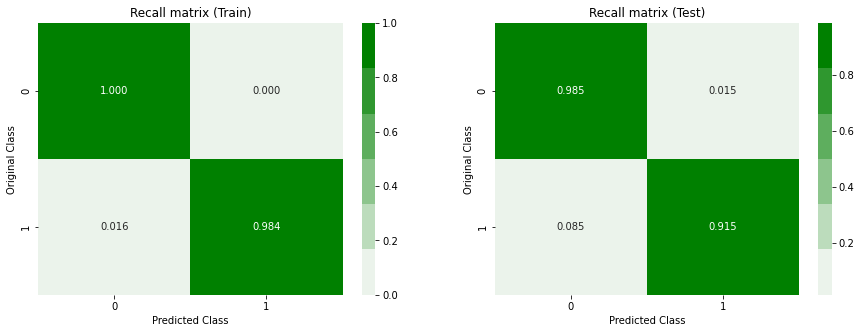

****************************************************************************************************


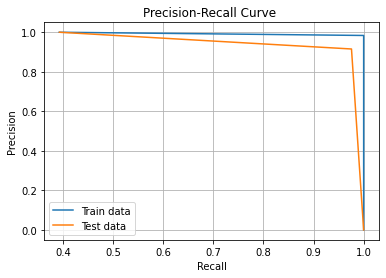

*** Random model ***
                   auc  accuracy  precision    recall   f1score   logloss
random_model  0.510029  0.492327     0.3875  0.504886  0.438472  1.016232
*** ML models ***
                                      auc (train)  auc (test)  \
weighted knn with cosine distance        0.999999    0.979369   
uniform knn with cosine distance         0.995241    0.969751   
weighted knn with minkowski distance     0.999999    0.979359   
weighted knn with cosine distance        0.999999    0.979369   
Logistic Regression                      0.988766    0.986662   
Random Forest                            0.999998    0.992614   
XGBoost                                  0.999920    0.992608   
XGboost linear base learners             0.999920    0.992608   

                                      accuracy (train)  accuracy (test)  \
weighted knn with cosine distance             0.983056         0.916880   
uniform knn with cosine distance              0.950767         0.921995   
we

In [48]:
random_model,metrics=train_all_models(log_X_train_robust,y_train,log_X_val_robust,y_val)

In [49]:
metrics

,auc (train),auc (test),accuracy (train),accuracy (test),precision (train),precision (test),recall (train),recall (test),f1score (train),f1score (test),logloss (train),logloss (test),Percentage of misclassified pts (Train),Percentage of missclassified pts (Test)
weighted knn with cosine distance,0.999999,0.979369,0.983056,0.916880,1.000000,0.944853,0.956805,0.837134,0.977926,0.887737,0.047987,0.186411,1.694373,8.312020
uniform knn with cosine distance,0.995241,0.969751,0.950767,0.921995,0.962102,0.927083,0.910350,0.869707,0.935511,0.897479,0.119318,0.204324,4.923274,7.800512
weighted knn with minkowski distance,0.999999,0.979359,0.998721,0.905371,1.000000,0.946360,0.996740,0.804560,0.998367,0.869718,0.039431,0.193363,0.127877,9.462916
weighted knn with cosine distance,0.999999,0.979369,0.983056,0.916880,1.000000,0.944853,0.956805,0.837134,0.977926,0.887737,0.047987,0.186411,1.694373,8.312020
Logistic Regression,0.988766,0.986662,0.949169,0.947570,0.957192,0.955479,0.911165,0.908795,0.933612,0.931553,0.140341,0.154600,5.083120,5.242967
Random Forest,0.999998,0.992614,0.997123,0.953964,1.000000,0.968858,0.992665,0.912052,0.996319,0.939597,0.040519,0.119561,0.287724,4.603581
XGBoost,0.999920,0.992608,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050628,0.116657,0.639386,4.219949
XGboost linear base learners,0.999920,0.992608,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050628,0.116657,0.639386,4.219949


In [50]:
all_models_metrics["Log transformed Robust scaled"]=metrics

### Test data log loss of Distance based models do not differ much between minmax(log(data)) transformation and robustscaler(log(data))

### Transforming to it's square form

In [51]:
X_train_square=X_train**2
X_val_square=X_val**2

In [52]:
X_train_square=np.hstack([X_train_square,X_train])
X_val_square=np.hstack([X_val_square,X_val])

In [53]:
scaler=RobustScaler()
X_train_square_robust=scaler.fit_transform(X_train_square)
X_val_square_robust=scaler.transform(X_val_square)


Normal KNN (minkowski distance)

log_loss for k =  1 is 0.3222315399429685
log_loss for k =  3 is 0.2747406057562834
log_loss for k =  5 is 0.25938447845266493
log_loss for k =  7 is 0.2568862699500992
log_loss for k =  9 is 0.25835141801320394
log_loss for k =  11 is 0.257593129526529
log_loss for k =  13 is 0.25762896508611693
log_loss for k =  15 is 0.2590720061617826
log_loss for k =  17 is 0.26081304901534724
log_loss for k =  19 is 0.2636652276759771
log_loss for k =  21 is 0.26566245528062465
log_loss for k =  23 is 0.2683727507627297


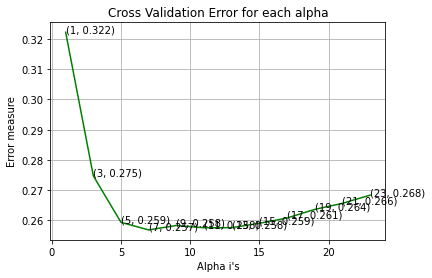

For values of best alpha =  7 The train log loss is: 0.08070705505816453
For values of best alpha =  7 The cross validation log loss is: 0.2568862699500992
Train AUC score: 0.9999991425608364
Test AUC score: 0.9577198697068404
Random model AUC score: 0.5100291445225442


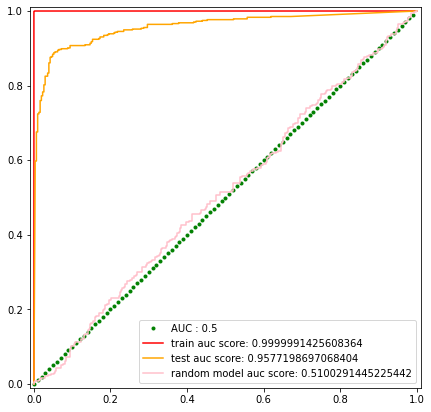

Best Threshold is 0.7734149001650257
****************************************************************************************************
Accuracy on train data : 0.9731457800511509
Accuracy on test data : 0.8721227621483376
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9058823529411765 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9315403422982885 
Recall on test data: 0.752442996742671 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9645569620253165 
F1 score on test data: 0.8220640569395018 
F1 score on Random model: 0.4384724186704385 
*******************************************************

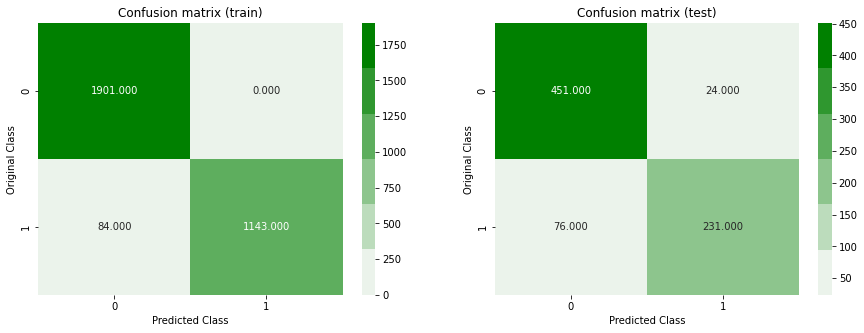

-------------------------------------------------- Precision matrix --------------------------------------------------


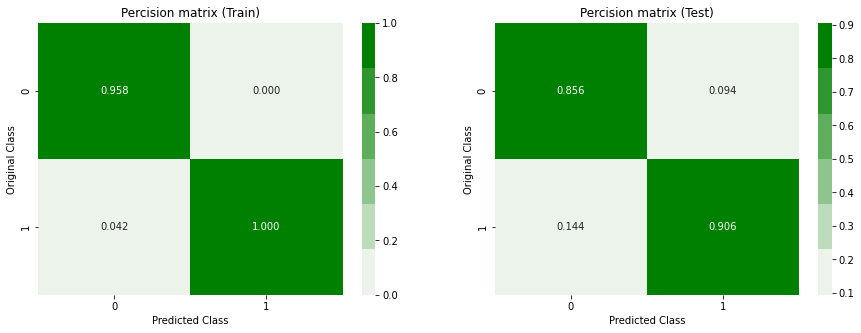

-------------------------------------------------- Recall matrix --------------------------------------------------


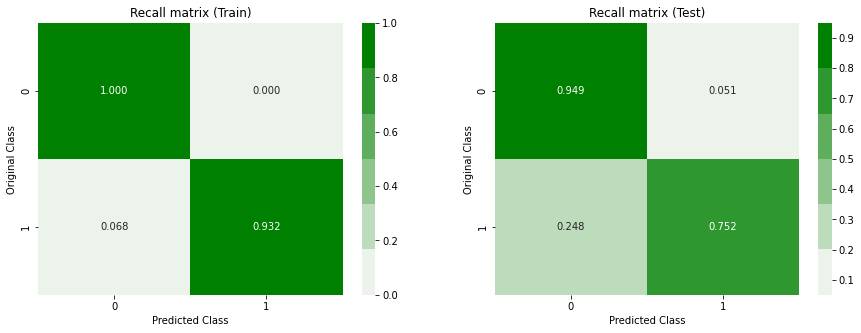

****************************************************************************************************


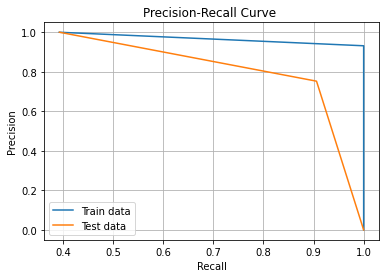

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Normal KNN (cosine distance)

log_loss for k =  1 is 0.3222315399429685
log_loss for k =  3 is 0.2946649317489414
log_loss for k =  5 is 0.2876474607863164
log_loss for k =  7 is 0.2932107478893846
log_loss for k =  9 is 0.2988415323584792
log_loss for k =  11 is 0.3011065448356281
log_loss for k =  13 is 0.3043364462488539
log_loss for k =  15 is 0.3103695191749649
log_loss for k =  17 is 0.3153263983180191
log_loss for k =  19 is 0.3216844014114037
log_loss for k =  21 is 0.3267887965463252
log_loss for k =  23 is 0.3328683351971735


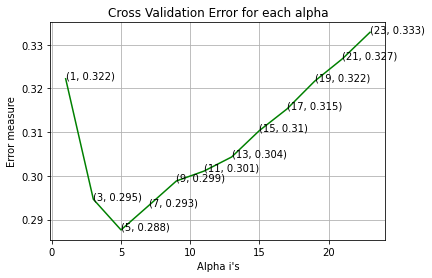

For values of best alpha =  5 The train log loss is: 0.22123211413616764
For values of best alpha =  5 The cross validation log loss is: 0.2876474607863164
Train AUC score: 0.9778086170063626
Test AUC score: 0.9477970169723984
Random model AUC score: 0.5100291445225442


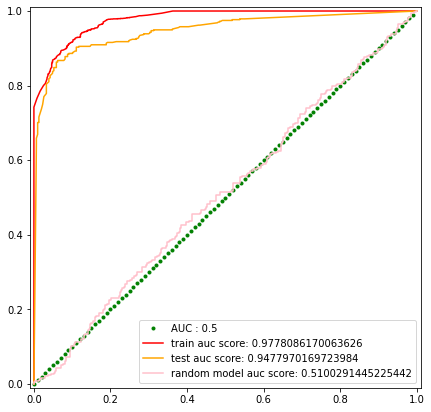

Best Threshold is 0.7174999090504244
****************************************************************************************************
Accuracy on train data : 0.9082480818414322
Accuracy on test data : 0.8491048593350383
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.958984375 
Precession on test data: 0.8620689655172413 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.8003259983700082 
Recall on test data: 0.7328990228013029 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.8725011106175034 
F1 score on test data: 0.7922535211267605 
F1 score on Random model: 0.4384724186704385 
**********************************************

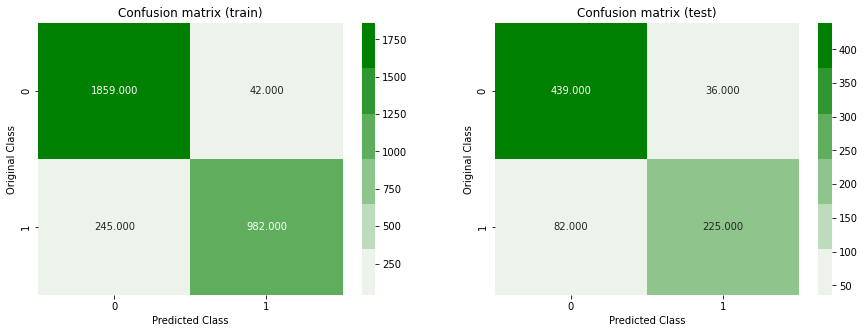

-------------------------------------------------- Precision matrix --------------------------------------------------


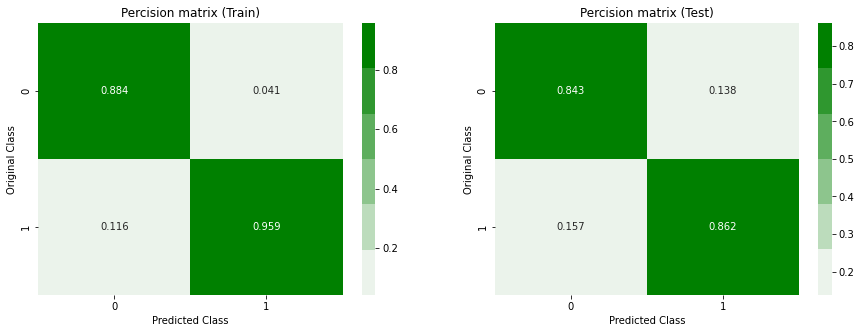

-------------------------------------------------- Recall matrix --------------------------------------------------


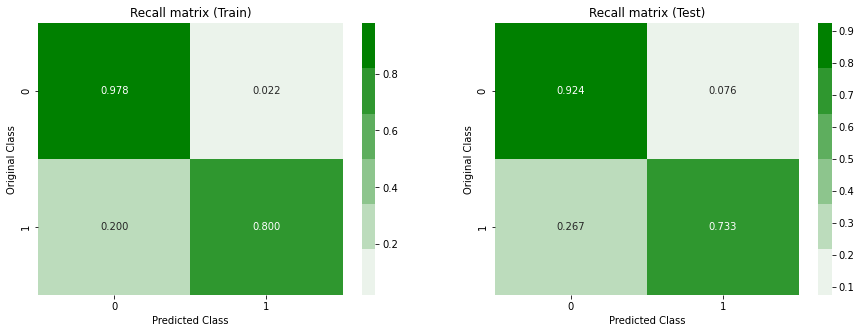

****************************************************************************************************


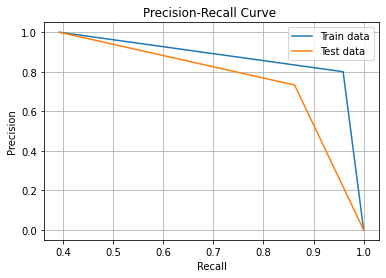

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (minkowski distance)

log_loss for k =  1 is 0.37072753352276894
log_loss for k =  3 is 0.3142923353784608
log_loss for k =  5 is 0.30072085138476873
log_loss for k =  7 is 0.29837822012156506
log_loss for k =  9 is 0.298405227028212
log_loss for k =  11 is 0.2948912650511321
log_loss for k =  13 is 0.2936078885198099
log_loss for k =  15 is 0.29275967298472894
log_loss for k =  17 is 0.2941556698956317
log_loss for k =  19 is 0.29502733005307447
log_loss for k =  21 is 0.29808536701307115
log_loss for k =  23 is 0.2990334295670064


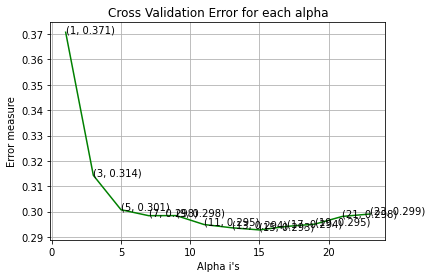

For values of best alpha =  15 The train log loss is: 0.07602554147726204
For values of best alpha =  15 The cross validation log loss is: 0.29275967298472894
Train AUC score: 0.9999991425608364
Test AUC score: 0.9480884621978399
Random model AUC score: 0.5100291445225442


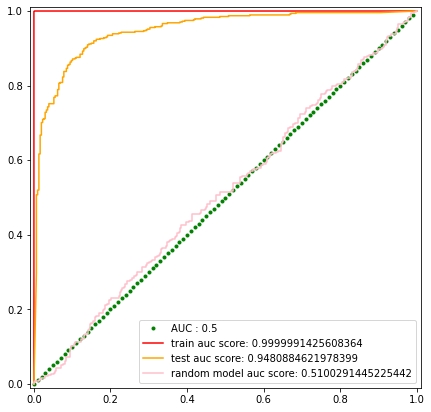

Best Threshold is 0.7683263292681922
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.8491048593350383
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9126637554585153 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.6807817589576547 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.7798507462686567 
F1 score on Random model: 0.4384724186704385 
*******************************************************

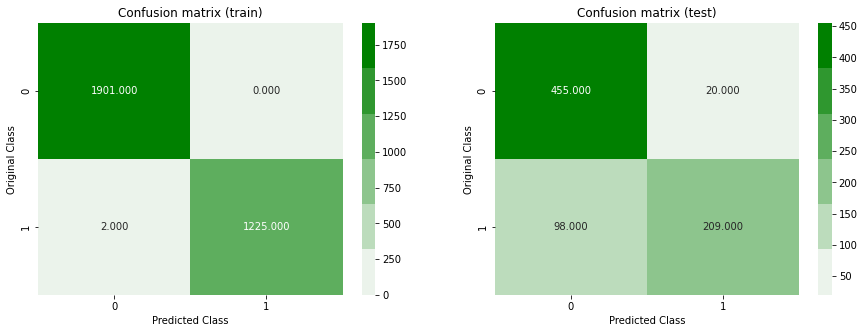

-------------------------------------------------- Precision matrix --------------------------------------------------


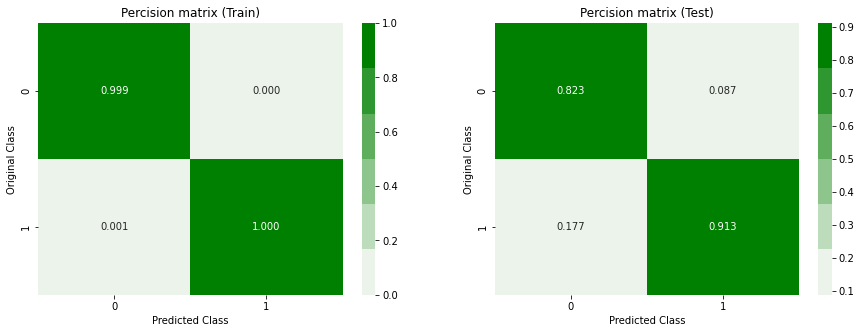

-------------------------------------------------- Recall matrix --------------------------------------------------


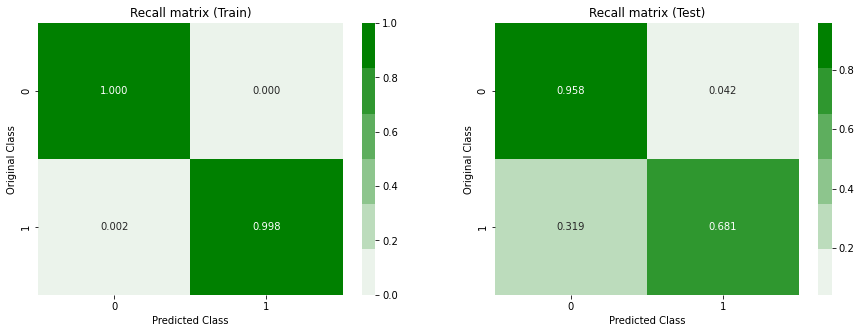

****************************************************************************************************


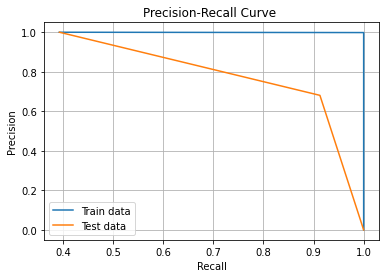

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (cosine distance)

log_loss for k =  1 is 0.3222315399429685
log_loss for k =  3 is 0.2747406057562834
log_loss for k =  5 is 0.25938447845266493
log_loss for k =  7 is 0.2568862699500992
log_loss for k =  9 is 0.25835141801320394
log_loss for k =  11 is 0.257593129526529
log_loss for k =  13 is 0.25762896508611693
log_loss for k =  15 is 0.2590720061617826
log_loss for k =  17 is 0.26081304901534724
log_loss for k =  19 is 0.2636652276759771
log_loss for k =  21 is 0.26566245528062465
log_loss for k =  23 is 0.2683727507627297


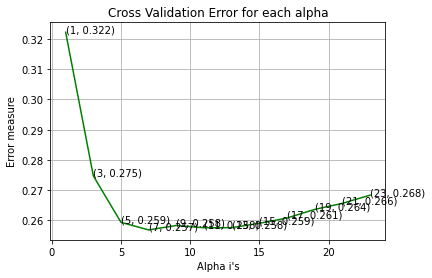

For values of best alpha =  7 The train log loss is: 0.08070705505816453
For values of best alpha =  7 The cross validation log loss is: 0.2568862699500992
Train AUC score: 0.9999991425608364
Test AUC score: 0.9577198697068404
Random model AUC score: 0.5100291445225442


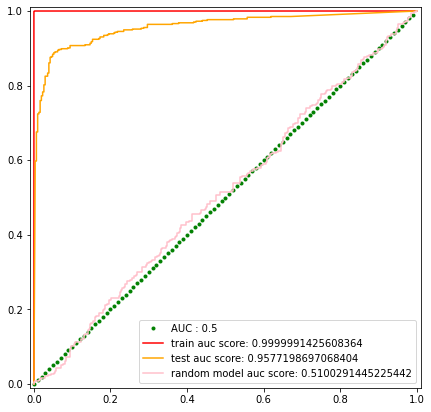

Best Threshold is 0.7734149001650257
****************************************************************************************************
Accuracy on train data : 0.9731457800511509
Accuracy on test data : 0.8721227621483376
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9058823529411765 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9315403422982885 
Recall on test data: 0.752442996742671 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9645569620253165 
F1 score on test data: 0.8220640569395018 
F1 score on Random model: 0.4384724186704385 
*******************************************************

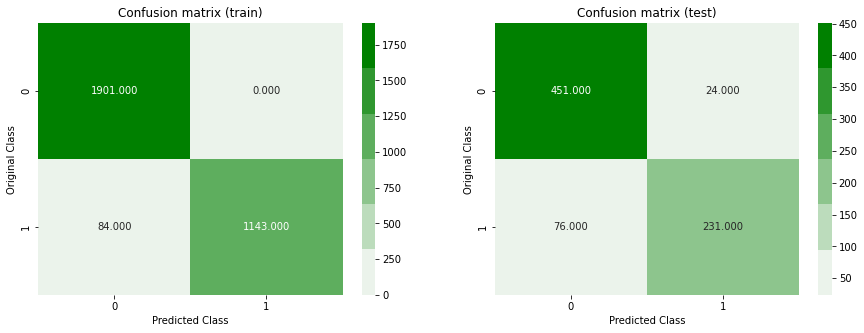

-------------------------------------------------- Precision matrix --------------------------------------------------


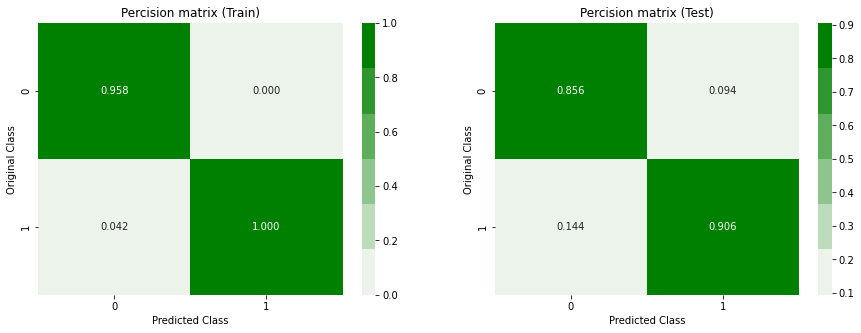

-------------------------------------------------- Recall matrix --------------------------------------------------


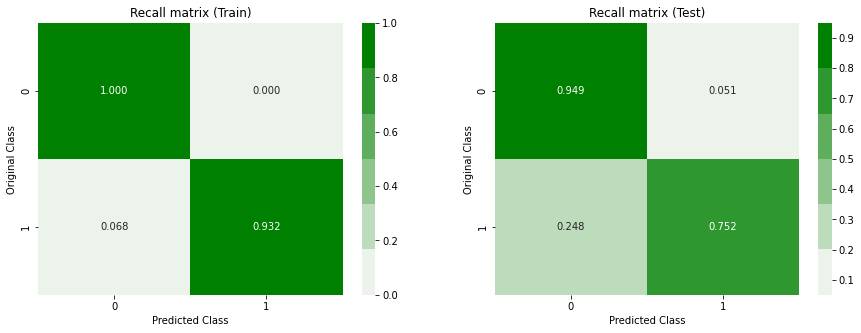

****************************************************************************************************


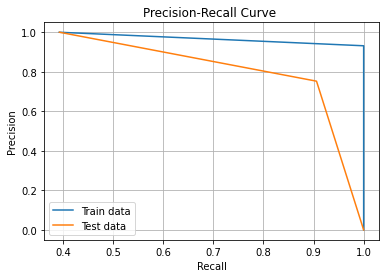

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Logistic Regression

log_loss for c =  1e-05 is 0.5828860675622667
log_loss for c =  0.0001 is 0.5785233755201273
log_loss for c =  0.001 is 0.4594036534456986
log_loss for c =  0.01 is 0.40304567905903405
log_loss for c =  0.1 is 0.4446962793534472
log_loss for c =  1 is 0.4348269592085827
log_loss for c =  10 is 0.42232062594701386
log_loss for c =  100 is 0.4199711707949002
log_loss for c =  1000 is 0.41757033657640946


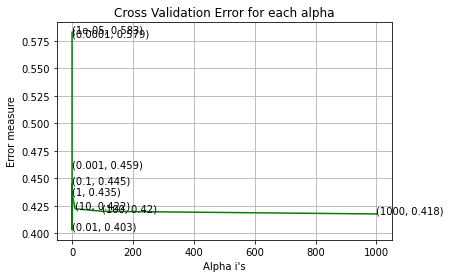

log loss for train data 0.37295194707278767
log loss for cv data 0.40304567905903405
Train AUC score: 0.9640171367791242
Test AUC score: 0.9468541059489114
Random model AUC score: 0.5100291445225442


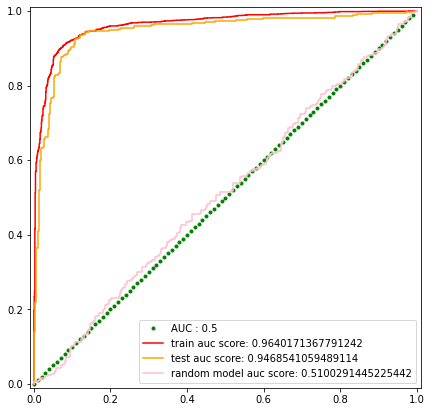

Best Threshold is 0.5890589505873212
****************************************************************************************************
Accuracy on train data : 0.819693094629156
Accuracy on test data : 0.8132992327365729
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9425901201602136 
Precession on test data: 0.9214659685863874 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.5753871230643847 
Recall on test data: 0.5732899022801303 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.714574898785425 
F1 score on test data: 0.7068273092369479 
F1 score on Random model: 0.4384724186704385 
*****************************************

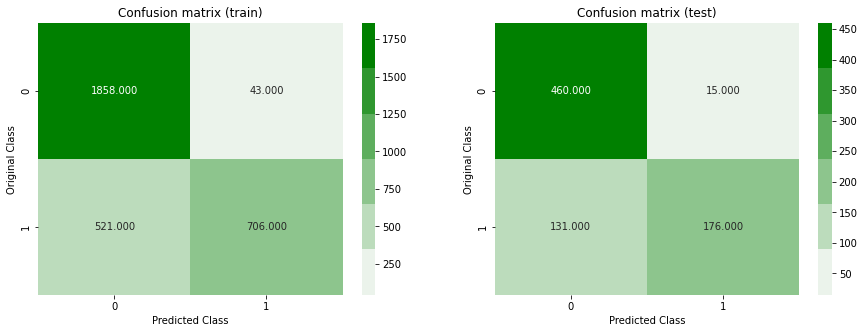

-------------------------------------------------- Precision matrix --------------------------------------------------


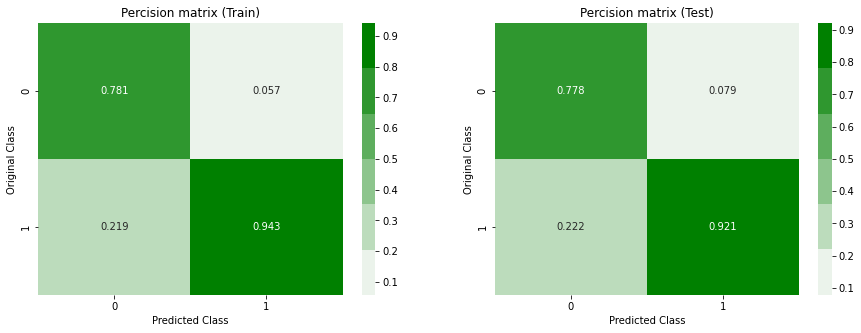

-------------------------------------------------- Recall matrix --------------------------------------------------


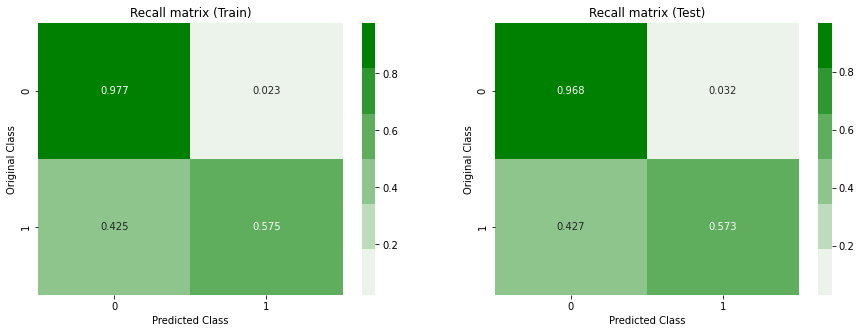

****************************************************************************************************


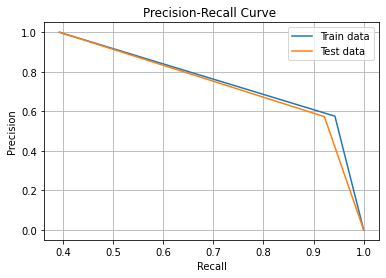

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Random Forest

log_loss for c =  10 is 0.13379349007499025
log_loss for c =  50 is 0.12271640920336924
log_loss for c =  100 is 0.12471325191922207
log_loss for c =  500 is 0.12183366234092038
log_loss for c =  1000 is 0.12235404851485973
log_loss for c =  2000 is 0.12215655609892796
log_loss for c =  3000 is 0.12215101834293296


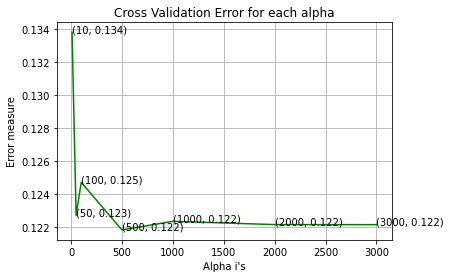

For values of best alpha =  500 The train log loss is: 0.03923345757703053
For values of best alpha =  500 The cross validation log loss is: 0.12183366234092038
Train AUC score: 0.9999978564020909
Test AUC score: 0.9921824104234528
Random model AUC score: 0.5100291445225442


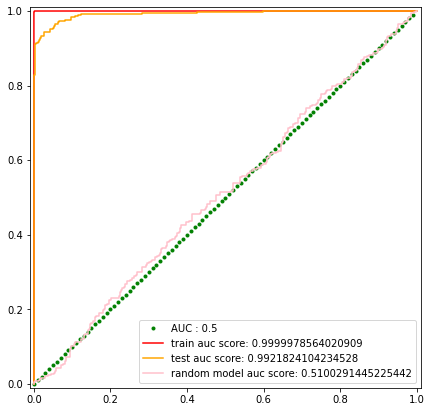

Best Threshold is 0.5766379590081114
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.9514066496163683
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9559322033898305 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.9185667752442996 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.93687707641196 
F1 score on Random model: 0.4384724186704385 
*********************************************************

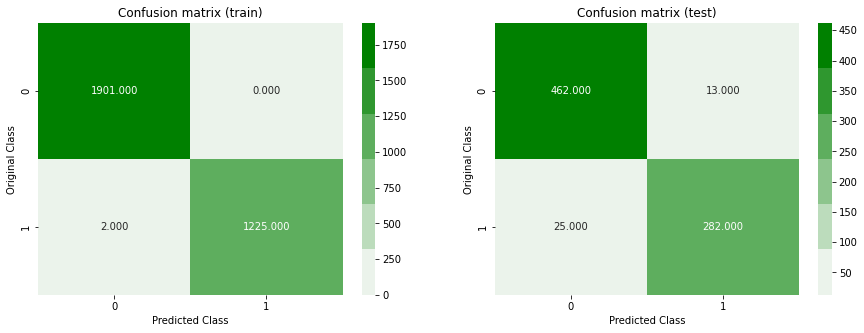

-------------------------------------------------- Precision matrix --------------------------------------------------


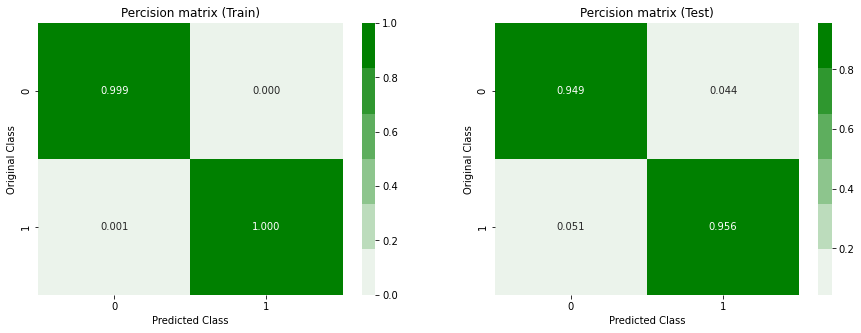

-------------------------------------------------- Recall matrix --------------------------------------------------


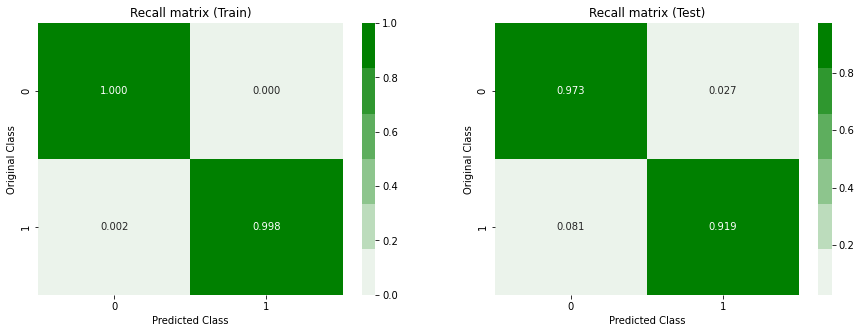

****************************************************************************************************


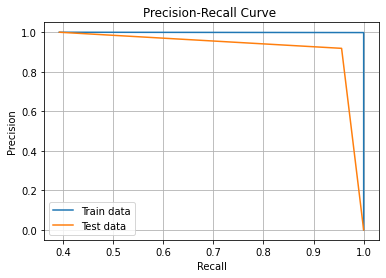

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Xgboost with decision tree as base learners

log_loss for c =  10 is 0.1529096772838917
log_loss for c =  50 is 0.120194438852112
log_loss for c =  100 is 0.11693984325286126
log_loss for c =  500 is 0.11913950645089878
log_loss for c =  1000 is 0.1226219623355191
log_loss for c =  2000 is 0.12436244815342475


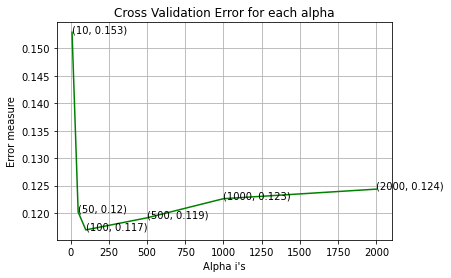

For values of best alpha =  100 The train log loss is: 0.051077192686676244
For values of best alpha =  100 The cross validation log loss is: 0.11693984325286126
Train AUC score: 0.999918971999038
Test AUC score: 0.9926555803188754
Random model AUC score: 0.5100291445225442


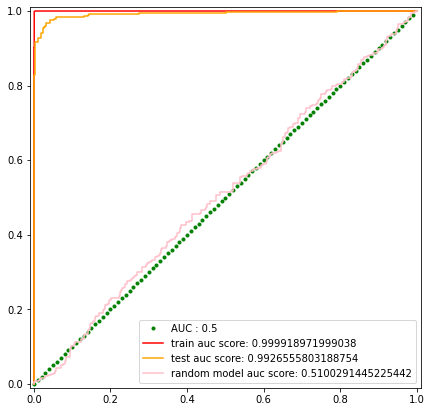

Best Threshold is 0.7013554617762565
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

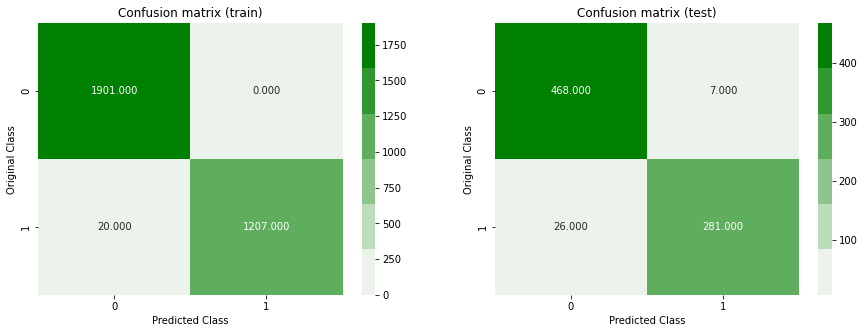

-------------------------------------------------- Precision matrix --------------------------------------------------


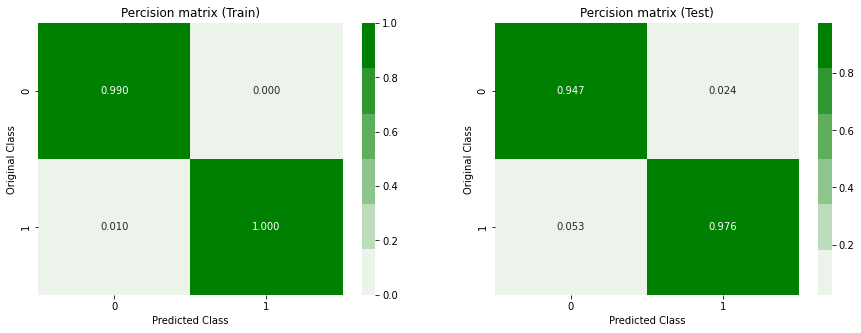

-------------------------------------------------- Recall matrix --------------------------------------------------


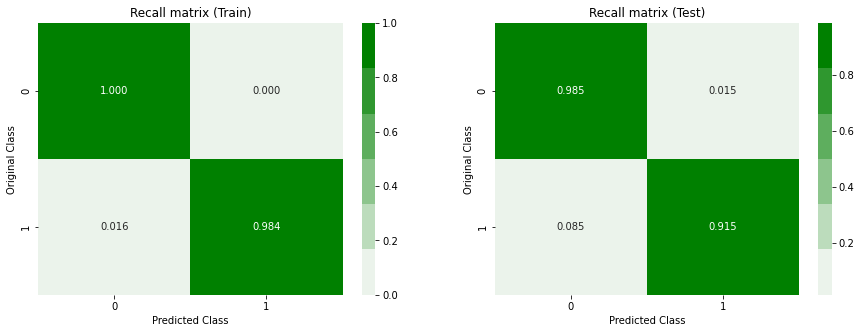

****************************************************************************************************


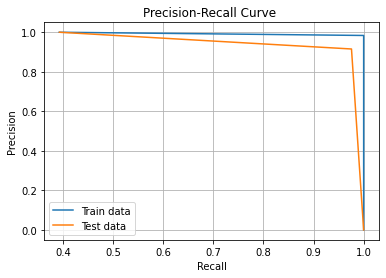

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

XGboost with linear base learners

log_loss for c =  10 is 0.1529096772838917
log_loss for c =  50 is 0.120194438852112
log_loss for c =  100 is 0.11693984325286126
log_loss for c =  500 is 0.11913950645089878
log_loss for c =  1000 is 0.1226219623355191
log_loss for c =  2000 is 0.12436244815342475


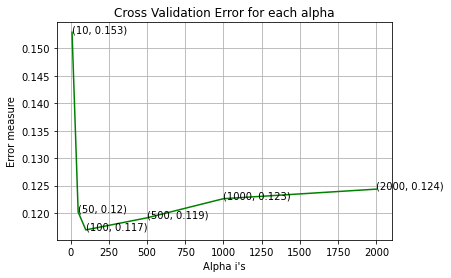

For values of best alpha =  100 The train log loss is: 0.051077192686676244
For values of best alpha =  100 The cross validation log loss is: 0.11693984325286126
Train AUC score: 0.999918971999038
Test AUC score: 0.9926555803188754
Random model AUC score: 0.5100291445225442


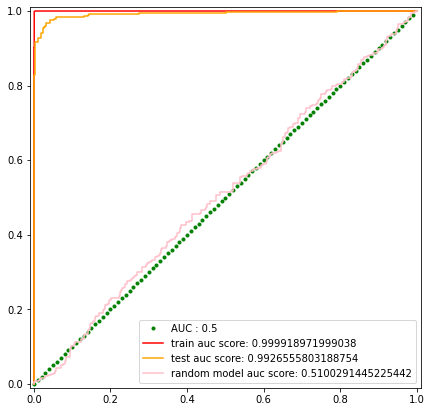

Best Threshold is 0.7013554617762565
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

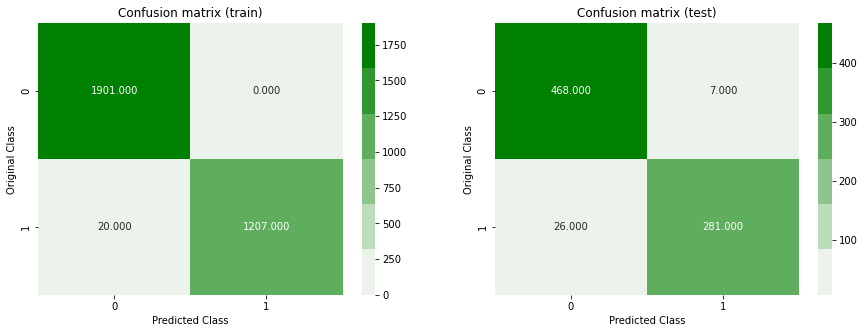

-------------------------------------------------- Precision matrix --------------------------------------------------


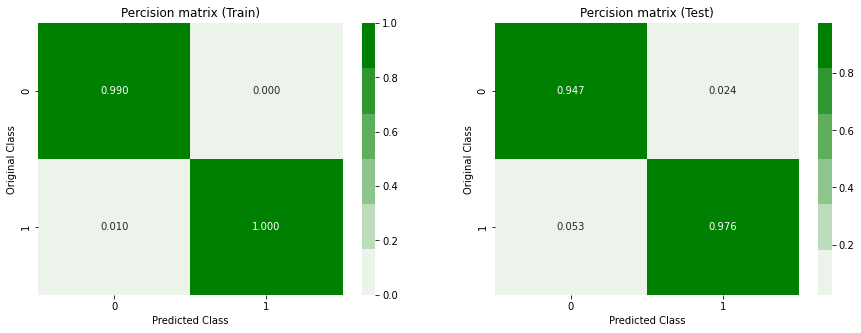

-------------------------------------------------- Recall matrix --------------------------------------------------


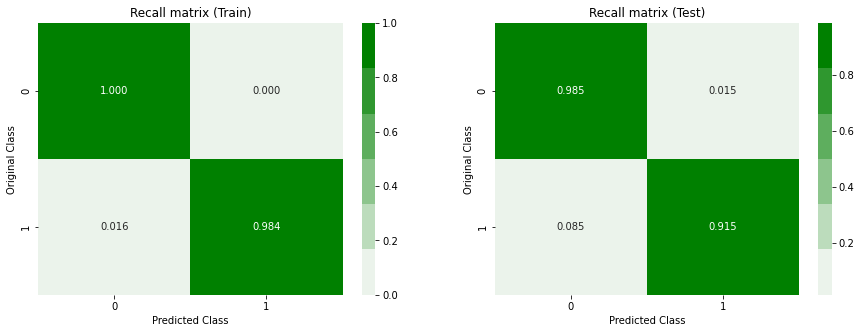

****************************************************************************************************


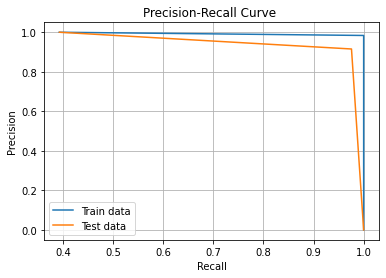

*** Random model ***
                   auc  accuracy  precision    recall   f1score   logloss
random_model  0.510029  0.492327     0.3875  0.504886  0.438472  1.016232
*** ML models ***
                                      auc (train)  auc (test)  \
weighted knn with cosine distance        0.999999    0.957720   
uniform knn with cosine distance         0.977809    0.947797   
weighted knn with minkowski distance     0.999999    0.948088   
weighted knn with cosine distance        0.999999    0.957720   
Logistic Regression                      0.964017    0.946854   
Random Forest                            0.999998    0.992182   
XGBoost                                  0.999919    0.992656   
XGboost linear base learners             0.999919    0.992656   

                                      accuracy (train)  accuracy (test)  \
weighted knn with cosine distance             0.973146         0.872123   
uniform knn with cosine distance              0.908248         0.849105   
we

In [54]:
random_model,metrics=train_all_models(X_train_square_robust,y_train,X_val_square_robust,y_val)

In [55]:
metrics

,auc (train),auc (test),accuracy (train),accuracy (test),precision (train),precision (test),recall (train),recall (test),f1score (train),f1score (test),logloss (train),logloss (test),Percentage of misclassified pts (Train),Percentage of missclassified pts (Test)
weighted knn with cosine distance,0.999999,0.957720,0.973146,0.872123,1.000000,0.905882,0.931540,0.752443,0.964557,0.822064,0.080707,0.256886,2.685422,12.787724
uniform knn with cosine distance,0.977809,0.947797,0.908248,0.849105,0.958984,0.862069,0.800326,0.732899,0.872501,0.792254,0.221232,0.287647,9.175192,15.089514
weighted knn with minkowski distance,0.999999,0.948088,0.999361,0.849105,1.000000,0.912664,0.998370,0.680782,0.999184,0.779851,0.076026,0.292760,0.063939,15.089514
weighted knn with cosine distance,0.999999,0.957720,0.973146,0.872123,1.000000,0.905882,0.931540,0.752443,0.964557,0.822064,0.080707,0.256886,2.685422,12.787724
Logistic Regression,0.964017,0.946854,0.819693,0.813299,0.942590,0.921466,0.575387,0.573290,0.714575,0.706827,0.372952,0.403046,18.030691,18.670077
Random Forest,0.999998,0.992182,0.999361,0.951407,1.000000,0.955932,0.998370,0.918567,0.999184,0.936877,0.039233,0.121834,0.063939,4.859335
XGBoost,0.999919,0.992656,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.051077,0.116940,0.639386,4.219949
XGboost linear base learners,0.999919,0.992656,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.051077,0.116940,0.639386,4.219949


In [56]:
all_models_metrics["square transformed Robust scaled"]=metrics

### Squre root transformation of data 

In [57]:
X_train_square_root=np.sqrt(X_train)
X_val_square_root=np.sqrt(X_val)

In [58]:
X_train_square_root=np.hstack([X_train_square_root,X_train])
X_val_square_root=np.hstack([X_val_square_root,X_val])

In [59]:
scaler=RobustScaler()
X_train_square_root_robust=scaler.fit_transform(X_train_square_root)
X_val_square_root_robust=scaler.transform(X_val_square_root)


Normal KNN (minkowski distance)

log_loss for k =  1 is 0.25174806234002695
log_loss for k =  3 is 0.2091618762840757
log_loss for k =  5 is 0.20676231978606693
log_loss for k =  7 is 0.20865634772154248
log_loss for k =  9 is 0.20765290669979644
log_loss for k =  11 is 0.20743591957123872
log_loss for k =  13 is 0.20911222312545416
log_loss for k =  15 is 0.21107295737658344
log_loss for k =  17 is 0.21274884418863588
log_loss for k =  19 is 0.21397274335067565
log_loss for k =  21 is 0.21508422370118357
log_loss for k =  23 is 0.21693559553997735


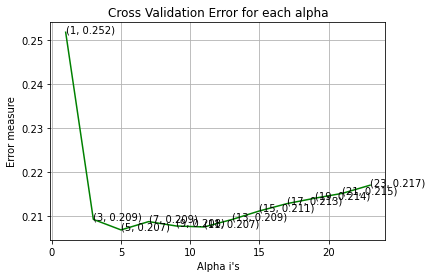

For values of best alpha =  5 The train log loss is: 0.06652925948658137
For values of best alpha =  5 The cross validation log loss is: 0.20676231978606693
Train AUC score: 0.9999991425608363
Test AUC score: 0.968369621121207
Random model AUC score: 0.5100291445225442


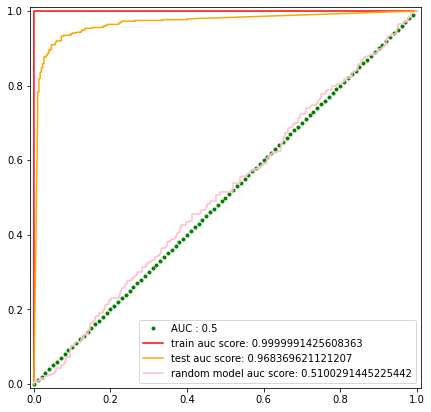

Best Threshold is 0.7843476395975648
****************************************************************************************************
Accuracy on train data : 0.9750639386189258
Accuracy on test data : 0.9053708439897699
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9236363636363636 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9364303178484108 
Recall on test data: 0.8273615635179153 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9671717171717172 
F1 score on test data: 0.8728522336769758 
F1 score on Random model: 0.4384724186704385 
******************************************************

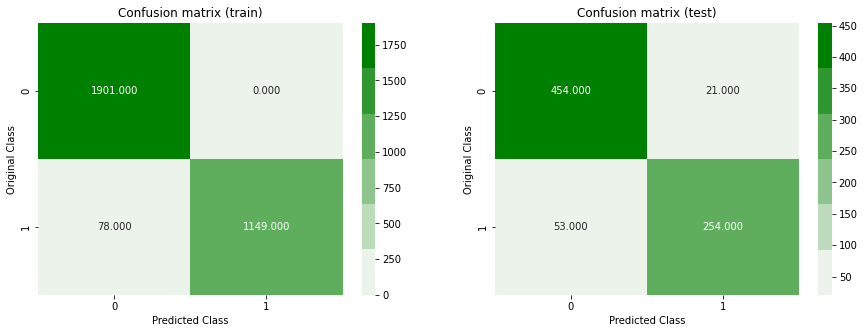

-------------------------------------------------- Precision matrix --------------------------------------------------


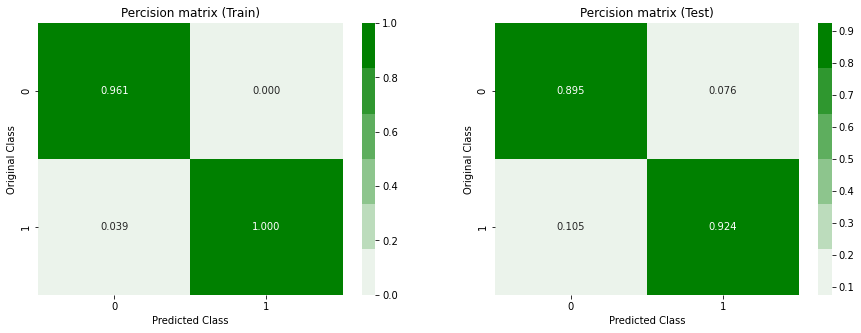

-------------------------------------------------- Recall matrix --------------------------------------------------


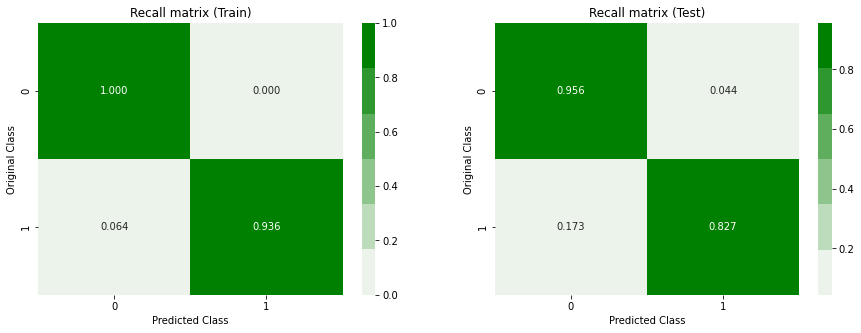

****************************************************************************************************


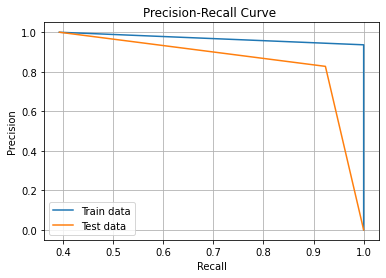

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Normal KNN (cosine distance)

log_loss for k =  1 is 0.25174806234002695
log_loss for k =  3 is 0.2292102714914314
log_loss for k =  5 is 0.23364974826482565
log_loss for k =  7 is 0.23922899107064116
log_loss for k =  9 is 0.2398275898376392
log_loss for k =  11 is 0.24046004078706942
log_loss for k =  13 is 0.24546449053849176
log_loss for k =  15 is 0.24969327973246244
log_loss for k =  17 is 0.2540701415299326
log_loss for k =  19 is 0.2573155874928591
log_loss for k =  21 is 0.26054143820885445
log_loss for k =  23 is 0.26460545161067367


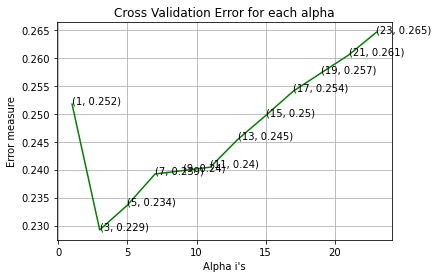

For values of best alpha =  3 The train log loss is: 0.14608674211723938
For values of best alpha =  3 The cross validation log loss is: 0.2292102714914314
Train AUC score: 0.9926275237114083
Test AUC score: 0.9620264015086577
Random model AUC score: 0.5100291445225442


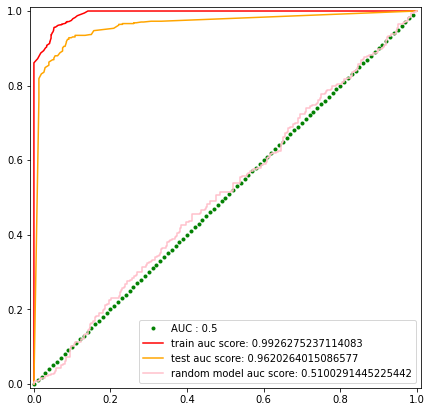

Best Threshold is 0.6079642195471772
****************************************************************************************************
Accuracy on train data : 0.9482097186700768
Accuracy on test data : 0.9181585677749361
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9508890770533446 
Precession on test data: 0.8932038834951457 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9152404237978811 
Recall on test data: 0.8990228013029316 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9327242524916943 
F1 score on test data: 0.8961038961038962 
F1 score on Random model: 0.4384724186704385 
***************************************

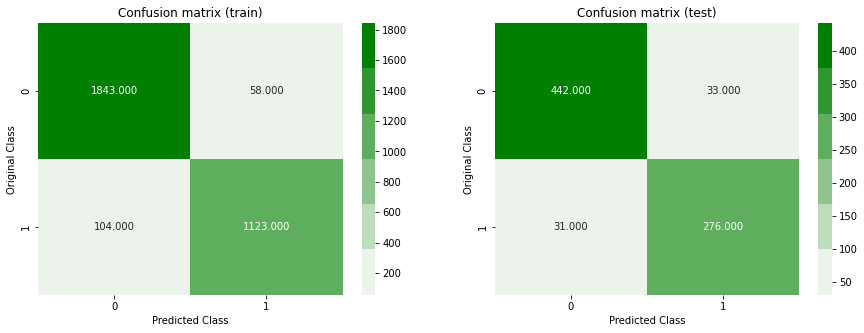

-------------------------------------------------- Precision matrix --------------------------------------------------


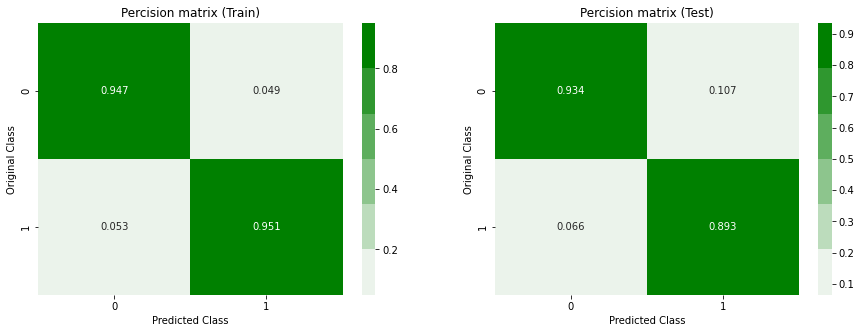

-------------------------------------------------- Recall matrix --------------------------------------------------


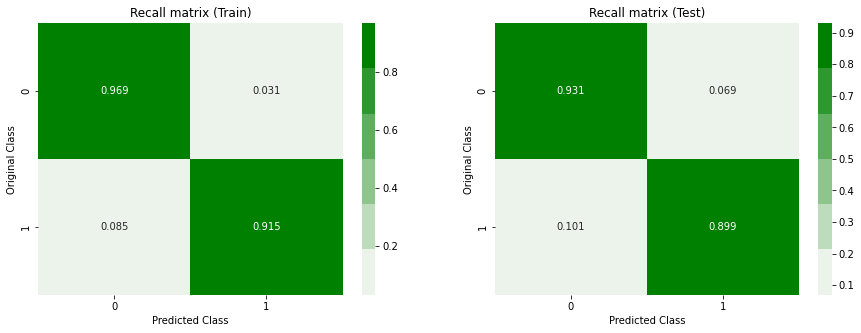

****************************************************************************************************


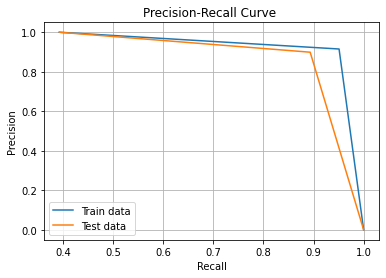

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (minkowski distance)

log_loss for k =  1 is 0.2756236758738367
log_loss for k =  3 is 0.21907686325345552
log_loss for k =  5 is 0.2148187969628476
log_loss for k =  7 is 0.20746280669672792
log_loss for k =  9 is 0.20918797387899693
log_loss for k =  11 is 0.20647043661683104
log_loss for k =  13 is 0.20878432682448286
log_loss for k =  15 is 0.21129946862037258
log_loss for k =  17 is 0.21320800637522924
log_loss for k =  19 is 0.21409003241869182
log_loss for k =  21 is 0.21538724984688828
log_loss for k =  23 is 0.21702508857624747


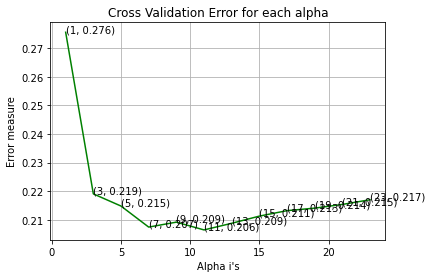

For values of best alpha =  11 The train log loss is: 0.054857709857709484
For values of best alpha =  11 The cross validation log loss is: 0.20647043661683104
Train AUC score: 0.9999991425608364
Test AUC score: 0.9752683010457741
Random model AUC score: 0.5100291445225442


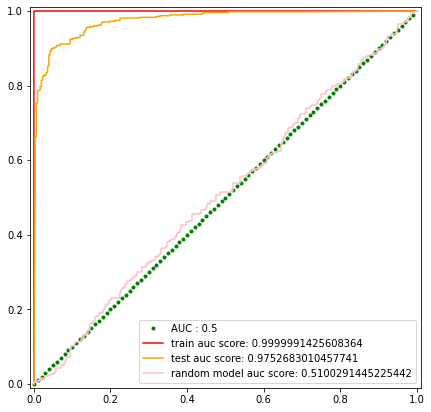

Best Threshold is 0.7797326849580113
****************************************************************************************************
Accuracy on train data : 0.9987212276214834
Accuracy on test data : 0.9040920716112532
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9496124031007752 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9967400162999185 
Recall on test data: 0.7980456026058632 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9983673469387755 
F1 score on test data: 0.8672566371681416 
F1 score on Random model: 0.4384724186704385 
******************************************************

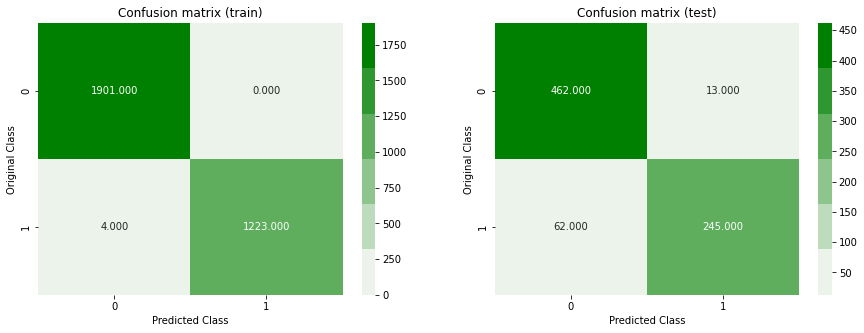

-------------------------------------------------- Precision matrix --------------------------------------------------


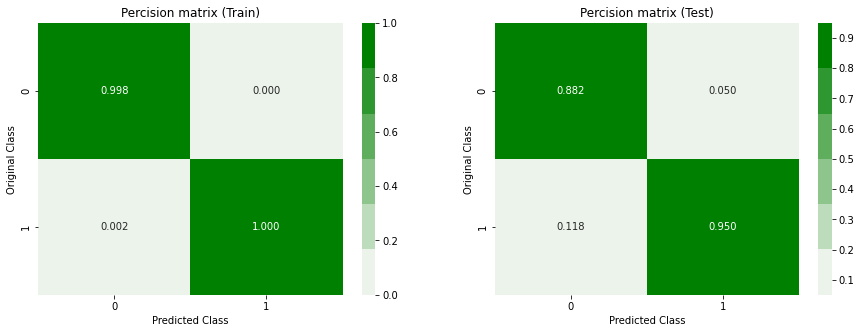

-------------------------------------------------- Recall matrix --------------------------------------------------


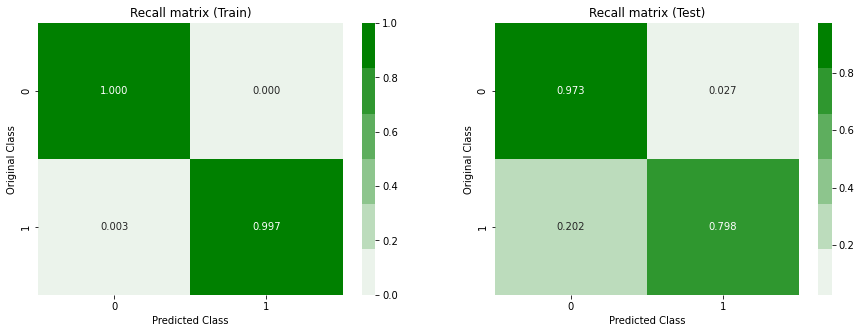

****************************************************************************************************


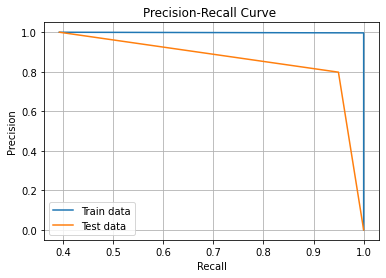

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (cosine distance)

log_loss for k =  1 is 0.25174806234002695
log_loss for k =  3 is 0.2091618762840757
log_loss for k =  5 is 0.20676231978606693
log_loss for k =  7 is 0.20865634772154248
log_loss for k =  9 is 0.20765290669979644
log_loss for k =  11 is 0.20743591957123872
log_loss for k =  13 is 0.20911222312545416
log_loss for k =  15 is 0.21107295737658344
log_loss for k =  17 is 0.21274884418863588
log_loss for k =  19 is 0.21397274335067565
log_loss for k =  21 is 0.21508422370118357
log_loss for k =  23 is 0.21693559553997735


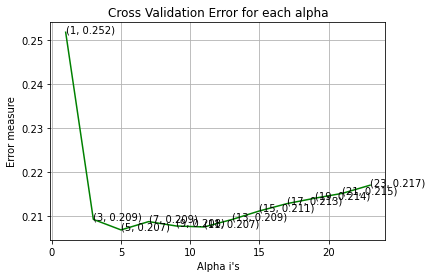

For values of best alpha =  5 The train log loss is: 0.06652925948658137
For values of best alpha =  5 The cross validation log loss is: 0.20676231978606693
Train AUC score: 0.9999991425608363
Test AUC score: 0.968369621121207
Random model AUC score: 0.5100291445225442


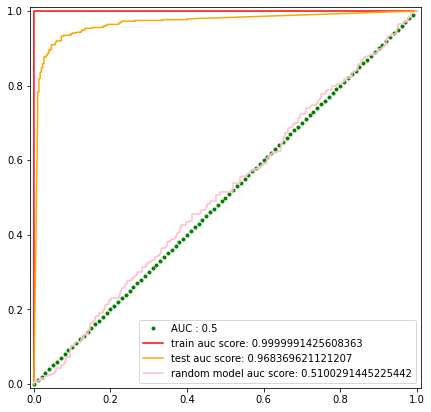

Best Threshold is 0.7843476395975648
****************************************************************************************************
Accuracy on train data : 0.9750639386189258
Accuracy on test data : 0.9053708439897699
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9236363636363636 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9364303178484108 
Recall on test data: 0.8273615635179153 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9671717171717172 
F1 score on test data: 0.8728522336769758 
F1 score on Random model: 0.4384724186704385 
******************************************************

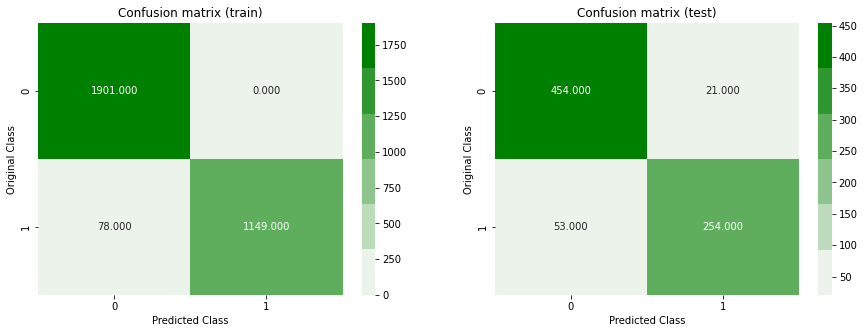

-------------------------------------------------- Precision matrix --------------------------------------------------


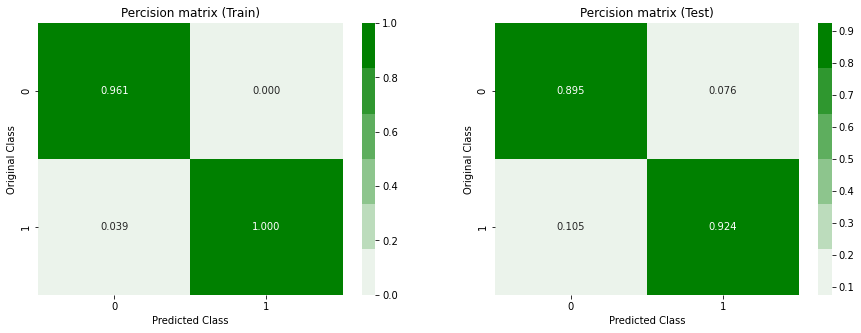

-------------------------------------------------- Recall matrix --------------------------------------------------


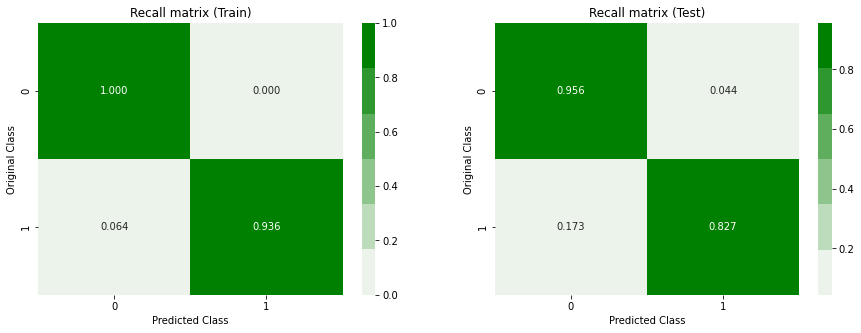

****************************************************************************************************


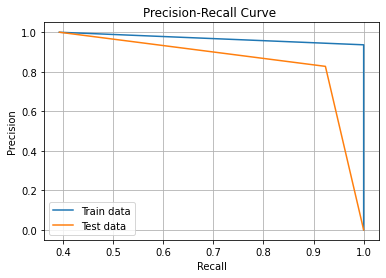

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Logistic Regression

log_loss for c =  1e-05 is 0.38262691483493283
log_loss for c =  0.0001 is 0.3472472247121463
log_loss for c =  0.001 is 0.28721660256130466
log_loss for c =  0.01 is 0.22705776095109612
log_loss for c =  0.1 is 0.1913141730982866
log_loss for c =  1 is 0.18090769544787957
log_loss for c =  10 is 0.1758675074812492
log_loss for c =  100 is 0.17686374458884885
log_loss for c =  1000 is 0.17424069963331718


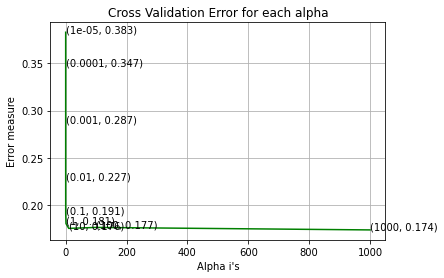

log loss for train data 0.15170696244078796
log loss for cv data 0.17424069963331718
Train AUC score: 0.9874273695438466
Test AUC score: 0.9832744728270186
Random model AUC score: 0.5100291445225442


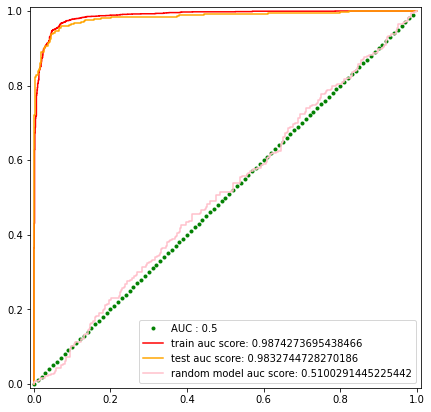

Best Threshold is 0.6334915726734867
****************************************************************************************************
Accuracy on train data : 0.9440537084398977
Accuracy on test data : 0.9309462915601023
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9663120567375887 
Precession on test data: 0.9501779359430605 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.8883455582722086 
Recall on test data: 0.8697068403908795 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9256900212314225 
F1 score on test data: 0.9081632653061226 
F1 score on Random model: 0.4384724186704385 
***************************************

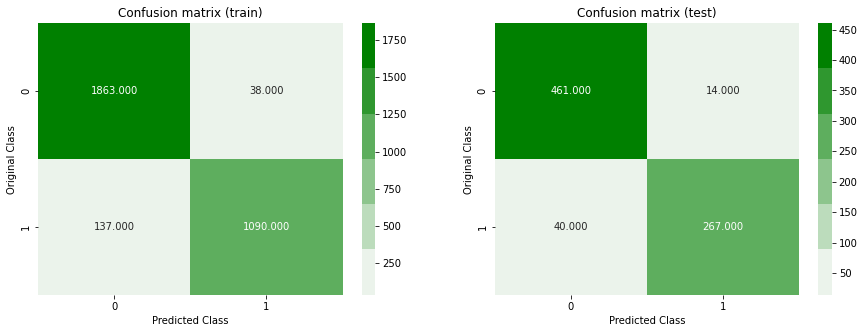

-------------------------------------------------- Precision matrix --------------------------------------------------


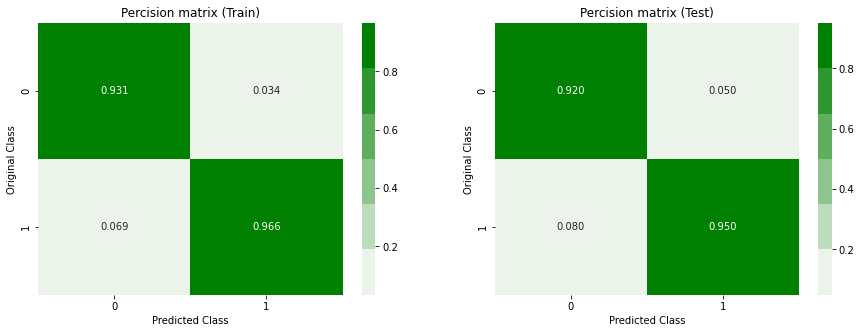

-------------------------------------------------- Recall matrix --------------------------------------------------


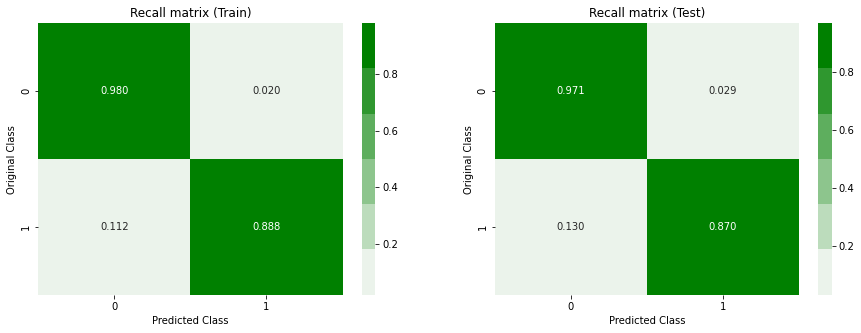

****************************************************************************************************


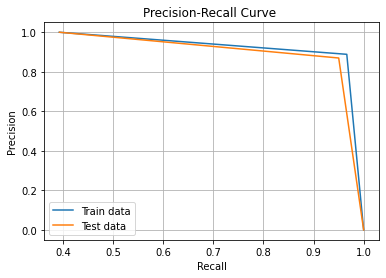

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Random Forest

log_loss for c =  10 is 0.13224356749351127
log_loss for c =  50 is 0.11990731809251648
log_loss for c =  100 is 0.12204663538372405
log_loss for c =  500 is 0.12025157229130987
log_loss for c =  1000 is 0.12088207913914577
log_loss for c =  2000 is 0.12057857532548188
log_loss for c =  3000 is 0.12056755553915995


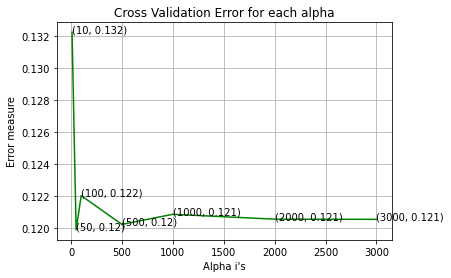

For values of best alpha =  50 The train log loss is: 0.04050856331583985
For values of best alpha =  50 The cross validation log loss is: 0.11990731809251648
Train AUC score: 0.9999982851216728
Test AUC score: 0.9925321446939824
Random model AUC score: 0.5100291445225442


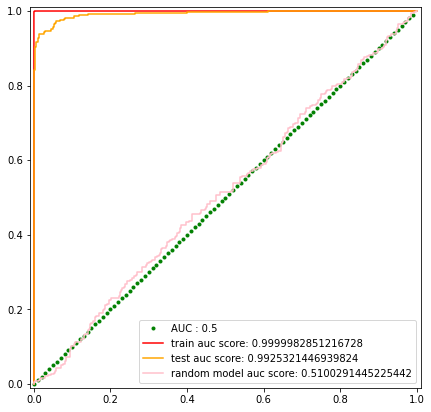

Best Threshold is 0.613831343785004
****************************************************************************************************
Accuracy on train data : 0.9974424552429667
Accuracy on test data : 0.9552429667519181
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9689655172413794 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.993480032599837 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9967293540474244 
F1 score on test data: 0.9413735343383585 
F1 score on Random model: 0.4384724186704385 
********************************************************

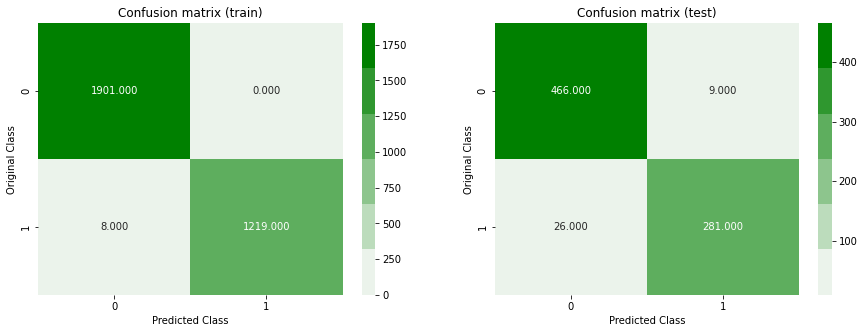

-------------------------------------------------- Precision matrix --------------------------------------------------


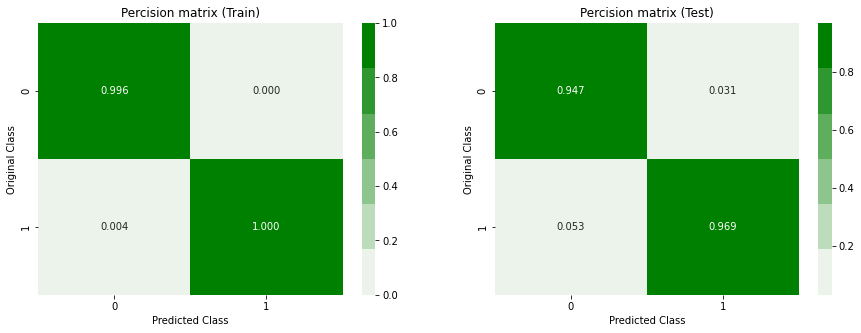

-------------------------------------------------- Recall matrix --------------------------------------------------


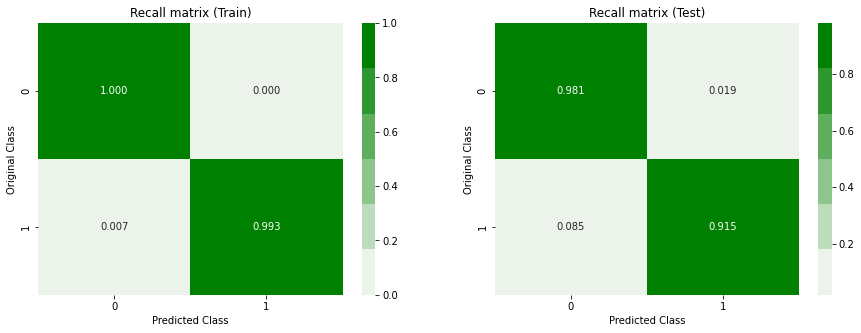

****************************************************************************************************


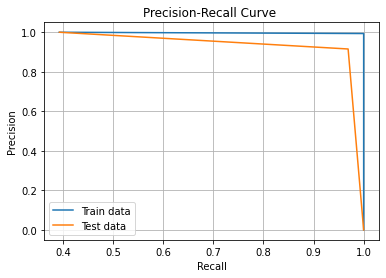

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Xgboost with decision tree as base learners

log_loss for c =  10 is 0.15281823747240103
log_loss for c =  50 is 0.1197967691690601
log_loss for c =  100 is 0.11648690782385683
log_loss for c =  500 is 0.11906810537968222
log_loss for c =  1000 is 0.12266291736217123
log_loss for c =  2000 is 0.12411558860821999


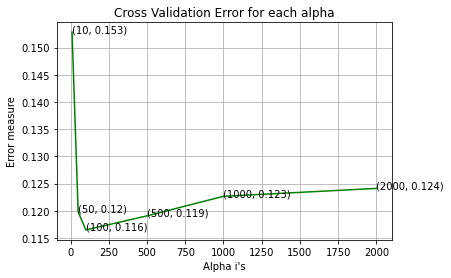

For values of best alpha =  100 The train log loss is: 0.05060763273251188
For values of best alpha =  100 The cross validation log loss is: 0.11648690782385683
Train AUC score: 0.9999198294382017
Test AUC score: 0.9926212926452941
Random model AUC score: 0.5100291445225442


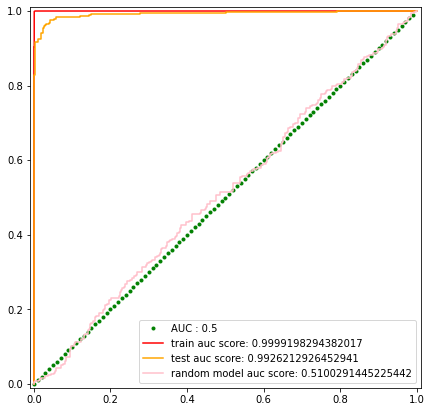

Best Threshold is 0.7017219975590706
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

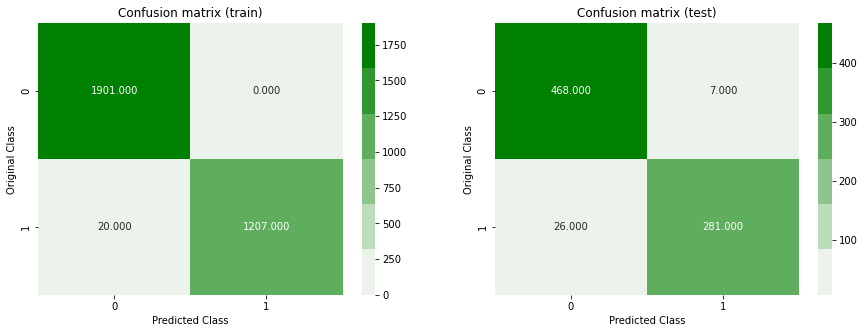

-------------------------------------------------- Precision matrix --------------------------------------------------


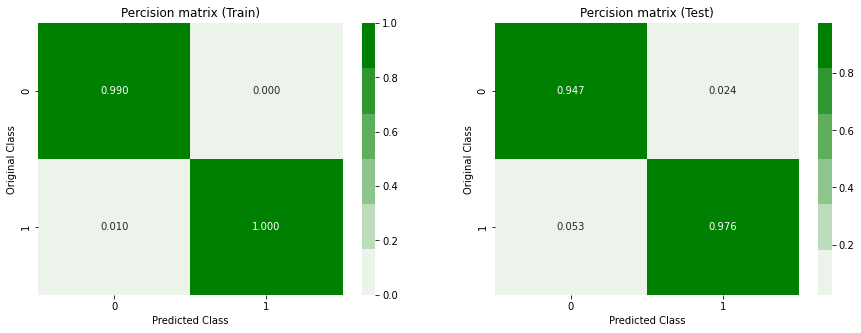

-------------------------------------------------- Recall matrix --------------------------------------------------


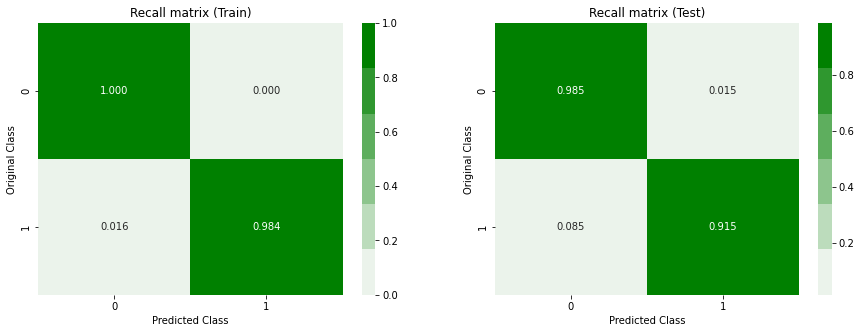

****************************************************************************************************


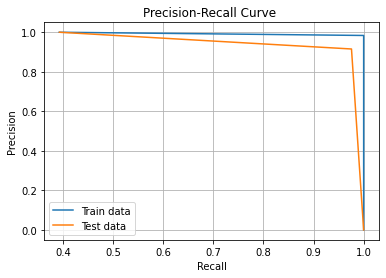

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

XGboost with linear base learners

log_loss for c =  10 is 0.15281823747240103
log_loss for c =  50 is 0.1197967691690601
log_loss for c =  100 is 0.11648690782385683
log_loss for c =  500 is 0.11906810537968222
log_loss for c =  1000 is 0.12266291736217123
log_loss for c =  2000 is 0.12411558860821999


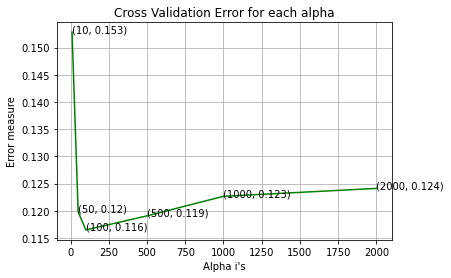

For values of best alpha =  100 The train log loss is: 0.05060763273251188
For values of best alpha =  100 The cross validation log loss is: 0.11648690782385683
Train AUC score: 0.9999198294382017
Test AUC score: 0.9926212926452941
Random model AUC score: 0.5100291445225442


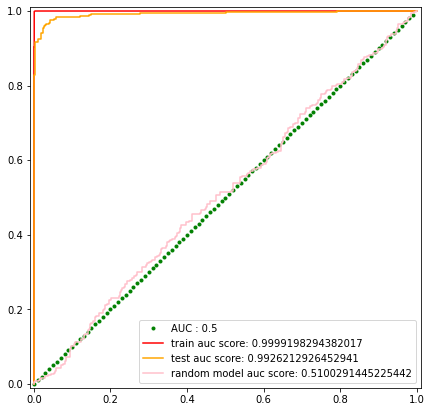

Best Threshold is 0.7017219975590706
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

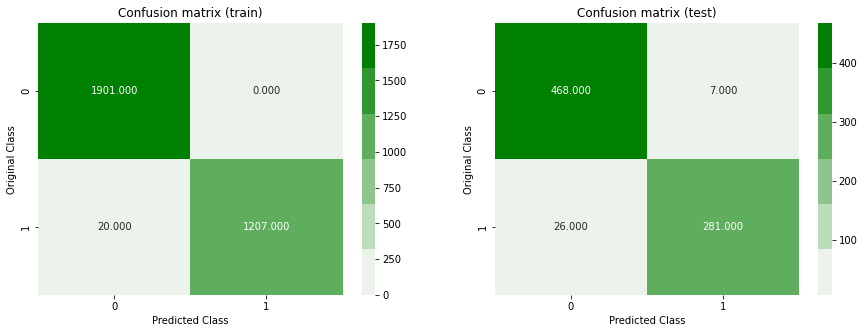

-------------------------------------------------- Precision matrix --------------------------------------------------


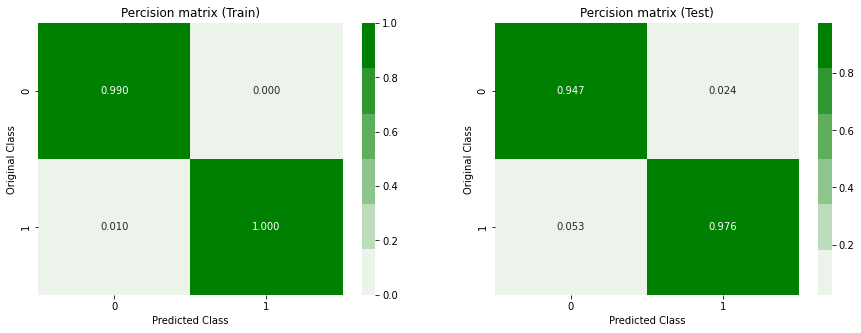

-------------------------------------------------- Recall matrix --------------------------------------------------


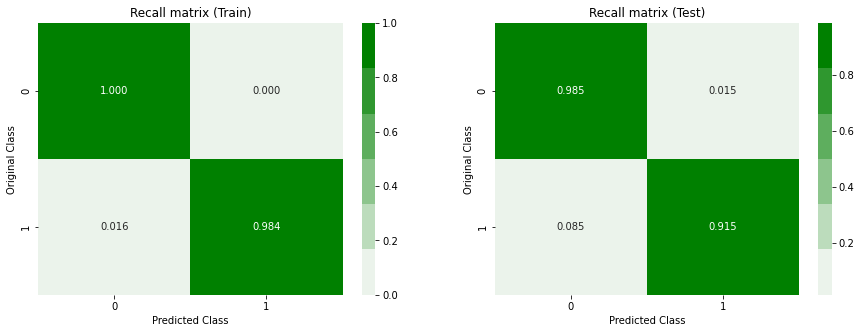

****************************************************************************************************


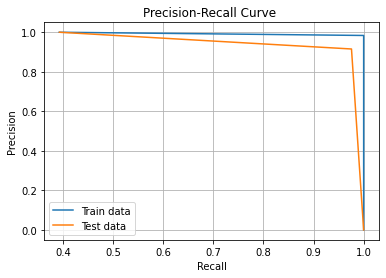

*** Random model ***
                   auc  accuracy  precision    recall   f1score   logloss
random_model  0.510029  0.492327     0.3875  0.504886  0.438472  1.016232
*** ML models ***
                                      auc (train)  auc (test)  \
weighted knn with cosine distance        0.999999    0.968370   
uniform knn with cosine distance         0.992628    0.962026   
weighted knn with minkowski distance     0.999999    0.975268   
weighted knn with cosine distance        0.999999    0.968370   
Logistic Regression                      0.987427    0.983274   
Random Forest                            0.999998    0.992532   
XGBoost                                  0.999920    0.992621   
XGboost linear base learners             0.999920    0.992621   

                                      accuracy (train)  accuracy (test)  \
weighted knn with cosine distance             0.975064         0.905371   
uniform knn with cosine distance              0.948210         0.918159   
we

In [60]:
random_model,metrics=train_all_models(X_train_square_root_robust,y_train,X_val_square_root_robust,y_val)

In [61]:
metrics

,auc (train),auc (test),accuracy (train),accuracy (test),precision (train),precision (test),recall (train),recall (test),f1score (train),f1score (test),logloss (train),logloss (test),Percentage of misclassified pts (Train),Percentage of missclassified pts (Test)
weighted knn with cosine distance,0.999999,0.968370,0.975064,0.905371,1.000000,0.923636,0.936430,0.827362,0.967172,0.872852,0.066529,0.206762,2.493606,9.462916
uniform knn with cosine distance,0.992628,0.962026,0.948210,0.918159,0.950889,0.893204,0.915240,0.899023,0.932724,0.896104,0.146087,0.229210,5.179028,8.184143
weighted knn with minkowski distance,0.999999,0.975268,0.998721,0.904092,1.000000,0.949612,0.996740,0.798046,0.998367,0.867257,0.054858,0.206470,0.127877,9.590793
weighted knn with cosine distance,0.999999,0.968370,0.975064,0.905371,1.000000,0.923636,0.936430,0.827362,0.967172,0.872852,0.066529,0.206762,2.493606,9.462916
Logistic Regression,0.987427,0.983274,0.944054,0.930946,0.966312,0.950178,0.888346,0.869707,0.925690,0.908163,0.151707,0.174241,5.594629,6.905371
Random Forest,0.999998,0.992532,0.997442,0.955243,1.000000,0.968966,0.993480,0.915309,0.996729,0.941374,0.040509,0.119907,0.255754,4.475703
XGBoost,0.999920,0.992621,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050608,0.116487,0.639386,4.219949
XGboost linear base learners,0.999920,0.992621,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050608,0.116487,0.639386,4.219949


In [62]:
all_models_metrics["squared root transformed Robust scaled"]=metrics

### Transforming data to it's square root form is not giving any better log loss compared to log transformation

### Box cox transform

In [63]:
from scipy import stats
from scipy.stats import boxcox
from scipy.special import inv_boxcox

y,fitted_lambda= boxcox(data_original['X1']+0.00001,lmbda=None)
inv_boxcox(y,fitted_lambda)

array([1.0000e-05, 1.0000e-05, 1.0000e-05, ..., 1.2001e-01, 1.0000e-05,
       9.6001e-01])

Original Feature


Text(0.5, 1.0, 'original feature')

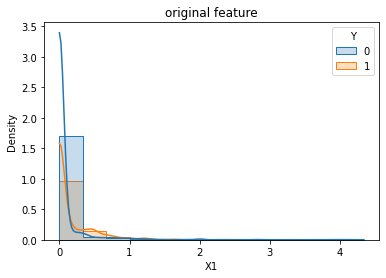

In [64]:
print("Original Feature")
sns.histplot(x=data_original['X1'],hue=data_original['Y'],kde=True,element='step',stat='density')
plt.title("original feature")

Box cox transformed feature


Text(0.5, 1.0, 'BOX COX Transformed feature')

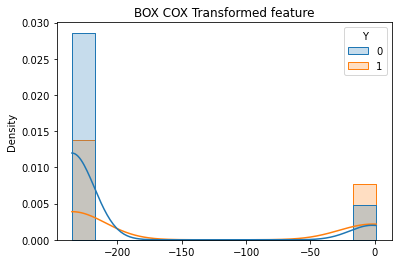

In [65]:
print("Box cox transformed feature")
sns.histplot(x=y,hue=data_original['Y'],kde=True,element='step',stat='density')
plt.title("BOX COX Transformed feature")

### Box cox transformation don't look like Normal distriubtion, but let's try giving box cox transformed feature to model 

In [66]:
boxcox_data=[]
lambdas=[]
for i in X_train:
    y,fitted_lambda= boxcox(i+0.001,lmbda=None)
    boxcox_data.append(y)
    lambdas.append(fitted_lambda)
    #inv_boxcox(y,fitted_lambda)
boxcox_val=[]
u=0
for i in X_val:
    y= boxcox(i+0.001,lmbda=lambdas[u])
    u+=1
    boxcox_val.append(y)
    #lambdas.append(fitted_lambda)
    #inv_boxcox(y,fitted_lambda)
boxcox_data=np.array(boxcox_data)
boxcox_val=np.array(boxcox_val)

In [67]:
boxcox_data=np.hstack([boxcox_data,X_train])
boxcox_val=np.hstack([boxcox_val,X_val])

In [68]:
scaler=RobustScaler()
boxcox_data=scaler.fit_transform(boxcox_data)
boxcox_val=scaler.transform(boxcox_val)


Normal KNN (minkowski distance)

log_loss for k =  1 is 0.44237811029578666
log_loss for k =  3 is 0.3903131964591142
log_loss for k =  5 is 0.37096947276579784
log_loss for k =  7 is 0.3634150482880844
log_loss for k =  9 is 0.35893096993637486
log_loss for k =  11 is 0.3584653096758333
log_loss for k =  13 is 0.35739473132750604
log_loss for k =  15 is 0.3556851622308542
log_loss for k =  17 is 0.3569511440574601
log_loss for k =  19 is 0.35897050754381693
log_loss for k =  21 is 0.3622533647941113
log_loss for k =  23 is 0.3639999460240358


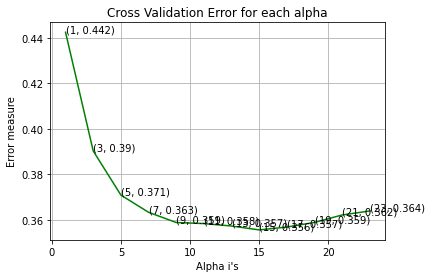

For values of best alpha =  15 The train log loss is: 0.06982322870084423
For values of best alpha =  15 The cross validation log loss is: 0.3556851622308542
Train AUC score: 0.9999991425608363
Test AUC score: 0.9342019543973941
Random model AUC score: 0.5100291445225442


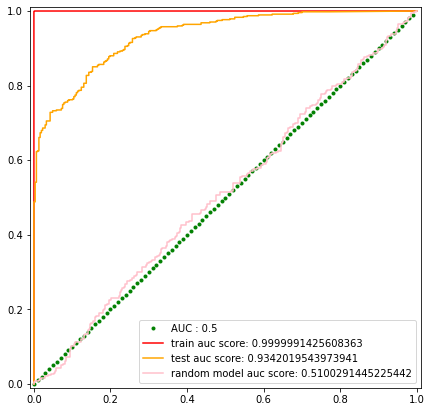

Best Threshold is 0.7840350122597349
****************************************************************************************************
Accuracy on train data : 0.9718670076726342
Accuracy on test data : 0.8248081841432225
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9166666666666666 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.928280358598207 
Recall on test data: 0.6091205211726385 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9628064243448858 
F1 score on test data: 0.7318982387475538 
F1 score on Random model: 0.4384724186704385 
*******************************************************

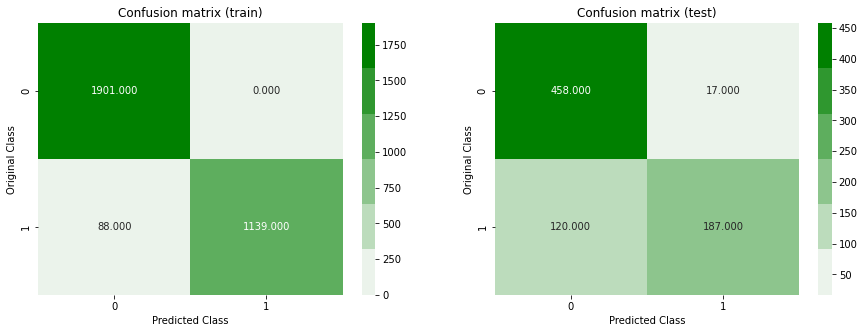

-------------------------------------------------- Precision matrix --------------------------------------------------


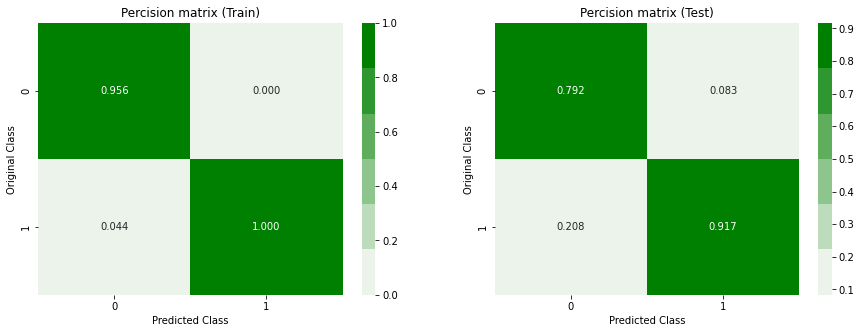

-------------------------------------------------- Recall matrix --------------------------------------------------


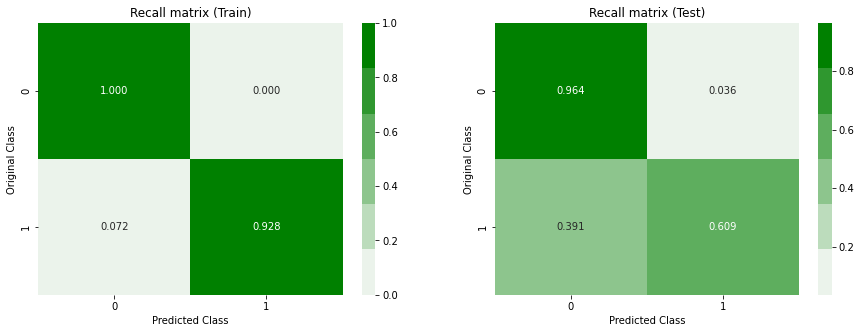

****************************************************************************************************


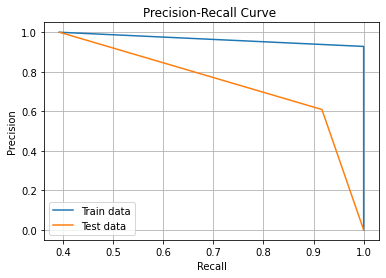

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Normal KNN (cosine distance)

log_loss for k =  1 is 0.44237811029578666
log_loss for k =  3 is 0.39105323009837706
log_loss for k =  5 is 0.37538050069565454
log_loss for k =  7 is 0.3693146441930264
log_loss for k =  9 is 0.3657517498195009
log_loss for k =  11 is 0.3655244274163577
log_loss for k =  13 is 0.3647910365502201
log_loss for k =  15 is 0.36380374111567876
log_loss for k =  17 is 0.3664444722169701
log_loss for k =  19 is 0.37012795490983164
log_loss for k =  21 is 0.37432907083418837
log_loss for k =  23 is 0.3766084857406768


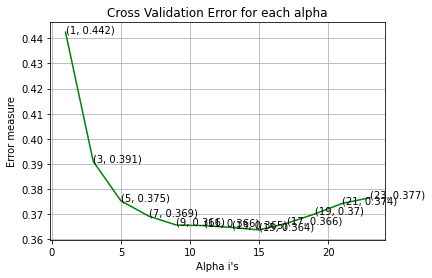

For values of best alpha =  15 The train log loss is: 0.26548690167898586
For values of best alpha =  15 The cross validation log loss is: 0.36380374111567876
Train AUC score: 0.9619659279399552
Test AUC score: 0.9285239156523231
Random model AUC score: 0.5100291445225442


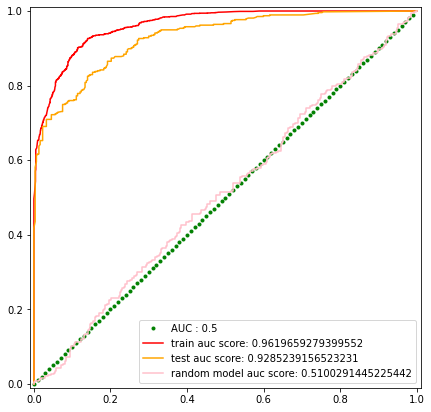

Best Threshold is 0.5958672034416551
****************************************************************************************************
Accuracy on train data : 0.8986572890025576
Accuracy on test data : 0.8375959079283888
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.8908934707903781 
Precession on test data: 0.8813559322033898 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.8451507742461287 
Recall on test data: 0.6775244299674267 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.8674194897532413 
F1 score on test data: 0.7661141804788213 
F1 score on Random model: 0.4384724186704385 
***************************************

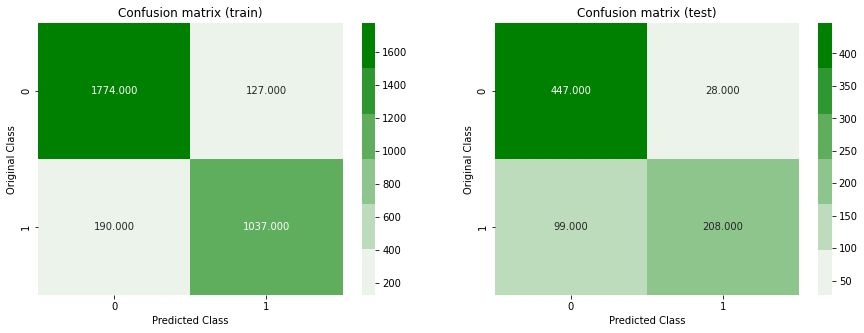

-------------------------------------------------- Precision matrix --------------------------------------------------


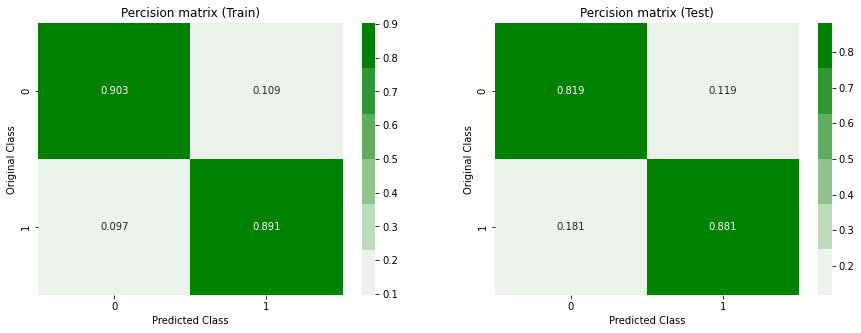

-------------------------------------------------- Recall matrix --------------------------------------------------


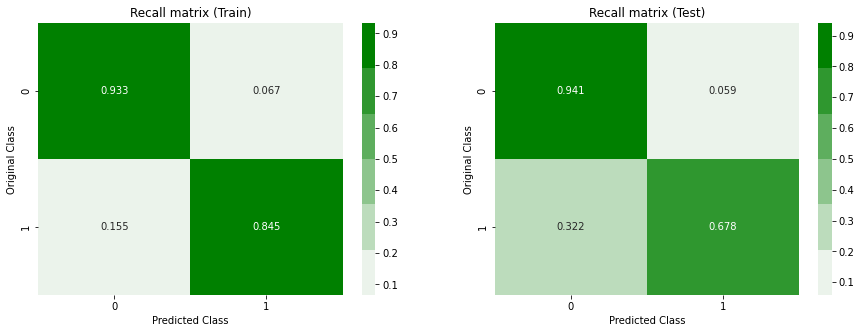

****************************************************************************************************


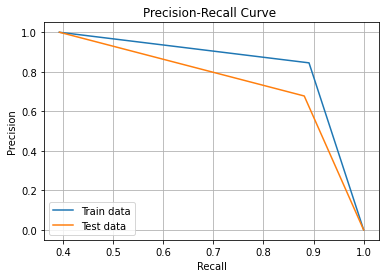

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (minkowski distance)

log_loss for k =  1 is 0.45278078470126515
log_loss for k =  3 is 0.41166088583983307
log_loss for k =  5 is 0.39874140515607037
log_loss for k =  7 is 0.380727058389597
log_loss for k =  9 is 0.3764486283041385
log_loss for k =  11 is 0.37085862569468453
log_loss for k =  13 is 0.36899812148332645
log_loss for k =  15 is 0.37142176237628516
log_loss for k =  17 is 0.3768628733309766
log_loss for k =  19 is 0.3790510404544466
log_loss for k =  21 is 0.38211795844440016
log_loss for k =  23 is 0.3862951181541978


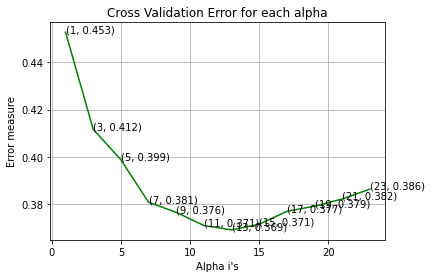

For values of best alpha =  13 The train log loss is: 0.06199837426950934
For values of best alpha =  13 The cross validation log loss is: 0.36899812148332645
Train AUC score: 0.9999991425608363
Test AUC score: 0.9135744899708554
Random model AUC score: 0.5100291445225442


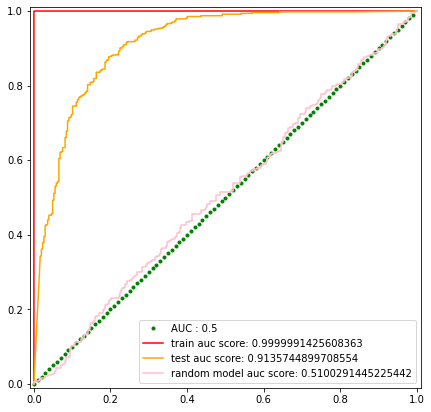

Best Threshold is 0.7774733215625012
****************************************************************************************************
Accuracy on train data : 0.9984015345268542
Accuracy on test data : 0.8337595907928389
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.949238578680203 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9959250203748982 
Recall on test data: 0.6091205211726385 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9979583503470805 
F1 score on test data: 0.7420634920634922 
F1 score on Random model: 0.4384724186704385 
*******************************************************

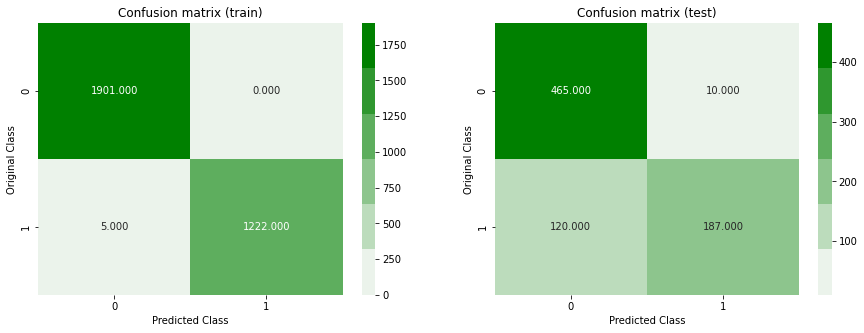

-------------------------------------------------- Precision matrix --------------------------------------------------


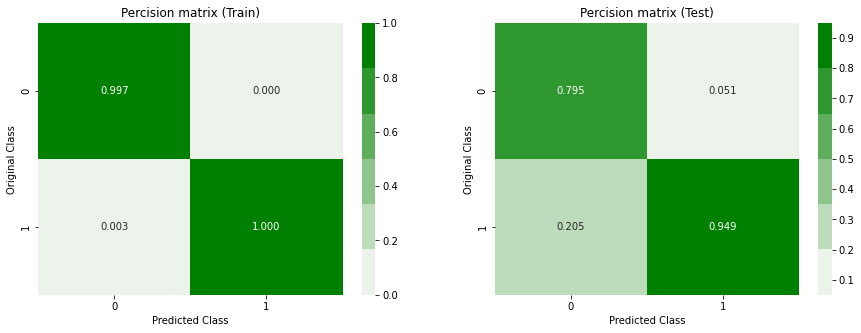

-------------------------------------------------- Recall matrix --------------------------------------------------


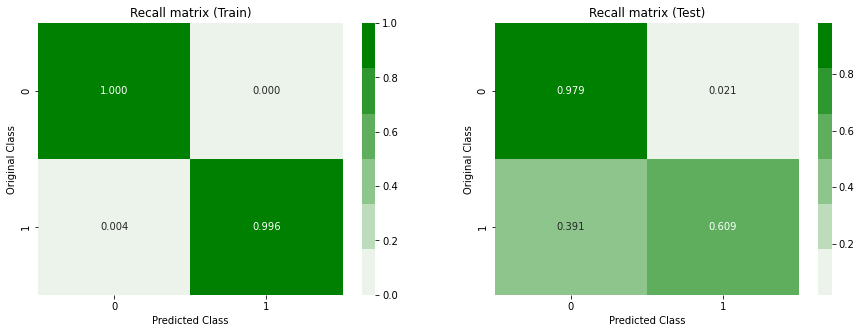

****************************************************************************************************


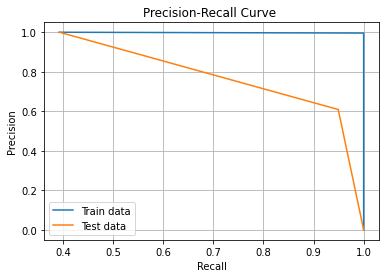

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (cosine distance)

log_loss for k =  1 is 0.44237811029578666
log_loss for k =  3 is 0.3903131964591142
log_loss for k =  5 is 0.37096947276579784
log_loss for k =  7 is 0.3634150482880844
log_loss for k =  9 is 0.35893096993637486
log_loss for k =  11 is 0.3584653096758333
log_loss for k =  13 is 0.35739473132750604
log_loss for k =  15 is 0.3556851622308542
log_loss for k =  17 is 0.3569511440574601
log_loss for k =  19 is 0.35897050754381693
log_loss for k =  21 is 0.3622533647941113
log_loss for k =  23 is 0.3639999460240358


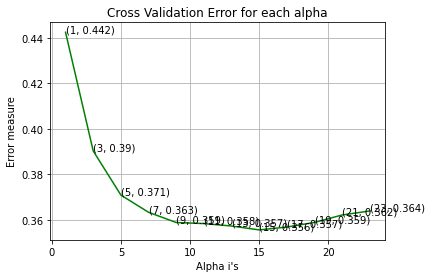

For values of best alpha =  15 The train log loss is: 0.06982322870084423
For values of best alpha =  15 The cross validation log loss is: 0.3556851622308542
Train AUC score: 0.9999991425608363
Test AUC score: 0.9342019543973941
Random model AUC score: 0.5100291445225442


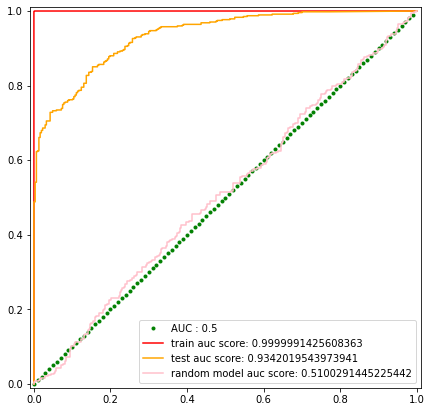

Best Threshold is 0.7840350122597349
****************************************************************************************************
Accuracy on train data : 0.9718670076726342
Accuracy on test data : 0.8248081841432225
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9166666666666666 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.928280358598207 
Recall on test data: 0.6091205211726385 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9628064243448858 
F1 score on test data: 0.7318982387475538 
F1 score on Random model: 0.4384724186704385 
*******************************************************

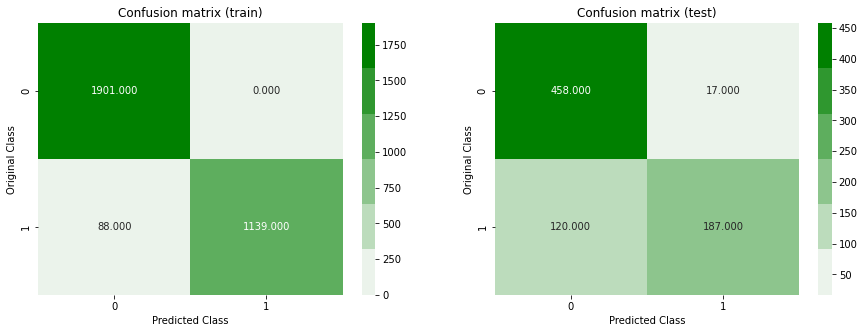

-------------------------------------------------- Precision matrix --------------------------------------------------


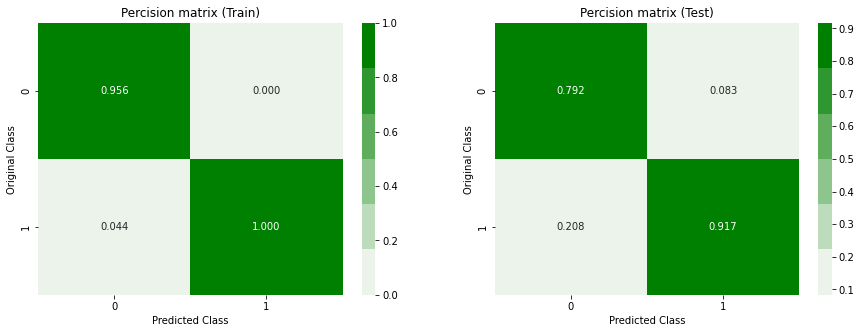

-------------------------------------------------- Recall matrix --------------------------------------------------


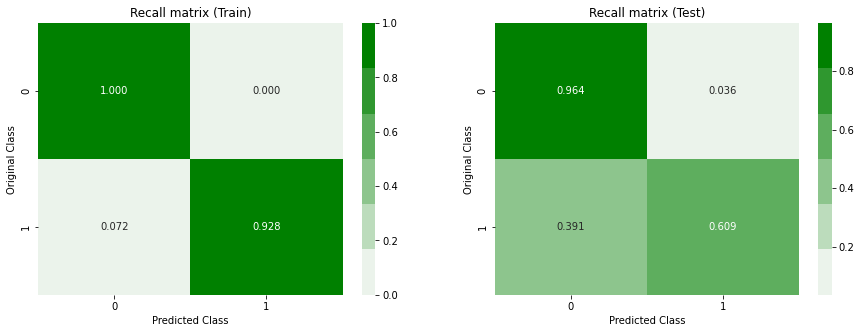

****************************************************************************************************


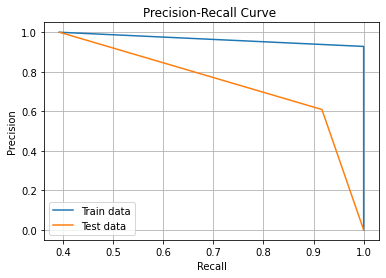

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Logistic Regression

log_loss for c =  1e-05 is 0.7588205121299815
log_loss for c =  0.0001 is 0.7369891085252502
log_loss for c =  0.001 is 0.5286510564243521
log_loss for c =  0.01 is 0.38681114952652185
log_loss for c =  0.1 is 0.4060448963297188
log_loss for c =  1 is 0.38073754400353144
log_loss for c =  10 is 0.38667176567908973
log_loss for c =  100 is 0.3964010797045948
log_loss for c =  1000 is 0.39187778942834167


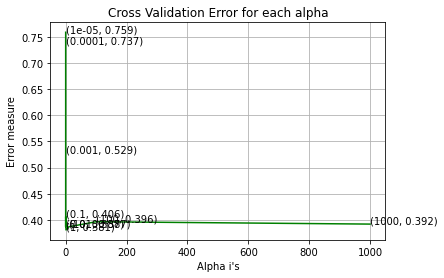

log loss for train data 0.3258399201810427
log loss for cv data 0.38073754400353144
Train AUC score: 0.9527623903174539
Test AUC score: 0.9493879650265729
Random model AUC score: 0.5100291445225442


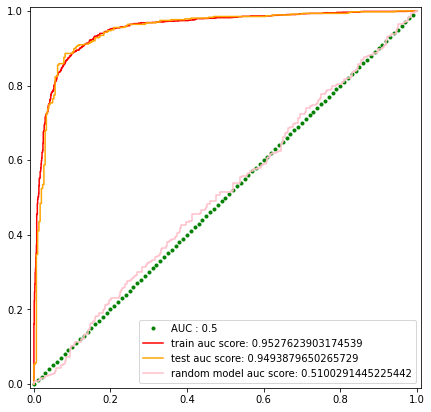

Best Threshold is 0.6341037841942597
****************************************************************************************************
Accuracy on train data : 0.8331202046035806
Accuracy on test data : 0.8260869565217391
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9389788293897883 
Precession on test data: 0.9476439790575916 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.6145069274653626 
Recall on test data: 0.5895765472312704 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.7428571428571429 
F1 score on test data: 0.7269076305220884 
F1 score on Random model: 0.4384724186704385 
***************************************

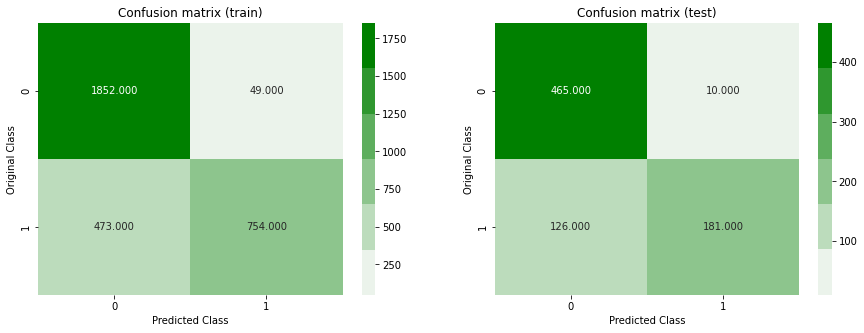

-------------------------------------------------- Precision matrix --------------------------------------------------


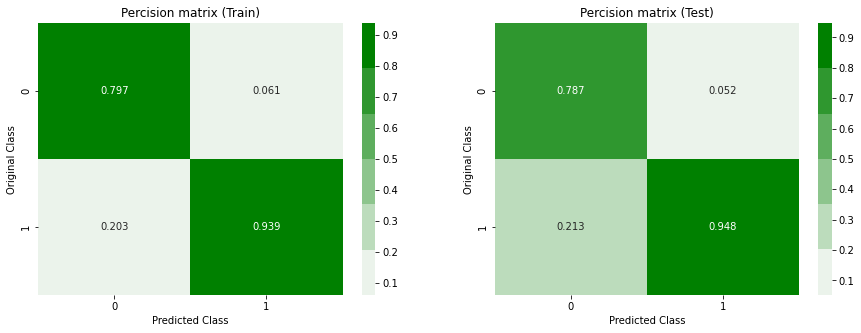

-------------------------------------------------- Recall matrix --------------------------------------------------


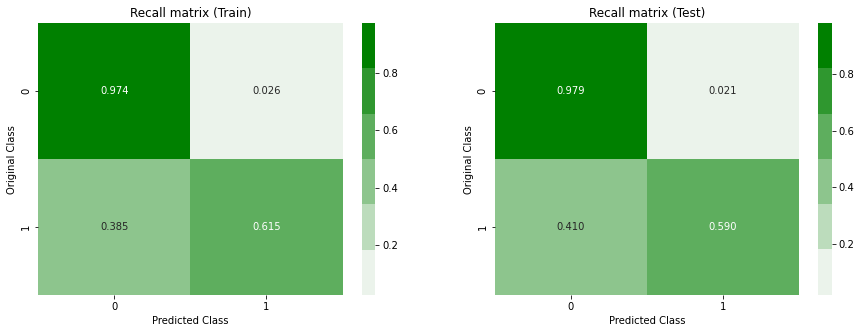

****************************************************************************************************


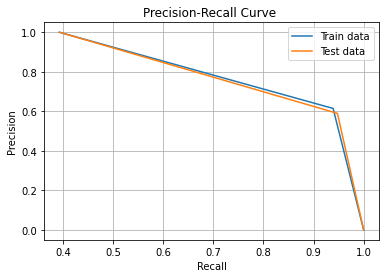

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Random Forest

log_loss for c =  10 is 0.1951583328615237
log_loss for c =  50 is 0.17733185182181313
log_loss for c =  100 is 0.17730406840582827
log_loss for c =  500 is 0.17507266600750726
log_loss for c =  1000 is 0.17435050078674055
log_loss for c =  2000 is 0.17403805535789021
log_loss for c =  3000 is 0.17352453698398185


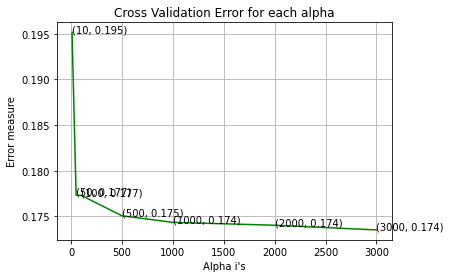

For values of best alpha =  3000 The train log loss is: 0.039051737927259175
For values of best alpha =  3000 The cross validation log loss is: 0.17352453698398185
Train AUC score: 0.9999991425608364
Test AUC score: 0.9803531630378879
Random model AUC score: 0.5100291445225442


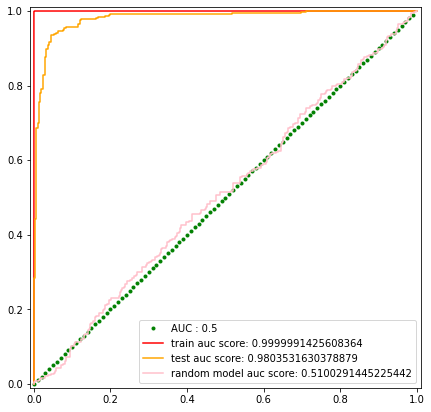

Best Threshold is 0.5883612592684171
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.9335038363171355
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9473684210526315 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.8794788273615635 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.9121621621621621 
F1 score on Random model: 0.4384724186704385 
*******************************************************

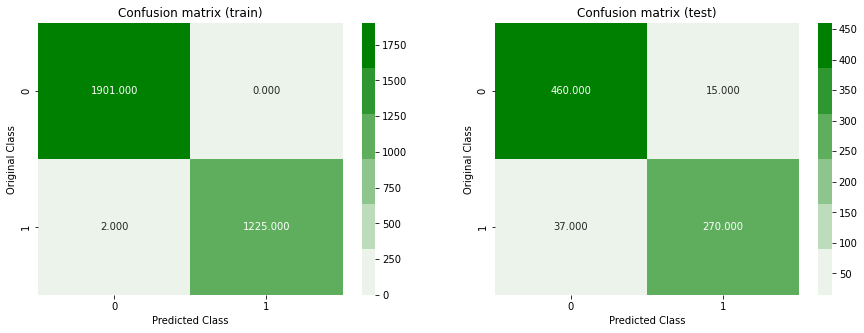

-------------------------------------------------- Precision matrix --------------------------------------------------


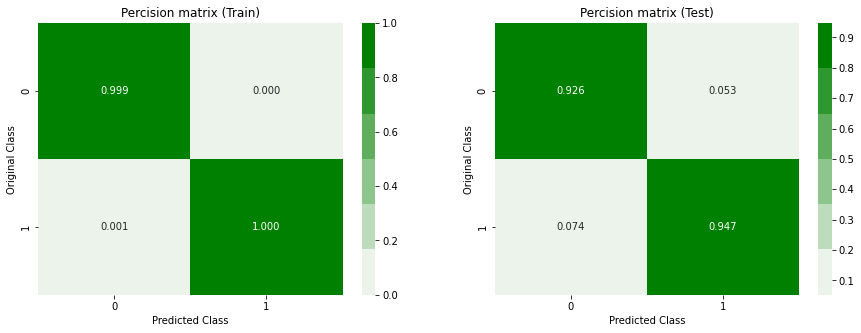

-------------------------------------------------- Recall matrix --------------------------------------------------


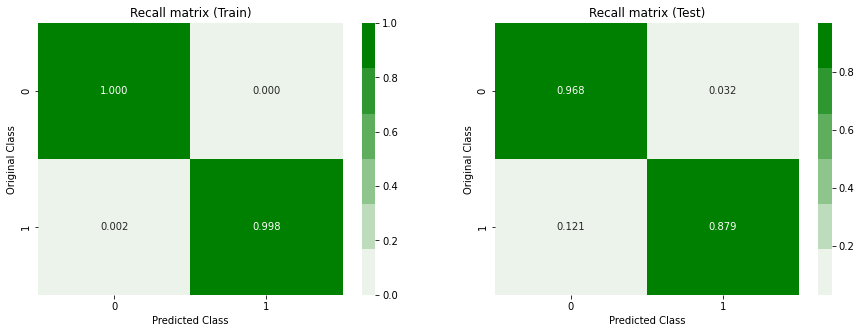

****************************************************************************************************


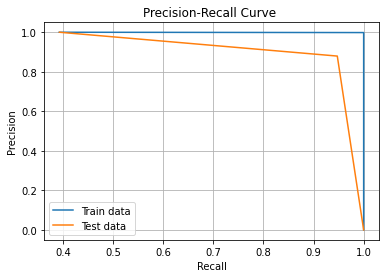

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Xgboost with decision tree as base learners

log_loss for c =  10 is 0.17297709948841541
log_loss for c =  50 is 0.14376321713827805
log_loss for c =  100 is 0.14343971698518385
log_loss for c =  500 is 0.15134959483367516
log_loss for c =  1000 is 0.1548838776898847
log_loss for c =  2000 is 0.15867592836039138


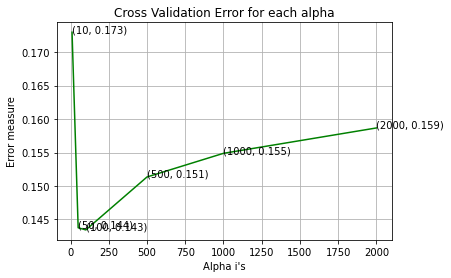

For values of best alpha =  100 The train log loss is: 0.051277992870663924
For values of best alpha =  100 The cross validation log loss is: 0.14343971698518385
Train AUC score: 0.9999764204230005
Test AUC score: 0.9876701525801475
Random model AUC score: 0.5100291445225442


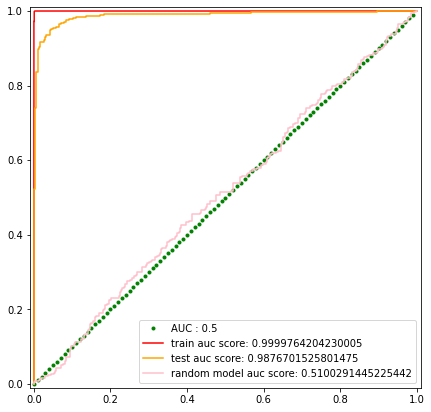

Best Threshold is 0.7240225225687027
****************************************************************************************************
Accuracy on train data : 0.9980818414322251
Accuracy on test data : 0.948849104859335
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9651567944250871 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9951100244498777 
Recall on test data: 0.9022801302931596 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9975490196078431 
F1 score on test data: 0.9326599326599326 
F1 score on Random model: 0.4384724186704385 
*******************************************************

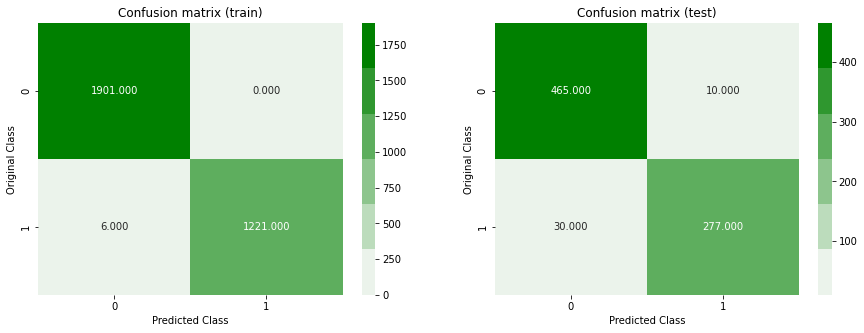

-------------------------------------------------- Precision matrix --------------------------------------------------


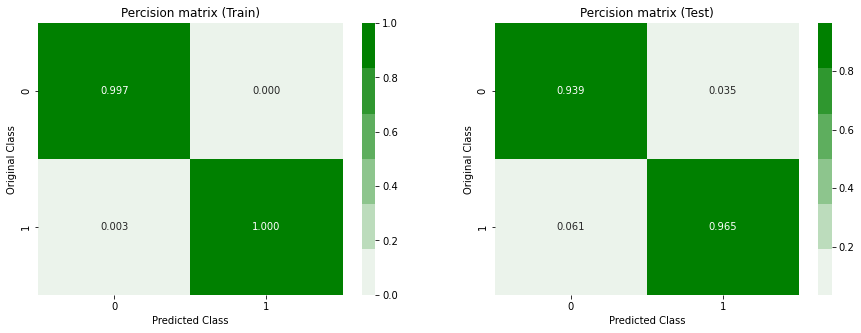

-------------------------------------------------- Recall matrix --------------------------------------------------


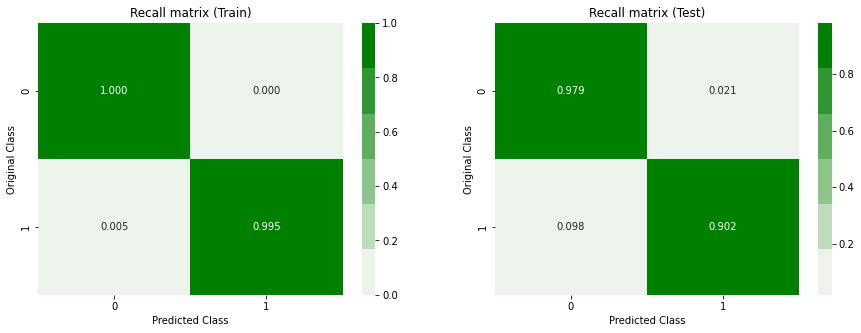

****************************************************************************************************


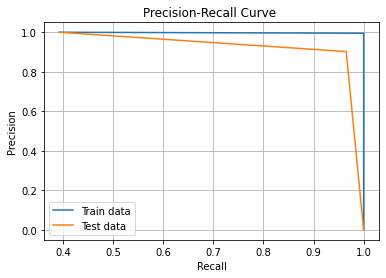

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

XGboost with linear base learners

log_loss for c =  10 is 0.17297709948841541
log_loss for c =  50 is 0.14376321713827805
log_loss for c =  100 is 0.14343971698518385
log_loss for c =  500 is 0.15134959483367516
log_loss for c =  1000 is 0.1548838776898847
log_loss for c =  2000 is 0.15867592836039138


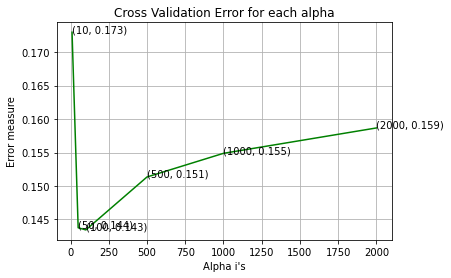

For values of best alpha =  100 The train log loss is: 0.051277992870663924
For values of best alpha =  100 The cross validation log loss is: 0.14343971698518385
Train AUC score: 0.9999764204230005
Test AUC score: 0.9876701525801475
Random model AUC score: 0.5100291445225442


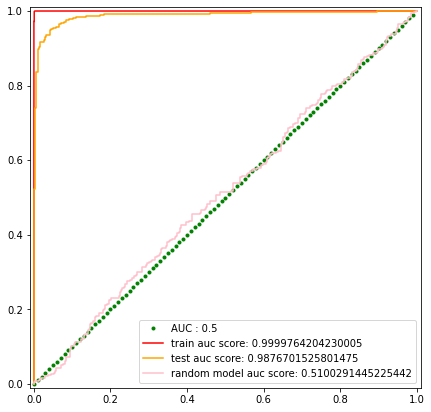

Best Threshold is 0.7240225225687027
****************************************************************************************************
Accuracy on train data : 0.9980818414322251
Accuracy on test data : 0.948849104859335
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9651567944250871 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9951100244498777 
Recall on test data: 0.9022801302931596 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9975490196078431 
F1 score on test data: 0.9326599326599326 
F1 score on Random model: 0.4384724186704385 
*******************************************************

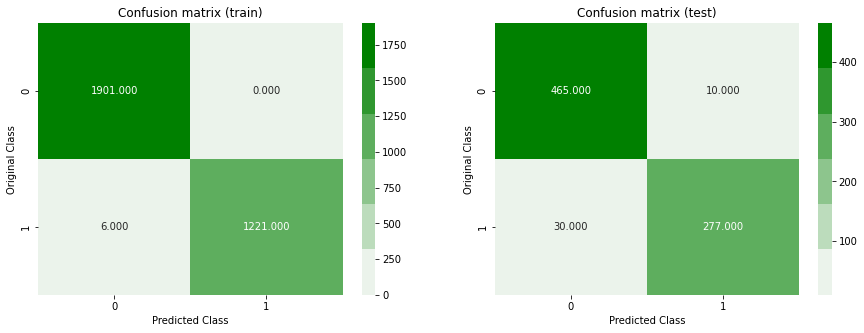

-------------------------------------------------- Precision matrix --------------------------------------------------


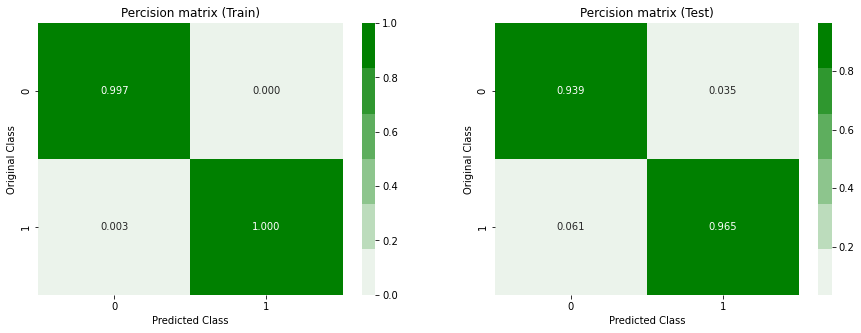

-------------------------------------------------- Recall matrix --------------------------------------------------


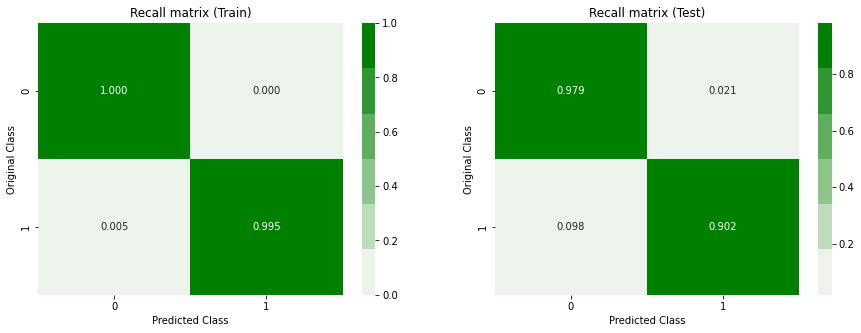

****************************************************************************************************


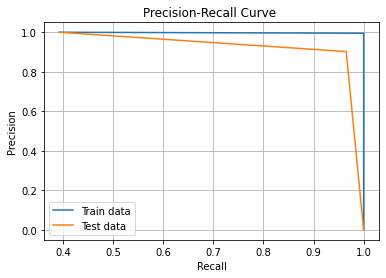

*** Random model ***
                   auc  accuracy  precision    recall   f1score   logloss
random_model  0.510029  0.492327     0.3875  0.504886  0.438472  1.016232
*** ML models ***
                                      auc (train)  auc (test)  \
weighted knn with cosine distance        0.999999    0.934202   
uniform knn with cosine distance         0.961966    0.928524   
weighted knn with minkowski distance     0.999999    0.913574   
weighted knn with cosine distance        0.999999    0.934202   
Logistic Regression                      0.952762    0.949388   
Random Forest                            0.999999    0.980353   
XGBoost                                  0.999976    0.987670   
XGboost linear base learners             0.999976    0.987670   

                                      accuracy (train)  accuracy (test)  \
weighted knn with cosine distance             0.971867         0.824808   
uniform knn with cosine distance              0.898657         0.837596   
we

In [69]:
random_model,metrics=train_all_models(boxcox_data,y_train,boxcox_val,y_val)

In [70]:
metrics

,auc (train),auc (test),accuracy (train),accuracy (test),precision (train),precision (test),recall (train),recall (test),f1score (train),f1score (test),logloss (train),logloss (test),Percentage of misclassified pts (Train),Percentage of missclassified pts (Test)
weighted knn with cosine distance,0.999999,0.934202,0.971867,0.824808,1.000000,0.916667,0.928280,0.609121,0.962806,0.731898,0.069823,0.355685,2.813299,17.519182
uniform knn with cosine distance,0.961966,0.928524,0.898657,0.837596,0.890893,0.881356,0.845151,0.677524,0.867419,0.766114,0.265487,0.363804,10.134271,16.240409
weighted knn with minkowski distance,0.999999,0.913574,0.998402,0.833760,1.000000,0.949239,0.995925,0.609121,0.997958,0.742063,0.061998,0.368998,0.159847,16.624041
weighted knn with cosine distance,0.999999,0.934202,0.971867,0.824808,1.000000,0.916667,0.928280,0.609121,0.962806,0.731898,0.069823,0.355685,2.813299,17.519182
Logistic Regression,0.952762,0.949388,0.833120,0.826087,0.938979,0.947644,0.614507,0.589577,0.742857,0.726908,0.325840,0.380738,16.687980,17.391304
Random Forest,0.999999,0.980353,0.999361,0.933504,1.000000,0.947368,0.998370,0.879479,0.999184,0.912162,0.039052,0.173525,0.063939,6.649616
XGBoost,0.999976,0.987670,0.998082,0.948849,1.000000,0.965157,0.995110,0.902280,0.997549,0.932660,0.051278,0.143440,0.191816,5.115090
XGboost linear base learners,0.999976,0.987670,0.998082,0.948849,1.000000,0.965157,0.995110,0.902280,0.997549,0.932660,0.051278,0.143440,0.191816,5.115090


In [71]:
all_models_metrics["BoxCox transformed Robust scaled"]=metrics

### Boxcox transformation didn't decreased log loss for distance based models when compared to log transformation

### Checking which disribution is best fit to our dataset 

In [72]:
from distfit import distfit
data1 = np.random.normal(loc=5.0, scale=10, size=1000)
dist1 = distfit(bins=25,alpha=0.02,stats='ks',distr='popular',)
dist1.fit_transform(data['X49'])

[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [ks: 1.82862] [loc=0.037 scale=0.235]
[distfit] >[expon     ] [0.00 sec] [ks: 3.22842] [loc=0.000 scale=0.037]
[distfit] >[pareto    ] [0.12 sec] [ks: 4.40187] [loc=-0.000 scale=0.000]
[distfit] >[dweibull  ] [0.16 sec] [ks: 1.44841] [loc=0.000 scale=0.011]
[distfit] >[t         ] [0.09 sec] [ks: 4.40187] [loc=-0.000 scale=0.000]
[distfit] >[genextreme] [0.30 sec] [ks: 4.40187] [loc=-0.000 scale=0.000]
[distfit] >[gamma     ] [0.11 sec] [ks: 1.10847] [loc=-0.000 scale=1.305]
[distfit] >[lognorm   ] [0.20 sec] [ks: 7.47467] [loc=-0.000 scale=0.002]
[distfit] >[beta      ] [0.18 sec] [ks: 3.78909] [loc=-0.000 scale=21.425]
[distfit] >[uniform   ] [0.00 sec] [ks: 12.1018] [loc=0.000 scale=4.385]
[distfit] >[loggamma  ] [0.10 sec] [ks: 1.44841] [loc=-61.832 scale=8.873]
[distfit] >Compute confidence interval [parametric]


{'model': {'distr': <scipy.stats._continuous_distns.gamma_gen at 0xffff7d1ea470>,
  'stats': 'ks',
  'params': (0.03057685724859585, -2.0249629805548935e-29, 1.3053444315366396),
  'name': 'gamma',
  'model': <scipy.stats._distn_infrastructure.rv_frozen at 0xffff4f0e7a00>,
  'score': 1.1084716548468694,
  'loc': -2.0249629805548935e-29,
  'scale': 1.3053444315366396,
  'arg': (0.03057685724859585,),
  'CII_min_alpha': -2.0249629805548935e-29,
  'CII_max_alpha': 0.5688301786387251},
 'summary':          distr      score  LLE        loc      scale  \
 0        gamma   1.108472  NaN       -0.0   1.305344   
 1     dweibull   1.448411  NaN        0.0   0.010903   
 2     loggamma   1.448411  NaN -61.832229   8.873096   
 3         norm   1.828622  NaN   0.037493   0.235024   
 4        expon   3.228419  NaN        0.0   0.037493   
 5         beta   3.789087  NaN       -0.0  21.424718   
 6       pareto   4.401871  NaN       -0.0        0.0   
 7            t   4.401871  NaN       -0.0    

[distfit] >plot..


(<Figure size 720x576 with 1 Axes>,
 <AxesSubplot:title={'center':'\ngamma\nks(a=0.0305769, loc=-2.02496e-29, scale=1.30534)'}, xlabel='Values', ylabel='Frequency'>)

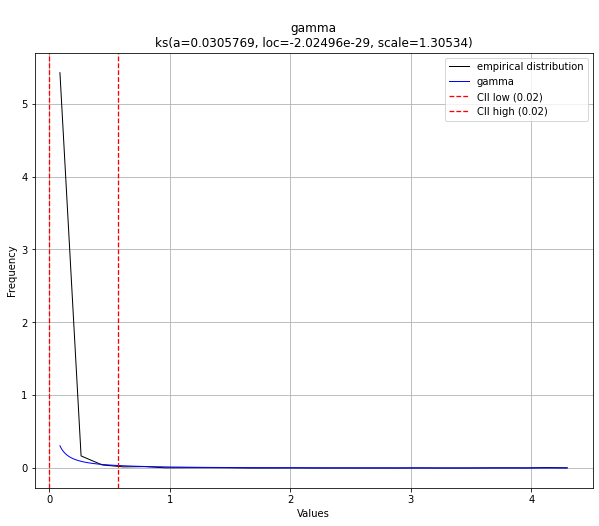

In [73]:
dist1.plot()

### Using KS stastistic , we can say ,this feature is approximately similar to beta distributin

### Approximating normal distribution with beta distribution 

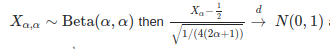

##### reference : https://stats.stackexchange.com/questions/317729/is-the-gaussian-distribution-a-specific-case-of-the-beta-distribution

In [74]:
X_train_standardized_gamma=(X_train_standardized-1/2)/np.sqrt(1/(4*(2*4+1)))
X_val_standardized_gamma=(X_val_standardized-1/2)/np.sqrt(1/(4*(2*4+1)))

In [75]:
X_train_standardized_gamma=np.hstack([X_train_standardized_gamma,X_train_standardized])
X_val_standardized_gamma=np.hstack([X_val_standardized_gamma,X_val_standardized])


Normal KNN (minkowski distance)

log_loss for k =  1 is 0.32684660595937887
log_loss for k =  3 is 0.27885183736400404
log_loss for k =  5 is 0.25885130907104753
log_loss for k =  7 is 0.256553599700476
log_loss for k =  9 is 0.2535571554306656
log_loss for k =  11 is 0.2484915894799896
log_loss for k =  13 is 0.24398905726692122
log_loss for k =  15 is 0.24158356881754267
log_loss for k =  17 is 0.2412715810049747
log_loss for k =  19 is 0.24332555954763987
log_loss for k =  21 is 0.24446642735954202
log_loss for k =  23 is 0.2464748695441573


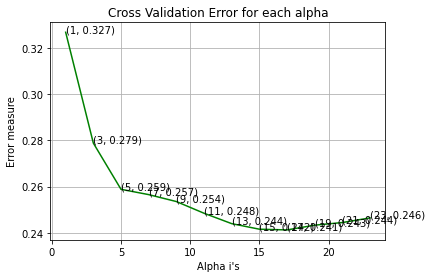

For values of best alpha =  17 The train log loss is: 0.04713053077927999
For values of best alpha =  17 The cross validation log loss is: 0.2412715810049747
Train AUC score: 0.9999991425608364
Test AUC score: 0.967299845705469
Random model AUC score: 0.5100291445225442


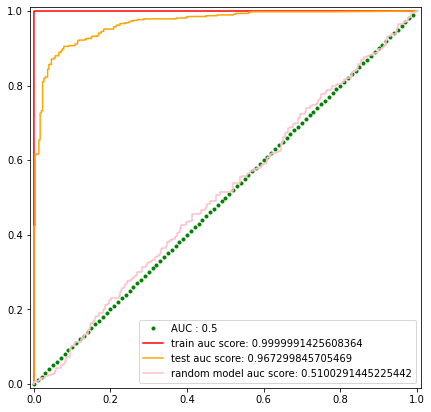

Best Threshold is 0.7799792244669626
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.8836317135549873
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9390243902439024 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.752442996742671 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.8354430379746836 
F1 score on Random model: 0.4384724186704385 
********************************************************

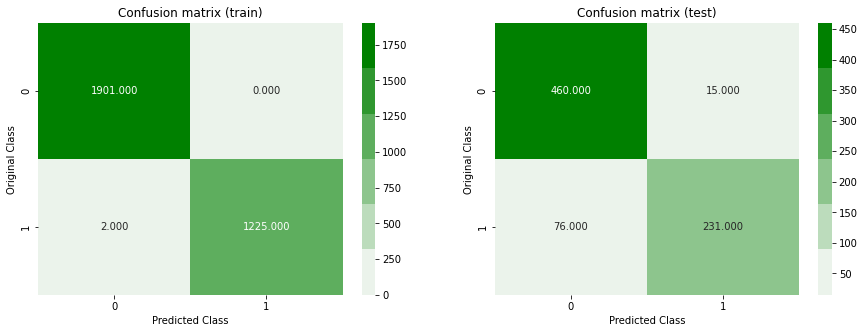

-------------------------------------------------- Precision matrix --------------------------------------------------


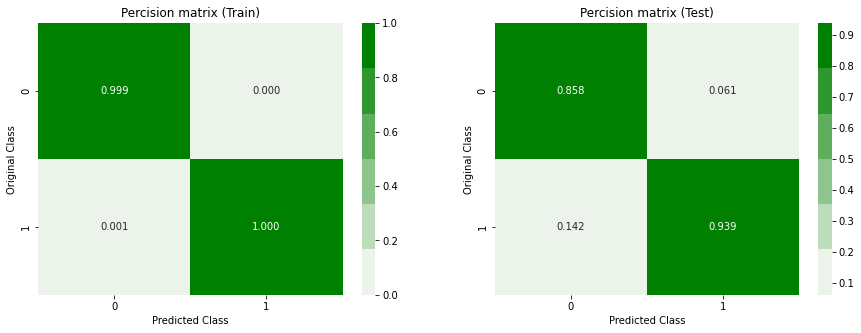

-------------------------------------------------- Recall matrix --------------------------------------------------


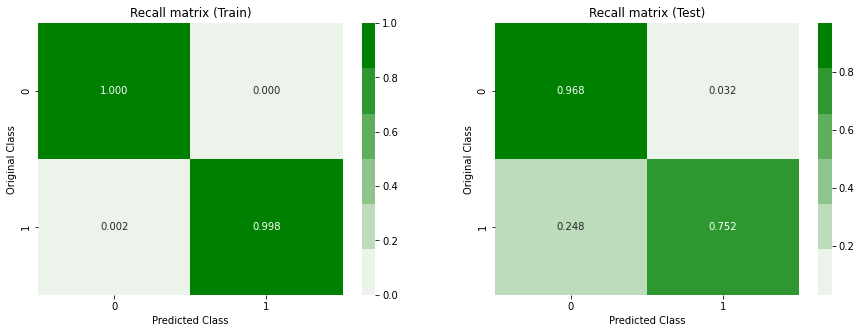

****************************************************************************************************


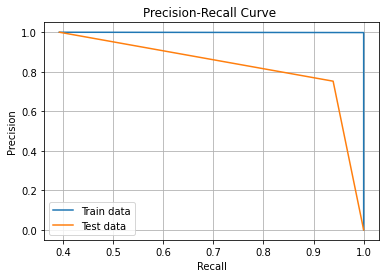

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Normal KNN (cosine distance)

log_loss for k =  1 is 0.32684660595937887
log_loss for k =  3 is 0.2979915009343088
log_loss for k =  5 is 0.2888788365345588
log_loss for k =  7 is 0.2954596966343756
log_loss for k =  9 is 0.29556499452409446
log_loss for k =  11 is 0.2924863522478344
log_loss for k =  13 is 0.2908385752776836
log_loss for k =  15 is 0.29010545560598583
log_loss for k =  17 is 0.29150736318013565
log_loss for k =  19 is 0.29685922973292794
log_loss for k =  21 is 0.3003630104442988
log_loss for k =  23 is 0.30395391418122525


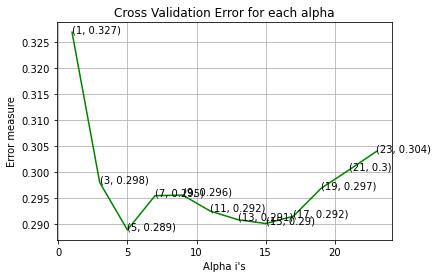

For values of best alpha =  5 The train log loss is: 0.17940785005049378
For values of best alpha =  5 The cross validation log loss is: 0.2888788365345588
Train AUC score: 0.9847390834061084
Test AUC score: 0.9471524087090692
Random model AUC score: 0.5100291445225442


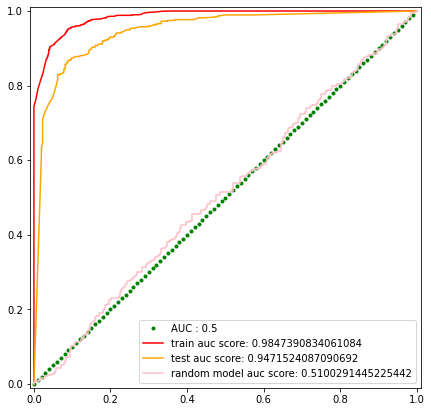

Best Threshold is 0.5939565737916974
****************************************************************************************************
Accuracy on train data : 0.9277493606138107
Accuracy on test data : 0.8797953964194374
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9504950495049505 
Precession on test data: 0.895910780669145 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.8606356968215159 
Recall on test data: 0.7850162866449512 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9033361847733106 
F1 score on test data: 0.8368055555555556 
F1 score on Random model: 0.4384724186704385 
****************************************

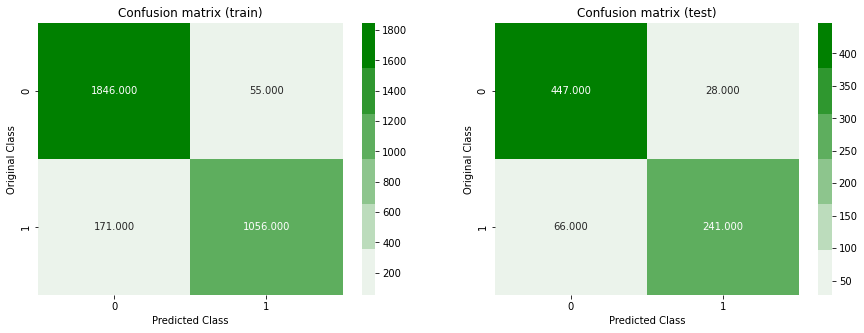

-------------------------------------------------- Precision matrix --------------------------------------------------


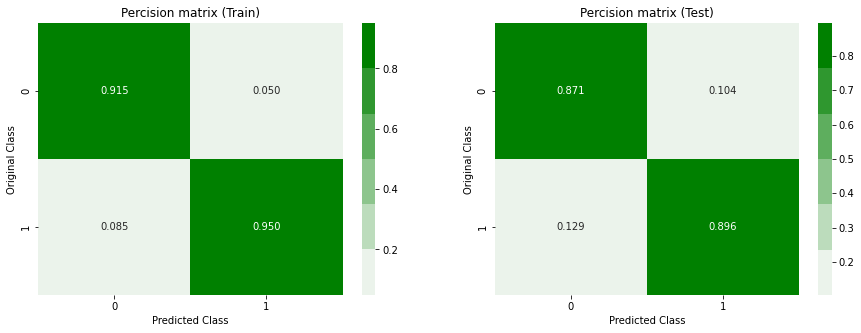

-------------------------------------------------- Recall matrix --------------------------------------------------


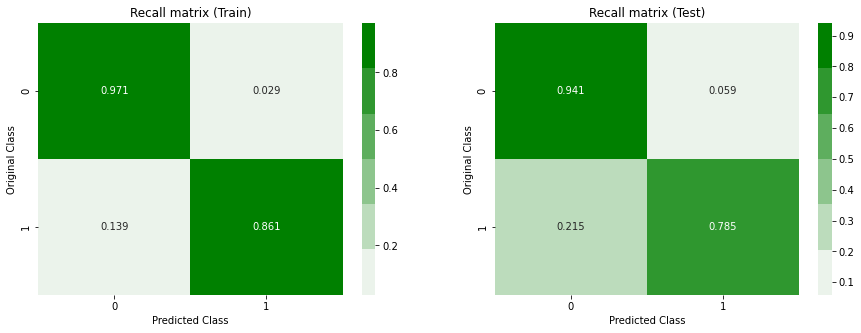

****************************************************************************************************


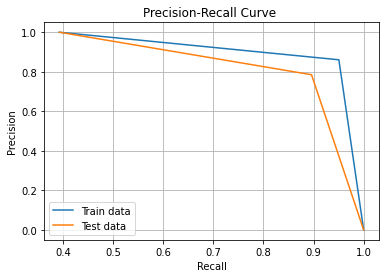

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (minkowski distance)

log_loss for k =  1 is 0.3165167112065577
log_loss for k =  3 is 0.2668359826587277
log_loss for k =  5 is 0.2581680933654876
log_loss for k =  7 is 0.2514104671342185
log_loss for k =  9 is 0.2510463736578439
log_loss for k =  11 is 0.2488710704010717
log_loss for k =  13 is 0.2488024552899838
log_loss for k =  15 is 0.24907480896091422
log_loss for k =  17 is 0.25065706927396314
log_loss for k =  19 is 0.25266313681852515
log_loss for k =  21 is 0.2533602411519157
log_loss for k =  23 is 0.2538837150053409


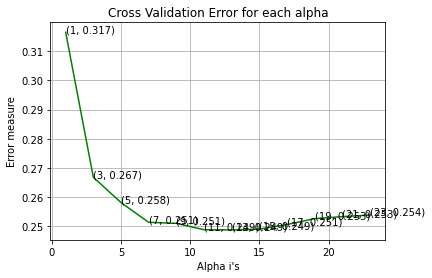

For values of best alpha =  13 The train log loss is: 0.047929681890209984
For values of best alpha =  13 The cross validation log loss is: 0.2488024552899838
Train AUC score: 0.9999991425608363
Test AUC score: 0.9639705126007199
Random model AUC score: 0.5100291445225442


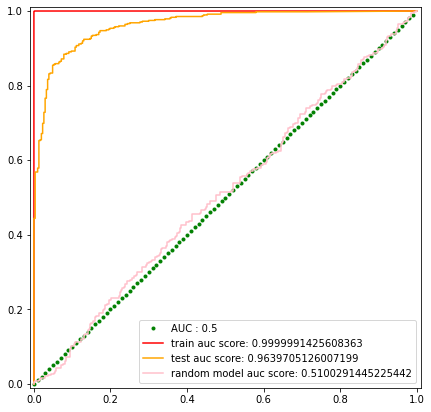

Best Threshold is 0.7809675300661446
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.8861892583120204
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.92578125 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.7719869706840391 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.8419182948490231 
F1 score on Random model: 0.4384724186704385 
***************************************************************

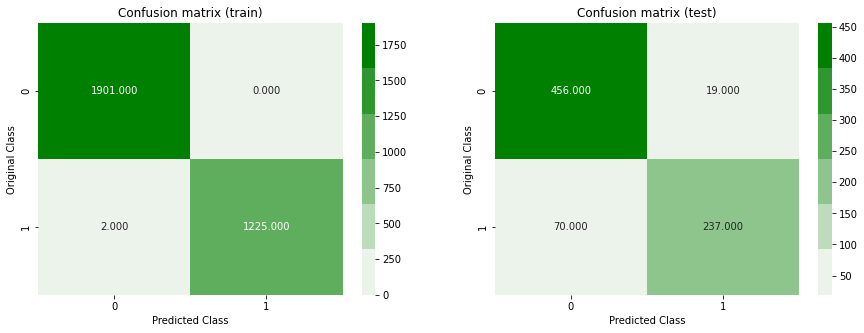

-------------------------------------------------- Precision matrix --------------------------------------------------


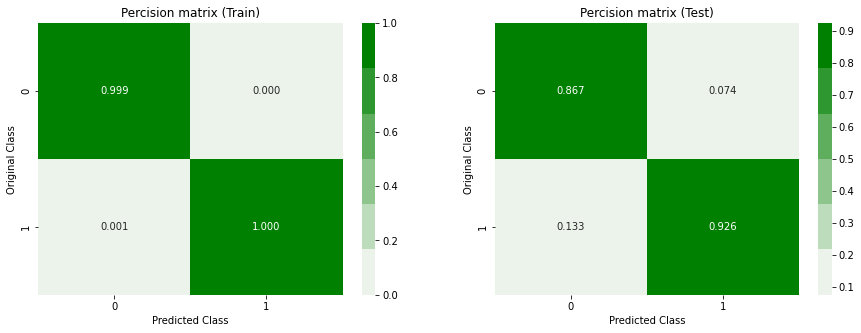

-------------------------------------------------- Recall matrix --------------------------------------------------


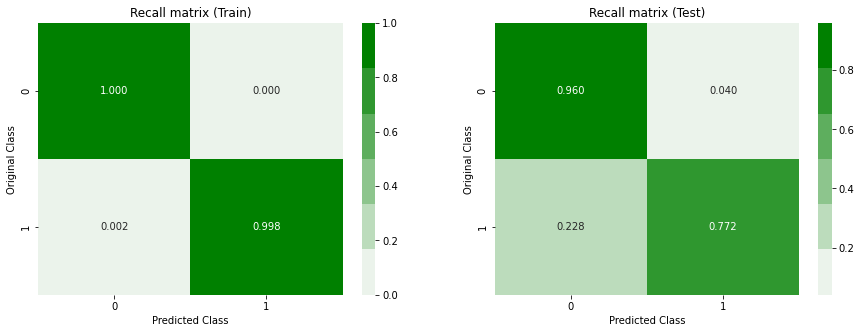

****************************************************************************************************


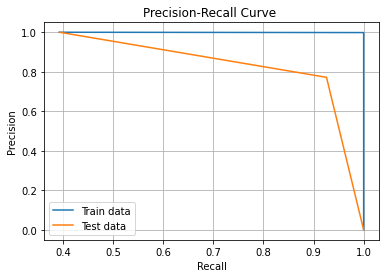

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Weighted KNN (cosine distance)

log_loss for k =  1 is 0.32684660595937887
log_loss for k =  3 is 0.27885183736400404
log_loss for k =  5 is 0.25885130907104753
log_loss for k =  7 is 0.256553599700476
log_loss for k =  9 is 0.2535571554306656
log_loss for k =  11 is 0.2484915894799896
log_loss for k =  13 is 0.24398905726692122
log_loss for k =  15 is 0.24158356881754267
log_loss for k =  17 is 0.2412715810049747
log_loss for k =  19 is 0.24332555954763987
log_loss for k =  21 is 0.24446642735954202
log_loss for k =  23 is 0.2464748695441573


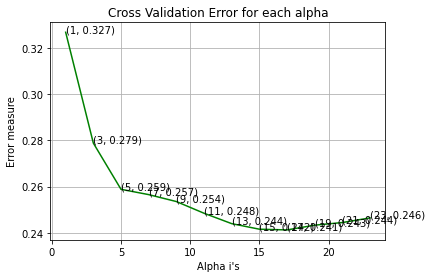

For values of best alpha =  17 The train log loss is: 0.04713053077927999
For values of best alpha =  17 The cross validation log loss is: 0.2412715810049747
Train AUC score: 0.9999991425608364
Test AUC score: 0.967299845705469
Random model AUC score: 0.5100291445225442


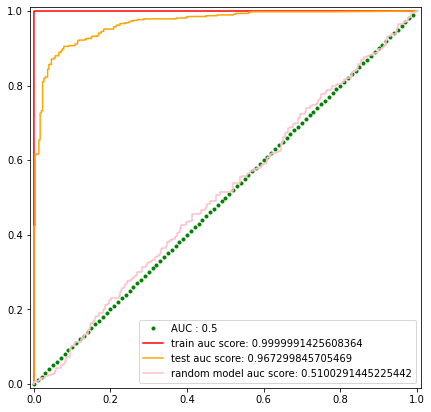

Best Threshold is 0.7799792244669626
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.8836317135549873
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9390243902439024 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.752442996742671 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.8354430379746836 
F1 score on Random model: 0.4384724186704385 
********************************************************

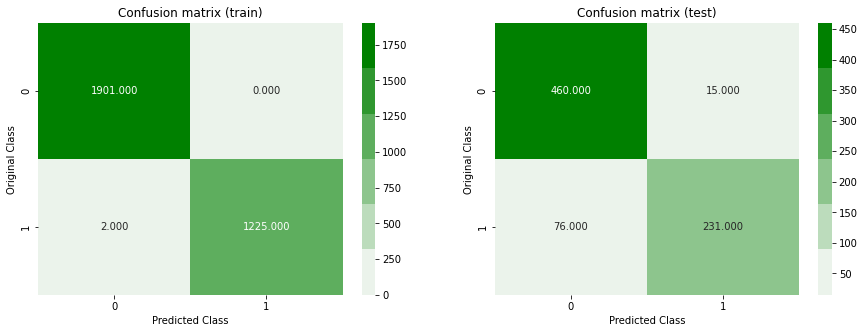

-------------------------------------------------- Precision matrix --------------------------------------------------


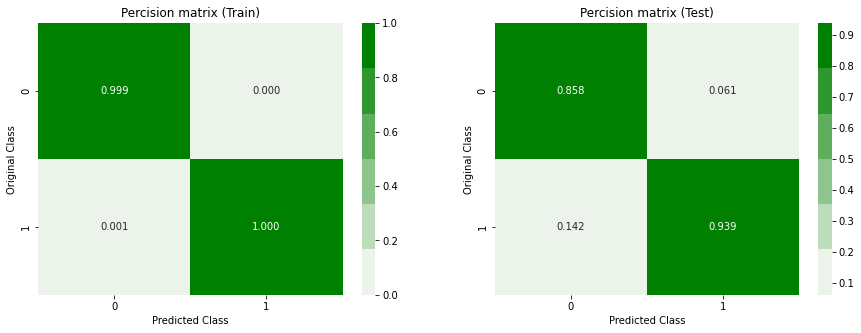

-------------------------------------------------- Recall matrix --------------------------------------------------


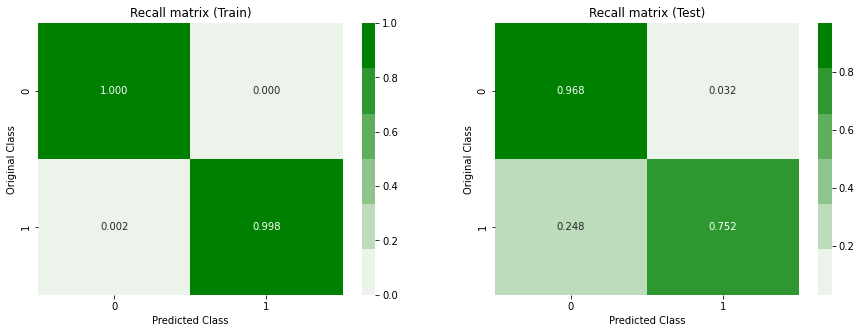

****************************************************************************************************


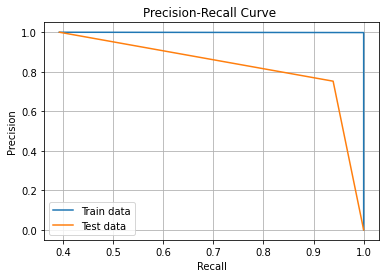

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Logistic Regression

log_loss for c =  1e-05 is 0.31511047548743204
log_loss for c =  0.0001 is 0.2956134484055275
log_loss for c =  0.001 is 0.2877073176709637
log_loss for c =  0.01 is 0.28029089149119263
log_loss for c =  0.1 is 0.2789356161503782
log_loss for c =  1 is 0.345675478394117
log_loss for c =  10 is 0.37037131964188347
log_loss for c =  100 is 0.37698339774932044
log_loss for c =  1000 is 0.38257900837043346


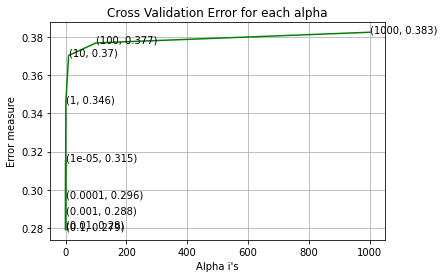

log loss for train data 0.21221486668201606
log loss for cv data 0.2789356161503782
Train AUC score: 0.9788139644257066
Test AUC score: 0.9656917538145036
Random model AUC score: 0.5100291445225442


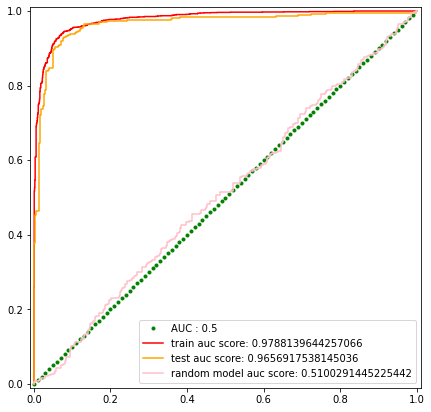

Best Threshold is 0.635159807674572
****************************************************************************************************
Accuracy on train data : 0.9060102301790282
Accuracy on test data : 0.8976982097186701
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.957801766437684 
Precession on test data: 0.9486166007905138 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.7954360228198859 
Recall on test data: 0.7817589576547231 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.8691006233303651 
F1 score on test data: 0.8571428571428572 
F1 score on Random model: 0.4384724186704385 
*****************************************

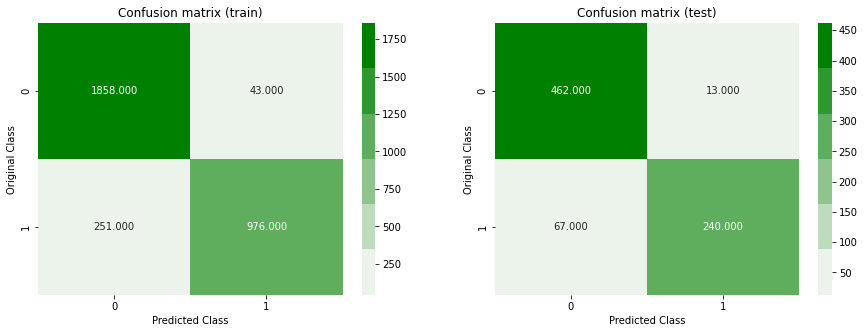

-------------------------------------------------- Precision matrix --------------------------------------------------


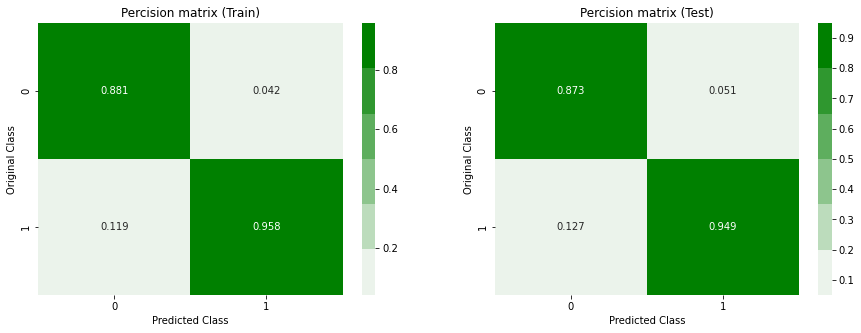

-------------------------------------------------- Recall matrix --------------------------------------------------


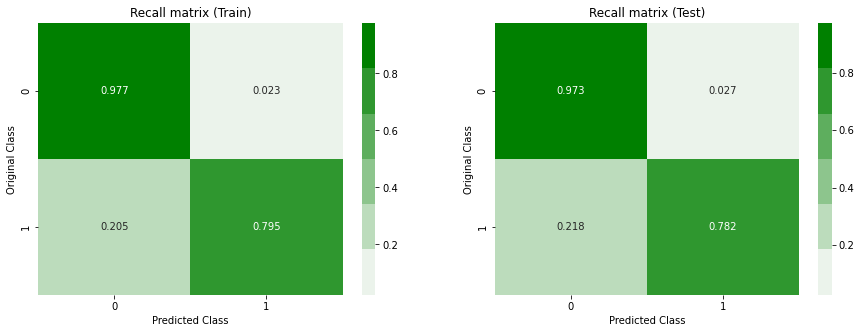

****************************************************************************************************


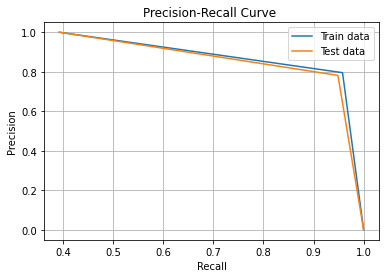

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Random Forest

log_loss for c =  10 is 0.13301823286538136
log_loss for c =  50 is 0.12128221877410376
log_loss for c =  100 is 0.1234796826513873
log_loss for c =  500 is 0.12095571282239
log_loss for c =  1000 is 0.12152749651005079
log_loss for c =  2000 is 0.12119190731724584
log_loss for c =  3000 is 0.12118708907925962


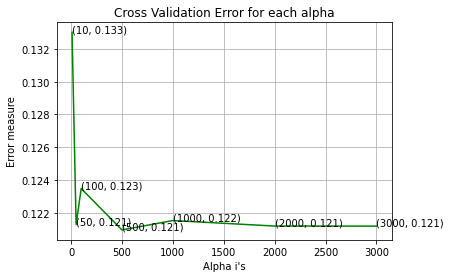

For values of best alpha =  500 The train log loss is: 0.039139316945322015
For values of best alpha =  500 The cross validation log loss is: 0.12095571282239
Train AUC score: 0.9999978564020909
Test AUC score: 0.9922304131664668
Random model AUC score: 0.5100291445225442


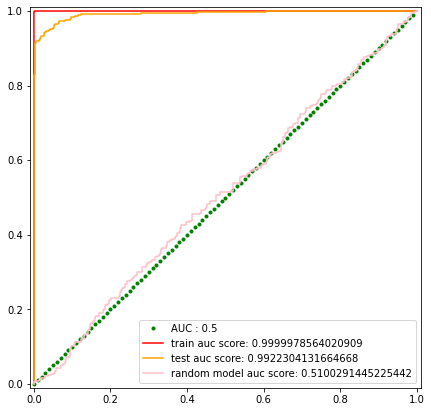

Best Threshold is 0.5775803881959338
****************************************************************************************************
Accuracy on train data : 0.9993606138107417
Accuracy on test data : 0.9514066496163683
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9559322033898305 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9983700081499592 
Recall on test data: 0.9185667752442996 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.999184339314845 
F1 score on test data: 0.93687707641196 
F1 score on Random model: 0.4384724186704385 
*********************************************************

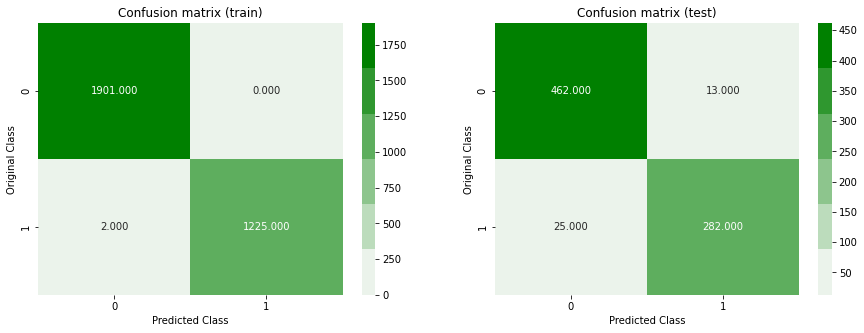

-------------------------------------------------- Precision matrix --------------------------------------------------


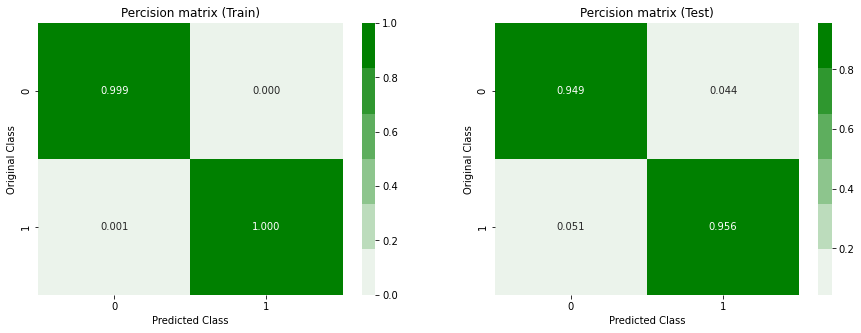

-------------------------------------------------- Recall matrix --------------------------------------------------


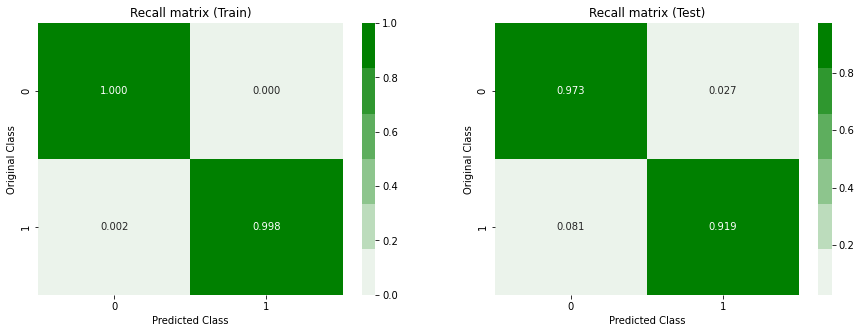

****************************************************************************************************


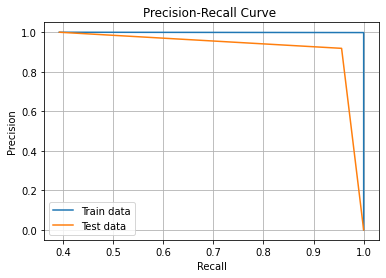

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

Xgboost with decision tree as base learners

log_loss for c =  10 is 0.15309751610970954
log_loss for c =  50 is 0.12002506289842572
log_loss for c =  100 is 0.11673354748081388
log_loss for c =  500 is 0.11917450380682212
log_loss for c =  1000 is 0.12255483562905874
log_loss for c =  2000 is 0.1240083223542314


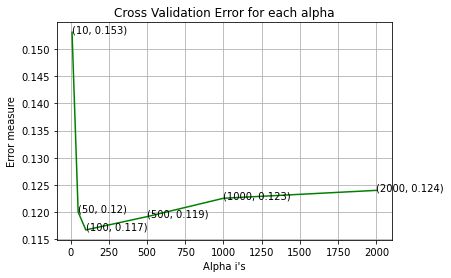

For values of best alpha =  100 The train log loss is: 0.05077948438345406
For values of best alpha =  100 The cross validation log loss is: 0.11673354748081388
Train AUC score: 0.9999198294382016
Test AUC score: 0.9926281501800103
Random model AUC score: 0.5100291445225442


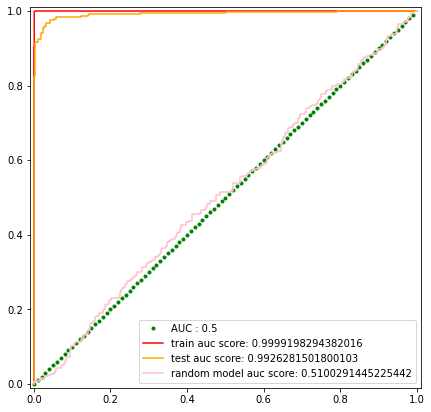

Best Threshold is 0.7017751216888428
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

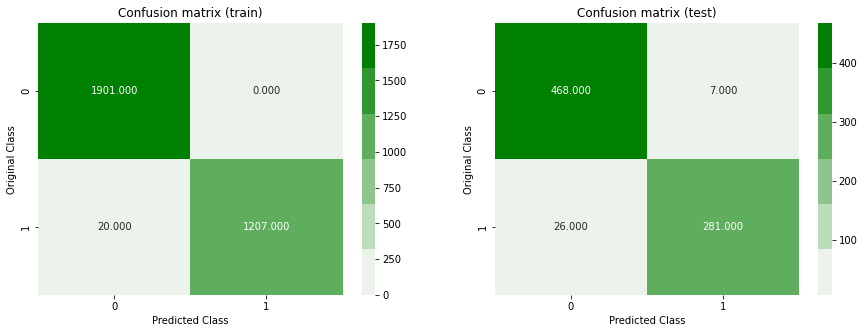

-------------------------------------------------- Precision matrix --------------------------------------------------


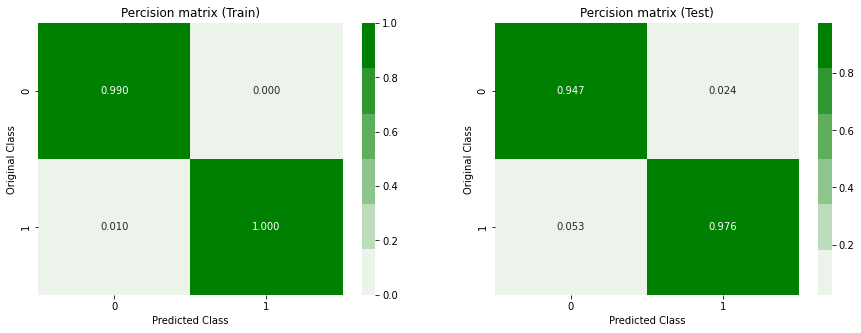

-------------------------------------------------- Recall matrix --------------------------------------------------


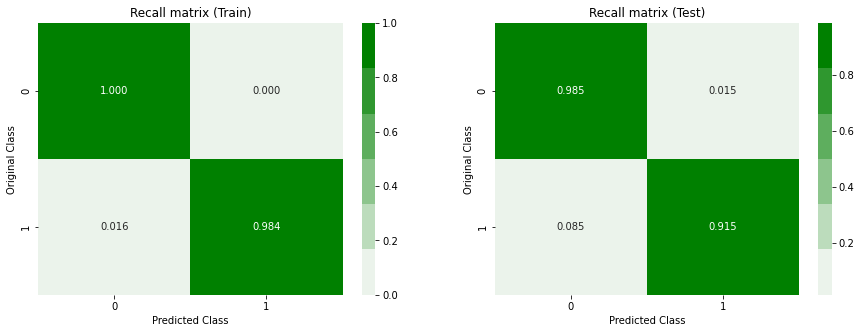

****************************************************************************************************


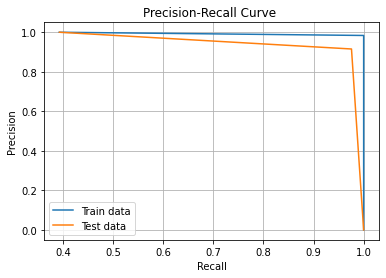

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

XGboost with linear base learners

log_loss for c =  10 is 0.15309751610970954
log_loss for c =  50 is 0.12002506289842572
log_loss for c =  100 is 0.11673354748081388
log_loss for c =  500 is 0.11917450380682212
log_loss for c =  1000 is 0.12255483562905874
log_loss for c =  2000 is 0.1240083223542314


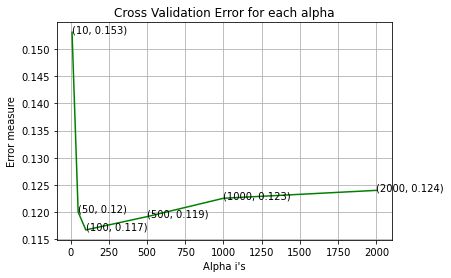

For values of best alpha =  100 The train log loss is: 0.05077948438345406
For values of best alpha =  100 The cross validation log loss is: 0.11673354748081388
Train AUC score: 0.9999198294382016
Test AUC score: 0.9926281501800103
Random model AUC score: 0.5100291445225442


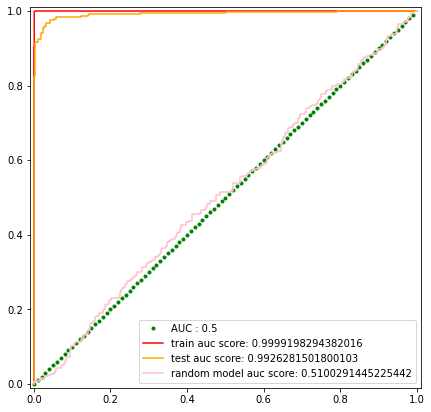

Best Threshold is 0.7017751216888428
****************************************************************************************************
Accuracy on train data : 0.9936061381074168
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 1.0 
Precession on test data: 0.9756944444444444 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9837000814995925 
Recall on test data: 0.9153094462540716 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9917830731306491 
F1 score on test data: 0.9445378151260504 
F1 score on Random model: 0.4384724186704385 
******************************************************

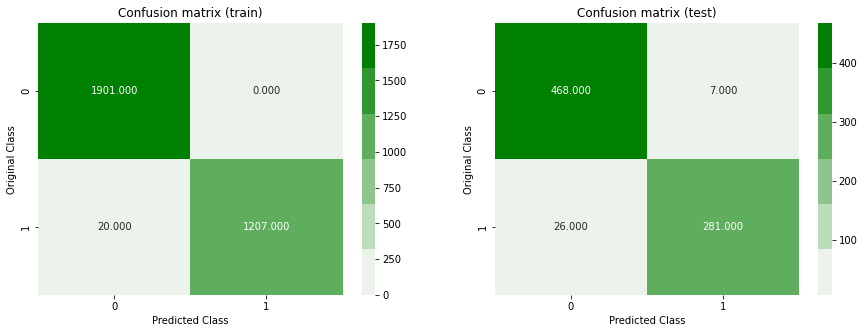

-------------------------------------------------- Precision matrix --------------------------------------------------


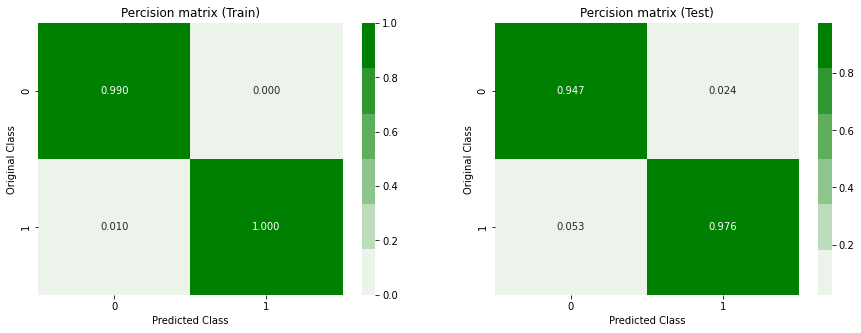

-------------------------------------------------- Recall matrix --------------------------------------------------


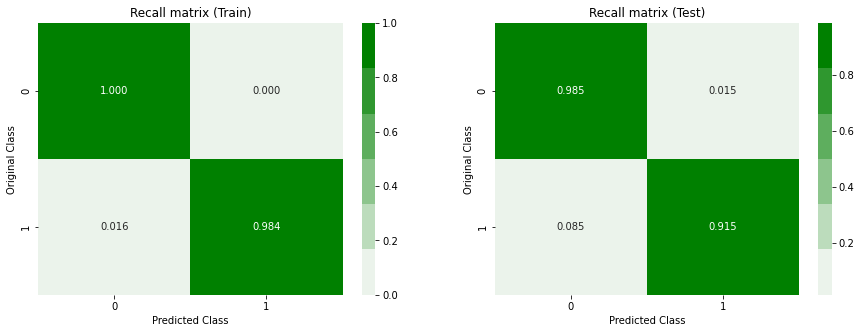

****************************************************************************************************


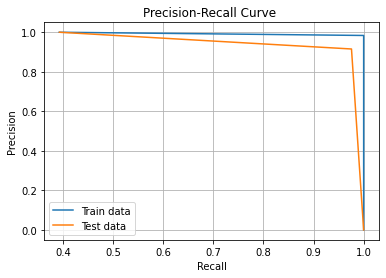

*** Random model ***
                   auc  accuracy  precision    recall   f1score   logloss
random_model  0.510029  0.492327     0.3875  0.504886  0.438472  1.016232
*** ML models ***
                                      auc (train)  auc (test)  \
weighted knn with cosine distance        0.999999    0.967300   
uniform knn with cosine distance         0.984739    0.947152   
weighted knn with minkowski distance     0.999999    0.963971   
weighted knn with cosine distance        0.999999    0.967300   
Logistic Regression                      0.978814    0.965692   
Random Forest                            0.999998    0.992230   
XGBoost                                  0.999920    0.992628   
XGboost linear base learners             0.999920    0.992628   

                                      accuracy (train)  accuracy (test)  \
weighted knn with cosine distance             0.999361         0.883632   
uniform knn with cosine distance              0.927749         0.879795   
we

In [76]:
random_model,metrics=train_all_models(X_train_standardized_gamma,y_train,X_val_standardized_gamma,y_val)

In [77]:
metrics

,auc (train),auc (test),accuracy (train),accuracy (test),precision (train),precision (test),recall (train),recall (test),f1score (train),f1score (test),logloss (train),logloss (test),Percentage of misclassified pts (Train),Percentage of missclassified pts (Test)
weighted knn with cosine distance,0.999999,0.967300,0.999361,0.883632,1.000000,0.939024,0.998370,0.752443,0.999184,0.835443,0.047131,0.241272,0.063939,11.636829
uniform knn with cosine distance,0.984739,0.947152,0.927749,0.879795,0.950495,0.895911,0.860636,0.785016,0.903336,0.836806,0.179408,0.288879,7.225064,12.020460
weighted knn with minkowski distance,0.999999,0.963971,0.999361,0.886189,1.000000,0.925781,0.998370,0.771987,0.999184,0.841918,0.047930,0.248802,0.063939,11.381074
weighted knn with cosine distance,0.999999,0.967300,0.999361,0.883632,1.000000,0.939024,0.998370,0.752443,0.999184,0.835443,0.047131,0.241272,0.063939,11.636829
Logistic Regression,0.978814,0.965692,0.906010,0.897698,0.957802,0.948617,0.795436,0.781759,0.869101,0.857143,0.212215,0.278936,9.398977,10.230179
Random Forest,0.999998,0.992230,0.999361,0.951407,1.000000,0.955932,0.998370,0.918567,0.999184,0.936877,0.039139,0.120956,0.063939,4.859335
XGBoost,0.999920,0.992628,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050779,0.116734,0.639386,4.219949
XGboost linear base learners,0.999920,0.992628,0.993606,0.957801,1.000000,0.975694,0.983700,0.915309,0.991783,0.944538,0.050779,0.116734,0.639386,4.219949


In [78]:
all_models_metrics["Beta to normal transformation"]=metrics

## Checking which transformation of data gave best results

In [79]:
y=dict()
for i,j in all_models_metrics.items():
    y[i]=j['logloss (test)']

In [80]:
print("Log loss of different transformations")
pd.DataFrame(y)

Log loss of different transformations


,Standard scaler,MinMax scaler,Robust scaler,Log transformed MinMax scaled,Log transformed Robust scaled,square transformed Robust scaled,squared root transformed Robust scaled,BoxCox transformed Robust scaled,Beta to normal transformation
weighted knn with cosine distance,0.222267,0.271897,0.225984,0.158576,0.186411,0.256886,0.206762,0.355685,0.241272
uniform knn with cosine distance,0.270273,0.296710,0.253698,0.173797,0.204324,0.287647,0.229210,0.363804,0.288879
weighted knn with minkowski distance,0.248806,0.266147,0.225970,0.164459,0.193363,0.292760,0.206470,0.368998,0.248802
weighted knn with cosine distance,0.222267,0.271897,0.225984,0.158576,0.186411,0.256886,0.206762,0.355685,0.241272
Logistic Regression,0.265468,0.267429,0.259192,0.147940,0.154600,0.403046,0.174241,0.380738,0.278936
Random Forest,0.116537,0.116667,0.116691,0.119406,0.119561,0.121834,0.119907,0.173525,0.120956
XGBoost,0.116523,0.116712,0.116542,0.116657,0.116657,0.116940,0.116487,0.143440,0.116734
XGboost linear base learners,0.116523,0.116712,0.116542,0.116657,0.116657,0.116940,0.116487,0.143440,0.116734


In [81]:
y=dict()
for i,j in all_models_metrics.items():
    y[i]=j['f1score (test)']

In [82]:
print("F1 score of different transformations")
pd.DataFrame(y)

F1 score of different transformations


,Standard scaler,MinMax scaler,Robust scaler,Log transformed MinMax scaled,Log transformed Robust scaled,square transformed Robust scaled,squared root transformed Robust scaled,BoxCox transformed Robust scaled,Beta to normal transformation
weighted knn with cosine distance,0.851590,0.836625,0.865517,0.906897,0.887737,0.822064,0.872852,0.731898,0.835443
uniform knn with cosine distance,0.821622,0.847973,0.872549,0.903553,0.897479,0.792254,0.896104,0.766114,0.836806
weighted knn with minkowski distance,0.841918,0.809524,0.859649,0.892361,0.869718,0.779851,0.867257,0.742063,0.841918
weighted knn with cosine distance,0.851590,0.836625,0.865517,0.906897,0.887737,0.822064,0.872852,0.731898,0.835443
Logistic Regression,0.869718,0.883882,0.865724,0.938640,0.931553,0.706827,0.908163,0.726908,0.857143
Random Forest,0.938640,0.938640,0.938640,0.939597,0.939597,0.936877,0.941374,0.912162,0.936877
XGBoost,0.944538,0.944538,0.944538,0.944538,0.944538,0.944538,0.944538,0.932660,0.944538
XGboost linear base learners,0.944538,0.944538,0.944538,0.944538,0.944538,0.944538,0.944538,0.932660,0.944538


### minmax(log(data)) transformation and robustscaler(log(data)) are the two transformations which has higest test time model (Distance based models) performace 

### Foreword feature selection 

In [83]:
from sklearn.model_selection import *
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

In [84]:
model = LogisticRegression(max_iter=10000,class_weight='balanced')
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
param_grid={"C":np.logspace(-3,2,7),"penalty":["l2"]}

In [85]:
search = RandomizedSearchCV(model, param_grid, n_iter=500, scoring='f1', n_jobs=-1, cv=cv, random_state=1)

In [86]:
result = search.fit(log_X_train_minmax, y_train)

In [87]:
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.927928726832268
Best Hyperparameters: {'penalty': 'l2', 'C': 0.31622776601683794}


In [88]:
lr = LogisticRegression(C=result.best_params_['C'],class_weight='balanced',max_iter=10000)
sfs1 = sfs(lr, k_features=log_X_train_minmax.shape[1], forward=True, verbose=2, scoring='f1',n_jobs=-1)
sfs1 = sfs1.fit(log_X_train_minmax, y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 114 out of 114 | elapsed:    0.7s finished

[2022-09-09 18:48:13] Features: 1/114 -- score: 0.7384892181317337[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 113 out of 113 | elapsed:    0.8s finished

[2022-09-09 18:48:13] Features: 2/114 -- score: 0.7852569229236013[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 112 out of 112 | elapsed:    0.9s finished

[2022-09-09 18:48:14] Features: 3/114 -- score: 0.8203470725848054[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 111 ou

In [89]:
import pandas as pd
a=pd.DataFrame.from_dict(sfs1.get_metric_dict()).T[['feature_idx','cv_scores','avg_score']]
avg_score=a.avg_score
a

,feature_idx,cv_scores,avg_score
1,"(51,)","[0.7527272727272727, 0.7420494699646644, 0.750...",0.738489
2,"(24, 51)","[0.7921568627450979, 0.7984496124031008, 0.796...",0.785257
3,"(24, 51, 52)","[0.8317929759704251, 0.8283582089552239, 0.824...",0.820347
4,"(6, 24, 51, 52)","[0.8539325842696629, 0.8631984585741811, 0.839...",0.843631
5,"(6, 24, 51, 52, 56)","[0.8745247148288974, 0.8884462151394422, 0.868...",0.8697
...,...,...,...
110,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14,...","[0.9280000000000002, 0.9275362318840579, 0.909...",0.924624
111,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9282868525896414, 0.9272349272349272, 0.906...",0.925169
112,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9255533199195171, 0.9336099585062241, 0.902...",0.925867
113,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9255533199195171, 0.9358178053830227, 0.906...",0.926768


Text(0.5, 0, 'no of features')

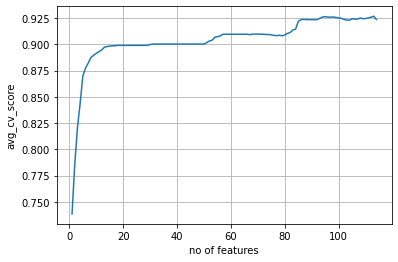

In [90]:
plt.plot(avg_score)
plt.grid()
plt.ylabel("avg_cv_score")
plt.xlabel("no of features")

### Zooming in above plot

Text(0.5, 0, 'no of features')

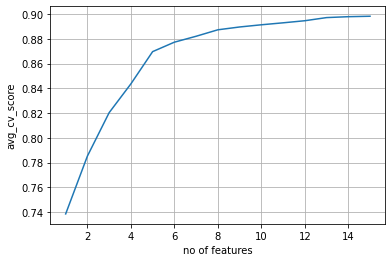

In [91]:
plt.plot(avg_score[:15])
plt.grid()
plt.ylabel("avg_cv_score")
plt.xlabel("no of features")

In [92]:
best_features=[]
for i in a.feature_idx:
    for j in i :
        if j not in best_features:
            best_features.append(j)
best_features=np.array(best_features)

In [93]:
print(f"Top feature index in assending order :{best_features}")

Top features in assending order :[ 51  24  52   6  56  23  72  38 105  73  74  79  30  33  37  89  99  76
  27  39   3  57  60  80  85  63  87  91 102  67  58  81  82  86  88  94
  95  92  96 103 107 106  71 100  78  97 104 109  31  14  54  98  12  61
 108  93  13  64  69  70  90 101 110 111 112 113  42  83  17  19  46  35
  65   8  84  29  34  62  47  10  26   7  16  45   4  41   0   2  28  49
  40  75  77  43  68  66  59  22  25   5   1  21  53   9  44  55  48  50
  32  15  11  36  18  20]


In [94]:
print(f"selecting Top 15 feature index :{best_features[:15]}")

selecting Top 22 features :[ 51  24  52   6  56  23  72  38 105  73  74  79  30  33  37]


In [95]:
model = LogisticRegression(max_iter=10000,class_weight='balanced')
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
param_grid={"C":np.logspace(-3,2,7),"penalty":["l2"]}

In [96]:
search = RandomizedSearchCV(model, param_grid, n_iter=500, scoring='f1', n_jobs=-1, cv=cv, random_state=1)

In [97]:
result = search.fit(log_X_train_minmax.T[[best_features[:15]]].T, y_train)

In [98]:
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.8950853864962816
Best Hyperparameters: {'penalty': 'l2', 'C': 0.31622776601683794}


In [99]:
lr = LogisticRegression(C=result.best_params_['C'],max_iter=10000,class_weight='balanced')
lr.fit(log_X_train_minmax.T[[best_features[:15]]].T,y_train)

LogisticRegression(C=0.31622776601683794, class_weight='balanced',
                   max_iter=10000)

Train AUC score: 0.961729489090587
Test AUC score: 0.9620229727412994
Random model AUC score: 0.5100291445225442


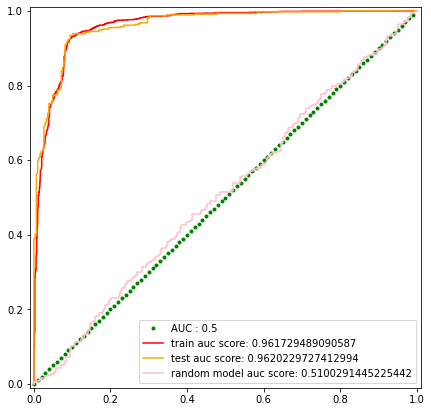

Best Threshold is 0.5025225799081711
****************************************************************************************************
Accuracy on train data : 0.9187979539641944
Accuracy on test data : 0.9194373401534527
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.8932902182700081 
Precession on test data: 0.8910256410256411 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9005704971475142 
Recall on test data: 0.9055374592833876 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.8969155844155844 
F1 score on test data: 0.8982229402261713 
F1 score on Random model: 0.4384724186704385 
***************************************

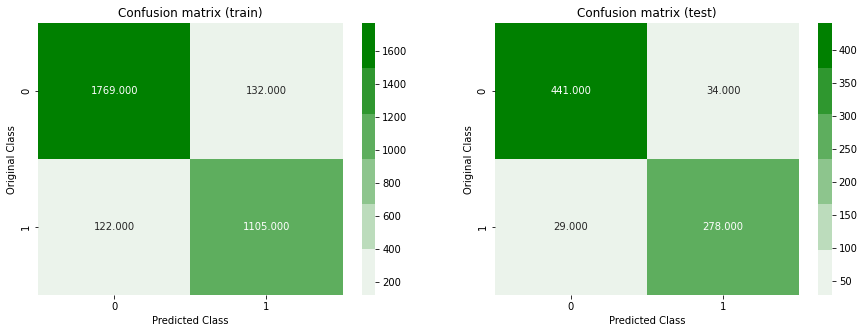

-------------------------------------------------- Precision matrix --------------------------------------------------


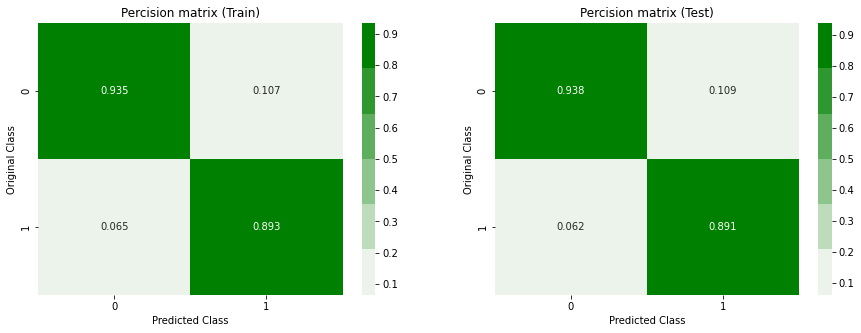

-------------------------------------------------- Recall matrix --------------------------------------------------


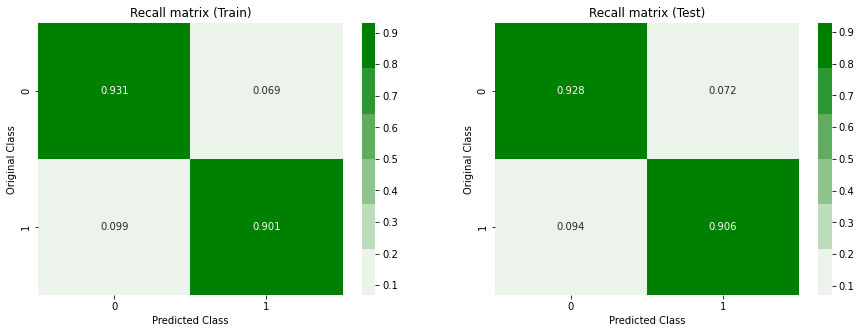

****************************************************************************************************


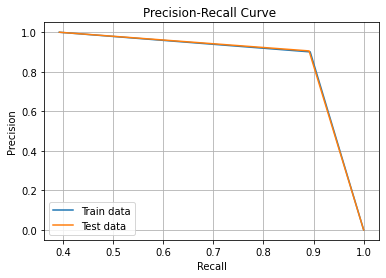

{'auc (train)': 0.961729489090587,
 'auc (test)': 0.9620229727412994,
 'auc': 0.5100291445225442,
 'accuracy (train)': 0.9187979539641944,
 'accuracy (test)': 0.9194373401534527,
 'accuracy': 0.49232736572890023,
 'precision (train)': 0.8932902182700081,
 'precision (test)': 0.8910256410256411,
 'precision': 0.3875,
 'recall (train)': 0.9005704971475142,
 'recall (test)': 0.9055374592833876,
 'recall': 0.504885993485342,
 'f1score (train)': 0.8969155844155844,
 'f1score (test)': 0.8982229402261713,
 'f1score': 0.4384724186704385,
 'logloss (train)': 0.25535194428564345,
 'logloss (test)': 0.26607290811086687,
 'logloss': 1.0162318300708952,
 'Percentage of misclassified pts (Train)': 8.120204603580563,
 'Percentage of missclassified pts (Test)': 8.05626598465473}

In [100]:
performance_of_model(lr,log_X_train_minmax.T[[best_features[:15]]].T,y_train,log_X_val_minmax.T[[best_features[:15]]].T,y_val)

## pertubation test to check colinear features

In [101]:
import pandas as pd
import numpy as np
from sklearn.datasets import load_iris
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV
import seaborn as sns
import matplotlib.pyplot as plt

In [102]:
distributions = dict(alpha=[1e-05, 0.001, 0.1, 1, 100, 1000],penalty=['l2', 'l1'],loss=['log_loss'])
classifier=SGDClassifier()

clf=GridSearchCV(classifier, distributions,n_jobs=-1)

search = clf.fit(log_X_train_minmax.T[[best_features[:22]]].T,y_train)
search.best_params_

{'alpha': 0.001, 'loss': 'log_loss', 'penalty': 'l2'}

In [103]:
classifier=SGDClassifier(loss='log',alpha=0.001,penalty='l2').fit(log_X_train_minmax.T[[best_features[:22]]].T,y_train)

In [104]:
weights1=classifier.coef_
weights1

array([[ 2.24560177, -3.04373567,  2.1749968 ,  2.79459146,  2.60098529,
         2.12945237,  1.6393554 , -1.16162896, -0.82391216,  1.26686778,
         1.02965121,  1.39000473, -1.0376179 , -0.58741901, -0.07992764,
        -0.47277758, -0.5107057 ,  0.70264342, -0.00333516, -0.12260005,
         0.66660544,  0.01539367]])

In [105]:
X=log_X_train_minmax.T[[best_features[:22]]].T
X_noise=X.copy()
X_noise=X_noise+10**-2


In [106]:
classifier=SGDClassifier(loss='log',alpha=1e-05,penalty='l2').fit(X_noise,y_train)


In [107]:
weights2=classifier.coef_
weights2


array([[  2.30863961,  -5.21551717,   3.03343616,   3.99180719,
          5.45807848,   3.43088189,   9.38808933,  -2.43883808,
         -4.49856205,   7.84966977,   2.15670485,   7.05071272,
         -3.28830327,  -1.87396328,  -0.70371776, -13.06445344,
         -5.40239067,   4.66673953,   0.99489108,  -0.53120647,
          3.513638  ,  -0.66462793]])

In [108]:
diff_weights=abs(weights1-weights2)
p_diff_weights=abs((weights1-weights2)/weights1)*100
p_diff_weights

array([[2.80716909e+00, 7.13525000e+01, 3.94685341e+01, 4.28404562e+01,
        1.09846573e+02, 6.11156906e+01, 4.72669559e+02, 1.09949834e+02,
        4.46000203e+02, 5.19612394e+02, 1.09459749e+02, 4.07243793e+02,
        2.16908880e+02, 2.19016452e+02, 7.80443575e+02, 2.66334029e+03,
        9.57828551e+02, 5.64168961e+02, 2.99303468e+04, 3.33284038e+02,
        4.27094108e+02, 4.41754081e+03]])

### as percentage difference of weights are very low , there are no collinear features in those top features 

### Foreword feature selection using Xgboost

In [109]:
x_cfl=XGBClassifier()

prams={
    'learning_rate':[0.01,0.03,0.05,0.1,0.15,0.2],
     'n_estimators':[100,200,500,1000,2000],
     'max_depth':[3,5,10],
    'colsample_bytree':[0.1,0.3,0.5,1],
    'subsample':[0.1,0.3,0.5,1]
}
random_cfl1=RandomizedSearchCV(x_cfl,param_distributions=prams,verbose=10,n_jobs=-1,)
random_cfl1.fit(X_train_standardized,y_train)
print (random_cfl1.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 4/5; 1/10] START colsample_bytree=0.3, learning_rate=0.15, max_depth=3, n_estimators=100, subsample=0.5
[CV 1/5; 1/10] START colsample_bytree=0.3, learning_rate=0.15, max_depth=3, n_estimators=100, subsample=0.5
[CV 2/5; 1/10] START colsample_bytree=0.3, learning_rate=0.15, max_depth=3, n_estimators=100, subsample=0.5
[CV 3/5; 1/10] START colsample_bytree=0.3, learning_rate=0.15, max_depth=3, n_estimators=100, subsample=0.5
[CV 4/5; 1/10] END colsample_bytree=0.3, learning_rate=0.15, max_depth=3, n_estimators=100, subsample=0.5;, score=0.950 total time=   0.2s
[CV 1/5; 1/10] END colsample_bytree=0.3, learning_rate=0.15, max_depth=3, n_estimators=100, subsample=0.5;, score=0.954 total time=   0.2s
[CV 5/5; 1/10] START colsample_bytree=0.3, learning_rate=0.15, max_depth=3, n_estimators=100, subsample=0.5
[CV 1/5; 2/10] START colsample_bytree=1, learning_rate=0.2, max_depth=5, n_estimators=100, subsample=0.5
[CV 2/5; 1/10] E

In [110]:
lr=XGBClassifier(subsample=0.5,n_estimators=1000,max_depth=10,learning_rate=0.1,colsample_bytree=0.3)
sfs1 = sfs(lr, k_features=len(data.columns), forward=True, verbose=2, scoring='f1',n_jobs=-1)
sfs1 = sfs1.fit(X_train_standardized, y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   32.3s
[Parallel(n_jobs=-1)]: Done  57 out of  57 | elapsed:   56.4s finished

[2022-09-09 18:51:14] Features: 1/57 -- score: 0.6663251325545883[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   37.6s
[Parallel(n_jobs=-1)]: Done  56 out of  56 | elapsed:  1.0min finished

[2022-09-09 18:52:16] Features: 2/57 -- score: 0.7701426430053853[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   33.1s
[Parallel(n_jobs=-1)]: Done  55 out of  55 | elapsed:   55.4s finished

[2022-09-09 18:53:11] Features: 3/57 -- score: 0.8222324216846827[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   36.8s
[Parallel(n_jobs=-1)]: Done  54 out o

In [111]:
import pandas as pd
a=pd.DataFrame.from_dict(sfs1.get_metric_dict()).T[['feature_idx','cv_scores','avg_score']]
avg_score=a.avg_score
a

,feature_idx,cv_scores,avg_score
1,"(52,)","[0.6825775656324582, 0.6497461928934011, 0.623...",0.666325
2,"(6, 52)","[0.7812500000000001, 0.7703016241299303, 0.725...",0.770143
3,"(6, 51, 52)","[0.8137651821862347, 0.8301886792452831, 0.808...",0.822232
4,"(6, 24, 51, 52)","[0.8594377510040161, 0.8547717842323652, 0.832...",0.851358
5,"(6, 24, 51, 52, 55)","[0.8834355828220859, 0.8744769874476988, 0.845...",0.86665
6,"(6, 24, 26, 51, 52, 55)","[0.8933601609657947, 0.899581589958159, 0.8631...",0.879505
7,"(6, 24, 26, 45, 51, 52, 55)","[0.9046653144016227, 0.9144050104384134, 0.879...",0.897313
8,"(6, 24, 26, 41, 45, 51, 52, 55)","[0.9075975359342915, 0.9140461215932915, 0.893...",0.902091
9,"(6, 24, 26, 41, 45, 47, 51, 52, 55)","[0.9142857142857143, 0.9189189189189189, 0.903...",0.907573
10,"(6, 15, 24, 26, 41, 45, 47, 51, 52, 55)","[0.91869918699187, 0.9358178053830227, 0.90309...",0.912466


Text(0.5, 0, 'no of features')

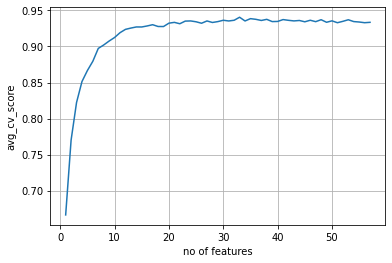

In [112]:
plt.plot(avg_score)
plt.grid()
plt.ylabel("avg_cv_score")
plt.xlabel("no of features")

### From the above graph we can say only top 15 features (approx) are contributing most to model performance

### Zooming in above plot

Text(0.5, 0, 'no of features')

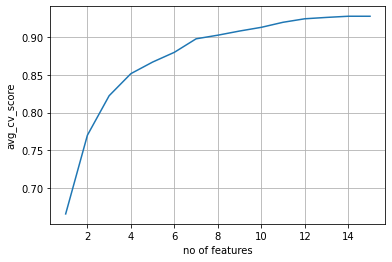

In [113]:
plt.plot(avg_score[:15])
plt.grid()
plt.ylabel("avg_cv_score")
plt.xlabel("no of features")

In [114]:
best_features=[]
for i in a.feature_idx:
    for j in i :
        if j not in best_features:
            best_features.append(j)
best_features=np.array(best_features)

In [115]:
print(f"Top features in assending order :{best_features}")

Top features in assending order :[52  6 51 24 55 26 45 41 47 15 16 44 28 49 43 17 19  4 48 23 21 11 18 56
 50 36 14 25 12 46 38 53  3 39 33 30 40 37  7 31  2  5  8  1 13 35 42 22
 54 27  0 29  9 34 10 20 32]


In [116]:
print(f"selecting Top 15 features :{best_features[:15]}")

selecting Top 15 features :[52  6 51 24 55 26 45 41 47 15 16 44 28 49 43]


In [117]:
x_cfl=XGBClassifier()

prams={
    'learning_rate':[0.01,0.03,0.05,0.1,0.15,0.2],
     'n_estimators':[100,200,500,1000,2000],
     'max_depth':[3,5,10],
    'colsample_bytree':[0.1,0.3,0.5,1],
    'subsample':[0.1,0.3,0.5,1]
}
random_cfl1=RandomizedSearchCV(x_cfl,param_distributions=prams,verbose=10,n_jobs=-1,)
random_cfl1.fit(X_train_standardized.T[[best_features[:15]]].T,y_train)
print (random_cfl1.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5; 1/10] START colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=2000, subsample=1
[CV 2/5; 1/10] START colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=2000, subsample=1
[CV 3/5; 1/10] START colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=2000, subsample=1
[CV 4/5; 1/10] START colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=2000, subsample=1
[CV 3/5; 1/10] END colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=2000, subsample=1;, score=0.936 total time=   4.0s
[CV 5/5; 1/10] START colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=2000, subsample=1
[CV 2/5; 1/10] END colsample_bytree=0.5, learning_rate=0.1, max_depth=10, n_estimators=2000, subsample=1;, score=0.958 total time=   4.0s
[CV 1/5; 2/10] START colsample_bytree=0.5, learning_rate=0.15, max_depth=3, n_estimators=2000, subsample=0.3
[CV 4/5; 1/10] END 

In [118]:
t=random_cfl1.best_params_

In [119]:
lr=XGBClassifier(subsample=t['subsample'],n_estimators=t['n_estimators'],max_depth=t['max_depth'],learning_rate=t['learning_rate'],colsample_bytree=t['colsample_bytree'])

In [120]:
lr.fit(X_train_standardized.T[[best_features[:15]]].T,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.3,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=10, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=1000,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [121]:
best_features #index of top features in assending order

array([52,  6, 51, 24, 55, 26, 45, 41, 47, 15, 16, 44, 28, 49, 43, 17, 19,
        4, 48, 23, 21, 11, 18, 56, 50, 36, 14, 25, 12, 46, 38, 53,  3, 39,
       33, 30, 40, 37,  7, 31,  2,  5,  8,  1, 13, 35, 42, 22, 54, 27,  0,
       29,  9, 34, 10, 20, 32])

Train AUC score: 0.999452310734238
Test AUC score: 0.986768386764958
Random model AUC score: 0.5100291445225442


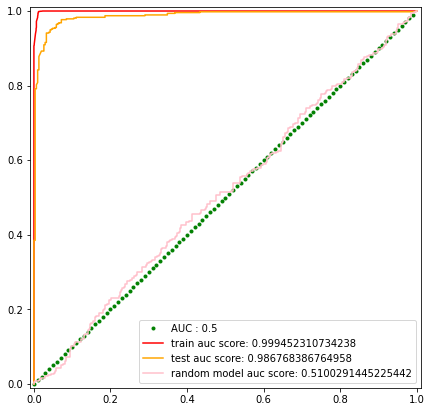

Best Threshold is 0.5284409523010254
****************************************************************************************************
Accuracy on train data : 0.9942455242966752
Accuracy on test data : 0.9539641943734015
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.998351195383347 
Precession on test data: 0.9471947194719472 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.986960065199674 
Recall on test data: 0.9348534201954397 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9926229508196721 
F1 score on test data: 0.940983606557377 
F1 score on Random model: 0.4384724186704385 
******************************************

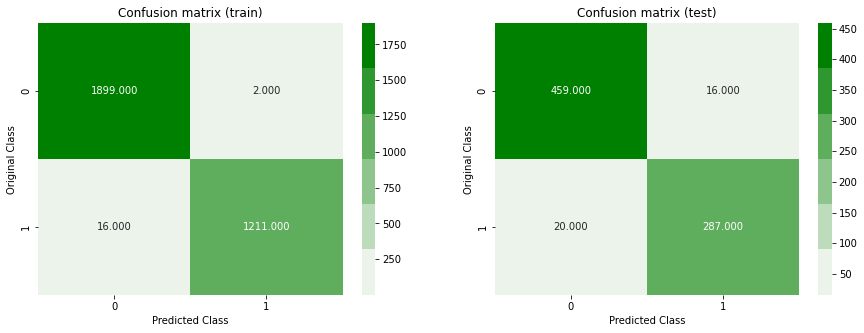

-------------------------------------------------- Precision matrix --------------------------------------------------


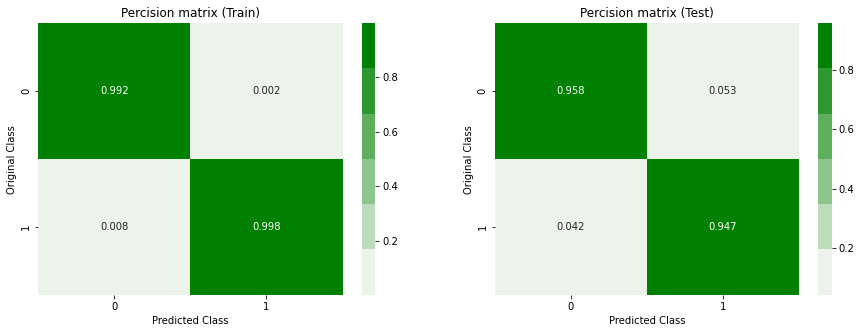

-------------------------------------------------- Recall matrix --------------------------------------------------


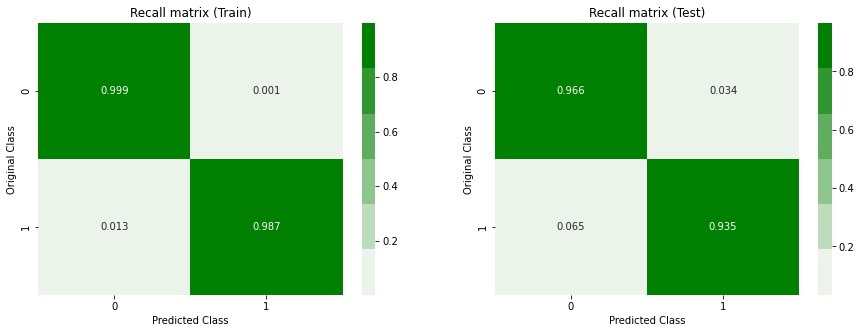

****************************************************************************************************


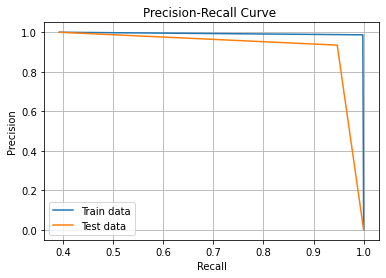

In [122]:
model_performance=performance_of_model(lr,X_train_standardized.T[[best_features[:15]]].T,y_train,X_val_standardized.T[[best_features[:15]]].T,y_val)

### By seeing model performance we can say that the features selected by xgboost were better than the features selected by logistic regression 

In [135]:
fm=lr.feature_importances_

In [146]:
feature_names=[]
for i in best_features:
    feature_names.append("X"+str(i+1))
print(f"The best features those contributing most to the model in assending order are (according to foreword feature selection):{feature_names}")

The best features those contributing most to the model in assending order are (according to foreword feature selection):['X53', 'X7', 'X52', 'X25', 'X56', 'X27', 'X46', 'X42', 'X48', 'X16', 'X17', 'X45', 'X29', 'X50', 'X44', 'X18', 'X20', 'X5', 'X49', 'X24', 'X22', 'X12', 'X19', 'X57', 'X51', 'X37', 'X15', 'X26', 'X13', 'X47', 'X39', 'X54', 'X4', 'X40', 'X34', 'X31', 'X41', 'X38', 'X8', 'X32', 'X3', 'X6', 'X9', 'X2', 'X14', 'X36', 'X43', 'X23', 'X55', 'X28', 'X1', 'X30', 'X10', 'X35', 'X11', 'X21', 'X33']


In [161]:
f=sorted(fm)
feature_importance=list(zip(feature_names[:len(fm)],fm))
feature_importance_assending=[]
for i in f:
    for j,k in feature_importance:
        if k==i:
            feature_importance_assending.append((j,k))
feature_importance_d=feature_importance_assending[::-1]
r=[]
t=[]
for i,j in feature_importance_d:
    r.append(i)
    t.append(j)

Text(0, 0.5, 'Feature Importance according to XGBoost model')

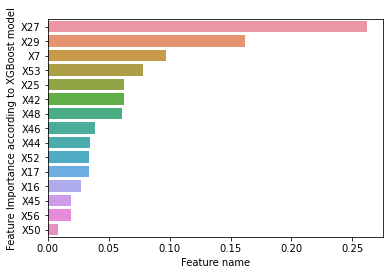

In [171]:
sns.barplot(x=t,y=r)
plt.xlabel("Feature name")
plt.ylabel("Feature Importance according to XGBoost model")

In [172]:
final_model = CalibratedClassifierCV(lr, method="isotonic")
final_model.fit(X_train_standardized.T[[best_features[:15]]].T,y_train)

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    callbacks=None,
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=0.3,
                                                    early_stopping_rounds=None,
                                                    enable_categorical=False,
                                                    eval_metric=None, gamma=0,
                                                    gpu_id=-1,
                                                    grow_policy='depthwise',
                                                    importance_type=None,
                                                    interaction_constraints='',
                                                    learning_rate=0.1,
                                                    max_bin=256,
                                                    max_cat_to_onehot=4,
                                                    max_delta_step=0,
                                                    max_depth=10, max_leaves=0,
                                                    min_child_weight=1,
                                                    missing=nan,
                                                    monotone_constraints='()',
                                                    n_estimators=1000, n_jobs=0,
                                                    num_parallel_tree=1,
                                                    predictor='auto',
                                                    random_state=0, reg_alpha=0,
                                                    reg_lambda=1, ...),
                       method='isotonic')

In [183]:
pickle.dump(final_model,open('final_model.sav', 'wb'))

### Model performance 

Train AUC score: 0.9989009773520307
Test AUC score: 0.9867272415566604
Random model AUC score: 0.5100291445225442


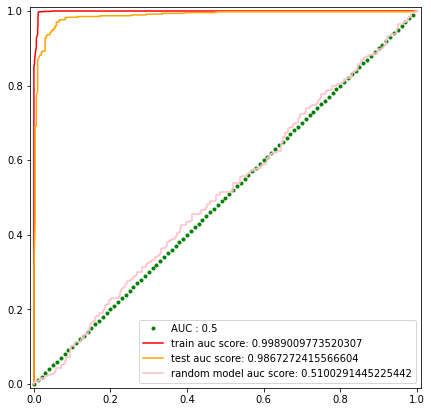

Best Threshold is 0.5483246803283691
****************************************************************************************************
Accuracy on train data : 0.9929667519181585
Accuracy on test data : 0.9578005115089514
Accuracy on Random model : 0.49232736572890023
****************************************************************************************************
Precession on train data: 0.9967023907666942 
Precession on test data: 0.9506578947368421 
Precession on Random model: 0.3875 
****************************************************************************************************
Recall on train data: 0.9853300733496333 
Recall on test data: 0.9413680781758957 
Recall on Random model: 0.504885993485342 
****************************************************************************************************
F1 score on train data: 0.9909836065573772 
F1 score on test data: 0.9459901800327333 
F1 score on Random model: 0.4384724186704385 
***************************************

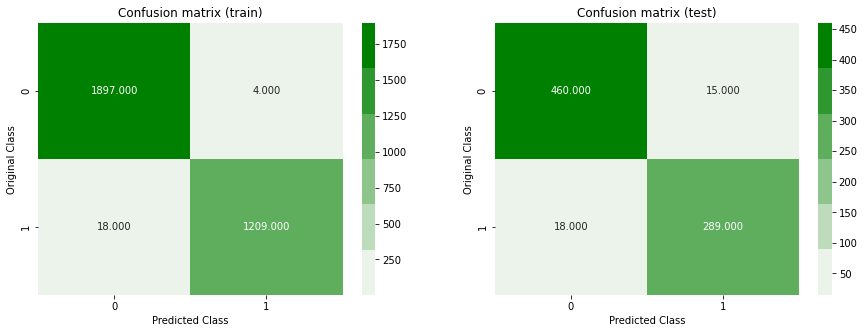

-------------------------------------------------- Precision matrix --------------------------------------------------


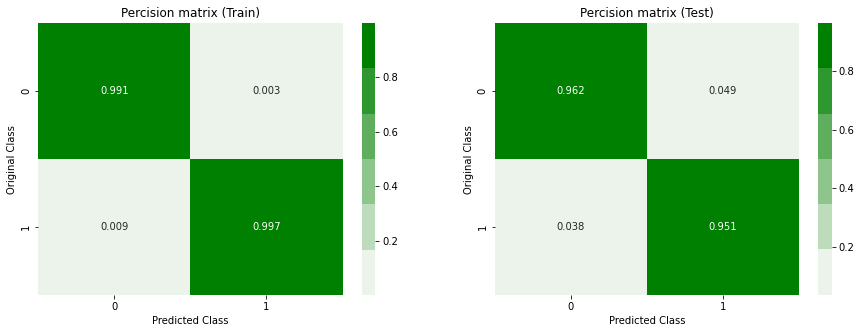

-------------------------------------------------- Recall matrix --------------------------------------------------


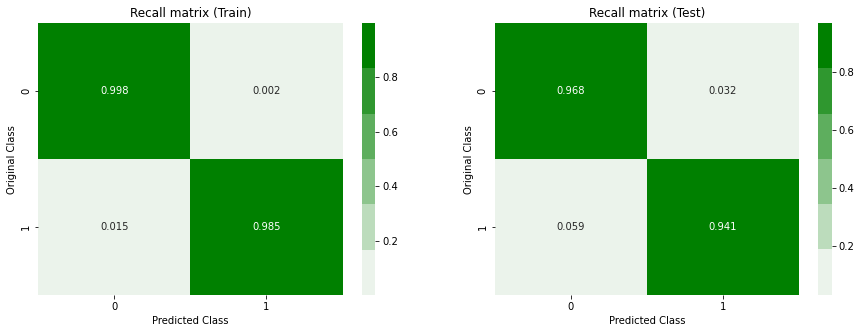

****************************************************************************************************


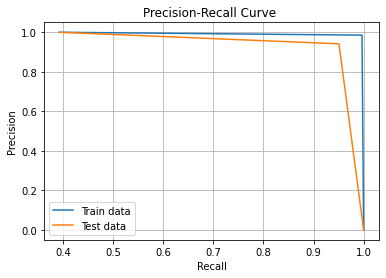

In [173]:
model_performance=performance_of_model(final_model,X_train_standardized.T[[best_features[:15]]].T,y_train,X_val_standardized.T[[best_features[:15]]].T,y_val)

### During test time , precision is high and recall is low , Model is not caring if a positive class is labeled as a negative class but model will declare positive class only if is very sure .By this we can say , when ever model declares a positive class , there is high chance that it is truely positive.

### AUC during test time is 0.98, by this we can tell , if we give two data points where one is positive and other is negative class , then classifying them correctly has a chance of 0.98, so we can say that the model is a good model 

In [126]:
scaler=StandardScaler()
scaler.fit(X_train)
X_train_standardized=scaler.transform(X_train)
X_val_standardized=scaler.transform(X_val)
X_test_standardized=scaler.transform(data_test.to_numpy())

### Prediction on test data

In [175]:
pd.DataFrame(final_model.predict(X_test_standardized.T[[best_features[:15]]].T)).to_csv("Model_predictions_on_test_data.csv")

In [177]:
final_model.predict(X_test_standardized.T[[best_features[:15]]].T)

array([0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1,
       1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0,
       1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,

### To know model performance on test data , run below cells 

In [184]:
loaded_model = pickle.load(open('final_model.sav', 'rb'))

In [ ]:
y_test= # here give the y label for the test set and run below cell to get model performance on test set

In [ ]:
model_performance=performance_of_model(loaded_model,X_train_standardized.T[[best_features[:15]]].T,y_train,X_test_standardized.T[[best_features[:15]]].T,y_test)